<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px; font-weight:bold;">📈🛍️ ANALISIS VISUAL DATA TRANSAKSI E-COMMERCE UNTUK CLUSTERING PELANGGAN DAN PREDIKSI TREN MUSIMAN</h1>**

<hr style="border: 4px solid #2e7d32;">

<table style="font-size:18px; border-collapse: collapse; width: 70%;">
  <tr>
    <td colspan="2" style="font-weight:bold; font-size:22px; background-color:#f2f2f2; padding:8px;">
      Identitas Anggota Kelompok
    </td>
  </tr>
  <tr>
    <td style="font-weight:bold; width: 150px; padding:6px;">Mahasiswa 1</td>
    <td style="padding:6px;">: Anila Dwi Lestari (203012520036)</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:6px;">Mahasiswa 2</td>
    <td style="padding:6px;">: Helmi Qushayyi Hakim (203012520050)</td>
  </tr>
</table>

**Link Dataset : [E-Commerce Data Dataset](https://www.kaggle.com/datasets/carrie1/ecommerce-data)**

Dataset **E-Commerce Data** merupakan kumpulan data transaksi retail online yang berasal dari perusahaan e-commerce berbasis di Inggris. Dataset ini terdiri dari **541.909 baris dan 8 kolom**, di mana setiap baris merepresentasikan satu transaksi pembelian produk oleh pelanggan.

Dataset ini memuat informasi penting seperti **InvoiceNo** (nomor transaksi), **StockCode** (kode produk), **Description** (deskripsi produk), **Quantity** (jumlah pembelian), **InvoiceDate** (tanggal dan waktu transaksi), **UnitPrice** (harga satuan produk), **CustomerID** (identitas pelanggan), serta **Country** (negara asal pelanggan).

Data dalam dataset ini mencakup transaksi yang dilakukan selama periode tertentu dan dapat digunakan untuk memahami aktivitas penjualan, karakteristik pelanggan, serta distribusi transaksi berdasarkan waktu maupun wilayah geografis.

<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">1️⃣ DATA UNDERSTANDING</h1>**

<hr style="border: 4px solid #2e7d32;">

In [ ]:
# ===========================================================================================================================
# IMPORT LIBRARY
# ===========================================================================================================================

import os
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import kagglehub
from sklearn.preprocessing import LabelEncoder, StandardScaler

sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

In [ ]:
from google.colab import files
files.upload()

In [ ]:
# ===========================================================================================================================
# IMPORT KAGGLE DATASET
# ===========================================================================================================================

path = kagglehub.dataset_download("carrie1/ecommerce-data")
print("Path to dataset files:", path)

Using Colab cache for faster access to the 'ecommerce-data' dataset.
Path to dataset files: /kaggle/input/ecommerce-data


In [ ]:
# ===========================================================================================================================
# CEK ISI DATASET
# ===========================================================================================================================

import os

path = kagglehub.dataset_download("carrie1/ecommerce-data")
print("Path:", path)

print(os.listdir(path))

Using Colab cache for faster access to the 'ecommerce-data' dataset.
Path: /kaggle/input/ecommerce-data
['data.csv']


In [ ]:
# ===========================================================================================================================
# LOAD DATASET
# ===========================================================================================================================

base_path = kagglehub.dataset_download("carrie1/ecommerce-data")

df = pd.read_csv(os.path.join(base_path, 'data.csv'), encoding='ISO-8859-1')

print("\nUkuran dataset:")
print(f"  df : {df.shape[0]:,} baris, {df.shape[1]} kolom")

Using Colab cache for faster access to the 'ecommerce-data' dataset.

Ukuran dataset:
  df : 541,909 baris, 8 kolom


In [ ]:
# ===========================================================================================================================
# PREVIEW DATASET
# ===========================================================================================================================

print("\n--- PREVIEW DATASET (5 baris pertama) ---")
display(df.head())


--- PREVIEW DATASET (5 baris pertama) ---


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [ ]:
# ===========================================================================================================================
# INFORMASI DATASET
# ===========================================================================================================================

print("="*60)
print("INFO DATASET: E-COMMERCE DATA")
print("="*60)

print(f"Ukuran Data  : {df.shape}")
print(f"Jumlah baris : {df.shape[0]:,}")
print(f"Jumlah kolom : {df.shape[1]}")

print("\nInfo Kolom:")
df.info()

INFO DATASET: E-COMMERCE DATA
Ukuran Data  : (541909, 8)
Jumlah baris : 541,909
Jumlah kolom : 8

Info Kolom:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [ ]:
# ===========================================================================================================================
# STATISTIK DESKRIPTIF
# ===========================================================================================================================

print("\n--- STATISTIK DESKRIPTIF DATASET ---")
display(df.describe().T)


--- STATISTIK DESKRIPTIF DATASET ---


,count,mean,std,min,25%,50%,75%,max
Quantity,541909.0,9.552250,218.081158,-80995.00,1.00,3.00,10.00,80995.0
UnitPrice,541909.0,4.611114,96.759853,-11062.06,1.25,2.08,4.13,38970.0
CustomerID,406829.0,15287.690570,1713.600303,12346.00,13953.00,15152.00,16791.00,18287.0


### **📊 Statistik Deskriptif Dataset**

Berdasarkan hasil statistik deskriptif, terdapat **541.909 data transaksi** yang dianalisis pada variabel *Quantity*, *UnitPrice*, dan *CustomerID*. Variabel *Quantity* memiliki rata-rata **9,55** dengan standar deviasi cukup tinggi (**218,08**), menunjukkan adanya variasi besar dalam jumlah pembelian, termasuk nilai ekstrem negatif (**-80.995**) yang mengindikasikan kemungkinan retur atau anomali data.  

Pada variabel *UnitPrice*, rata-rata harga adalah **4,61** dengan standar deviasi **96,76**, serta ditemukan nilai minimum negatif (**-11.062,06**) dan maksimum sangat tinggi (**38.970**), yang menunjukkan adanya outlier signifikan yang perlu ditangani.  

Sementara itu, *CustomerID* memiliki **406.829 data valid** dengan rata-rata **15.287**, berada pada rentang **12.346 hingga 18.287**, yang menunjukkan sebaran pelanggan cukup luas dalam dataset.  

Secara keseluruhan, dataset ini mengandung banyak nilai ekstrem sehingga diperlukan tahap *data cleaning* sebelum analisis lebih lanjut agar hasil analisis lebih akurat dan representatif.

In [ ]:
# ===========================================================================================================================
# DATA DICTIONARY
# ===========================================================================================================================

import pandas as pd

data_dict = [
    ['InvoiceNo', 'object', 'Nomor unik transaksi/invoice', 'Transaction'],
    ['StockCode', 'object', 'Kode unik produk', 'Product'],
    ['Description', 'object', 'Deskripsi atau nama produk', 'Product'],
    ['Quantity', 'int64', 'Jumlah unit produk yang dibeli', 'Transaction'],
    ['InvoiceDate', 'object (datetime)', 'Tanggal dan waktu transaksi dilakukan', 'Time'],
    ['UnitPrice', 'float64', 'Harga satuan produk (£)', 'Financial'],
    ['CustomerID', 'float64', 'ID unik pelanggan', 'Customer'],
    ['Country', 'object', 'Negara asal pelanggan', 'Geography'],
    ['TotalPrice', 'float64', 'Nilai total transaksi (Quantity × UnitPrice)', 'Financial']
]

dict_df = pd.DataFrame(data_dict, columns=['Kolom', 'Tipe', 'Deskripsi', 'Kategori'])
dict_df.insert(0, 'No', range(1, len(dict_df) + 1))

def highlight_category(val):
    color_map = {
        'Transaction': '#E1BEE7',
        'Product': '#D1C4E9',
        'Time': '#B39DDB',
        'Financial': '#9575CD',
        'Customer': '#7E57C2',
        'Geography': '#673AB7'
    }
    return f'background-color: {color_map.get(val, "#F3E5F5")}'

def text_black(val):
    return 'color: black'

styled_df = dict_df.style \
    .map(highlight_category, subset=['Kategori']) \
    .map(text_black, subset=['Kategori']) \
    .set_properties(**{
        'text-align': 'left'
    }) \
    .set_table_styles([
        {
            'selector': 'th',
            'props': [
                ('background-color', '#6A1B9A'),
                ('color', 'white'),
                ('font-weight', 'bold'),
                ('text-align', 'center')
            ]
        },
        {
            'selector': 'td',
            'props': [
                ('padding', '8px')
            ]
        }
    ]) \
    .hide(axis="index")

display(styled_df)

No,Kolom,Tipe,Deskripsi,Kategori
1,InvoiceNo,object,Nomor unik transaksi/invoice,Transaction
2,StockCode,object,Kode unik produk,Product
3,Description,object,Deskripsi atau nama produk,Product
4,Quantity,int64,Jumlah unit produk yang dibeli,Transaction
5,InvoiceDate,object (datetime),Tanggal dan waktu transaksi dilakukan,Time
6,UnitPrice,float64,Harga satuan produk (£),Financial
7,CustomerID,float64,ID unik pelanggan,Customer
8,Country,object,Negara asal pelanggan,Geography
9,TotalPrice,float64,Nilai total transaksi (Quantity × UnitPrice),Financial


### **📘 Data Dictionary**

Data dictionary ini menjelaskan struktur kolom pada dataset transaksi yang digunakan, mencakup tipe data, deskripsi, serta kategori masing-masing variabel. Dataset ini terdiri dari variabel utama seperti informasi transaksi, produk, waktu, pelanggan, hingga aspek finansial.

Secara umum, kolom seperti *InvoiceNo*, *StockCode*, dan *Description* merepresentasikan informasi produk dan transaksi. Variabel *Quantity* dan *UnitPrice* digunakan untuk menghitung nilai transaksi (*TotalPrice*) yang termasuk dalam kategori finansial. Selain itu, *InvoiceDate* merepresentasikan waktu transaksi, *CustomerID* sebagai identitas pelanggan, dan *Country* menunjukkan aspek geografis pelanggan.

Pengelompokan kategori ini membantu dalam memahami peran setiap variabel sehingga memudahkan proses analisis data, eksplorasi, dan pemodelan lebih lanjut.

<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">2️⃣ CLEANING DATA</h1>**

<hr style="border: 4px solid #2e7d32;">

In [ ]:
# ===========================================================================================================================
# ██████████████████████████████████████████████████████████████████████████████
# BAGIAN 1 - DATA CLEANING
# ██████████████████████████████████████████████████████████████████████████████
# ===========================================================================================================================


STEP 1: CEK MISSING VALUE


,Missing Values,Percentage (%)
CustomerID,135080,24.93
Description,1454,0.27
StockCode,0,0.00
InvoiceNo,0,0.00
Quantity,0,0.00
InvoiceDate,0,0.00
UnitPrice,0,0.00
Country,0,0.00


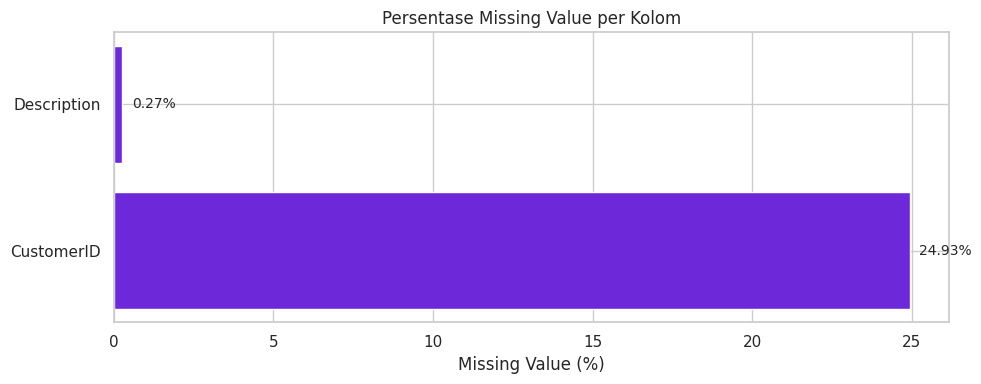

In [ ]:
# ===========================================================================================================================
# STEP 1 - CEK MISSING VALUE
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 1: CEK MISSING VALUE")
print("="*60)

missing_values  = df.isnull().sum().sort_values(ascending=False)
missing_percent = (df.isnull().sum() / len(df) * 100).sort_values(ascending=False)

missing_df = pd.DataFrame({
    "Missing Values": missing_values,
    "Percentage (%)": missing_percent.round(2)
})

display(missing_df)

fig, ax = plt.subplots(figsize=(10, 4))
data_plot = missing_df[missing_df["Missing Values"] > 0]

bars = ax.barh(
    data_plot.index,
    data_plot["Percentage (%)"],
    color="#6d28d9"
)

ax.set_xlabel("Missing Value (%)")
ax.set_title("Persentase Missing Value per Kolom")

for bar, val in zip(bars, data_plot["Percentage (%)"]):
    ax.text(bar.get_width() + 0.3,
            bar.get_y() + bar.get_height()/2,
            f"{val:.2f}%",
            va='center',
            fontsize=10)

plt.tight_layout()
plt.show()

### **🧹 Missing Value Analysis**

Hasil pengecekan missing value menunjukkan bahwa sebagian besar kolom pada dataset sudah lengkap tanpa nilai kosong, seperti *StockCode*, *InvoiceNo*, *Quantity*, *InvoiceDate*, *UnitPrice*, dan *Country* yang semuanya memiliki **0% missing value**. Namun, terdapat dua kolom yang memiliki missing value, yaitu *CustomerID* sebesar **135.080 data (24,93%)** dan *Description* sebesar **1.454 data (0,27%)**.

In [ ]:
# ===========================================================================================================================
# STEP 2 - HAPUS SEMUA BARIS YANG MEMILIKI MISSING VALUE
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 2: HAPUS SEMUA BARIS MISSING VALUE")
print("="*60)

sebelum = df.shape[0]
df_clean = df.dropna()
sesudah  = df_clean.shape[0]

print(f"  Sebelum : {sebelum:,} baris")
print(f"  Sesudah : {sesudah:,} baris")
print(f"  Terhapus: {sebelum - sesudah:,} baris ({(sebelum - sesudah)/sebelum*100:.2f}%)")
print(f"\n  Cek missing value tersisa:")
print(df_clean.isnull().sum())


STEP 2: HAPUS SEMUA BARIS MISSING VALUE
  Sebelum : 541,909 baris
  Sesudah : 406,829 baris
  Terhapus: 135,080 baris (24.93%)

  Cek missing value tersisa:
InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64


### **🧼 Penghapusan Missing Value**

Pada tahap ini dilakukan pembersihan data dengan menghapus seluruh baris yang memiliki missing value. Sebelum proses cleaning, dataset berjumlah **541.909 baris**, kemudian setelah penghapusan tersisa **406.829 baris**, sehingga sebanyak **135.080 baris (24,93%)** data berhasil dihapus.

Hasil pengecekan ulang menunjukkan bahwa seluruh kolom kini sudah bebas dari missing value, termasuk *InvoiceNo*, *StockCode*, *Description*, *Quantity*, *InvoiceDate*, *UnitPrice*, *CustomerID*, dan *Country*. Dengan demikian, dataset sudah lebih bersih dan siap digunakan untuk tahap analisis berikutnya tanpa gangguan data kosong.

In [ ]:
# ===========================================================================================================================
# STEP 3 - FILTER TRANSAKSI PEMBATALAN (InvoiceNo diawali 'C')
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 3: FILTER TRANSAKSI PEMBATALAN (InvoiceNo 'C')")
print("="*60)

mask_cancel    = df_clean["InvoiceNo"].astype(str).str.startswith("C")
jumlah_cancel  = mask_cancel.sum()
print(f"  Jumlah transaksi pembatalan: {jumlah_cancel:,}")

df_clean = df_clean[~mask_cancel].copy()
print(f"  Data setelah filter: {df_clean.shape[0]:,} baris")


STEP 3: FILTER TRANSAKSI PEMBATALAN (InvoiceNo 'C')
  Jumlah transaksi pembatalan: 8,905
  Data setelah filter: 397,924 baris


### **🔄 Filtering Transaksi Pembatalan**

Pada tahap ini dilakukan penyaringan data untuk menghapus transaksi pembatalan yang ditandai dengan *InvoiceNo* yang diawali huruf **"C"**. Hasil analisis menunjukkan terdapat **8.905 transaksi pembatalan** dalam dataset.

Setelah proses filtering, jumlah data berkurang menjadi **397.924 baris**. Penghapusan ini dilakukan karena transaksi pembatalan dapat memengaruhi analisis pola pembelian jika tidak dipisahkan, sehingga data yang tersisa hanya merepresentasikan transaksi penjualan yang valid dan dapat digunakan untuk analisis lanjutan.

In [ ]:
# ===========================================================================================================================
# STEP 4 - FILTER NILAI TIDAK VALID (Quantity & UnitPrice ≤ 0)
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 4: FILTER NILAI TIDAK VALID (Quantity & UnitPrice ≤ 0)")
print("="*60)

qty_invalid   = (df_clean["Quantity"]  <= 0).sum()
price_invalid = (df_clean["UnitPrice"] <= 0).sum()
print(f"  Baris dengan Quantity  ≤ 0 : {qty_invalid:,}")
print(f"  Baris dengan UnitPrice ≤ 0 : {price_invalid:,}")

df_clean = df_clean[(df_clean["Quantity"] > 0) & (df_clean["UnitPrice"] > 0)].copy()
print(f"  Data setelah filter: {df_clean.shape[0]:,} baris")


STEP 4: FILTER NILAI TIDAK VALID (Quantity & UnitPrice ≤ 0)
  Baris dengan Quantity  ≤ 0 : 0
  Baris dengan UnitPrice ≤ 0 : 40
  Data setelah filter: 397,884 baris


### **🚫 Filtering Nilai Tidak Valid (Quantity & UnitPrice)**

Pada tahap ini dilakukan penyaringan data untuk menghapus nilai yang tidak valid pada variabel *Quantity* dan *UnitPrice*, yaitu nilai yang kurang dari atau sama dengan 0. Hasilnya menunjukkan bahwa tidak ditemukan data dengan *Quantity ≤ 0*, sedangkan terdapat **40 baris data dengan *UnitPrice ≤ 0*** yang kemudian dihapus.

Setelah proses filtering ini, jumlah data berkurang dari sebelumnya menjadi **397.884 baris**. Tahap ini penting untuk memastikan bahwa seluruh transaksi yang dianalisis memiliki nilai yang valid, sehingga hasil analisis lebih akurat dan tidak terdistorsi oleh data yang tidak wajar.

In [ ]:
# ===========================================================================================================================
# STEP 5 - HAPUS DUPLIKAT
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 5: HAPUS DUPLIKAT")
print("="*60)

jumlah_duplikat = df_clean.duplicated().sum()
print(f"  Jumlah baris duplikat: {jumlah_duplikat:,}")

df_clean = df_clean.drop_duplicates()
print(f"  Data setelah hapus duplikat: {df_clean.shape[0]:,} baris")


STEP 5: HAPUS DUPLIKAT
  Jumlah baris duplikat: 5,192
  Data setelah hapus duplikat: 392,692 baris


### **🔁 Penghapusan Data Duplikat**

Pada tahap ini dilakukan proses pembersihan data dengan menghapus baris yang teridentifikasi sebagai duplikat. Hasil pengecekan menunjukkan terdapat **5.192 baris duplikat** dalam dataset.

Setelah proses penghapusan, jumlah data berkurang menjadi **392.692 baris**. Langkah ini penting untuk memastikan tidak adanya transaksi yang tercatat lebih dari satu kali, sehingga analisis yang dilakukan menjadi lebih akurat, konsisten, dan tidak bias akibat pengulangan data.

In [ ]:
# ===========================================================================================================================
# STEP 6 - KONVERSI TIPE DATA
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 6: KONVERSI TIPE DATA")
print("="*60)

df_clean["InvoiceDate"] = pd.to_datetime(df_clean["InvoiceDate"])
df_clean["CustomerID"]  = df_clean["CustomerID"].astype(int)
df_clean["InvoiceNo"]   = df_clean["InvoiceNo"].astype(str)

print("  Tipe data setelah konversi:")
print(df_clean.dtypes)


STEP 6: KONVERSI TIPE DATA
  Tipe data setelah konversi:
InvoiceNo              object
StockCode              object
Description            object
Quantity                int64
InvoiceDate    datetime64[ns]
UnitPrice             float64
CustomerID              int64
Country                object
dtype: object


### **🔄 Konversi Tipe Data**

Pada tahap ini dilakukan proses konversi tipe data agar sesuai dengan kebutuhan analisis. Variabel *InvoiceDate* diubah menjadi format **datetime** untuk memudahkan analisis berbasis waktu, sedangkan *CustomerID* dikonversi menjadi tipe **integer** agar lebih konsisten sebagai identitas numerik. Selain itu, *InvoiceNo* dipastikan berada dalam format **string (object)**.

Setelah proses konversi, struktur data menjadi lebih terstandarisasi dengan tipe data yang sesuai: *InvoiceDate* bertipe `datetime64[ns]`, *CustomerID* bertipe `int64`, sementara variabel lainnya tetap pada tipe data yang sesuai. Langkah ini penting untuk memastikan proses analisis, agregasi, dan visualisasi dapat dilakukan dengan lebih akurat dan efisien.

In [ ]:
# ===========================================================================================================================
# STEP 7 - FEATURE ENGINEERING: TotalPrice
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 7: FEATURE ENGINEERING - TotalPrice")
print("="*60)

df_clean["TotalPrice"] = df_clean["Quantity"] * df_clean["UnitPrice"]

print("  Contoh hasil TotalPrice:")
display(df_clean[["CustomerID", "Quantity", "UnitPrice", "TotalPrice"]].head(10))


STEP 7: FEATURE ENGINEERING - TotalPrice
  Contoh hasil TotalPrice:


,CustomerID,Quantity,UnitPrice,TotalPrice
0,17850,6,2.55,15.30
1,17850,6,3.39,20.34
2,17850,8,2.75,22.00
3,17850,6,3.39,20.34
4,17850,6,3.39,20.34
5,17850,2,7.65,15.30
6,17850,6,4.25,25.50
7,17850,6,1.85,11.10
8,17850,6,1.85,11.10
9,13047,32,1.69,54.08


### **💰 Feature Engineering: TotalPrice**

Pada tahap ini dilakukan proses *feature engineering* dengan membuat variabel baru yaitu *TotalPrice*, yang diperoleh dari hasil perkalian antara *Quantity* dan *UnitPrice*. Variabel ini merepresentasikan total nilai transaksi setiap pembelian.

Hasil perhitungan menunjukkan bahwa setiap baris transaksi kini memiliki nilai total yang sesuai, misalnya kombinasi jumlah pembelian dan harga satuan menghasilkan *TotalPrice* seperti **15.30**, **20.34**, hingga **54.08** pada contoh data. Penambahan fitur ini penting karena memberikan gambaran langsung mengenai nilai transaksi yang lebih mudah digunakan untuk analisis bisnis seperti pendapatan, segmentasi pelanggan, dan pola pembelian.


STEP 8: DETEKSI OUTLIER (IQR Method)
  [Quantity]  Q1=2.00  Q3=12.00  IQR=10.00  Batas=[-13.00, 27.00]  Outlier=25,616 (6.52%)
  [UnitPrice]  Q1=1.25  Q3=3.75  IQR=2.50  Batas=[-2.50, 7.50]  Outlier=34,112 (8.69%)
  [TotalPrice]  Q1=4.95  Q3=19.80  IQR=14.85  Batas=[-17.32, 42.07]  Outlier=31,231 (7.95%)


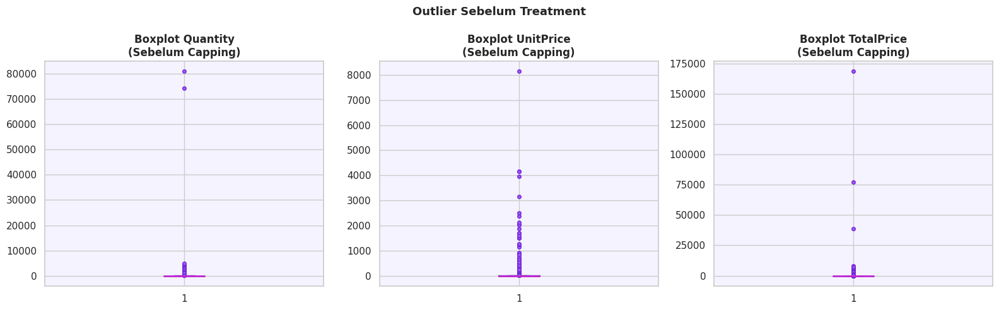

In [ ]:
# ===========================================================================================================================
# STEP 8 - DETEKSI OUTLIER (IQR Method)
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 8: DETEKSI OUTLIER (IQR Method)")
print("="*60)

def info_outlier_iqr(series, nama):
    Q1  = series.quantile(0.25)
    Q3  = series.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    n_out = ((series < lower) | (series > upper)).sum()
    print(f"  [{nama}]  Q1={Q1:.2f}  Q3={Q3:.2f}  IQR={IQR:.2f}  "
          f"Batas=[{lower:.2f}, {upper:.2f}]  Outlier={n_out:,} ({n_out/len(series)*100:.2f}%)")
    return lower, upper

bounds = {}
for col in ["Quantity", "UnitPrice", "TotalPrice"]:
    lo, hi = info_outlier_iqr(df_clean[col], col)
    bounds[col] = (lo, hi)

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

purple_box = "#7c3aed"
purple_edge = "#4c1d95"
median_color = "#c026d3"
bg_color = "#f5f3ff"

for ax, col in zip(axes, ["Quantity", "UnitPrice", "TotalPrice"]):
    ax.set_facecolor(bg_color)

    ax.boxplot(
        df_clean[col],
        patch_artist=True,
        boxprops=dict(facecolor=purple_box, color=purple_edge),
        whiskerprops=dict(color=purple_edge),
        capprops=dict(color=purple_edge),
        medianprops=dict(color=median_color, linewidth=2),
        flierprops=dict(marker='o', markerfacecolor="#a855f7",
                        markeredgecolor="#6d28d9", markersize=4)
    )

    ax.set_title(f"Boxplot {col}\n(Sebelum Capping)", fontweight='bold')

plt.suptitle("Outlier Sebelum Treatment", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

### **📦 Deteksi Outlier (IQR Method)**

Pada tahap ini dilakukan deteksi outlier menggunakan metode *Interquartile Range (IQR)* pada variabel *Quantity*, *UnitPrice*, dan *TotalPrice*. Metode ini menghitung batas bawah dan batas atas berdasarkan kuartil pertama (Q1) dan kuartil ketiga (Q3) untuk mengidentifikasi nilai yang berada di luar rentang normal.

Hasil analisis menunjukkan bahwa terdapat **25.616 outlier (6,52%)** pada *Quantity*, **34.112 outlier (8,69%)** pada *UnitPrice*, dan **31.231 outlier (7,95%)** pada *TotalPrice*. Keberadaan outlier ini menunjukkan adanya transaksi dengan nilai ekstrem yang dapat memengaruhi hasil analisis jika tidak ditangani.

Visualisasi boxplot juga memperlihatkan sebaran data sebelum dilakukan *treatment*, di mana banyak titik berada di luar whisker. Oleh karena itu, tahap selanjutnya seperti *capping* atau transformasi data diperlukan untuk mengurangi dampak outlier agar analisis menjadi lebih stabil dan representatif.


STEP 9: TREATMENT OUTLIER - CAPPING (Winsorization)
  [Quantity] dicapping ke [-13.00, 27.00]
  [UnitPrice] dicapping ke [-2.50, 7.50]
  TotalPrice dihitung ulang setelah capping.


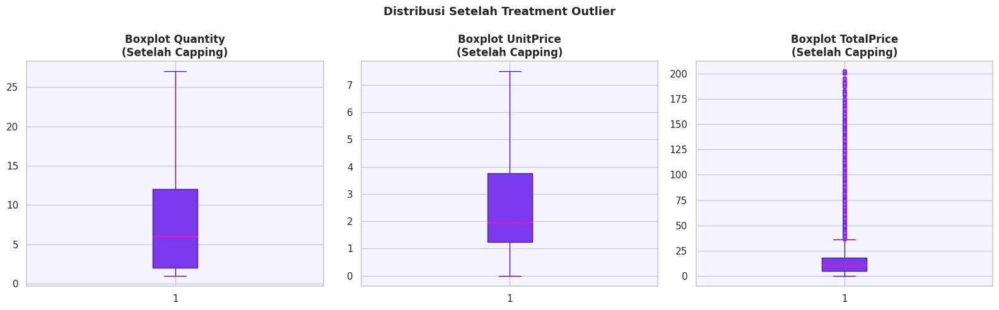

In [ ]:
# ===========================================================================================================================
# STEP 9 - TREATMENT OUTLIER: CAPPING (Winsorization)
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 9: TREATMENT OUTLIER - CAPPING (Winsorization)")
print("="*60)

for col in ["Quantity", "UnitPrice"]:
    lo, hi = bounds[col]
    df_clean[col] = df_clean[col].clip(lower=lo, upper=hi)
    print(f"  [{col}] dicapping ke [{lo:.2f}, {hi:.2f}]")

df_clean["TotalPrice"] = df_clean["Quantity"] * df_clean["UnitPrice"]
print("  TotalPrice dihitung ulang setelah capping.")

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

purple_box = "#7c3aed"
purple_edge = "#4c1d95"
median_color = "#c026d3"
bg_color = "#f5f3ff"

for ax, col in zip(axes, ["Quantity", "UnitPrice", "TotalPrice"]):
    ax.set_facecolor(bg_color)

    ax.boxplot(
        df_clean[col],
        patch_artist=True,
        boxprops=dict(facecolor=purple_box, color=purple_edge),
        whiskerprops=dict(color=purple_edge),
        capprops=dict(color=purple_edge),
        medianprops=dict(color=median_color, linewidth=2),
        flierprops=dict(marker='o', markerfacecolor="#a855f7",
                        markeredgecolor="#6d28d9", markersize=4)
    )

    ax.set_title(f"Boxplot {col}\n(Setelah Capping)", fontweight='bold')

plt.suptitle("Distribusi Setelah Treatment Outlier", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

### **📊 Treatment Outlier: Capping (Winsorization)**

Pada tahap ini dilakukan penanganan outlier menggunakan metode *capping (winsorization)*, yaitu membatasi nilai data agar berada dalam rentang batas bawah dan atas yang telah ditentukan dari hasil metode IQR. Variabel *Quantity* dan *UnitPrice* dicapping sesuai batas masing-masing, yaitu *Quantity* pada rentang **[-13.00, 27.00]** dan *UnitPrice* pada rentang **[-2.50, 7.50]**.

Setelah proses capping, variabel *TotalPrice* dihitung ulang agar tetap konsisten dengan nilai yang telah disesuaikan. Langkah ini penting untuk mengurangi pengaruh nilai ekstrem yang dapat mengganggu distribusi data dan hasil analisis.

Visualisasi boxplot setelah treatment menunjukkan bahwa sebaran data menjadi lebih stabil dan tidak terlalu dipengaruhi oleh nilai ekstrem, sehingga dataset lebih siap untuk analisis lanjutan seperti clustering atau modeling.

In [ ]:
# ===========================================================================================================================
# STEP TAMBAHAN - IQR-BASED OUTLIER TREATMENT pada Quantity & UnitPrice
# (sesuai proposal: "IQR-based outlier removal")
# ===========================================================================================================================

print("\n" + "="*60)
print("OUTLIER TREATMENT: IQR-BASED (Quantity & UnitPrice)")
print("="*60)

def remove_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    before = len(df)
    df_out = df[(df[col] >= lower) & (df[col] <= upper)].copy()
    print(f"  {col}: Q1={Q1:.2f}, Q3={Q3:.2f}, IQR={IQR:.2f}")
    print(f"    Batas bawah: {lower:.2f}, Batas atas: {upper:.2f}")
    print(f"    Baris dihapus: {before - len(df_out):,} ({(before-len(df_out))/before*100:.2f}%)")
    return df_out

df_clean = remove_outliers_iqr(df_clean, "Quantity")
df_clean = remove_outliers_iqr(df_clean, "UnitPrice")
print(f"\n  Data setelah outlier treatment: {df_clean.shape[0]:,} baris")


OUTLIER TREATMENT: IQR-BASED (Quantity & UnitPrice)
  Quantity: Q1=2.00, Q3=12.00, IQR=10.00
    Batas bawah: -13.00, Batas atas: 27.00
    Baris dihapus: 0 (0.00%)
  UnitPrice: Q1=1.25, Q3=3.75, IQR=2.50
    Batas bawah: -2.50, Batas atas: 7.50
    Baris dihapus: 0 (0.00%)

  Data setelah outlier treatment: 392,692 baris


### **🧹 Outlier Treatment: IQR-Based Filtering**

Pada tahap ini dilakukan penanganan outlier menggunakan metode *IQR-based filtering* pada variabel *Quantity* dan *UnitPrice*. Metode ini menetapkan batas bawah dan atas berdasarkan nilai Q1, Q3, dan IQR, kemudian menghapus data yang berada di luar rentang tersebut.

Hasil proses menunjukkan bahwa tidak ada baris yang terhapus pada kedua variabel, yaitu *Quantity* maupun *UnitPrice*, karena seluruh data sudah berada dalam rentang batas yang ditentukan ([-13.00, 27.00] untuk *Quantity* dan [-2.50, 7.50] untuk *UnitPrice*). Dengan demikian, jumlah data tetap **392.692 baris** setelah proses ini.

Tahap ini memastikan bahwa dataset sudah bersih dari nilai ekstrem yang tidak valid sesuai metode IQR, sehingga lebih siap digunakan untuk analisis lanjutan seperti segmentasi pelanggan atau pemodelan.

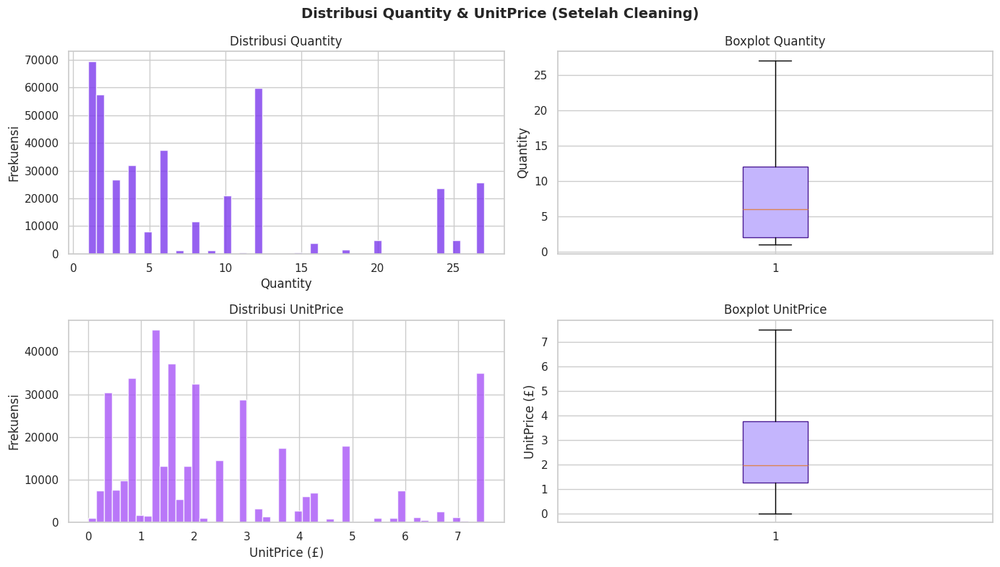

In [ ]:
# ===========================================================================================================================
# VISUALISASI: DISTRIBUSI Quantity & UnitPrice (Histogram + Boxplot)
# ===========================================================================================================================

fig, axes = plt.subplots(2, 2, figsize=(14, 8))
fig.suptitle("Distribusi Quantity & UnitPrice (Setelah Cleaning)", fontsize=14, fontweight='bold')

# Histogram Quantity
axes[0, 0].hist(df_clean["Quantity"], bins=50, color="#7c3aed", edgecolor="white", alpha=0.8)
axes[0, 0].set_title("Distribusi Quantity")
axes[0, 0].set_xlabel("Quantity")
axes[0, 0].set_ylabel("Frekuensi")

# Boxplot Quantity
axes[0, 1].boxplot(df_clean["Quantity"], vert=True, patch_artist=True,
                   boxprops=dict(facecolor="#c4b5fd", color="#4c1d95"))
axes[0, 1].set_title("Boxplot Quantity")
axes[0, 1].set_ylabel("Quantity")

# Histogram UnitPrice
axes[1, 0].hist(df_clean["UnitPrice"], bins=50, color="#a855f7", edgecolor="white", alpha=0.8)
axes[1, 0].set_title("Distribusi UnitPrice")
axes[1, 0].set_xlabel("UnitPrice (£)")
axes[1, 0].set_ylabel("Frekuensi")

# Boxplot UnitPrice
axes[1, 1].boxplot(df_clean["UnitPrice"], vert=True, patch_artist=True,
                   boxprops=dict(facecolor="#c4b5fd", color="#4c1d95"))
axes[1, 1].set_title("Boxplot UnitPrice")
axes[1, 1].set_ylabel("UnitPrice (£)")

plt.tight_layout()
plt.show()

### **📊 Distribusi Variabel Setelah Data Cleaning**

Berdasarkan visualisasi distribusi *Quantity* dan *UnitPrice* setelah proses data cleaning, terlihat bahwa data sudah lebih stabil dan tidak lagi dipengaruhi oleh nilai ekstrem yang besar.

Pada variabel *Quantity*, distribusi menunjukkan bahwa sebagian besar transaksi berada pada rentang kecil hingga menengah (sekitar 1-12 unit), dengan beberapa nilai mendekati batas atas setelah proses pembersihan. Boxplot juga menunjukkan bahwa sebaran data sudah lebih terkontrol, dengan median berada di kisaran rendah dan tidak terdapat outlier ekstrem yang mengganggu distribusi.

Sementara itu, pada variabel *UnitPrice*, distribusi harga menunjukkan pola yang cukup terkonsentrasi di rentang rendah (sekitar £1-£3), dengan sedikit nilai yang mendekati batas atas sekitar £7. Boxplot memperkuat bahwa data sudah lebih homogen setelah proses cleaning, sehingga lebih representatif untuk analisis lanjutan.

Secara keseluruhan, hasil visualisasi ini menunjukkan bahwa proses data cleaning dan penanganan outlier berhasil membuat distribusi data lebih bersih, stabil, dan siap digunakan untuk analisis seperti segmentasi pelanggan atau forecasting.


CORRELATION HEATMAP - Variabel Numerik


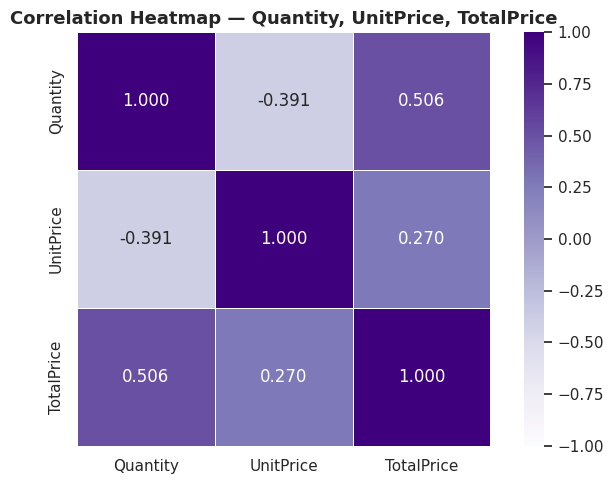

In [ ]:
# ===========================================================================================================================
# VISUALISASI: CORRELATION HEATMAP variabel numerik
# ===========================================================================================================================

print("\n" + "="*60)
print("CORRELATION HEATMAP - Variabel Numerik")
print("="*60)

numeric_cols = df_clean[["Quantity", "UnitPrice", "TotalPrice"]]
corr_matrix = numeric_cols.corr()

plt.figure(figsize=(7, 5))
sns.heatmap(corr_matrix, annot=True, fmt=".3f", cmap="Purples",
            linewidths=0.5, linecolor="white", annot_kws={"size": 12},
            square=True, vmin=-1, vmax=1)
plt.title("Correlation Heatmap — Quantity, UnitPrice, TotalPrice",
          fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

### **📈 Analisis Korelasi Antar Variabel**

Berdasarkan *correlation heatmap* antara *Quantity*, *UnitPrice*, dan *TotalPrice*, dapat dilihat hubungan antar variabel yang cukup menarik.

Terdapat korelasi **positif sedang** antara *Quantity* dan *TotalPrice* sebesar **0.506**, yang menunjukkan bahwa semakin banyak jumlah barang yang dibeli, maka total harga transaksi cenderung meningkat. Hal ini sesuai dengan logika bisnis karena *TotalPrice* sangat dipengaruhi oleh jumlah pembelian.

Sebaliknya, terdapat korelasi **negatif sedang** antara *Quantity* dan *UnitPrice* sebesar **-0.391**, yang mengindikasikan bahwa pembelian dalam jumlah lebih besar cenderung terjadi pada harga satuan yang lebih rendah (kemungkinan diskon atau pembelian grosir).

Sementara itu, hubungan antara *UnitPrice* dan *TotalPrice* menunjukkan korelasi **positif lemah** sebesar **0.270**, yang berarti harga satuan memiliki pengaruh, tetapi tidak sekuat pengaruh jumlah barang terhadap total transaksi.

Secara keseluruhan, hasil ini menunjukkan bahwa *Quantity* merupakan faktor yang paling dominan dalam menentukan *TotalPrice* dibandingkan *UnitPrice*.

In [ ]:
# ===========================================================================================================================
# STEP 10 - EKSTRAKSI FITUR TEMPORAL
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 10: EKSTRAKSI FITUR TEMPORAL")
print("="*60)

df_clean["Year"]       = df_clean["InvoiceDate"].dt.year
df_clean["Month"]      = df_clean["InvoiceDate"].dt.month
df_clean["Day"]        = df_clean["InvoiceDate"].dt.day
df_clean["DayOfWeek"]  = df_clean["InvoiceDate"].dt.dayofweek
df_clean["DayName"]    = df_clean["InvoiceDate"].dt.day_name()
df_clean["Hour"]       = df_clean["InvoiceDate"].dt.hour
df_clean["WeekOfYear"] = df_clean["InvoiceDate"].dt.isocalendar().week.astype(int)

print("  Fitur temporal berhasil diekstraksi:")
display(df_clean[["InvoiceDate","Year","Month","Day","DayOfWeek","DayName","Hour","WeekOfYear"]].head(5))


STEP 10: EKSTRAKSI FITUR TEMPORAL
  Fitur temporal berhasil diekstraksi:


,InvoiceDate,Year,Month,Day,DayOfWeek,DayName,Hour,WeekOfYear
0,2010-12-01 08:26:00,2010,12,1,2,Wednesday,8,48
1,2010-12-01 08:26:00,2010,12,1,2,Wednesday,8,48
2,2010-12-01 08:26:00,2010,12,1,2,Wednesday,8,48
3,2010-12-01 08:26:00,2010,12,1,2,Wednesday,8,48
4,2010-12-01 08:26:00,2010,12,1,2,Wednesday,8,48


## **📊 Ekstraksi Fitur Temporal**

Pada tahap ini dilakukan ekstraksi fitur temporal dari kolom **InvoiceDate** untuk mendapatkan informasi waktu yang lebih detail dan terstruktur. Fitur yang dihasilkan meliputi **Year, Month, Day, DayOfWeek, DayName, Hour,** dan **WeekOfYear**.

Transformasi ini bertujuan untuk mempermudah analisis pola transaksi berdasarkan waktu, seperti tren pembelian per bulan, distribusi transaksi per hari dalam seminggu, serta jam-jam dengan aktivitas transaksi tertinggi. Dengan adanya fitur temporal ini, dataset menjadi lebih informatif untuk analisis perilaku pelanggan dan mendukung proses pemodelan prediktif berbasis waktu.

In [ ]:
# ===========================================================================================================================
# STEP 11 - RINGKASAN & VALIDASI DATA BERSIH
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 11: RINGKASAN & VALIDASI DATA BERSIH FINAL")
print("="*60)

print(f"  Jumlah baris  : {df_clean.shape[0]:,}")
print(f"  Jumlah kolom  : {df_clean.shape[1]}")
print(f"  Missing value : {df_clean.isnull().sum().sum()}")
print(f"  Duplikat      : {df_clean.duplicated().sum()}")
print(f"\n  Kolom: {list(df_clean.columns)}")

print("\n  Statistik deskriptif:")
display(df_clean[["Quantity","UnitPrice","TotalPrice"]].describe().T.round(2))

print("\n  Preview data bersih:")
display(df_clean.head())

print("\n✅ Data Cleaning selesai. df_clean siap digunakan.")


STEP 11: RINGKASAN & VALIDASI DATA BERSIH FINAL
  Jumlah baris  : 392,692
  Jumlah kolom  : 16
  Missing value : 0
  Duplikat      : 30

  Kolom: ['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate', 'UnitPrice', 'CustomerID', 'Country', 'TotalPrice', 'Year', 'Month', 'Day', 'DayOfWeek', 'DayName', 'Hour', 'WeekOfYear']

  Statistik deskriptif:


,count,mean,std,min,25%,50%,75%,max
Quantity,392692.0,8.39,8.11,1.0,2.00,6.00,12.00,27.0
UnitPrice,392692.0,2.60,2.11,0.0,1.25,1.95,3.75,7.5
TotalPrice,392692.0,15.17,17.65,0.0,4.95,10.50,17.70,202.5



  Preview data bersih:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice,Year,Month,Day,DayOfWeek,DayName,Hour,WeekOfYear
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,2010,12,1,2,Wednesday,8,48
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010,12,1,2,Wednesday,8,48
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00,2010,12,1,2,Wednesday,8,48
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010,12,1,2,Wednesday,8,48
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010,12,1,2,Wednesday,8,48



✅ Data Cleaning selesai. df_clean siap digunakan.


## **🧹 Ringkasan & Validasi Data Bersih Final**

Pada tahap ini dilakukan validasi akhir terhadap dataset yang telah melalui proses data cleaning dan feature engineering. Hasil menunjukkan bahwa dataset memiliki **392.692 baris** dan **16 kolom**, tanpa missing value, namun masih terdapat **30 data duplikat**.

Secara keseluruhan, data sudah cukup bersih dan siap digunakan untuk analisis lebih lanjut maupun pemodelan. Kolom yang tersedia mencakup informasi transaksi seperti **InvoiceNo, StockCode, Quantity, UnitPrice, TotalPrice**, serta fitur temporal seperti **Year, Month, Day, DayOfWeek, DayName, Hour, dan WeekOfYear**.

Berdasarkan statistik deskriptif, nilai **Quantity** berada pada rentang 1–27 dengan rata-rata 8.39, sedangkan **UnitPrice** berkisar antara 0 hingga 7.5. Sementara itu, **TotalPrice** memiliki rata-rata 15.17 dengan nilai maksimum mencapai 202.5.

Dengan kondisi ini, dataset `df_clean` sudah siap digunakan untuk proses analisis lanjutan seperti eksplorasi data (EDA), segmentasi pelanggan, maupun model prediktif.

In [ ]:
# ===========================================================================================================================
# ██████████████████████████████████████████████████████████████████████████████
# BAGIAN 2 - DATA TRANSFORMATION & AGGREGATION
# ██████████████████████████████████████████████████████████████████████████████
# ===========================================================================================================================


TRANSFORMASI A: CUSTOMER-LEVEL AGGREGATION (RFM)
  Reference Date: 2011-12-10

  Jumlah pelanggan unik: 4,338

  Contoh hasil RFM:


,CustomerID,Recency,Frequency,Monetary
0,12346,326,1,28.08
1,12347,2,7,3877.44
2,12348,75,4,557.57
3,12349,19,1,1336.65
4,12350,310,1,301.90
5,12352,36,8,1400.94
6,12353,204,1,74.30
7,12354,232,1,992.35
8,12355,214,1,316.50
9,12356,23,3,2083.49



  Statistik deskriptif RFM:


,count,mean,std,min,25%,50%,75%,max
Recency,4338.0,92.54,100.01,1.00,18.00,51.00,142.00,374.00
Frequency,4338.0,4.27,7.70,1.00,1.00,2.00,5.00,209.00
Monetary,4338.0,1372.98,3500.44,3.75,259.35,575.38,1403.59,113620.21


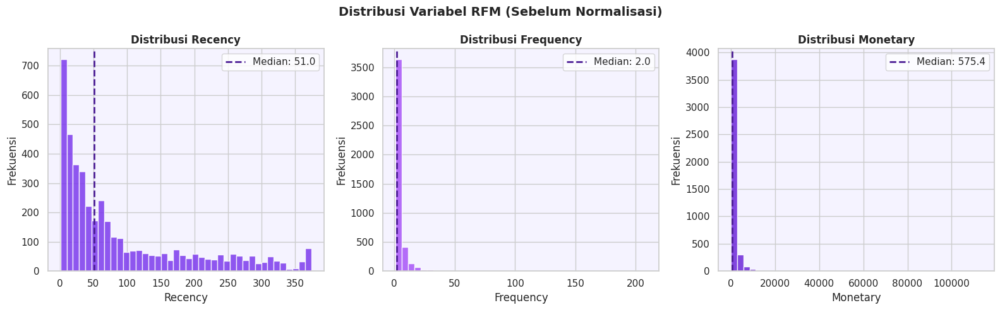

In [ ]:
# ===========================================================================================================================
# A. TRANSFORMASI UNTUK ANALISIS CLUSTERING (RFM)
# ===========================================================================================================================

print("\n" + "="*60)
print("TRANSFORMASI A: CUSTOMER-LEVEL AGGREGATION (RFM)")
print("="*60)

# Tanggal referensi = 1 hari setelah tanggal transaksi terakhir
reference_date = df_clean["InvoiceDate"].max() + pd.Timedelta(days=1)
print(f"  Reference Date: {reference_date.date()}")

# Hitung RFM per CustomerID
rfm = df_clean.groupby("CustomerID").agg(
    LastPurchaseDate = ("InvoiceDate",  "max"),
    Frequency        = ("InvoiceNo",    "nunique"),
    Monetary         = ("TotalPrice",   "sum")
).reset_index()

# Recency = selisih hari dari transaksi terakhir ke reference date
rfm["Recency"] = (reference_date - rfm["LastPurchaseDate"]).dt.days

# Pilih kolom yang relevan
rfm = rfm[["CustomerID", "Recency", "Frequency", "Monetary"]]

print(f"\n  Jumlah pelanggan unik: {rfm.shape[0]:,}")
print("\n  Contoh hasil RFM:")
display(rfm.head(10))

print("\n  Statistik deskriptif RFM:")
display(rfm[["Recency","Frequency","Monetary"]].describe().T.round(2))

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

rfm_cols = ["Recency", "Frequency", "Monetary"]

purple_palette = ["#7c3aed", "#a855f7", "#6d28d9"]
bg_color = "#f5f3ff"
median_color = "#4c1d95"

for ax, col, color in zip(axes, rfm_cols, purple_palette):
    ax.set_facecolor(bg_color)

    ax.hist(
        rfm[col],
        bins=40,
        color=color,
        edgecolor='white',
        alpha=0.85
    )

    median_val = rfm[col].median()

    ax.axvline(
        median_val,
        color=median_color,
        linestyle='--',
        linewidth=2,
        label=f"Median: {median_val:.1f}"
    )

    ax.set_title(f"Distribusi {col}", fontsize=12, fontweight='bold')
    ax.set_xlabel(col)
    ax.set_ylabel("Frekuensi")
    ax.legend()

plt.suptitle("Distribusi Variabel RFM (Sebelum Normalisasi)", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## **📊 Distribusi Variabel RFM (Sebelum Normalisasi)**

Berdasarkan visualisasi distribusi RFM, terlihat bahwa ketiga variabel (**Recency, Frequency, dan Monetary**) memiliki pola yang sangat **right-skewed (miring ke kanan)**. Hal ini menunjukkan bahwa sebagian besar pelanggan memiliki nilai transaksi yang relatif rendah, sementara hanya sedikit pelanggan yang memiliki nilai sangat tinggi (outlier).

Pada variabel **Recency**, median berada di sekitar 51 hari, yang berarti setengah pelanggan terakhir melakukan pembelian dalam rentang waktu kurang dari 2 bulan. Sementara itu, **Frequency** memiliki median 2, menunjukkan bahwa mayoritas pelanggan hanya melakukan transaksi dalam jumlah yang sedikit. Untuk **Monetary**, median sebesar 575.4 mengindikasikan bahwa sebagian besar pelanggan memiliki total pengeluaran yang relatif kecil dibandingkan beberapa pelanggan dengan nilai pembelian sangat besar.

Secara keseluruhan, distribusi ini menunjukkan adanya ketimpangan perilaku pelanggan, di mana hanya sebagian kecil yang sangat aktif dan bernilai tinggi. Kondisi ini sangat umum dalam analisis RFM dan menjadi alasan penting dilakukannya normalisasi sebelum proses clustering agar model tidak bias terhadap nilai ekstrem.


NORMALISASI RFM: LOG TRANSFORM + STANDARD SCALER
  Contoh data RFM setelah normalisasi:


,Recency_scaled,Frequency_scaled,Monetary_scaled,CustomerID
0,1.461993,-0.955214,-2.413297,12346
1,-2.038734,1.074425,1.495665,12347
2,0.373104,0.386304,-0.052385,12348
3,-0.623086,-0.955214,0.645257,12349
4,1.424558,-0.955214,-0.541273,12350
5,-0.164029,1.246868,0.682758,12352
6,1.113550,-0.955214,-1.653233,12353
7,1.209086,-0.955214,0.407525,12354
8,1.149091,-0.955214,-0.503666,12355
9,-0.487036,0.059605,0.999642,12356


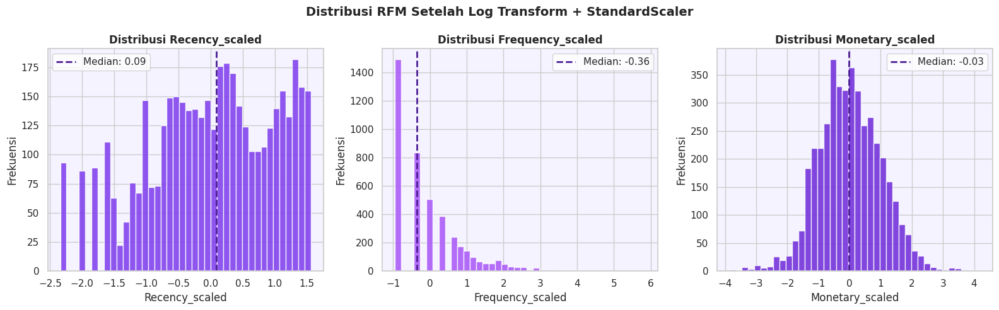


✅ RFM selesai. rfm (raw) dan rfm_scaled (normalized) siap untuk K-Means Clustering.


In [ ]:
# ===========================================================================================================================
# LOG TRANSFORM + STANDARD SCALER untuk RFM
# ===========================================================================================================================

print("\n" + "="*60)
print("NORMALISASI RFM: LOG TRANSFORM + STANDARD SCALER")
print("="*60)

from sklearn.preprocessing import StandardScaler

# ===========================================================================================================================
# LOG TRANSFORM (reduce skewness)
# ===========================================================================================================================

rfm_log = rfm.copy()

rfm_log["Recency"]   = np.log1p(rfm["Recency"])
rfm_log["Frequency"] = np.log1p(rfm["Frequency"])
rfm_log["Monetary"]  = np.log1p(rfm["Monetary"])

# ===========================================================================================================================
# STANDARD SCALING
# ===========================================================================================================================

scaler = StandardScaler()

rfm_scaled_array = scaler.fit_transform(
    rfm_log[["Recency", "Frequency", "Monetary"]]
)

rfm_scaled = pd.DataFrame(
    rfm_scaled_array,
    columns=["Recency_scaled", "Frequency_scaled", "Monetary_scaled"],
    index=rfm.index
)

rfm_scaled["CustomerID"] = rfm["CustomerID"].values

print("  Contoh data RFM setelah normalisasi:")
display(rfm_scaled.head(10))

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

scaled_cols = ["Recency_scaled", "Frequency_scaled", "Monetary_scaled"]

purple_palette = ["#7c3aed", "#a855f7", "#6d28d9"]
bg_color = "#f5f3ff"
median_color = "#4c1d95"

for ax, col, color in zip(axes, scaled_cols, purple_palette):
    ax.set_facecolor(bg_color)

    ax.hist(
        rfm_scaled[col],
        bins=40,
        color=color,
        edgecolor='white',
        alpha=0.85
    )

    ax.axvline(
        rfm_scaled[col].median(),
        color=median_color,
        linestyle='--',
        linewidth=2,
        label=f"Median: {rfm_scaled[col].median():.2f}"
    )

    ax.set_title(f"Distribusi {col}", fontsize=12, fontweight='bold')
    ax.set_xlabel(col)
    ax.set_ylabel("Frekuensi")
    ax.legend()

plt.suptitle("Distribusi RFM Setelah Log Transform + StandardScaler", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n✅ RFM selesai. rfm (raw) dan rfm_scaled (normalized) siap untuk K-Means Clustering.")

## **📊 Distribusi RFM Setelah Log Transform + StandardScaler**

Setelah dilakukan **log transformation** dan **StandardScaler**, distribusi variabel RFM menjadi lebih stabil dan mendekati bentuk distribusi normal dibandingkan sebelum transformasi. Hal ini terlihat dari penyebaran data yang lebih seimbang pada ketiga variabel (**Recency_scaled, Frequency_scaled, dan Monetary_scaled**).

Pada **Recency_scaled**, distribusi menjadi lebih terpusat di sekitar nilai nol dengan median sekitar 0.09, menunjukkan bahwa jarak waktu pembelian pelanggan kini lebih terstandarisasi. Variabel **Frequency_scaled** masih menunjukkan sedikit skew ke kanan dengan median -0.36, yang mengindikasikan bahwa sebagian besar pelanggan tetap memiliki frekuensi pembelian rendah meskipun sudah dinormalisasi. Sementara itu, **Monetary_scaled** memiliki distribusi paling mendekati normal dengan median -0.03, menunjukkan bahwa transformasi berhasil mengurangi pengaruh nilai ekstrem pada total pengeluaran pelanggan.

Secara keseluruhan, transformasi ini berhasil mengurangi skewness dan menyamakan skala antar variabel, sehingga data lebih ideal untuk digunakan dalam algoritma clustering seperti **K-Means**, yang sensitif terhadap perbedaan skala dan distribusi data.

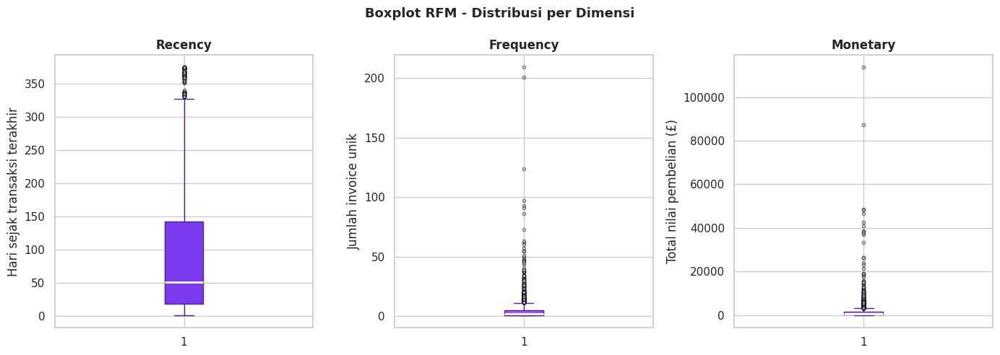

In [ ]:
# ===========================================================================================================================
# VISUALISASI: BOXPLOT RFM (Raw) - distribusi nilai per dimensi
# ===========================================================================================================================

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
fig.suptitle("Boxplot RFM - Distribusi per Dimensi", fontsize=13, fontweight='bold')

rfm_cols_plot = [("Recency", "Hari sejak transaksi terakhir"),
                 ("Frequency", "Jumlah invoice unik"),
                 ("Monetary", "Total nilai pembelian (£)")]
colors = ["#7c3aed", "#a855f7", "#c4b5fd"]

for ax, (col, label), color in zip(axes, rfm_cols_plot, colors):
    ax.boxplot(rfm[col], patch_artist=True,
               boxprops=dict(facecolor=color, color="#4c1d95"),
               medianprops=dict(color="white", linewidth=2),
               whiskerprops=dict(color="#4c1d95"),
               capprops=dict(color="#4c1d95"),
               flierprops=dict(marker='o', markerfacecolor="#e9d5ff", markersize=3, alpha=0.5))
    ax.set_title(col, fontsize=12, fontweight='bold')
    ax.set_ylabel(label)

plt.tight_layout()
plt.show()

### **📈 Insight Boxplot RFM**

Berdasarkan visualisasi boxplot RFM, terlihat bahwa ketiga dimensi memiliki distribusi yang cenderung tidak merata dan mengandung banyak *outlier*. Pada dimensi **Recency**, sebagian besar pelanggan masih melakukan transaksi dalam rentang waktu yang relatif dekat, namun terdapat beberapa pelanggan dengan nilai recency sangat tinggi yang menunjukkan sudah lama tidak melakukan transaksi. Hal ini mengindikasikan adanya perbedaan tingkat keaktifan pelanggan.

Pada dimensi **Frequency**, mayoritas pelanggan memiliki jumlah transaksi yang rendah, sedangkan hanya sedikit pelanggan yang melakukan transaksi dalam jumlah sangat tinggi. Banyaknya *outlier* menunjukkan adanya kelompok pelanggan loyal yang bertransaksi jauh lebih sering dibanding pelanggan lainnya.

Sementara itu, pada dimensi **Monetary**, distribusi nilai pembelian juga sangat condong ke kanan (*right-skewed*). Sebagian besar pelanggan memiliki total pembelian yang kecil, tetapi terdapat beberapa pelanggan dengan nilai pembelian sangat besar hingga menjadi *outlier*. Kondisi ini menunjukkan bahwa kontribusi pendapatan terbesar kemungkinan berasal dari sebagian kecil pelanggan dengan pengeluaran tinggi.


TRANSFORMASI B: TIME-LEVEL AGGREGATION (TIME SERIES)

  [Harian] Jumlah hari: 305


,Date,DailySales
0,2010-12-01,30376.73
1,2010-12-02,32089.35
2,2010-12-03,17338.77
3,2010-12-05,26434.98
4,2010-12-06,23649.18
5,2010-12-07,21830.18
6,2010-12-08,30820.11
7,2010-12-09,27240.41
8,2010-12-10,23010.30
9,2010-12-12,14309.43


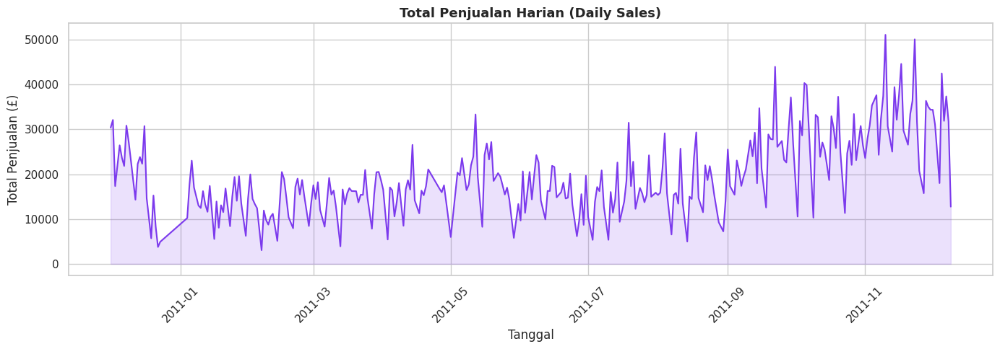


  [Bulanan] Jumlah bulan: 13


,YearMonth,MonthlySales
0,2010-12-01,398756.650
1,2011-01-01,331496.840
2,2011-02-01,313458.130
3,2011-03-01,409922.000
4,2011-04-01,330243.461
5,2011-05-01,469513.720
6,2011-06-01,414238.520
7,2011-07-01,408760.651
8,2011-08-01,428500.150
9,2011-09-01,648924.262


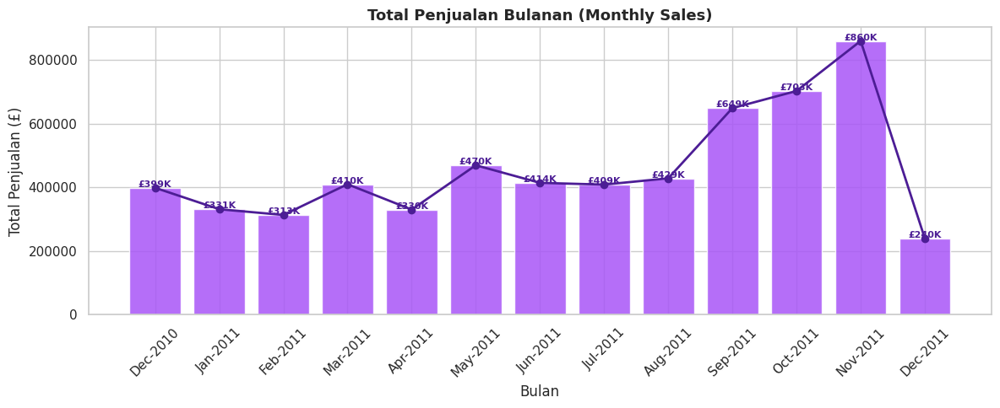


  [Mingguan] Jumlah minggu: 53


,Week,WeeklySales
0,2010-11-29,106239.83
1,2010-12-06,140859.61
2,2010-12-13,119433.95
3,2010-12-20,32223.26
4,2011-01-03,80982.19
5,2011-01-10,76445.77
6,2011-01-17,71782.78
7,2011-01-24,87709.61
8,2011-01-31,77837.79
9,2011-02-07,57218.45


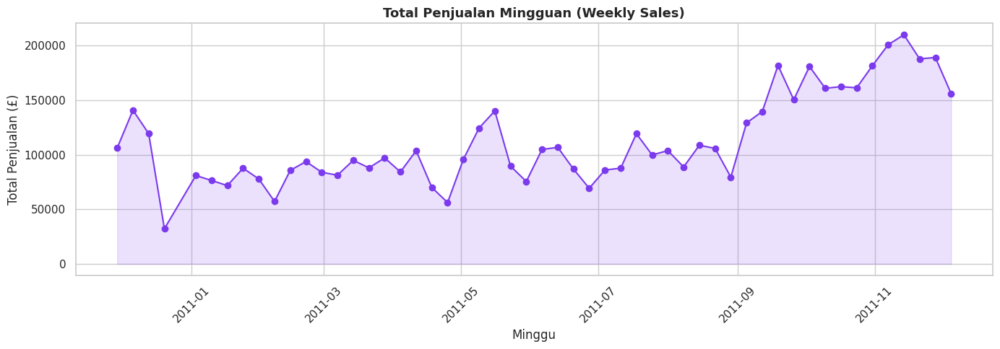


ANALISIS POLA: PENJUALAN PER HARI DALAM SEMINGGU


,DayOfWeek,DayName,TotalSales
0,0,Monday,957659.901
1,1,Tuesday,1047972.241
2,2,Wednesday,1094616.750
3,3,Thursday,1305715.600
4,4,Friday,897953.631
5,6,Sunday,652050.061


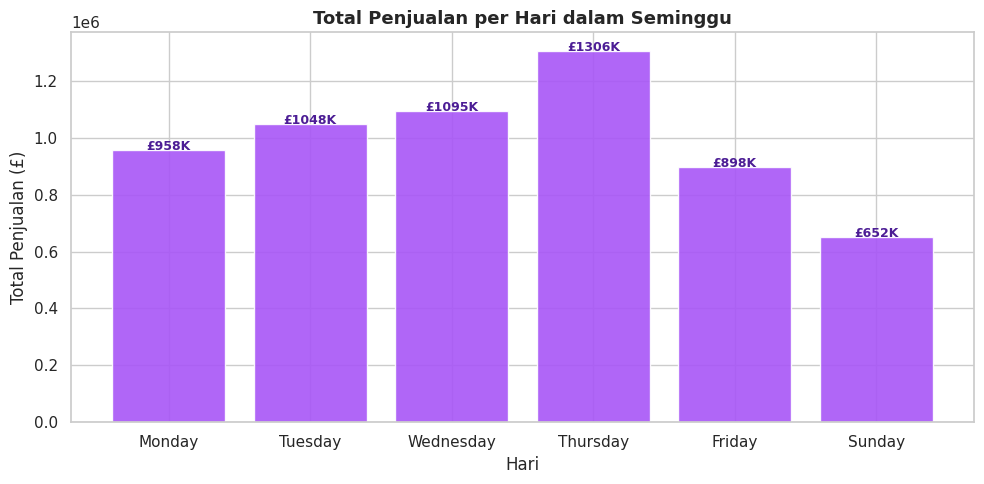


ANALISIS POLA: PENJUALAN PER JAM


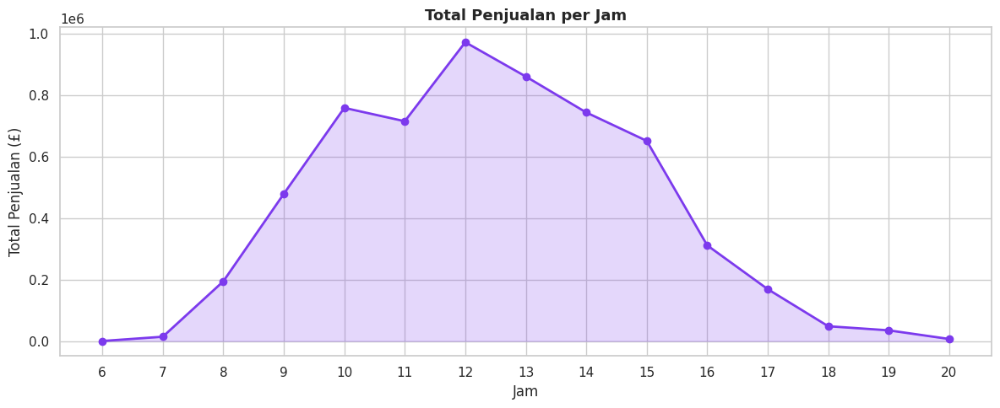


HEATMAP POLA TEMPORAL: HARI vs BULAN


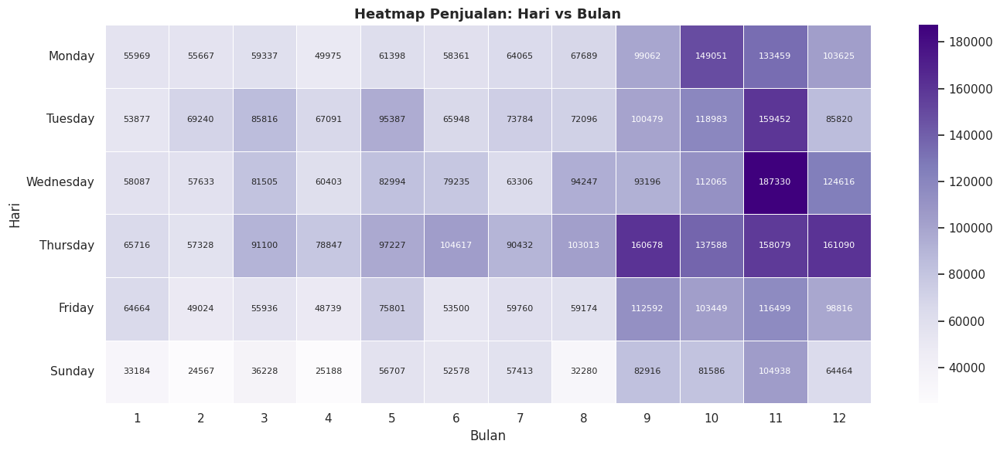

In [ ]:
# ===========================================================================================================================
# B. TRANSFORMASI UNTUK PREDIKSI TREN PENJUALAN (TIME SERIES)
# ===========================================================================================================================

print("\n" + "="*60)
print("TRANSFORMASI B: TIME-LEVEL AGGREGATION (TIME SERIES)")
print("="*60)

purple_main = "#7c3aed"
purple_dark = "#4c1d95"
purple_mid = "#a855f7"
bg_color = "#f5f3ff"

# ── B.1 Agregasi Harian ──────────────────────────────────────────────────────

df_clean["Date"] = df_clean["InvoiceDate"].dt.date

daily_sales = (
    df_clean.groupby("Date")["TotalPrice"]
    .sum()
    .reset_index()
    .rename(columns={"TotalPrice": "DailySales"})
)

daily_sales["Date"] = pd.to_datetime(daily_sales["Date"])
daily_sales = daily_sales.sort_values("Date").reset_index(drop=True)

print(f"\n  [Harian] Jumlah hari: {len(daily_sales)}")
display(daily_sales.head(10))

plt.figure(figsize=(14, 5))
plt.plot(daily_sales["Date"], daily_sales["DailySales"],
         color=purple_main, linewidth=1.5)
plt.fill_between(daily_sales["Date"], daily_sales["DailySales"],
                 alpha=0.15, color=purple_main)

plt.title("Total Penjualan Harian (Daily Sales)", fontsize=13, fontweight='bold')
plt.xlabel("Tanggal")
plt.ylabel("Total Penjualan (£)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ── B.2 Agregasi Bulanan ─────────────────────────────────────────────────────

df_clean["YearMonth"] = df_clean["InvoiceDate"].dt.to_period("M")

monthly_sales = (
    df_clean.groupby("YearMonth")["TotalPrice"]
    .sum()
    .reset_index()
    .rename(columns={"TotalPrice": "MonthlySales"})
)

monthly_sales["YearMonth"] = monthly_sales["YearMonth"].dt.to_timestamp()
monthly_sales = monthly_sales.sort_values("YearMonth").reset_index(drop=True)

print(f"\n  [Bulanan] Jumlah bulan: {len(monthly_sales)}")
display(monthly_sales)

fig, ax = plt.subplots(figsize=(12, 5))

bars = ax.bar(
    monthly_sales["YearMonth"].dt.strftime("%b-%Y"),
    monthly_sales["MonthlySales"],
    color=purple_mid,
    edgecolor="white",
    alpha=0.85
)

ax.plot(
    range(len(monthly_sales)),
    monthly_sales["MonthlySales"],
    color=purple_dark,
    marker='o',
    linewidth=2,
    markersize=6
)

ax.set_title("Total Penjualan Bulanan (Monthly Sales)", fontsize=13, fontweight='bold')
ax.set_xlabel("Bulan")
ax.set_ylabel("Total Penjualan (£)")
ax.tick_params(axis='x', rotation=45)

for bar, val in zip(bars, monthly_sales["MonthlySales"]):
    ax.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + 2000,
        f"£{val/1000:.0f}K",
        ha='center',
        fontsize=8,
        fontweight='bold',
        color=purple_dark
    )

plt.tight_layout()
plt.show()

# ── B.3 Agregasi Mingguan ────────────────────────────────────────────────────

df_clean["Week"] = df_clean["InvoiceDate"].dt.to_period("W")

weekly_sales = (
    df_clean.groupby("Week")["TotalPrice"]
    .sum()
    .reset_index()
    .rename(columns={"TotalPrice": "WeeklySales"})
)

weekly_sales["Week"] = weekly_sales["Week"].dt.to_timestamp()
weekly_sales = weekly_sales.sort_values("Week").reset_index(drop=True)

print(f"\n  [Mingguan] Jumlah minggu: {len(weekly_sales)}")
display(weekly_sales.head(10))

plt.figure(figsize=(14, 5))
plt.plot(weekly_sales["Week"], weekly_sales["WeeklySales"],
         color=purple_main, linewidth=1.5, marker='o')

plt.fill_between(weekly_sales["Week"], weekly_sales["WeeklySales"],
                 alpha=0.15, color=purple_main)

plt.title("Total Penjualan Mingguan (Weekly Sales)", fontsize=13, fontweight='bold')
plt.xlabel("Minggu")
plt.ylabel("Total Penjualan (£)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ── B.4 Pola Penjualan per Hari dalam Seminggu ───────────────────────────────

print("\n" + "="*60)
print("ANALISIS POLA: PENJUALAN PER HARI DALAM SEMINGGU")
print("="*60)

day_sales = (
    df_clean.groupby(["DayOfWeek","DayName"])["TotalPrice"]
    .sum()
    .reset_index()
    .rename(columns={"TotalPrice": "TotalSales"})
    .sort_values("DayOfWeek")
)

display(day_sales)

plt.figure(figsize=(10, 5))

bars = plt.bar(
    day_sales["DayName"],
    day_sales["TotalSales"],
    color=purple_mid,
    edgecolor="white",
    alpha=0.9
)

plt.title("Total Penjualan per Hari dalam Seminggu", fontsize=13, fontweight='bold')
plt.xlabel("Hari")
plt.ylabel("Total Penjualan (£)")

for bar, val in zip(bars, day_sales["TotalSales"]):
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + 500,
        f"£{val/1000:.0f}K",
        ha='center',
        fontsize=9,
        fontweight='bold',
        color=purple_dark
    )

plt.tight_layout()
plt.show()

# ── B.5 Pola Penjualan per Jam ───────────────────────────────────────────────

print("\n" + "="*60)
print("ANALISIS POLA: PENJUALAN PER JAM")
print("="*60)

hour_sales = (
    df_clean.groupby("Hour")["TotalPrice"]
    .sum()
    .reset_index()
    .rename(columns={"TotalPrice": "TotalSales"})
)

plt.figure(figsize=(12, 5))

plt.plot(hour_sales["Hour"], hour_sales["TotalSales"],
         color=purple_main, marker='o', linewidth=2)

plt.fill_between(hour_sales["Hour"], hour_sales["TotalSales"],
                 alpha=0.2, color=purple_main)

plt.title("Total Penjualan per Jam", fontsize=13, fontweight='bold')
plt.xlabel("Jam")
plt.ylabel("Total Penjualan (£)")
plt.xticks(hour_sales["Hour"])
plt.tight_layout()
plt.show()

# ── B.6 Heatmap Pola Temporal ───────────────────────────────────────────────

print("\n" + "="*60)
print("HEATMAP POLA TEMPORAL: HARI vs BULAN")
print("="*60)

heatmap_data = df_clean.pivot_table(
    values="TotalPrice",
    index="DayName",
    columns="Month",
    aggfunc="sum"
)

order_days = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
heatmap_data = heatmap_data.reindex([d for d in order_days if d in heatmap_data.index])

plt.figure(figsize=(14, 6))

sns.heatmap(
    heatmap_data,
    annot=True,
    fmt=".0f",
    cmap="Purples",
    linewidths=0.5,
    linecolor="white",
    annot_kws={"size": 8}
)

plt.title("Heatmap Penjualan: Hari vs Bulan", fontsize=13, fontweight='bold')
plt.xlabel("Bulan")
plt.ylabel("Hari")
plt.tight_layout()
plt.show()

### **📈 Insight Analisis Time Series Penjualan**

Berdasarkan visualisasi **penjualan harian**, terlihat bahwa total penjualan mengalami fluktuasi yang cukup tinggi sepanjang periode observasi. Meskipun terdapat beberapa penurunan pada awal tahun 2011, tren penjualan secara umum menunjukkan peningkatan signifikan menjelang akhir tahun, khususnya pada periode September hingga November 2011. Puncak penjualan harian bahkan mencapai lebih dari £50.000, yang mengindikasikan adanya peningkatan aktivitas transaksi pada periode tertentu, kemungkinan dipengaruhi oleh musim belanja atau promosi akhir tahun.

Pada agregasi **penjualan bulanan**, terlihat pola tren yang semakin meningkat dari pertengahan hingga akhir tahun 2011. Bulan November 2011 menjadi periode dengan total penjualan tertinggi, yaitu sekitar £860K, sedangkan Februari 2011 menjadi salah satu bulan dengan penjualan terendah. Penurunan drastis pada Desember 2011 kemungkinan disebabkan data yang belum mencakup satu bulan penuh sehingga total penjualannya lebih kecil dibanding bulan sebelumnya.

Visualisasi **penjualan mingguan** juga memperlihatkan pola yang konsisten dengan tren bulanan, di mana penjualan meningkat cukup tajam mulai kuartal ketiga tahun 2011. Pada beberapa minggu di bulan Oktober dan November, total penjualan mingguan berhasil menembus angka £200K. Hal ini menunjukkan adanya pertumbuhan permintaan pelanggan pada akhir tahun.

Sementara itu, analisis **penjualan per hari dalam seminggu** menunjukkan bahwa hari **Thursday (Kamis)** memiliki total penjualan tertinggi dengan nilai sekitar £1,3 juta. Sebaliknya, **Sunday (Minggu)** menjadi hari dengan penjualan terendah. Pola ini mengindikasikan bahwa aktivitas transaksi pelanggan lebih dominan terjadi pada hari kerja dibanding akhir pekan.

Berdasarkan grafik **Total Penjualan per Jam**, terlihat bahwa penjualan mengalami peningkatan secara signifikan mulai dari pukul 08.00 hingga mencapai puncaknya pada pukul 12.00 dengan total penjualan hampir mencapai £1 juta. Setelah jam tersebut, penjualan mulai menurun secara bertahap hingga pukul 20.00. Hal ini menunjukkan bahwa waktu paling ramai transaksi terjadi menjelang siang hari, sehingga jam operasional sekitar pukul 10.00–14.00 dapat dianggap sebagai prime time penjualan. Sementara itu, penjualan paling rendah terjadi pada pagi sangat awal dan malam hari.

Pada **Heatmap Penjualan Hari vs Bulan**, terlihat bahwa penjualan cenderung meningkat pada bulan-bulan akhir tahun, khususnya bulan 9 hingga 12. Hari Kamis dan Rabu menunjukkan performa penjualan yang paling tinggi dibanding hari lainnya, dengan puncak tertinggi terjadi pada hari Rabu bulan 11 sebesar 187.330. Sebaliknya, hari Minggu memiliki total penjualan yang relatif lebih rendah di hampir seluruh bulan. Pola ini menunjukkan adanya peningkatan aktivitas belanja menjelang akhir tahun serta perbedaan tingkat transaksi pada setiap hari dalam seminggu.

In [ ]:
# ===========================================================================================================================
# RINGKASAN AKHIR SEMUA OBJEK DATA
# ===========================================================================================================================

print("\n" + "="*60)
print("RINGKASAN OBJEK DATA YANG TERSEDIA")
print("="*60)

print(f"""
  df_clean      → Data bersih level transaksi  : {df_clean.shape[0]:,} baris, {df_clean.shape[1]} kolom
  rfm           → Data RFM raw per pelanggan   : {rfm.shape[0]:,} pelanggan
  rfm_scaled    → Data RFM ternormalisasi       : {rfm_scaled.shape[0]:,} pelanggan
  daily_sales   → Agregasi harian               : {len(daily_sales)} hari
  weekly_sales  → Agregasi mingguan             : {len(weekly_sales)} minggu
  monthly_sales → Agregasi bulanan              : {len(monthly_sales)} bulan
""")

print("✅ Semua transformasi selesai. Siap untuk Modeling (K-Means & Time Series Forecasting).")


RINGKASAN OBJEK DATA YANG TERSEDIA

  df_clean      → Data bersih level transaksi  : 392,692 baris, 19 kolom
  rfm           → Data RFM raw per pelanggan   : 4,338 pelanggan
  rfm_scaled    → Data RFM ternormalisasi       : 4,338 pelanggan
  daily_sales   → Agregasi harian               : 305 hari
  weekly_sales  → Agregasi mingguan             : 53 minggu
  monthly_sales → Agregasi bulanan              : 13 bulan

✅ Semua transformasi selesai. Siap untuk Modeling (K-Means & Time Series Forecasting).


### **📈 Ringkasan**

Berdasarkan ringkasan objek data yang tersedia, dataset telah melalui proses pembersihan dan transformasi sehingga siap digunakan untuk tahap modeling. Data utama `df_clean` berisi 392.692 baris transaksi dengan 19 kolom yang merepresentasikan data transaksi bersih. Selanjutnya, data pelanggan telah diolah menggunakan metode RFM (Recency, Frequency, Monetary) yang menghasilkan 4.338 pelanggan pada data `rfm`, kemudian dilakukan normalisasi pada `rfm_scaled` agar skala data lebih seimbang untuk proses clustering seperti K-Means.

Selain itu, telah dibuat data agregasi berdasarkan waktu untuk analisis time series, yaitu `daily_sales` sebanyak 305 hari, `weekly_sales` sebanyak 53 minggu, dan `monthly_sales` sebanyak 13 bulan. Agregasi ini memudahkan analisis pola penjualan dari waktu ke waktu. Dengan seluruh tahapan preprocessing yang sudah selesai, dataset dinyatakan siap digunakan untuk proses modeling, baik untuk segmentasi pelanggan menggunakan K-Means maupun prediksi penjualan menggunakan metode Time Series Forecasting.

<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">3️⃣ VISUALISASI DATA</h1>**

<hr style="border: 4px solid #2e7d32;">

In [ ]:
# ===========================================================================================================================
# VISUALISASI DATA - MENGGUNAKAN df_clean HASIL CLEANING
# ===========================================================================================================================

import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import numpy as np
import pandas as pd
import math
import ipywidgets as widgets
from IPython.display import display, clear_output

In [ ]:
# ===========================================================================================================================
# COLOR PALETTE
# ===========================================================================================================================

CLR_DARK      = '#2E1065'
CLR_SECONDARY = '#5B21B6'
CLR_PRIMARY   = '#7C3AED'
CLR_SOFT      = '#A78BFA'
CLR_LIGHT     = '#DDD6FE'
CLR_BG        = '#F5F3FF'
CLR_GRID      = 'rgba(109,40,217,0.08)'
CLR_MID       = '#6d28d9'

PURPLE_SHADES = ['#2e1065','#4c1d95','#5b21b6','#6d28d9',
                 '#7c3aed','#8b5cf6','#a78bfa','#c4b5fd','#ddd6fe','#ede9fe']

def get_purple_shades(n):
    return (PURPLE_SHADES * math.ceil(n / len(PURPLE_SHADES)))[:n]

def CLR_GRADIENT(n):
    cmap = LinearSegmentedColormap.from_list(
        'purple_gradient', [CLR_DARK, CLR_SECONDARY, CLR_PRIMARY, CLR_SOFT], N=n
    )
    return [cmap(i / max(n - 1, 1)) for i in range(n)]

In [ ]:
# ===========================================================================================================================
# PERSIAPAN CUSTOMER-LEVEL DATAFRAME (dari df_clean)
# ===========================================================================================================================

customer_df = df_clean.groupby('CustomerID').agg(
    TotalQuantity    = ('Quantity',   'sum'),
    AvgUnitPrice     = ('UnitPrice',  'mean'),
    TotalSpending    = ('TotalPrice', 'sum'),
    TransactionCount = ('InvoiceNo',  'nunique'),
    AvgMonth         = ('Month',      'mean'),
    Country          = ('Country',    lambda x: x.mode()[0])
).reset_index()

customer_df['CustomerSegment'] = pd.qcut(
    customer_df['TotalSpending'],
    q=3,
    labels=['Low', 'Medium', 'High']
)

Kode di atas digunakan untuk membentuk **data level pelanggan (customer-level dataframe)** dari dataset transaksi `df_clean`. Proses dilakukan dengan mengelompokkan data berdasarkan `CustomerID`, kemudian menghitung beberapa informasi penting setiap pelanggan, seperti total jumlah barang yang dibeli (`TotalQuantity`), rata-rata harga produk (`AvgUnitPrice`), total pengeluaran pelanggan (`TotalSpending`), jumlah transaksi unik (`TransactionCount`), rata-rata bulan transaksi (`AvgMonth`), serta negara asal pelanggan (`Country`). Dengan agregasi ini, setiap baris merepresentasikan satu pelanggan beserta perilaku transaksinya.

Selanjutnya, dibuat fitur `CustomerSegment` menggunakan metode `pd.qcut()` berdasarkan nilai `TotalSpending`. Pelanggan dibagi menjadi tiga kelompok yaitu **Low**, **Medium**, dan **High** sesuai tingkat pengeluarannya. Segmentasi ini membantu dalam mengidentifikasi pelanggan dengan kontribusi belanja rendah hingga tinggi, sehingga dapat digunakan untuk analisis perilaku pelanggan maupun strategi pemasaran pada tahap modeling selanjutnya.

In [ ]:
# ===========================================================================================================================
# DISTRIBUSI FITUR NUMERIK INTERAKTIF (PLOTLY)
# ===========================================================================================================================

num_cols = ['Quantity', 'UnitPrice', 'TotalPrice']

fig = go.Figure()

for i, col in enumerate(num_cols):
    values     = df_clean[col].dropna()
    q1, q99    = values.quantile(0.01), values.quantile(0.99)
    values     = values[(values >= q1) & (values <= q99)]
    mean_val   = values.mean()
    median_val = values.median()
    visible    = (i == 0)

    fig.add_trace(go.Histogram(
        x=values, nbinsx=40, name=col,
        marker=dict(color=CLR_PRIMARY, line=dict(color='white', width=0.3)),
        opacity=0.9, visible=visible, showlegend=False,
        hovertemplate=f'<b>{col}</b><br>Value: %{{x}}<br>Count: %{{y}}<extra></extra>'
    ))
    fig.add_trace(go.Scatter(
        x=[mean_val, mean_val], y=[0, 1], mode='lines',
        line=dict(color=CLR_DARK, dash='dash', width=2.5),
        name='Mean', visible=visible, yaxis='y2', showlegend=True,
        hovertemplate=f'<b>Mean</b><br>{mean_val:.2f}<extra></extra>'
    ))
    fig.add_trace(go.Scatter(
        x=[median_val, median_val], y=[0, 1], mode='lines',
        line=dict(color=CLR_SOFT, dash='dot', width=2.5),
        name='Median', visible=visible, yaxis='y2', showlegend=True,
        hovertemplate=f'<b>Median</b><br>{median_val:.2f}<extra></extra>'
    ))

buttons = []
for i, col in enumerate(num_cols):
    vis = [False] * (len(num_cols) * 3)
    vis[i*3:(i+1)*3] = [True, True, True]
    buttons.append(dict(label=col, method='update',
                        args=[{'visible': vis}, {'title': f'Distribution of <b>{col}</b>'}]))

fig.update_layout(
    title=dict(text='Distribution of <b>Quantity</b>',
               font=dict(size=18, color=CLR_DARK), x=0.5),
    updatemenus=[dict(buttons=buttons, direction='down', showactive=True,
                      x=0.01, y=1.24, bgcolor='#ede7f6',
                      bordercolor=CLR_PRIMARY, font=dict(size=11, color=CLR_DARK))],
    annotations=[dict(text='<b>Select Feature :</b>', x=0.01, y=1.34,
                      xref='paper', yref='paper', showarrow=False,
                      font=dict(size=12, color=CLR_DARK))],
    xaxis=dict(title='Value', showgrid=True, gridcolor='rgba(0,0,0,0.06)'),
    yaxis=dict(title='Frequency', showgrid=True, gridcolor='rgba(0,0,0,0.06)'),
    yaxis2=dict(overlaying='y', range=[0,1], showticklabels=False),
    paper_bgcolor=CLR_BG, plot_bgcolor='white',
    height=600, width=950, bargap=0.05,
    margin=dict(t=160, b=60, l=60, r=40),
    legend=dict(x=0.82, y=0.97, bgcolor='rgba(255,255,255,0.8)',
                bordercolor=CLR_PRIMARY, borderwidth=1)
)
fig.show()

## **🚀 Distribusi Fitur Numerik**

Berdasarkan histogram distribusi fitur **Quantity**, terlihat bahwa sebagian besar transaksi memiliki jumlah pembelian pada nilai rendah hingga menengah, sedangkan nilai quantity yang sangat tinggi hanya muncul dalam jumlah sedikit. Posisi garis mean berada di sebelah kanan median, sehingga distribusi data cenderung **right-skewed** (miring ke kanan). Hal ini menunjukkan adanya beberapa transaksi dengan jumlah pembelian besar yang menyebabkan rata-rata meningkat.

Pada distribusi **UnitPrice**, mayoritas harga produk berada pada rentang rendah, sementara hanya sedikit produk yang memiliki harga sangat tinggi. Mean yang lebih besar dibanding median juga menunjukkan distribusi yang tidak simetris dan cenderung memiliki outlier pada harga tinggi. Kondisi ini umum terjadi pada data penjualan karena terdapat beberapa produk premium dengan harga jauh di atas rata-rata.

Sementara itu, distribusi **TotalPrice** menunjukkan pola yang paling jelas mengalami right-skewed. Sebagian besar transaksi memiliki total belanja kecil hingga menengah, namun terdapat beberapa transaksi dengan nilai total yang sangat besar. Perbedaan posisi mean dan median yang cukup jauh menandakan adanya outlier atau transaksi bernilai tinggi yang memengaruhi rata-rata data. Secara keseluruhan, ketiga distribusi menunjukkan bahwa data penjualan tidak terdistribusi normal dan memiliki kecenderungan skewness positif.

In [ ]:
# ===========================================================================================================================
# DISTRIBUSI FITUR KATEGORIKAL INTERAKTIF (PLOTLY)
# ===========================================================================================================================

cat_cols = ['Country', 'InvoiceMonth', 'DayName']

df_viz = df_clean.copy()
df_viz['InvoiceMonth'] = df_viz['InvoiceDate'].dt.month_name()
df_viz['DayName'] = df_viz['InvoiceDate'].dt.day_name()

fig2 = go.Figure()

for i, col in enumerate(cat_cols):
    counts  = df_viz[col].value_counts().sort_values()
    labels  = counts.index.tolist()
    values  = counts.values.tolist()
    colors  = get_purple_shades(len(labels))
    visible = (i == 0)

    fig2.add_trace(go.Bar(
        x=values,
        y=labels,
        orientation='h',
        marker=dict(color=colors, line=dict(color='white', width=0.5)),
        text=[f'{v:,}' for v in values],
        textposition='outside',
        textfont=dict(size=10, color=CLR_DARK),
        hovertemplate='<b>%{y}</b><br>Count: %{x:,}<extra></extra>',
        visible=visible,
        showlegend=False
    ))

buttons2 = []
for i, col in enumerate(cat_cols):
    vis = [False] * len(cat_cols)
    vis[i] = True

    buttons2.append(dict(
        label=col,
        method='update',
        args=[{'visible': vis}, {'yaxis': {'title': col}}]
    ))

fig2.update_layout(
    title=dict(
        text='Distribution of <b>Categorical Features</b>',
        x=0.5,
        font=dict(size=20, color=CLR_DARK)
    ),
    annotations=[
        dict(
            text='<b>Select Feature :</b>',
            x=0,
            y=1.12,
            xref='paper',
            yref='paper',
            xanchor='left',
            showarrow=False,
            font=dict(size=12, color=CLR_DARK)
        )
    ],
    updatemenus=[dict(
        buttons=buttons2,
        direction='down',
        showactive=True,
        x=0,
        y=1.07,
        xanchor='left',
        bgcolor='#ede7f6',
        bordercolor=CLR_PRIMARY,
        font=dict(size=11, color=CLR_DARK)
    )],
    xaxis=dict(title='Count', showgrid=True, gridcolor='rgba(0,0,0,0.06)'),
    yaxis=dict(title='Country', autorange=True),
    paper_bgcolor=CLR_BG,
    plot_bgcolor='white',
    height=600,
    width=950,
    margin=dict(t=140, b=60, l=180, r=120),
    bargap=0.25
)

fig2.show()

## **📊 Insight Distribusi Fitur Kategorikal**

Berdasarkan visualisasi distribusi fitur kategorikal di atas, terlihat bahwa data transaksi memiliki ketidakseimbangan pada beberapa kategori tertentu. Pada fitur **Country**, mayoritas transaksi berasal dari **United Kingdom** dengan jumlah yang sangat dominan dibanding negara lainnya. Hal ini menunjukkan bahwa aktivitas penjualan perusahaan paling banyak terjadi di wilayah tersebut, sedangkan negara lain hanya memberikan kontribusi transaksi dalam jumlah yang relatif kecil.

Pada fitur **InvoiceMonth**, distribusi transaksi menunjukkan adanya pola musiman (*seasonality*). Transaksi tertinggi terjadi pada bulan **November**, diikuti oleh **Oktober** dan **Desember**. Kondisi ini mengindikasikan adanya peningkatan aktivitas pembelian menjelang akhir tahun, yang kemungkinan dipengaruhi oleh periode promosi, liburan, atau kebutuhan belanja musiman pelanggan.

Sementara itu, pada fitur **DayName**, transaksi paling banyak terjadi pada hari **Thursday**, kemudian diikuti oleh **Wednesday** dan **Tuesday**. Sebaliknya, transaksi pada hari **Friday** cenderung lebih rendah dibanding hari lainnya. Pola ini menunjukkan bahwa aktivitas pembelian pelanggan lebih aktif pada pertengahan minggu dibanding akhir minggu. Secara keseluruhan, distribusi fitur kategorikal memperlihatkan adanya dominasi kategori tertentu dan pola transaksi yang dipengaruhi oleh waktu maupun lokasi penjualan.

In [ ]:
# ===========================================================================================================================
# HEATMAP KORELASI ANTAR VARIABEL NUMERIK (PLOTLY)
# ===========================================================================================================================

num_cols_corr = ['TotalQuantity','AvgUnitPrice','TotalSpending',
                 'TransactionCount','AvgMonth']

corr_matrix = customer_df[num_cols_corr].corr()
mask        = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)
corr_masked = corr_matrix.copy()
corr_masked[mask] = None
text_annot  = corr_masked.round(2).astype(str).replace('nan', '')

fig3 = go.Figure(go.Heatmap(
    z=corr_masked.values, x=num_cols_corr, y=num_cols_corr,
    text=text_annot.values, texttemplate='%{text}',
    textfont=dict(size=10, color='#2d0050'),
    colorscale=[[0.0,'#3b0764'],[0.25,'#6a0dad'],
                [0.5,'#f3e8ff'],[0.75,'#c4b5fd'],[1.0,'#7c3aed']],
    zmid=0, zmin=-1, zmax=1,
    colorbar=dict(title=dict(text='Pearson r', font=dict(size=11, color=CLR_DARK)),
                  tickfont=dict(size=10, color=CLR_DARK), thickness=15, len=0.8),
    xgap=2, ygap=2,
    hovertemplate='<b>%{x}</b> × <b>%{y}</b><br>r = %{z:.4f}<extra></extra>'
))

fig3.update_layout(
    title=dict(text='Correlation Heatmap - Customer-Level Features (Post-Cleaning)',
               font=dict(size=16, color=CLR_DARK), x=0.5),
    xaxis=dict(tickangle=45, tickfont=dict(size=10, color=CLR_DARK), showgrid=False),
    yaxis=dict(tickfont=dict(size=10, color=CLR_DARK), showgrid=False, autorange='reversed'),
    paper_bgcolor=CLR_BG, plot_bgcolor=CLR_BG,
    height=650, width=900,
    margin=dict(t=80, b=150, l=180, r=80)
)
fig3.show()

## **📈 Insight Correlation Heatmap**

Berdasarkan heatmap korelasi fitur customer-level setelah proses *data cleaning*, terlihat bahwa fitur **TotalQuantity** memiliki korelasi positif yang sangat kuat dengan **TotalSpending** sebesar **0.96**. Hal ini menunjukkan bahwa semakin banyak jumlah produk yang dibeli pelanggan, maka total pengeluaran pelanggan juga cenderung meningkat secara signifikan.

Selain itu, fitur **TransactionCount** juga memiliki hubungan positif yang cukup kuat dengan **TotalQuantity** sebesar **0.78** serta dengan **TotalSpending** sebesar **0.77**. Kondisi ini mengindikasikan bahwa pelanggan yang lebih sering melakukan transaksi umumnya membeli lebih banyak produk dan menghasilkan total pengeluaran yang lebih tinggi.

Di sisi lain, fitur **AvgUnitPrice** memiliki korelasi yang sangat lemah terhadap fitur lainnya, bahkan cenderung negatif kecil, seperti terhadap **TotalQuantity** (-0.09) dan **TransactionCount** (-0.03). Hal ini menunjukkan bahwa rata-rata harga produk tidak terlalu memengaruhi jumlah pembelian maupun frekuensi transaksi pelanggan.

Sementara itu, fitur **AvgMonth** hampir tidak memiliki hubungan linear dengan seluruh fitur lainnya karena nilai korelasinya mendekati nol. Secara keseluruhan, heatmap menunjukkan bahwa perilaku pelanggan lebih dipengaruhi oleh intensitas transaksi dan jumlah pembelian dibandingkan faktor waktu maupun rata-rata harga produk.

In [ ]:
# ===========================================================================================================================
# SCATTER PLOT INTERAKTIF (PLOTLY)
# ===========================================================================================================================

scatter_pairs = [
    ('TransactionCount', 'TotalSpending',    'CustomerSegment'),
    ('TotalQuantity',    'TotalSpending',    'CustomerSegment'),
    ('AvgUnitPrice',     'TotalSpending',    'CustomerSegment'),
    ('TransactionCount', 'TotalQuantity',    'CustomerSegment'),
    ('AvgMonth',         'TotalSpending',    'CustomerSegment'),
    ('TransactionCount', 'AvgUnitPrice',     'CustomerSegment'),
]

sample = customer_df.sample(n=min(2000, len(customer_df)), random_state=42)

all_traces, trace_map, trace_idx = [], {}, 0

def subtitle_annot(info):
    return dict(
        text=f"<b>{info['x_col']} ↔ {info['y_col']}</b> | hue: {info['hue_col']} | r = {info['corr']:.3f}",
        x=0.5, y=-0.16, xref='paper', yref='paper',
        showarrow=False, xanchor='center', yanchor='top',
        font=dict(size=12, color=CLR_MID)
    )

for pair_idx, (x_col, y_col, hue_col) in enumerate(scatter_pairs):
    categories  = sorted(sample[hue_col].dropna().unique())
    colors      = get_purple_shades(len(categories))
    pair_traces = []

    for cat, color in zip(categories, colors):
        subset = sample[sample[hue_col] == cat]
        all_traces.append(go.Scatter(
            x=subset[x_col], y=subset[y_col], mode='markers',
            name=str(cat), legendgroup=str(cat),
            marker=dict(color=color, size=6, opacity=0.65,
                        line=dict(color='white', width=0.4)),
            hovertemplate=(f'<b>{hue_col}:</b> {cat}<br>'
                           f'<b>{x_col}:</b> %{{x:.2f}}<br>'
                           f'<b>{y_col}:</b> %{{y:.2f}}<extra></extra>'),
            visible=(pair_idx == 0)
        ))
        pair_traces.append(trace_idx); trace_idx += 1

    x_v  = sample[x_col].values.astype(float)
    y_v  = sample[y_col].values.astype(float)
    mask = ~(np.isnan(x_v) | np.isnan(y_v))
    m, b = np.polyfit(x_v[mask], y_v[mask], 1)
    x_ln = np.linspace(x_v[mask].min(), x_v[mask].max(), 200)
    corr = float(np.corrcoef(x_v[mask], y_v[mask])[0,1])

    all_traces.append(go.Scatter(
        x=x_ln, y=m*x_ln+b, mode='lines',
        name=f'trend  r={corr:.3f}', legendgroup='trend',
        line=dict(color=CLR_DARK, dash='dash', width=2),
        hovertemplate=f'Trend line | r={corr:.3f}<extra></extra>',
        visible=(pair_idx == 0)
    ))
    pair_traces.append(trace_idx); trace_idx += 1
    trace_map[pair_idx] = dict(traces=pair_traces, x_col=x_col,
                                y_col=y_col, hue_col=hue_col, corr=corr)

buttons4 = []
for pair_idx, info in trace_map.items():
    vis = [False] * trace_idx
    for t in info['traces']: vis[t] = True
    buttons4.append(dict(
        label=f"{info['x_col']} vs {info['y_col']}",
        method='update',
        args=[{'visible': vis},
              {'annotations': [
                  dict(text='<b>Pasangan variabel :</b>', x=0.0, y=1.175,
                       xref='paper', yref='paper', showarrow=False),
                  subtitle_annot(info)
              ]}]
    ))

init = trace_map[0]
fig4 = go.Figure(data=all_traces)
fig4.update_layout(
    updatemenus=[dict(buttons=buttons4, direction='down', showactive=True,
                      x=0.0, xanchor='left', y=1.13, yanchor='top',
                      bgcolor='#ede9fe', bordercolor=CLR_MID,
                      font=dict(size=12, color=CLR_DARK))],
    annotations=[
        dict(text='<b>Pasangan variabel :</b>', x=0.0, y=1.175,
             xref='paper', yref='paper', showarrow=False,
             font=dict(size=12, color=CLR_DARK)),
        subtitle_annot(init)
    ],
    xaxis=dict(title=init['x_col'], showgrid=True, gridcolor=CLR_GRID),
    yaxis=dict(title=init['y_col'], showgrid=True, gridcolor=CLR_GRID),
    legend=dict(title=init['hue_col'], bgcolor='rgba(255,255,255,0.85)',
                bordercolor=CLR_MID, x=1.01, y=1.0),
    paper_bgcolor=CLR_BG, plot_bgcolor='white',
    height=560, width=980,
    margin=dict(t=90, b=90, l=80, r=180),
    title=dict(text='Scatter Plot Interaktif',
               font=dict(size=15, color=CLR_DARK), x=0.5)
)
fig4.show()

## **🎯 Analisis Scatter Plot**

Visualisasi *scatter plot interaktif* menunjukkan hubungan antarvariabel perilaku pelanggan berdasarkan nilai korelasi (*r*). Variabel **TotalQuantity** dan **TransactionCount** memiliki hubungan positif kuat terhadap **TotalSpending** dengan nilai korelasi masing-masing sekitar **0,915** dan **0,776**, yang menandakan bahwa semakin banyak jumlah transaksi dan kuantitas pembelian, maka total pengeluaran pelanggan cenderung meningkat. Sebaliknya, variabel **AvgUnitPrice** dan **AvgMonth** menunjukkan korelasi yang sangat lemah atau hampir nol terhadap **TotalSpending**, sehingga harga rata-rata produk maupun waktu transaksi tidak memberikan pengaruh linear yang signifikan terhadap total belanja pelanggan.

In [ ]:
# ===========================================================================================================================
# BOXPLOT INTERAKTIF (PLOTLY)
# ===========================================================================================================================

boxplot_configs = [
    ('TotalSpending',    'CustomerSegment'),
    ('TransactionCount', 'CustomerSegment'),
    ('TotalQuantity',    'CustomerSegment'),
    ('AvgUnitPrice',     'CustomerSegment'),
    ('TotalSpending',    'Country'),
    ('TransactionCount', 'Country'),
]

def hex_to_rgba(hex_color, alpha):
    hex_color = hex_color.lstrip('#')
    rgb = tuple(int(hex_color[i:i+2], 16) for i in (0,2,4))
    return f'rgba({rgb[0]},{rgb[1]},{rgb[2]},{alpha})'

all_box, box_map, box_idx = [], {}, 0

for cfg_idx, (y_col, x_col) in enumerate(boxplot_configs):
    temp = customer_df.copy()
    if x_col == 'Country':
        top_c = temp['Country'].value_counts().head(8).index
        temp  = temp[temp['Country'].isin(top_c)]

    order  = (temp.groupby(x_col, observed=False)[y_col]
              .median().sort_values(ascending=False).index.tolist())
    colors = get_purple_shades(len(order))
    cfg_tr = []

    for cat, color in zip(order, colors):
        subset = temp[temp[x_col] == cat][y_col].dropna()
        all_box.append(go.Box(
            y=subset, name=str(cat), legendgroup=str(cat),
            marker=dict(color=color), line=dict(color=color, width=1.8),
            fillcolor=hex_to_rgba(color, 0.18),
            boxmean='sd', boxpoints=False,
            visible=(cfg_idx == 0),
            hovertemplate=f'<b>{cat}</b><br>Median: %{{median:.2f}}<extra></extra>'
        ))
        cfg_tr.append(box_idx); box_idx += 1

    medians = temp.groupby(x_col, observed=False)[y_col].median().reindex(order)
    annots  = [dict(x=cat, y=med, text=f'<b>{med:.1f}</b>',
                    xref='x', yref='y', showarrow=False,
                    font=dict(size=10, color=CLR_DARK))
               for cat, med in medians.items()]
    box_map[cfg_idx] = dict(traces=cfg_tr, y_col=y_col,
                             x_col=x_col, annotations=annots)

buttons5 = []
for cfg_idx, info in box_map.items():
    vis = [False] * box_idx
    for t in info['traces']: vis[t] = True
    buttons5.append(dict(
        label=f"{info['y_col']} by {info['x_col']}",
        method='update',
        args=[{'visible': vis},
              {'xaxis': dict(title=info['x_col']),
               'yaxis': dict(title=info['y_col']),
               'annotations': [
                   dict(text='<b>Select Feature :</b>', x=0.0, y=1.18,
                        xref='paper', yref='paper', showarrow=False,
                        font=dict(size=12, color=CLR_DARK)),
                   *info['annotations']
               ]}]
    ))

init_b = box_map[0]
fig5   = go.Figure(data=all_box)
fig5.update_layout(
    updatemenus=[dict(buttons=buttons5, direction='down', showactive=True,
                      x=0.0, y=1.14, bgcolor='#ede9fe',
                      bordercolor=CLR_MID, font=dict(size=11))],
    annotations=[
        dict(text='<b>Select Feature :</b>', x=0.0, y=1.18,
             xref='paper', yref='paper', showarrow=False,
             font=dict(size=12, color=CLR_DARK)),
        *init_b['annotations']
    ],
    xaxis=dict(title=init_b['x_col']),
    yaxis=dict(title=init_b['y_col'], showgrid=True, gridcolor=CLR_GRID),
    legend=dict(title=init_b['x_col'], bgcolor='rgba(255,255,255,0.85)',
                bordercolor=CLR_MID),
    boxmode='group', paper_bgcolor=CLR_BG, plot_bgcolor='white',
    height=580, width=1000,
    margin=dict(t=110, b=70, l=80, r=180),
    title=dict(text='Boxplot Interaktif',
               font=dict(size=15, color=CLR_DARK), x=0.5)
)
fig5.show()

## **📑 Analisis Boxplot Interaktif**

Visualisasi *boxplot interaktif* menunjukkan perbedaan distribusi perilaku pelanggan berdasarkan **CustomerSegment** dan **Country**. Segmen **High** memiliki median **TotalSpending**, **TransactionCount**, dan **TotalQuantity** yang paling tinggi dibandingkan segmen lainnya, mengindikasikan bahwa pelanggan pada segmen ini lebih aktif dan memberikan kontribusi pengeluaran terbesar. Sementara itu, **AvgUnitPrice** relatif serupa pada seluruh segmen, sehingga perbedaan total belanja lebih dipengaruhi oleh frekuensi transaksi dan jumlah pembelian dibandingkan harga rata-rata produk. Berdasarkan negara, terlihat variasi distribusi pengeluaran dan jumlah transaksi, dengan beberapa negara seperti **Switzerland** dan **United Kingdom** menunjukkan nilai serta sebaran yang lebih tinggi dibanding negara lain, menandakan adanya perbedaan karakteristik perilaku pelanggan antarwilayah.

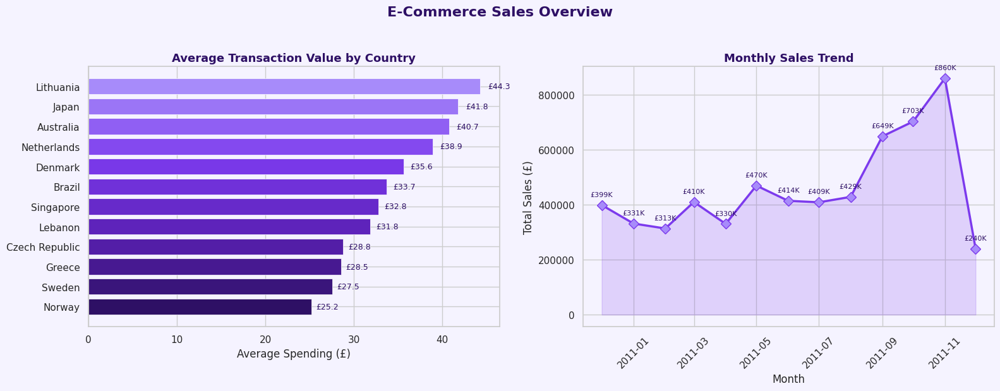

In [ ]:
# ===========================================================================================================================
# COUNTRY SPENDING & MONTHLY SALES TREND
# ===========================================================================================================================

fig6, axes6 = plt.subplots(1, 2, figsize=(16, 6))
fig6.patch.set_facecolor(CLR_BG)

# Plot 1: Average Transaction Value by Country
country_mean = (df_clean.groupby('Country')['TotalPrice']
                .mean().sort_values().tail(12))

axes6[0].barh(country_mean.index, country_mean.values,
              color=CLR_GRADIENT(len(country_mean)), edgecolor='white', lw=0.5)
for i, val in enumerate(country_mean.values):
    axes6[0].text(val + val*0.02, i, f'£{val:,.1f}',
                  va='center', fontsize=9, color=CLR_DARK)
axes6[0].set_title('Average Transaction Value by Country',
                   fontsize=13, fontweight='bold', color=CLR_DARK)
axes6[0].set_xlabel('Average Spending (£)')
axes6[0].set_facecolor(CLR_BG)

# Plot 2: Monthly Sales Trend
axes6[1].plot(monthly_sales['YearMonth'], monthly_sales['MonthlySales'],
              marker='D', color=CLR_PRIMARY, lw=2.5, ms=8,
              markerfacecolor=CLR_SOFT)
axes6[1].fill_between(monthly_sales['YearMonth'], monthly_sales['MonthlySales'],
                      alpha=0.18, color=CLR_PRIMARY)
for xv, yv in zip(monthly_sales['YearMonth'], monthly_sales['MonthlySales']):
    axes6[1].annotate(f'£{yv/1000:.0f}K', (xv, yv),
                      textcoords='offset points', xytext=(0,10),
                      ha='center', fontsize=8, color=CLR_DARK)
axes6[1].set_title('Monthly Sales Trend',
                   fontsize=13, fontweight='bold', color=CLR_DARK)
axes6[1].set_xlabel('Month'); axes6[1].set_ylabel('Total Sales (£)')
axes6[1].tick_params(axis='x', rotation=45)
axes6[1].set_facecolor(CLR_BG)

plt.suptitle('E-Commerce Sales Overview',
             fontsize=16, fontweight='bold', color=CLR_DARK, y=1.03)
plt.tight_layout()
plt.show()

## **📊 Analisis E-Commerce Sales Overview**

Visualisasi *E-Commerce Sales Overview* memberikan gambaran mengenai pola penjualan berdasarkan negara dan tren waktu. Grafik **Average Transaction Value by Country** menunjukkan bahwa negara seperti **Lithuania**, **Japan**, dan **Australia** memiliki rata-rata nilai transaksi tertinggi, yang mengindikasikan kecenderungan pelanggan di negara tersebut melakukan pembelian dengan nominal lebih besar dibanding negara lain. Sementara itu, grafik **Monthly Sales Trend** memperlihatkan fluktuasi penjualan sepanjang tahun dengan peningkatan signifikan pada periode akhir tahun, terutama pada bulan **September hingga November**, yang mencapai puncak sekitar **£860K** sebelum mengalami penurunan tajam pada bulan berikutnya. Pola ini mengindikasikan adanya pengaruh musim atau periode promosi terhadap aktivitas penjualan e-commerce.

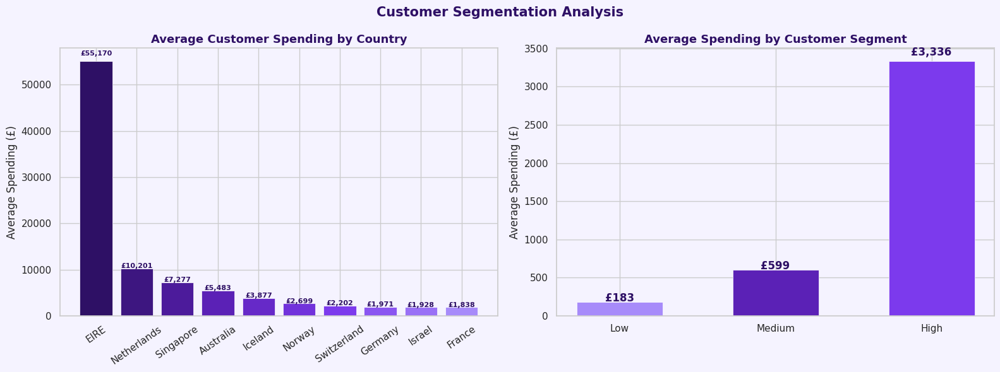

In [ ]:
# ===========================================================================================================================
# CUSTOMER SEGMENTATION ANALYSIS
# ===========================================================================================================================

fig7, axes7 = plt.subplots(1, 2, figsize=(16, 6))
fig7.patch.set_facecolor(CLR_BG)

# Plot 1: Average Customer Spending by Country (Top 10)
country_avg = (customer_df.groupby('Country')['TotalSpending']
               .mean().sort_values(ascending=False).head(10))
axes7[0].bar(country_avg.index, country_avg.values,
             color=CLR_GRADIENT(len(country_avg)), edgecolor='white', lw=0.5)
axes7[0].set_title('Average Customer Spending by Country',
                   fontsize=13, fontweight='bold', color=CLR_DARK)
axes7[0].set_ylabel('Average Spending (£)')
axes7[0].tick_params(axis='x', rotation=35)
axes7[0].set_facecolor(CLR_BG)
for idx, val in enumerate(country_avg.values):
    axes7[0].text(idx, val + val*0.02, f'£{val:,.0f}',
                  ha='center', fontweight='bold', fontsize=8, color=CLR_DARK)

# Plot 2: Average Spending by Customer Segment
seg_order  = ['Low', 'Medium', 'High']
seg_avg    = (customer_df.groupby('CustomerSegment', observed=False)['TotalSpending']
              .mean().reindex(seg_order))
pal_seg    = [CLR_SOFT, CLR_SECONDARY, CLR_PRIMARY]
axes7[1].bar(seg_avg.index, seg_avg.values, color=pal_seg,
             edgecolor='white', lw=0.5, width=0.55)
axes7[1].set_title('Average Spending by Customer Segment',
                   fontsize=13, fontweight='bold', color=CLR_DARK)
axes7[1].set_ylabel('Average Spending (£)')
axes7[1].set_facecolor(CLR_BG)
for idx, val in enumerate(seg_avg.values):
    axes7[1].text(idx, val + val*0.02, f'£{val:,.0f}',
                  ha='center', fontweight='bold', color=CLR_DARK)

plt.suptitle('Customer Segmentation Analysis',
             fontsize=15, fontweight='bold', color=CLR_DARK)
plt.tight_layout()
plt.show()

## **🤖 Analisis Customer Segmentation Analysis**

Visualisasi *Customer Segmentation Analysis* menunjukkan adanya perbedaan yang jelas pada rata-rata pengeluaran pelanggan berdasarkan negara dan segmen pelanggan. Pada grafik **Average Customer Spending by Country**, negara **EIRE** memiliki rata-rata pengeluaran yang jauh lebih tinggi dibanding negara lain, diikuti oleh **Netherlands** dan **Singapore**, yang mengindikasikan kontribusi belanja pelanggan yang lebih besar dari wilayah tersebut. Sementara itu, grafik **Average Spending by Customer Segment** memperlihatkan bahwa segmen **High** memiliki rata-rata pengeluaran tertinggi sekitar **£3.336**, jauh melampaui segmen **Medium** dan **Low**. Temuan ini menunjukkan bahwa segmentasi pelanggan berhasil membedakan tingkat nilai pelanggan, di mana segmen **High** menjadi kelompok paling potensial dan berkontribusi besar terhadap pendapatan e-commerce.

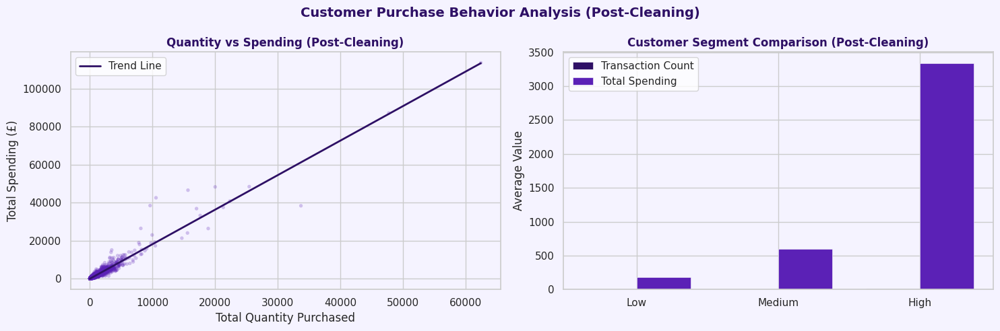

In [ ]:
# ===========================================================================================================================
# PURCHASE BEHAVIOR: QUANTITY VS SPENDING
# ===========================================================================================================================

fig8, axes8 = plt.subplots(1, 2, figsize=(15, 5))
fig8.patch.set_facecolor(CLR_BG)

# Plot 1: Scatter
axes8[0].scatter(customer_df['TotalQuantity'], customer_df['TotalSpending'],
                 alpha=0.25, s=15, color=CLR_SECONDARY, edgecolors='none')
coef   = np.polyfit(customer_df['TotalQuantity'], customer_df['TotalSpending'], 1)
x_rng  = np.linspace(customer_df['TotalQuantity'].min(),
                     customer_df['TotalQuantity'].max(), 150)
axes8[0].plot(x_rng, np.poly1d(coef)(x_rng), color=CLR_DARK, lw=2, label='Trend Line')
axes8[0].set_xlabel('Total Quantity Purchased')
axes8[0].set_ylabel('Total Spending (£)')
axes8[0].set_title('Quantity vs Spending (Post-Cleaning)',
                   fontsize=12, fontweight='bold', color=CLR_DARK)
axes8[0].legend(); axes8[0].set_facecolor(CLR_BG)

# Plot 2: Segment Comparison
seg_metrics = (customer_df.groupby('CustomerSegment', observed=False)
               [['TransactionCount','TotalSpending']].mean())
x_pos = np.arange(len(seg_metrics))
bar_w = 0.38
axes8[1].bar(x_pos - bar_w/2, seg_metrics['TransactionCount'], bar_w,
             label='Transaction Count', color=CLR_DARK, edgecolor='white', lw=0.4)
axes8[1].bar(x_pos + bar_w/2, seg_metrics['TotalSpending'], bar_w,
             label='Total Spending', color=CLR_SECONDARY, edgecolor='white', lw=0.4)
axes8[1].set_xticks(x_pos)
axes8[1].set_xticklabels(seg_metrics.index)
axes8[1].set_title('Customer Segment Comparison (Post-Cleaning)',
                   fontsize=12, fontweight='bold', color=CLR_DARK)
axes8[1].set_ylabel('Average Value')
axes8[1].legend(); axes8[1].set_facecolor(CLR_BG)

plt.suptitle('Customer Purchase Behavior Analysis (Post-Cleaning)',
             fontsize=14, fontweight='bold', color=CLR_DARK)
plt.tight_layout()
plt.show()

## **📊 Analisis Customer Purchase Behavior Analysis**

Visualisasi *Customer Purchase Behavior Analysis* menunjukkan hubungan positif yang kuat antara **Total Quantity Purchased** dan **Total Spending**, terlihat dari pola sebaran data yang mengikuti garis tren meningkat. Hal ini menandakan bahwa semakin banyak jumlah produk yang dibeli pelanggan, maka total pengeluaran juga cenderung meningkat secara signifikan. Selain itu, grafik **Customer Segment Comparison** memperlihatkan bahwa segmen **High** memiliki rata-rata **Transaction Count** dan **Total Spending** paling tinggi dibanding segmen **Medium** dan **Low**, menunjukkan bahwa pelanggan pada segmen ini lebih aktif bertransaksi dan memberikan kontribusi terbesar terhadap pendapatan setelah proses pembersihan data dilakukan.

In [ ]:
# ===========================================================================================================================
# TOP 10 PRODUK TERLARIS (PLOTLY)
# ===========================================================================================================================

product_df = df_clean[
    (~df_clean['Description'].str.contains('POSTAGE', na=False)) &
    (~df_clean['Description'].str.contains('MANUAL',  na=False))
]

top_products = (product_df.groupby('Description')['Quantity']
                .sum().sort_values(ascending=False).head(10))

fig10 = go.Figure(go.Bar(
    x=top_products.index.tolist(),
    y=top_products.values.tolist(),
    marker=dict(color=PURPLE_SHADES[:10], line=dict(color='white', width=0.6)),
    text=[str(v) for v in top_products.values],
    textposition='outside',
    textfont=dict(size=11, color=CLR_DARK),
    hovertemplate='<b>%{x}</b><br>Units Sold: %{y:,}<extra></extra>',
    width=0.6
))
fig10.update_layout(
    title=dict(text='<b>Top 10 Most Popular Products</b>',
               x=0.5, font=dict(size=15, color=CLR_DARK)),
    xaxis=dict(title='Product', tickangle=-35, showgrid=False,
               categoryorder='total descending'),
    yaxis=dict(title='Units Sold', showgrid=True, gridcolor=CLR_GRID,
               range=[0, top_products.max()*1.15]),
    paper_bgcolor=CLR_BG, plot_bgcolor='white',
    height=500, width=950,
    margin=dict(t=80, b=160, l=70, r=40),
    showlegend=False
)
fig10.show()

## **🚀 Analisis Top 10 Most Popular Products**

Visualisasi *Top 10 Most Popular Products* menunjukkan produk dengan jumlah penjualan tertinggi berdasarkan total unit terjual. Produk **ASSORTED COLOUR BIRD ORNAMENT** menjadi produk paling populer dengan penjualan lebih dari **20 ribu unit**, diikuti oleh **WHITE HANGING HEART T-LIGHT HOLDER** dan **JUMBO BAG RED RETROSPOT** yang juga memiliki tingkat permintaan tinggi. Sebagian besar produk terlaris didominasi oleh kategori dekorasi rumah dan perlengkapan hadiah, menunjukkan preferensi pelanggan terhadap produk dekoratif dan kebutuhan rumah tangga. Perbedaan jumlah penjualan antarproduk tidak terlalu jauh, yang mengindikasikan adanya distribusi permintaan yang relatif merata pada kelompok produk populer tersebut.

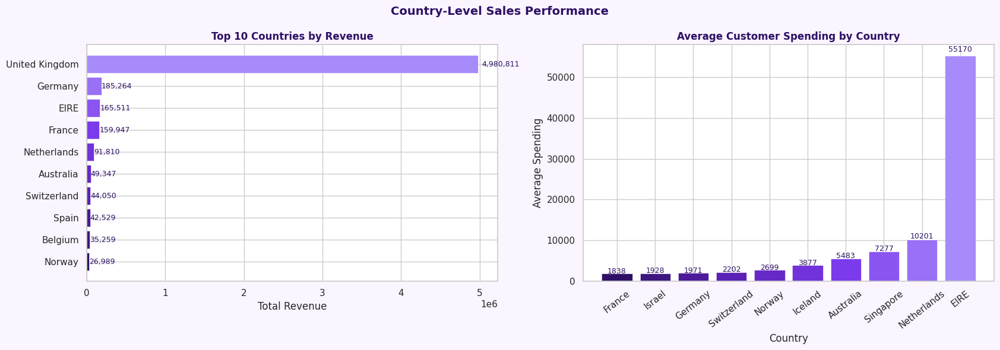

In [ ]:
# ===========================================================================================================================
# COUNTRY PERFORMANCE | SALES & CUSTOMER SPENDING
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(17, 6))
fig.patch.set_facecolor('#faf5ff')

# -- Plot 1: Top 10 Countries by Total Revenue --
country_revenue = customer_df.groupby('Country')['TotalSpending'].sum()
top10_revenue = country_revenue.nlargest(10).sort_values()

axes[0].barh(
    top10_revenue.index,
    top10_revenue.values,
    color=CLR_GRADIENT(10),
    edgecolor='white',
    lw=0.4
)

axes[0].set_title(
    'Top 10 Countries by Revenue',
    fontsize=12,
    fontweight='bold',
    color=CLR_DARK
)

axes[0].set_xlabel('Total Revenue')

for i, val in enumerate(top10_revenue.values):
    axes[0].text(
        val * 1.01,
        i,
        f'{val:,.0f}',
        va='center',
        fontsize=9,
        color=CLR_DARK
    )

# -- Plot 2: Average Customer Spending by Country --
country_avg = customer_df.groupby('Country')['TotalSpending'].mean()
top_avg = country_avg.nlargest(10).sort_values()

axes[1].bar(
    top_avg.index,
    top_avg.values,
    color=CLR_GRADIENT(len(top_avg)),
    edgecolor='white',
    lw=0.4
)

axes[1].set_title(
    'Average Customer Spending by Country',
    fontsize=12,
    fontweight='bold',
    color=CLR_DARK
)

axes[1].set_xlabel('Country')
axes[1].set_ylabel('Average Spending')
axes[1].tick_params(axis='x', rotation=38)

for idx, val in enumerate(top_avg.values):
    axes[1].text(
        idx,
        val * 1.02,
        f'{val:.0f}',
        ha='center',
        fontsize=9,
        color=CLR_DARK
    )

plt.suptitle(
    'Country-Level Sales Performance',
    fontsize=14,
    fontweight='bold',
    color=CLR_DARK
)

plt.tight_layout()
plt.savefig('eda_country_sales.png', dpi=150, bbox_inches='tight')
plt.show()

## **🎯 Analisis Country-Level Sales Performance**

Visualisasi *Country-Level Sales Performance* menunjukkan perbedaan kontribusi penjualan dan rata-rata pengeluaran pelanggan antarnegara. Pada grafik **Top 10 Countries by Revenue**, **United Kingdom** mendominasi total pendapatan dengan nilai yang jauh lebih tinggi dibanding negara lain, menunjukkan bahwa pasar ini menjadi sumber utama revenue e-commerce. Negara seperti **Germany**, **EIRE**, dan **France** berada pada posisi berikutnya meskipun dengan kontribusi yang relatif lebih kecil. Sementara itu, grafik **Average Customer Spending by Country** memperlihatkan bahwa **EIRE** memiliki rata-rata pengeluaran pelanggan tertinggi, diikuti oleh **Netherlands** dan **Singapore**. Temuan ini menunjukkan bahwa negara dengan total revenue tertinggi belum tentu memiliki rata-rata pengeluaran pelanggan terbesar, karena revenue juga dipengaruhi oleh jumlah pelanggan dan frekuensi transaksi.

In [ ]:
# ===========================================================================================================================
# E-COMMERCE SUMMARY DEEP DIVE
# ===========================================================================================================================

import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output
import pandas as pd

CLR_DARK = '#2E1065'
CLR_SECONDARY = '#5B21B6'
CLR_PRIMARY = '#7C3AED'
CLR_SOFT = '#A78BFA'
CLR_LIGHT = '#DDD6FE'
CLR_BG = '#F5F3FF'

def CLR_GRADIENT(n):
    from matplotlib.colors import LinearSegmentedColormap
    cmap = LinearSegmentedColormap.from_list(
        'purple_gradient',
        [CLR_DARK, CLR_SECONDARY, CLR_PRIMARY, CLR_SOFT],
        N=n
    )
    return [cmap(i / max(n - 1, 1)) for i in range(n)]


# ===========================================================================================================================
# DATA PREPARATION
# ===========================================================================================================================
df = df.copy()
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], errors='coerce')

df['TotalPrice'] = df['Quantity'] * df['UnitPrice']

df = df.dropna(subset=['Country', 'TotalPrice'])

df_agg = df.groupby('Country').agg(
    total_revenue=('TotalPrice', 'sum'),
    total_quantity=('Quantity', 'sum'),
    total_orders=('InvoiceNo', 'nunique'),
    unique_customers=('CustomerID', 'nunique'),
    avg_unit_price=('UnitPrice', 'mean')
).reset_index()

df_agg['avg_order_value'] = df_agg['total_revenue'] / df_agg['total_orders']


# ===========================================================================================================================
# METRICS
# ===========================================================================================================================
METRICS = {
    'Total Revenue': 'revenue',
    'Total Quantity Sold': 'quantity',
    'Total Orders': 'orders',
    'Unique Customers': 'customers',
    'Average Unit Price': 'price',
    'Average Order Value': 'aov'
}


metric_toggle = widgets.ToggleButtons(
    options=list(METRICS.keys()),
    layout=widgets.Layout(margin='0 0 12px 0')
)

sort_toggle = widgets.ToggleButtons(
    options=['Ascending', 'Descending', 'Alphabetical'],
    description='Sort:',
    layout=widgets.Layout(margin='0 0 16px 0')
)

filter_select = widgets.SelectMultiple(
    options=list(df_agg['Country']),
    value=list(df_agg['Country']),
    description='Country:',
    layout=widgets.Layout(height='160px', width='320px')
)

show_values_cb = widgets.Checkbox(
    value=True,
    description='Show value labels'
)

save_btn = widgets.Button(
    description='💾 Save PNG',
    button_style='info'
)

output_area = widgets.Output()


# ===========================================================================================================================
# PLOT FUNCTION
# ===========================================================================================================================
def draw_chart(metric_label, sort_order, selected_country, show_values):
    metric_key = METRICS[metric_label]
    df_plot = df_agg[df_agg['Country'].isin(selected_country)].copy()

    sort_map = {
        'revenue': 'total_revenue',
        'quantity': 'total_quantity',
        'orders': 'total_orders',
        'customers': 'unique_customers',
        'price': 'avg_unit_price',
        'aov': 'avg_order_value'
    }

    if sort_order == 'Ascending':
        df_plot = df_plot.sort_values(sort_map[metric_key], ascending=True)
    elif sort_order == 'Descending':
        df_plot = df_plot.sort_values(sort_map[metric_key], ascending=False)
    else:
        df_plot = df_plot.sort_values('Country')

    n = len(df_plot)
    h = max(4, n * 0.55 + 1.5)

    fig, ax = plt.subplots(figsize=(10, h))
    fig.patch.set_facecolor(CLR_BG)
    ax.set_facecolor(CLR_BG)

    x_pos = np.arange(n)
    colors = CLR_GRADIENT(n)

    if metric_key == 'revenue':
        vals = df_plot['total_revenue'].values
        ax.barh(x_pos, vals, color=colors)

        if show_values:
            for i, v in enumerate(vals):
                ax.text(v, i, f'£{v:,.0f}', va='center')

        ax.set_xlabel('Total Revenue')

    elif metric_key == 'quantity':
        vals = df_plot['total_quantity'].values
        ax.barh(x_pos, vals, color=colors)

        if show_values:
            for i, v in enumerate(vals):
                ax.text(v, i, f'{v:,.0f}', va='center')

        ax.set_xlabel('Total Quantity Sold')

    elif metric_key == 'orders':
        vals = df_plot['total_orders'].values
        ax.barh(x_pos, vals, color=colors)

        if show_values:
            for i, v in enumerate(vals):
                ax.text(v, i, f'{v:,.0f}', va='center')

        ax.set_xlabel('Total Orders')

    elif metric_key == 'customers':
        vals = df_plot['unique_customers'].values
        ax.barh(x_pos, vals, color=colors)

        if show_values:
            for i, v in enumerate(vals):
                ax.text(v, i, f'{v:,.0f}', va='center')

        ax.set_xlabel('Unique Customers')

    elif metric_key == 'price':
        vals = df_plot['avg_unit_price'].values
        ax.barh(x_pos, vals, color=colors)

        if show_values:
            for i, v in enumerate(vals):
                ax.text(v, i, f'£{v:.2f}', va='center')

        ax.set_xlabel('Average Unit Price')

    else:
        vals = df_plot['avg_order_value'].values
        ax.barh(x_pos, vals, color=colors)

        if show_values:
            for i, v in enumerate(vals):
                ax.text(v, i, f'£{v:.2f}', va='center')

        ax.set_xlabel('Average Order Value')

    ax.set_yticks(x_pos)
    ax.set_yticklabels(df_plot['Country'])
    ax.set_title(metric_label, fontsize=13, fontweight='bold', color=CLR_DARK)
    ax.spines[['top', 'right']].set_visible(False)
    ax.grid(axis='x', linestyle='--', alpha=0.3)

    plt.tight_layout()
    return fig


# ===========================================================================================================================
# UPDATE FUNCTION
# ===========================================================================================================================
def update(_=None):
    with output_area:
        clear_output(wait=True)

        if not filter_select.value:
            print("Pilih minimal satu country.")
            return

        fig = draw_chart(
            metric_toggle.value,
            sort_toggle.value,
            list(filter_select.value),
            show_values_cb.value
        )
        plt.show()


# ===========================================================================================================================
# SAVE FUNCTION
# ===========================================================================================================================
def save_png(_):
    fig = draw_chart(
        metric_toggle.value,
        sort_toggle.value,
        list(filter_select.value),
        show_values_cb.value
    )
    fig.savefig('ecommerce_summary_deep_dive.png', dpi=150, bbox_inches='tight')
    plt.close(fig)


metric_toggle.observe(update, names='value')
sort_toggle.observe(update, names='value')
filter_select.observe(update, names='value')
show_values_cb.observe(update, names='value')
save_btn.on_click(save_png)


controls = widgets.VBox([
    widgets.HTML('<b style="font-size:15px;color:#2E1065">E-Commerce Summary Deep Dive</b>'),
    metric_toggle,
    widgets.HBox([sort_toggle, show_values_cb]),
    widgets.HBox([
        widgets.VBox([filter_select]),
        save_btn
    ])
])

display(controls, output_area)
update()

Output()

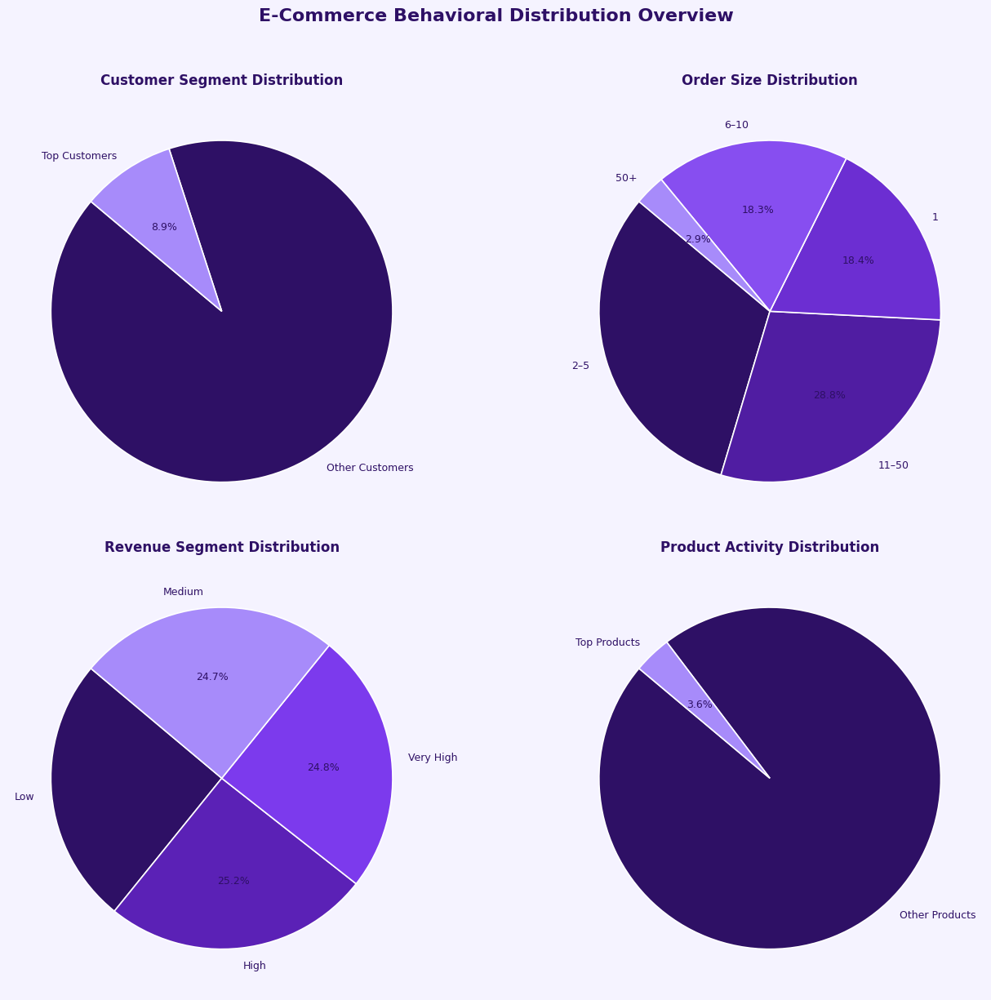

In [ ]:
# ===========================================================================================================================
# PIE CHART DISTRIBUTION - E-COMMERCE INSIGHTS
# Customer Segment, Order Size, Revenue Segment, Product Activity
# ===========================================================================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

CLR_DARK = '#2E1065'
CLR_SECONDARY = '#5B21B6'
CLR_PRIMARY = '#7C3AED'
CLR_SOFT = '#A78BFA'
CLR_BG = '#F5F3FF'

def CLR_GRADIENT(n):
    from matplotlib.colors import LinearSegmentedColormap
    cmap = LinearSegmentedColormap.from_list(
        'purple_gradient',
        [CLR_DARK, CLR_SECONDARY, CLR_PRIMARY, CLR_SOFT],
        N=n
    )
    return [cmap(i / max(n - 1, 1)) for i in range(n)]


# ===========================================================================================================================
# DATA PREPARATION
# ===========================================================================================================================
df = df.copy()

df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], errors='coerce')
df = df.dropna(subset=['CustomerID', 'TotalPrice', 'StockCode'])


# ===========================================================================================================================
# FEATURE ENGINEERING
# ===========================================================================================================================

top_customers = df['CustomerID'].value_counts().head(10).index
df['customer_segment'] = df['CustomerID'].apply(
    lambda x: 'Top Customers' if x in top_customers else 'Other Customers'
)

df['order_size'] = pd.cut(
    df['Quantity'],
    bins=[0, 1, 5, 10, 50, 10000],
    labels=['1', '2–5', '6–10', '11–50', '50+']
)

df['revenue_segment'] = pd.qcut(
    df['TotalPrice'],
    q=4,
    labels=['Low', 'Medium', 'High', 'Very High']
)

top_products = df['StockCode'].value_counts().head(10).index
df['product_segment'] = df['StockCode'].apply(
    lambda x: 'Top Products' if x in top_products else 'Other Products'
)

# ===========================================================================================================================
# PIE CONFIG
# ===========================================================================================================================
pie_configs = [
    ('customer_segment', 'Customer Segment Distribution'),
    ('order_size', 'Order Size Distribution'),
    ('revenue_segment', 'Revenue Segment Distribution'),
    ('product_segment', 'Product Activity Distribution'),
]

valid_configs = [(col, title) for col, title in pie_configs if col in df.columns]


# ===========================================================================================================================
# PLOT SETUP
# ===========================================================================================================================
n_cols = 2
n_rows = math.ceil(len(valid_configs) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 6))
fig.patch.set_facecolor(CLR_BG)

axes = axes.flatten()


# ===========================================================================================================================
# PLOT PIE CHARTS
# ===========================================================================================================================
for i, (col, title) in enumerate(valid_configs):

    counts = df[col].value_counts()
    colors = CLR_GRADIENT(len(counts))

    axes[i].pie(
        counts,
        labels=counts.index,
        autopct='%1.1f%%',
        colors=colors,
        startangle=140,
        wedgeprops=dict(edgecolor='white', linewidth=1.2),
        textprops=dict(color=CLR_DARK, fontsize=9)
    )

    axes[i].set_title(title, fontsize=12, fontweight='bold', color=CLR_DARK, pad=12)


for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)


plt.suptitle(
    'E-Commerce Behavioral Distribution Overview',
    fontsize=16,
    fontweight='bold',
    color=CLR_DARK,
    y=1.02
)

plt.tight_layout()
plt.savefig('ecommerce_pie_charts.png', dpi=150, bbox_inches='tight')
plt.show()

## **📌 Analisis E-Commerce Behavioral Distribution Overview**

Visualisasi *E-Commerce Behavioral Distribution Overview* memberikan gambaran distribusi perilaku pelanggan, ukuran pesanan, pendapatan, dan aktivitas produk. Grafik **Customer Segment Distribution** menunjukkan bahwa sebagian besar pelanggan termasuk dalam kategori *Other Customers*, sedangkan *Top Customers* hanya mencakup proporsi kecil namun berpotensi memberikan kontribusi besar terhadap penjualan. Pada **Order Size Distribution**, pesanan dengan jumlah **2-5** dan **11-50** item mendominasi, menandakan bahwa pelanggan umumnya melakukan pembelian dalam jumlah kecil hingga menengah. Sementara itu, **Revenue Segment Distribution** memperlihatkan distribusi pendapatan yang relatif seimbang antara kategori *Low*, *Medium*, *High*, dan *Very High*, sehingga kontribusi revenue tidak hanya terpusat pada satu kelompok saja. Pada **Product Activity Distribution**, hanya sebagian kecil produk yang tergolong *Top Products*, sedangkan mayoritas berada pada kategori *Other Products*, menunjukkan bahwa sejumlah kecil produk berperan sebagai pendorong utama aktivitas penjualan.

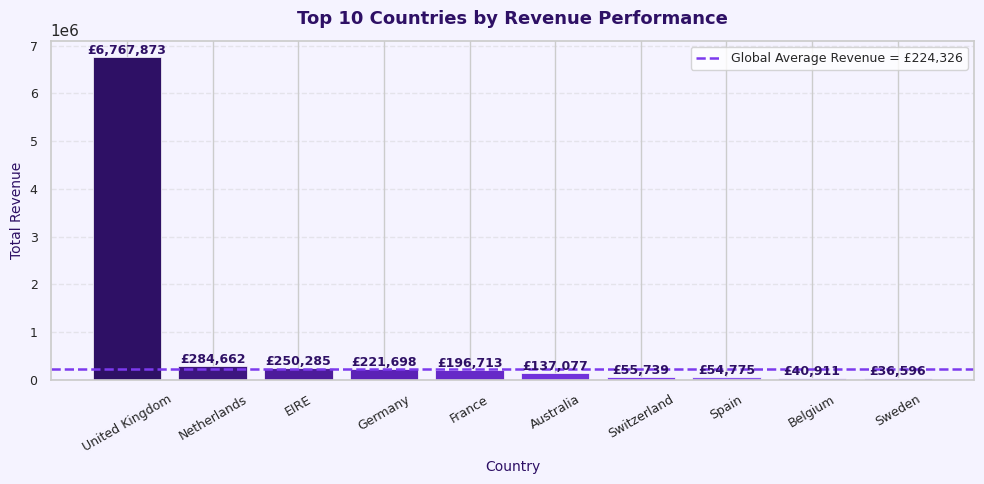

In [ ]:
# ===========================================================================================================================
# TOP 10 COUNTRIES BY REVENUE PERFORMANCE
# ===========================================================================================================================

import numpy as np
import matplotlib.pyplot as plt

CLR_DARK = '#2E1065'
CLR_PRIMARY = '#7C3AED'

def CLR_GRADIENT(n):
    from matplotlib.colors import LinearSegmentedColormap
    cmap = LinearSegmentedColormap.from_list(
        'purple_gradient',
        ['#2E1065', '#5B21B6', '#7C3AED', '#A78BFA'],
        N=n
    )
    return [cmap(i / max(n - 1, 1)) for i in range(n)]


# ===========================================================================================================================
# AGGREGATION
# ===========================================================================================================================
df_country = df.groupby('Country').agg(
    total_revenue=('TotalPrice', 'sum'),
    total_orders=('InvoiceNo', 'nunique'),
    total_quantity=('Quantity', 'sum')
).reset_index()


# ===========================================================================================================================
# TOP 10 COUNTRIES
# ===========================================================================================================================
top_country = df_country.sort_values('total_revenue', ascending=False).head(10)
global_avg = df_country['total_revenue'].mean()


# ===========================================================================================================================
# PLOT
# ===========================================================================================================================
fig, ax = plt.subplots(figsize=(10, 5))
fig.patch.set_facecolor('#F5F3FF')
ax.set_facecolor('#F5F3FF')

bars = ax.bar(
    top_country['Country'],
    top_country['total_revenue'],
    color=CLR_GRADIENT(len(top_country)),
    edgecolor='white',
    linewidth=0.5
)

for bar in bars:
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f'£{bar.get_height():,.0f}',
        ha='center',
        va='bottom',
        fontsize=9,
        fontweight='bold',
        color=CLR_DARK
    )

ax.axhline(
    global_avg,
    color=CLR_PRIMARY,
    linestyle='--',
    linewidth=1.8,
    label=f'Global Average Revenue = £{global_avg:,.0f}'
)

ax.set_title(
    'Top 10 Countries by Revenue Performance',
    fontsize=13,
    fontweight='bold',
    color=CLR_DARK,
    pad=12
)

ax.set_xlabel('Country', fontsize=10, color=CLR_DARK)
ax.set_ylabel('Total Revenue', fontsize=10, color=CLR_DARK)

ax.tick_params(axis='x', rotation=30, labelsize=9)
ax.tick_params(axis='y', labelsize=9)

ax.legend(fontsize=9)
ax.grid(axis='y', linestyle='--', alpha=0.4)

plt.tight_layout()
plt.savefig('eda_top_countries_revenue.png', dpi=150, bbox_inches='tight')
plt.show()

## **📍 Analisis Top 10 Countries by Revenue Performance**

Visualisasi *Top 10 Countries by Revenue Performance* menunjukkan bahwa **United Kingdom** mendominasi total pendapatan dengan nilai lebih dari **£6,7 juta**, jauh melampaui negara lain dan berada jauh di atas rata-rata global sebesar **£224 ribu**. Negara seperti **Netherlands** dan **EIRE** juga mencatat pendapatan tinggi dan berada di atas atau mendekati rata-rata global, sementara **Germany**, **France**, dan negara lainnya memberikan kontribusi yang relatif lebih rendah. Perbedaan yang signifikan ini menunjukkan bahwa pendapatan e-commerce sangat terkonsentrasi pada beberapa pasar utama, khususnya **United Kingdom**, sehingga negara tersebut memiliki peran dominan dalam keseluruhan performa penjualan.

In [ ]:
# ===========================================================================================================================
# COUNTRY-LEVEL E-COMMERCE PERFORMANCE ANALYSIS (GLOBAL VIEW)
# ===========================================================================================================================

import numpy as np
import pandas as pd

# ===========================================================================================================================
# DATA PREPARATION
# ===========================================================================================================================
df = df.copy()

df = df.dropna(subset=['Country', 'CustomerID', 'TotalPrice'])

# ===========================================================================================================================
# COUNTRY AGGREGATION
# ===========================================================================================================================
country_avg = df.groupby('Country').agg(
    total_revenue=('TotalPrice', 'sum'),
    avg_order_value=('TotalPrice', 'mean'),
    total_quantity=('Quantity', 'sum'),
    total_orders=('InvoiceNo', 'nunique'),
    unique_customers=('CustomerID', 'nunique')
).reset_index()

country_avg['revenue_per_customer'] = (
    country_avg['total_revenue'] / country_avg['unique_customers']
)

country_avg['avg_basket_size'] = (
    country_avg['total_quantity'] / country_avg['total_orders']
)


# ===========================================================================================================================
# INTERACTIVE MAP (PLOTLY)
# ===========================================================================================================================
import plotly.express as px

fig = px.choropleth(
    country_avg,
    locations='Country',
    locationmode='country names',
    color='total_revenue',
    hover_name='Country',
    hover_data={
        'total_revenue': ':,.0f',
        'avg_order_value': ':,.2f',
        'total_orders': ':,',
        'unique_customers': ':,',
        'revenue_per_customer': ':,.2f',
        'avg_basket_size': ':,.2f'
    },
    color_continuous_scale='Purples',
    title='🌍 Global E-Commerce Revenue Distribution by Country'
)

fig.update_layout(
    title_font_size=18,
    title_font_color='#4a235a',
    height=550,
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection_type='natural earth'
    ),
    coloraxis_colorbar=dict(
        title='Revenue'
    )
)

fig.show()

## **📑 Analisis Global E-Commerce Revenue Distribution by Country**

Visualisasi *Global E-Commerce Revenue Distribution by Country* menampilkan persebaran pendapatan e-commerce antarnegara menggunakan peta choropleth dengan gradasi warna ungu. **Semakin gelap warna ungu pada suatu negara, semakin tinggi total revenue yang dihasilkan**, sedangkan warna yang lebih terang menunjukkan pendapatan yang lebih rendah. Pada peta terlihat bahwa **United Kingdom** memiliki warna ungu paling gelap, menandakan kontribusi revenue terbesar dibanding negara lain. Sebaliknya, negara dengan warna lebih muda menunjukkan kontribusi penjualan yang relatif lebih kecil. Representasi warna ini memudahkan identifikasi wilayah dengan performa penjualan tinggi maupun rendah secara visual pada skala global.

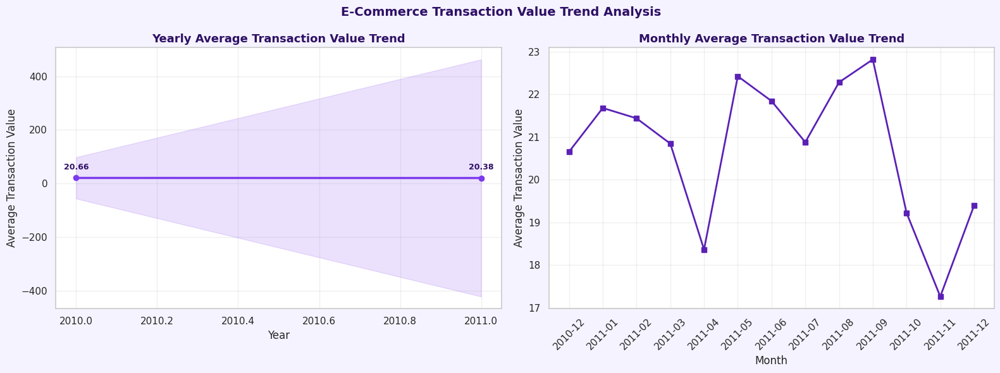

Total growth (avg transaction): -0.27
Average yearly growth         : -0.27


In [ ]:
# ===========================================================================================================================
# E-COMMERCE REVENUE TREND - YEARLY & MONTHLY
# ===========================================================================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ===========================================================================================================================
# DATA PREPARATION
# ===========================================================================================================================
df = df.copy()
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], errors='coerce')
df = df.dropna(subset=['InvoiceDate', 'TotalPrice'])

df['year'] = df['InvoiceDate'].dt.year
df['month'] = df['InvoiceDate'].dt.to_period('M').astype(str)


# ===========================================================================================================================
# YEARLY TREND
# ===========================================================================================================================
yearly = df.groupby('year')['TotalPrice'].agg(['mean', 'sum', 'std']).reset_index()


# ===========================================================================================================================
# MONTHLY TREND
# ===========================================================================================================================
monthly = df.groupby('month')['TotalPrice'].mean().reset_index()
monthly = monthly.sort_values('month')


# ===========================================================================================================================
# STYLE
# ===========================================================================================================================
CLR_PRIMARY = '#7C3AED'
CLR_SECONDARY = '#5B21B6'
CLR_DARK = '#2E1065'


# ===========================================================================================================================
# PLOT
# ===========================================================================================================================
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.patch.set_facecolor('#F5F3FF')


# ===========================================================================================================================
# YEARLY TREND
# ===========================================================================================================================
axes[0].plot(
    yearly['year'],
    yearly['mean'],
    marker='o',
    linewidth=2.5,
    color=CLR_PRIMARY
)

axes[0].fill_between(
    yearly['year'],
    yearly['mean'] - yearly['std'],
    yearly['mean'] + yearly['std'],
    color=CLR_PRIMARY,
    alpha=0.15
)

for _, row in yearly.iterrows():
    axes[0].annotate(
        f"{row['mean']:.2f}",
        (row['year'], row['mean']),
        textcoords='offset points',
        xytext=(0, 10),
        ha='center',
        fontsize=9,
        fontweight='bold',
        color=CLR_DARK
    )

axes[0].set_title(
    'Yearly Average Transaction Value Trend',
    fontsize=13,
    fontweight='bold',
    color=CLR_DARK
)
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Average Transaction Value')
axes[0].grid(alpha=0.3)


# ===========================================================================================================================
# MONTHLY TREND
# ===========================================================================================================================
axes[1].plot(
    monthly['month'],
    monthly['TotalPrice'],
    marker='s',
    linewidth=2,
    color=CLR_SECONDARY
)

axes[1].set_title(
    'Monthly Average Transaction Value Trend',
    fontsize=13,
    fontweight='bold',
    color=CLR_DARK
)
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Average Transaction Value')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(alpha=0.3)

plt.suptitle(
    'E-Commerce Transaction Value Trend Analysis',
    fontsize=14,
    fontweight='bold',
    color=CLR_DARK
)

plt.tight_layout()
plt.savefig('ecommerce_trend_overview.png', dpi=150, bbox_inches='tight')
plt.show()


# ===========================================================================================================================
# SIMPLE INSIGHT METRICS
# ===========================================================================================================================
total_growth = yearly['mean'].iloc[-1] - yearly['mean'].iloc[0]
avg_growth = total_growth / max(len(yearly) - 1, 1)

print(f"Total growth (avg transaction): {total_growth:.2f}")
print(f"Average yearly growth         : {avg_growth:.2f}")

## **📌 Analisis E-Commerce Transaction Value Trend Analysis**

Visualisasi *E-Commerce Transaction Value Trend Analysis* menunjukkan pola perubahan rata-rata nilai transaksi berdasarkan waktu. Pada grafik **Yearly Average Transaction Value Trend**, rata-rata nilai transaksi relatif stabil dengan sedikit penurunan dari sekitar **20,66** pada tahun 2010 menjadi **20,38** pada tahun 2011. Hal ini sejalan dengan nilai **total growth** dan **average yearly growth** sebesar **-0,27**, yang menunjukkan adanya penurunan rata-rata transaksi meskipun tidak signifikan.  

Sementara itu, grafik **Monthly Average Transaction Value Trend** memperlihatkan fluktuasi nilai transaksi sepanjang periode pengamatan. Nilai transaksi rata-rata mencapai puncak pada sekitar **September 2011**, sedangkan penurunan terlihat pada **April** dan terutama **November 2011**. Pola ini menunjukkan bahwa meskipun tren tahunan cenderung stabil, terdapat variasi musiman yang memengaruhi nilai transaksi pada level bulanan.

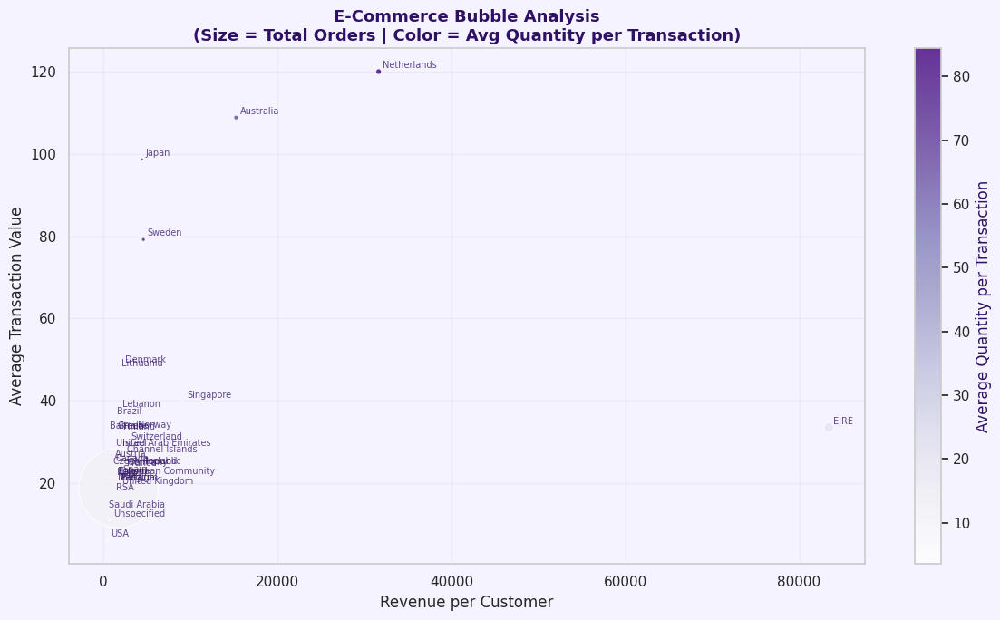


Correlation with Revenue per Customer:
avg_transaction_value         : +0.299 [Weak] █████
avg_quantity                  : +0.279 [Weak] █████
total_revenue                 : +0.003 [Weak] █
total_orders                  : -0.029 [Weak] █
unique_customers              : -0.045 [Weak] █


In [ ]:
# ===========================================================================================================================
# BUBBLE CHART - REVENUE VS CUSTOMER ACTIVITY
# ===========================================================================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

CLR_DARK = '#2E1065'

# ===========================================================================================================================
# DATA PREPARATION
# ===========================================================================================================================
df = df.copy()

df = df.dropna(subset=['Country', 'CustomerID', 'TotalPrice'])

# ===========================================================================================================================
# COUNTRY LEVEL AGGREGATION
# ===========================================================================================================================
merged = df.groupby('Country').agg(
    avg_transaction_value=('TotalPrice', 'mean'),
    total_revenue=('TotalPrice', 'sum'),
    total_orders=('InvoiceNo', 'nunique'),
    unique_customers=('CustomerID', 'nunique'),
    avg_quantity=('Quantity', 'mean')
).reset_index()

merged['revenue_per_customer'] = merged['total_revenue'] / merged['unique_customers']
merged['orders_per_customer'] = merged['total_orders'] / merged['unique_customers']

# ===========================================================================================================================
# BUBBLE CHART
# ===========================================================================================================================
fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_facecolor('#F5F3FF')
ax.set_facecolor('#F5F3FF')

sc = ax.scatter(
    merged['revenue_per_customer'],
    merged['avg_transaction_value'],
    s=merged['total_orders'] / 5,
    c=merged['avg_quantity'],
    cmap='Purples',
    alpha=0.8,
    edgecolors='white',
    linewidth=0.8
)

cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Average Quantity per Transaction', color=CLR_DARK)

# ===========================================================================================================================
# LABEL COUNTRY
# ===========================================================================================================================
for _, row in merged.iterrows():
    ax.annotate(
        row['Country'],
        (row['revenue_per_customer'], row['avg_transaction_value']),
        fontsize=7,
        color=CLR_DARK,
        xytext=(3, 3),
        textcoords='offset points',
        alpha=0.75
    )

# ===========================================================================================================================
# LABELS
# ===========================================================================================================================
ax.set_xlabel('Revenue per Customer')
ax.set_ylabel('Average Transaction Value')

ax.set_title(
    'E-Commerce Bubble Analysis\n'
    '(Size = Total Orders | Color = Avg Quantity per Transaction)',
    fontsize=13,
    fontweight='bold',
    color=CLR_DARK
)

ax.grid(alpha=0.25)

plt.tight_layout()
plt.savefig('ecommerce_bubble_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

# ===========================================================================================================================
# CORRELATION ANALYSIS
# ===========================================================================================================================

corr = merged[[
    'revenue_per_customer',
    'total_revenue',
    'total_orders',
    'unique_customers',
    'avg_transaction_value',
    'avg_quantity'
]].corr()

print("\nCorrelation with Revenue per Customer:")
print("=" * 50)

corr_result = corr['revenue_per_customer'].drop('revenue_per_customer').sort_values(ascending=False)

for var, val in corr_result.items():
    strength = (
        'Strong' if abs(val) >= 0.6
        else 'Moderate' if abs(val) >= 0.3
        else 'Weak'
    )

    bar = '█' * max(1, int(abs(val) * 20))
    print(f"{var:30s}: {val:+.3f} [{strength}] {bar}")

print("=" * 50)

## **Analisis E-Commerce Bubble Analysis**

Visualisasi *E-Commerce Bubble Analysis* menggambarkan hubungan antara **Revenue per Customer** dan **Average Transaction Value**, dengan **ukuran bubble** merepresentasikan **total orders** serta **warna bubble** menunjukkan **average quantity per transaction**. Bubble yang lebih besar menandakan jumlah pesanan yang lebih tinggi, sedangkan **semakin gelap warna ungu menunjukkan rata-rata kuantitas produk per transaksi yang semakin besar**.

Terlihat bahwa **EIRE** memiliki *revenue per customer* tertinggi, meskipun rata-rata nilai transaksinya berada pada tingkat menengah. Sementara itu, negara seperti **Netherlands**, **Australia**, dan **Japan** menunjukkan **average transaction value** yang tinggi, menandakan pelanggan di negara tersebut cenderung melakukan transaksi dengan nilai lebih besar. Variasi ukuran dan warna bubble memperlihatkan bahwa performa e-commerce antarnegara dipengaruhi tidak hanya oleh pendapatan pelanggan, tetapi juga oleh intensitas pesanan serta jumlah produk yang dibeli pada setiap transaksi.

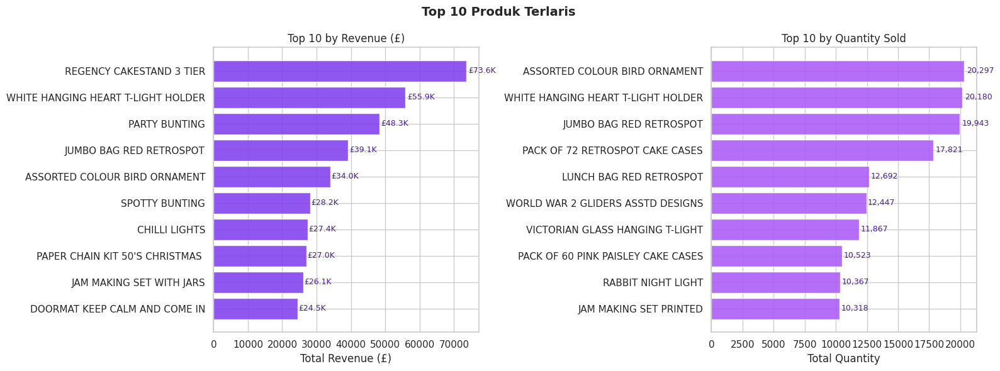

In [ ]:
# ===========================================================================================================================
# VISUALISASI: TOP 10 PRODUK TERLARIS (by Revenue & by Quantity)
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle("Top 10 Produk Terlaris", fontsize=14, fontweight='bold')

# Top 10 by Revenue
top_rev = (df_clean.groupby("Description")["TotalPrice"]
           .sum().sort_values(ascending=False).head(10))

axes[0].barh(top_rev.index[::-1], top_rev.values[::-1],
             color="#7c3aed", edgecolor="white", alpha=0.85)
for i, val in enumerate(top_rev.values[::-1]):
    axes[0].text(val + val*0.01, i, f"£{val/1000:.1f}K",
                 va='center', fontsize=9, color="#4c1d95")
axes[0].set_title("Top 10 by Revenue (£)")
axes[0].set_xlabel("Total Revenue (£)")

# Top 10 by Quantity
top_qty = (df_clean.groupby("Description")["Quantity"]
           .sum().sort_values(ascending=False).head(10))

axes[1].barh(top_qty.index[::-1], top_qty.values[::-1],
             color="#a855f7", edgecolor="white", alpha=0.85)
for i, val in enumerate(top_qty.values[::-1]):
    axes[1].text(val + val*0.01, i, f"{val:,.0f}",
                 va='center', fontsize=9, color="#4c1d95")
axes[1].set_title("Top 10 by Quantity Sold")
axes[1].set_xlabel("Total Quantity")

plt.tight_layout()
plt.show()

## **📚 Top 10 Produk Terlaris**

Visualisasi *Top 10 Produk Terlaris* membandingkan performa produk berdasarkan **total revenue (£)** dan **jumlah unit terjual**. Grafik kiri menunjukkan bahwa **REGENCY CAKESTAND 3 TIER** menghasilkan pendapatan tertinggi sebesar sekitar **£73.6K**, diikuti **WHITE HANGING HEART T-LIGHT HOLDER** dan **PARTY BUNTING**.

Sementara itu, grafik kanan menunjukkan bahwa **ASSORTED COLOUR BIRD ORNAMENT** menjadi produk dengan jumlah penjualan tertinggi sebanyak **20.297 unit**, diikuti **WHITE HANGING HEART T-LIGHT HOLDER** dan **JUMBO BAG RED RETROSPOT**. Perbedaan hasil pada kedua grafik menunjukkan bahwa produk dengan penjualan terbanyak tidak selalu menghasilkan revenue tertinggi, karena nilai pendapatan juga dipengaruhi oleh harga dan nilai transaksi produk.

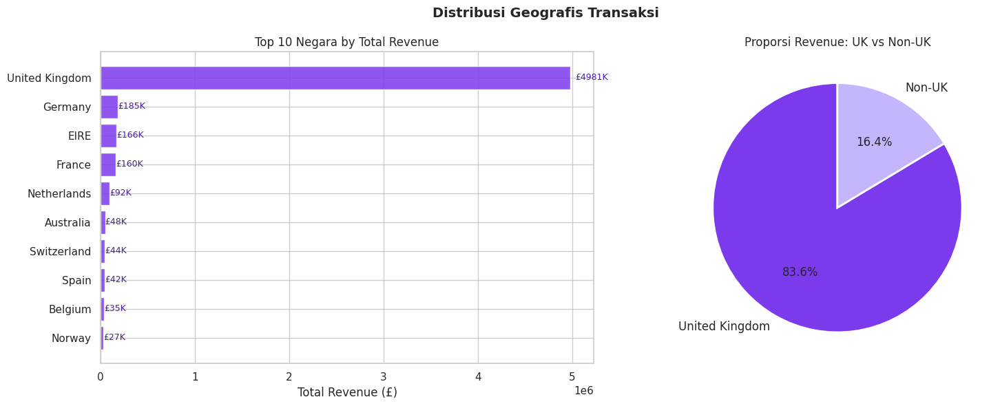

In [ ]:
# ===========================================================================================================================
# VISUALISASI: TOTAL REVENUE PER NEGARA (Top 10) + Proporsi UK vs Non-UK
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle("Distribusi Geografis Transaksi", fontsize=14, fontweight='bold')

# Top 10 negara by total revenue
top_country = (df_clean.groupby("Country")["TotalPrice"]
               .sum().sort_values(ascending=False).head(10))

axes[0].barh(top_country.index[::-1], top_country.values[::-1],
             color="#7c3aed", edgecolor="white", alpha=0.85)
for i, val in enumerate(top_country.values[::-1]):
    axes[0].text(val + val*0.01, i, f"£{val/1000:.0f}K",
                 va='center', fontsize=9, color="#4c1d95")
axes[0].set_title("Top 10 Negara by Total Revenue")
axes[0].set_xlabel("Total Revenue (£)")

# Proporsi UK vs Non-UK
uk_rev    = df_clean[df_clean["Country"] == "United Kingdom"]["TotalPrice"].sum()
nonuk_rev = df_clean[df_clean["Country"] != "United Kingdom"]["TotalPrice"].sum()

axes[1].pie([uk_rev, nonuk_rev],
            labels=["United Kingdom", "Non-UK"],
            colors=["#7c3aed", "#c4b5fd"],
            autopct="%1.1f%%", startangle=90,
            wedgeprops=dict(edgecolor="white", linewidth=2),
            textprops={"fontsize": 12})
axes[1].set_title("Proporsi Revenue: UK vs Non-UK")

plt.tight_layout()
plt.show()

## **🚀 Distribusi Geografis Transaksi**

Visualisasi *Distribusi Geografis Transaksi* menunjukkan bahwa **United Kingdom** mendominasi total revenue e-commerce dengan pendapatan sekitar **£4.98M**, jauh lebih tinggi dibanding negara lain seperti **Germany** dan **EIRE**. Grafik pie juga memperlihatkan bahwa sekitar **83.6%** revenue berasal dari UK, sedangkan **16.4%** berasal dari negara non-UK. Temuan ini menunjukkan bahwa aktivitas transaksi dan kontribusi pendapatan masih sangat terpusat di pasar UK.

# **4️⃣ K-Means Clustering**

In [ ]:
# ===========================================================================================================================
# TAHAP 4 - MODELING & ANALYSIS: K-MEANS CLUSTERING (RFM)
# ===========================================================================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
from collections import Counter

sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

CLR_PRIMARY      = "#7c3aed"
CLR_DARK         = "#4c1d95"
CLR_MID          = "#a855f7"
CLR_SOFT         = "#c4b5fd"
CLR_BG           = "#f5f3ff"
CLUSTER_COLORS   = ["#7c3aed", "#f59e0b", "#10b981", "#ef4444", "#3b82f6", "#ec4899", "#14b8a6", "#f97316"]

In [ ]:
# ===========================================================================================================================
# STEP 1 - PERSIAPAN DATA RFM
# ===========================================================================================================================

print("="*60)
print("STEP 1: PERSIAPAN DATA RFM")
print("="*60)

# ── 1A. Hitung TotalPrice ─────────────────────────────────────────────────────
df_clean["TotalPrice"] = df_clean["Quantity"] * df_clean["UnitPrice"]

# ── 1B. Tentukan Reference Date ───────────────────────────────────────────────
reference_date = df_clean["InvoiceDate"].max() + pd.Timedelta(days=1)
print(f"  Reference date : {reference_date.date()}")

# ── 1C. Agregasi RFM per CustomerID ──────────────────────────────────────────
rfm = df_clean.groupby("CustomerID").agg(
    Recency   = ("InvoiceDate",  lambda x: (reference_date - x.max()).days),
    Frequency = ("InvoiceNo",    "nunique"),
    Monetary  = ("TotalPrice",   "sum")
).reset_index()

print(f"  Jumlah pelanggan unik : {len(rfm):,}")
print(f"\n  Statistik RFM (raw):")
display(rfm[["Recency","Frequency","Monetary"]].describe().round(2))

STEP 1: PERSIAPAN DATA RFM
  Reference date : 2011-12-10
  Jumlah pelanggan unik : 4,338

  Statistik RFM (raw):


,Recency,Frequency,Monetary
count,4338.00,4338.00,4338.00
mean,92.54,4.27,1372.98
std,100.01,7.70,3500.44
min,1.00,1.00,3.75
25%,18.00,1.00,259.35
50%,51.00,2.00,575.38
75%,142.00,5.00,1403.59
max,374.00,209.00,113620.21


## **📌 Persiapan Data RFM**

Tahap *Persiapan Data RFM* dilakukan dengan menggunakan **tanggal referensi 10 Desember 2011** dan mencakup **4.338 pelanggan unik**. Statistik menunjukkan bahwa rata-rata **Recency** pelanggan sebesar **92,54 hari**, **Frequency** sebesar **4,27 transaksi**, dan **Monetary** sebesar **£1.372,98**. Nilai median yang lebih rendah dibanding rata-rata, terutama pada variabel *Monetary*, menunjukkan adanya distribusi yang tidak merata dengan sebagian kecil pelanggan memiliki nilai belanja sangat tinggi. Hal ini mengindikasikan adanya variasi perilaku pelanggan yang cukup besar dan mendukung penggunaan analisis RFM untuk segmentasi pelanggan.

In [ ]:
# ===========================================================================================================================
# STEP 2 - IQR OUTLIER TREATMENT pada RFM
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 2: IQR OUTLIER TREATMENT pada RFM")
print("="*60)

def remove_outliers_iqr(df, col):
    Q1    = df[col].quantile(0.25)
    Q3    = df[col].quantile(0.75)
    IQR   = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    mask  = (df[col] >= lower) & (df[col] <= upper)
    n_removed = (~mask).sum()
    print(f"  {col:10s} | Q1={Q1:.2f} Q3={Q3:.2f} IQR={IQR:.2f} "
          f"| batas [{lower:.2f}, {upper:.2f}] "
          f"| dihapus: {n_removed:,} baris")
    return df[mask].copy()

rfm_clean = rfm.copy()
for col in ["Recency", "Frequency", "Monetary"]:
    rfm_clean = remove_outliers_iqr(rfm_clean, col)

print(f"\n  Pelanggan sebelum  : {len(rfm):,}")
print(f"  Pelanggan sesudah  : {len(rfm_clean):,}")
print(f"  Dihapus            : {len(rfm) - len(rfm_clean):,} "
      f"({(len(rfm)-len(rfm_clean))/len(rfm)*100:.1f}%)")

rfm = rfm_clean.copy()


STEP 2: IQR OUTLIER TREATMENT pada RFM
  Recency    | Q1=18.00 Q3=142.00 IQR=124.00 | batas [-168.00, 328.00] | dihapus: 155 baris
  Frequency  | Q1=1.00 Q3=5.00 IQR=4.00 | batas [-5.00, 11.00] | dihapus: 284 baris
  Monetary   | Q1=255.62 Q3=1194.99 IQR=939.38 | batas [-1153.45, 2604.05] | dihapus: 282 baris

  Pelanggan sebelum  : 4,338
  Pelanggan sesudah  : 3,617
  Dihapus            : 721 (16.6%)


## **🎯 IQR Outlier Treatment pada RFM**

Proses *IQR Outlier Treatment* dilakukan untuk mengurangi pengaruh data ekstrem pada variabel **Recency, Frequency,** dan **Monetary**. Berdasarkan metode *Interquartile Range (IQR)*, terdeteksi dan dihapus **155 outlier pada Recency**, **284 pada Frequency**, dan **282 pada Monetary**. Setelah proses pembersihan data, jumlah pelanggan berkurang dari **4.338 menjadi 3.617 pelanggan**, sehingga total **721 pelanggan (16,6%)** dihapus. Langkah ini membantu menghasilkan distribusi data yang lebih stabil dan representatif untuk analisis segmentasi pelanggan berikutnya.


STEP 3: LOG-TRANSFORMATION RFM


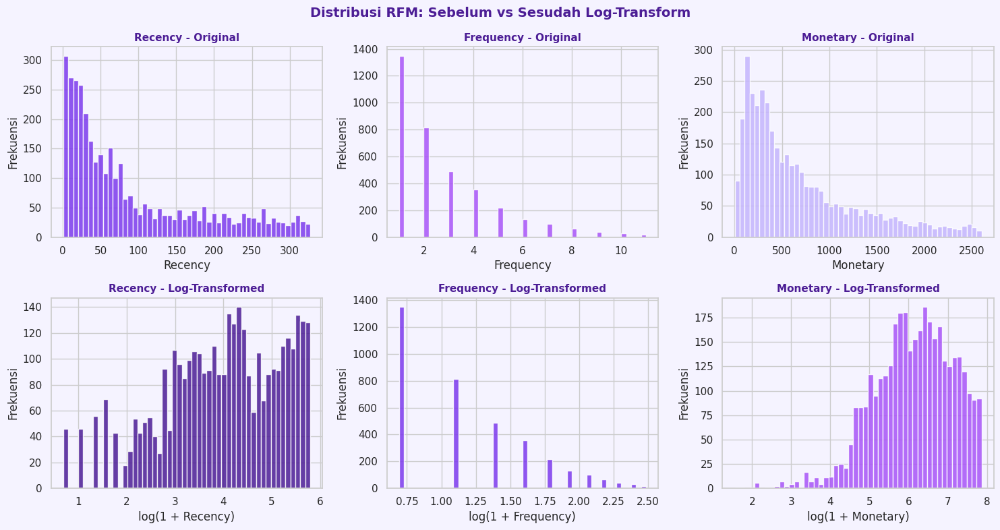

  Log-transform selesai. Kolom Log_Recency, Log_Frequency, Log_Monetary ditambahkan.


In [ ]:
# ===========================================================================================================================
# STEP 3 - DISTRIBUSI RFM SEBELUM & SESUDAH LOG-TRANSFORM
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 3: LOG-TRANSFORMATION RFM")
print("="*60)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
fig.patch.set_facecolor(CLR_BG)
fig.suptitle("Distribusi RFM: Sebelum vs Sesudah Log-Transform",
             fontsize=14, fontweight='bold', color=CLR_DARK)

rfm_cols   = ["Recency", "Frequency", "Monetary"]
clr_before = [CLR_PRIMARY, CLR_MID, CLR_SOFT]
clr_after  = [CLR_DARK,   CLR_PRIMARY, CLR_MID]

for i, col in enumerate(rfm_cols):
    # Sebelum
    axes[0, i].set_facecolor(CLR_BG)
    axes[0, i].hist(rfm[col], bins=50, color=clr_before[i], edgecolor="white", alpha=0.85)
    axes[0, i].set_title(f"{col} - Original", fontsize=11, fontweight='bold', color=CLR_DARK)
    axes[0, i].set_xlabel(col)
    axes[0, i].set_ylabel("Frekuensi")

    # Log-transform
    rfm[f"Log_{col}"] = np.log1p(rfm[col])

    # Sesudah
    axes[1, i].set_facecolor(CLR_BG)
    axes[1, i].hist(rfm[f"Log_{col}"], bins=50, color=clr_after[i], edgecolor="white", alpha=0.85)
    axes[1, i].set_title(f"{col} - Log-Transformed", fontsize=11, fontweight='bold', color=CLR_DARK)
    axes[1, i].set_xlabel(f"log(1 + {col})")
    axes[1, i].set_ylabel("Frekuensi")

plt.tight_layout()
plt.show()

print("  Log-transform selesai. Kolom Log_Recency, Log_Frequency, Log_Monetary ditambahkan.")

## **💻 Distribusi RFM: Sebelum vs Sesudah Log-Transform**

Visualisasi menunjukkan perbandingan distribusi **Recency, Frequency,** dan **Monetary** sebelum dan sesudah *log-transformation*. Pada data asli, ketiga variabel cenderung memiliki distribusi **right-skewed** dengan konsentrasi nilai pada rentang rendah dan ekor panjang pada nilai tinggi, terutama pada variabel **Monetary**. Setelah dilakukan transformasi log, distribusi menjadi lebih seimbang dan mendekati normal sehingga variasi data ekstrem dapat dikurangi. Transformasi ini membantu meningkatkan stabilitas data dan membuat proses analisis serta segmentasi pelanggan menjadi lebih akurat.

In [ ]:
# ===========================================================================================================================
# STEP 4 - STANDARDISASI (StandardScaler)
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 4: STANDARDISASI - StandardScaler")
print("="*60)

scaler      = StandardScaler()
log_features = rfm[["Log_Recency", "Log_Frequency", "Log_Monetary"]].values
rfm_scaled  = scaler.fit_transform(log_features)
rfm_scaled  = pd.DataFrame(rfm_scaled,
                            columns=["Recency_scaled", "Frequency_scaled", "Monetary_scaled"],
                            index=rfm.index)

print("  Statistik setelah scaling (mean ≈ 0, std ≈ 1):")
display(rfm_scaled.describe().round(3))


STEP 4: STANDARDISASI - StandardScaler
  Statistik setelah scaling (mean ≈ 0, std ≈ 1):


,Recency_scaled,Frequency_scaled,Monetary_scaled
count,3617.000,3617.000,3617.000
mean,0.000,0.000,0.000
std,1.000,1.000,1.000
min,-2.651,-1.023,-4.538
25%,-0.659,-1.023,-0.647
50%,0.109,-0.184,0.063
75%,0.848,0.872,0.751
max,1.508,2.684,1.734


## **🤖 Standardisasi dengan StandardScaler**

Tahap *standardisasi* menggunakan **StandardScaler** dilakukan untuk menyamakan skala variabel **Recency, Frequency,** dan **Monetary** sebelum analisis lanjutan. Hasil scaling menunjukkan bahwa seluruh variabel memiliki **rata-rata mendekati 0** dan **standar deviasi sekitar 1**, sehingga perbedaan skala antar variabel dapat diminimalkan. Proses ini penting agar setiap komponen RFM memiliki kontribusi yang seimbang dan tidak mendominasi proses segmentasi pelanggan.


STEP 5: ELBOW METHOD - WCSS vs k
  k=2  WCSS=5,764.65
  k=3  WCSS=4,629.40
  k=4  WCSS=3,650.94
  k=5  WCSS=3,116.53
  k=6  WCSS=2,752.92
  k=7  WCSS=2,458.52
  k=8  WCSS=2,254.24
  k=9  WCSS=2,073.32
  k=10  WCSS=1,914.35


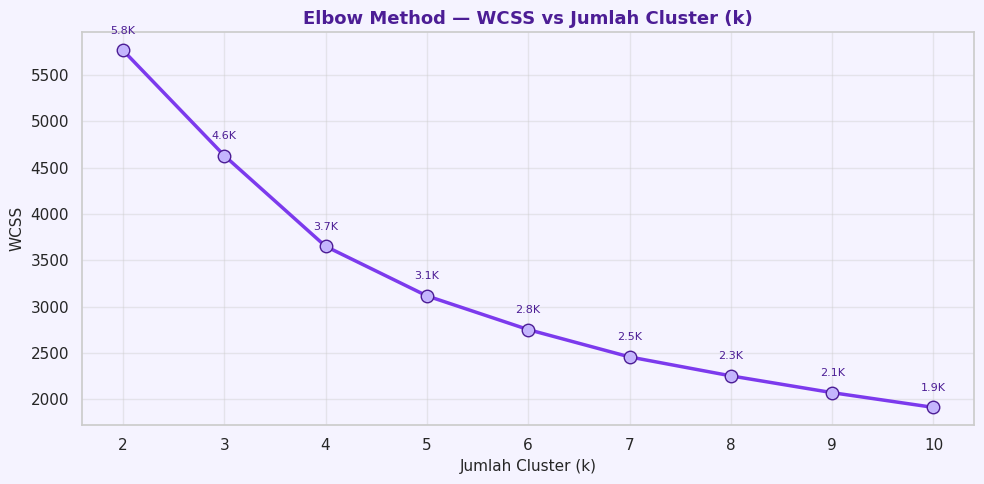

In [ ]:
# ===========================================================================================================================
# STEP 5 - ELBOW METHOD (WCSS)
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 5: ELBOW METHOD - WCSS vs k")
print("="*60)

K_RANGE   = range(2, 11)
wcss_list = []

for k in K_RANGE:
    km = KMeans(n_clusters=k, init="k-means++", n_init=10, random_state=42)
    km.fit(rfm_scaled)
    wcss_list.append(km.inertia_)
    print(f"  k={k}  WCSS={km.inertia_:,.2f}")

# ── Plot Elbow ────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 5))
fig.patch.set_facecolor(CLR_BG)
ax.set_facecolor(CLR_BG)

ax.plot(list(K_RANGE), wcss_list, marker='o', color=CLR_PRIMARY,
        linewidth=2.5, markersize=9,
        markerfacecolor=CLR_SOFT, markeredgecolor=CLR_DARK)

for k, wcss in zip(K_RANGE, wcss_list):
    ax.annotate(f"{wcss/1000:.1f}K", (k, wcss),
                textcoords="offset points", xytext=(0, 12),
                ha='center', fontsize=8, color=CLR_DARK)

ax.set_title("Elbow Method — WCSS vs Jumlah Cluster (k)",
             fontsize=13, fontweight='bold', color=CLR_DARK)
ax.set_xlabel("Jumlah Cluster (k)", fontsize=11)
ax.set_ylabel("WCSS", fontsize=11)
ax.set_xticks(list(K_RANGE))
ax.grid(True, alpha=0.4)
plt.tight_layout()
plt.show()

## **🎯 Elbow Method - Penentuan Jumlah Cluster**

Metode **Elbow** digunakan untuk menentukan jumlah cluster (*k*) yang optimal dengan melihat perubahan nilai **WCSS (Within Cluster Sum of Squares)**. Grafik menunjukkan bahwa nilai WCSS menurun seiring bertambahnya jumlah cluster, namun penurunan mulai melambat setelah **k = 4**. Titik ini membentuk pola *elbow* yang mengindikasikan bahwa penggunaan **4 cluster** sudah cukup optimal dalam mengelompokkan pelanggan, karena penambahan cluster setelahnya hanya memberikan penurunan WCSS yang relatif kecil.


STEP 6: METRIK VALIDASI CLUSTER per k
  k=2  Silhouette=0.3999  CH=3,189.64  DB=0.9707
  k=3  Silhouette=0.2879  CH=2,428.51  DB=1.1948
  k=4  Silhouette=0.3124  CH=2,375.10  DB=1.0254
  k=5  Silhouette=0.2812  CH=2,241.05  DB=1.0943
  k=6  Silhouette=0.2816  CH=2,124.47  DB=1.0266
  k=7  Silhouette=0.2744  CH=2,053.88  DB=1.0271
  k=8  Silhouette=0.2753  CH=1,966.21  DB=1.0483
  k=9  Silhouette=0.2827  CH=1,909.37  DB=1.0308
  k=10  Silhouette=0.2823  CH=1,870.94  DB=1.0504


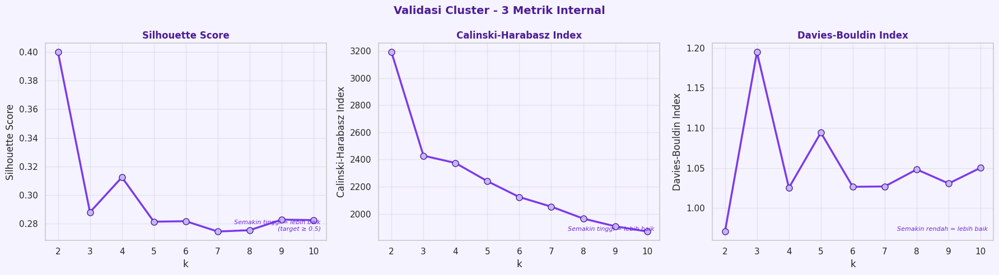

In [ ]:
# ===========================================================================================================================
# STEP 6 - SILHOUETTE, CALINSKI-HARABASZ, DAVIES-BOULDIN per k
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 6: METRIK VALIDASI CLUSTER per k")
print("="*60)

sil_scores = []
ch_scores  = []
db_scores  = []

for k in K_RANGE:
    km     = KMeans(n_clusters=k, init="k-means++", n_init=10, random_state=42)
    labels = km.fit_predict(rfm_scaled)
    sil    = silhouette_score(rfm_scaled, labels)
    ch     = calinski_harabasz_score(rfm_scaled, labels)
    db     = davies_bouldin_score(rfm_scaled, labels)
    sil_scores.append(sil)
    ch_scores.append(ch)
    db_scores.append(db)
    print(f"  k={k}  Silhouette={sil:.4f}  CH={ch:,.2f}  DB={db:.4f}")

# ── Plot 3 Metrik ─────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.patch.set_facecolor(CLR_BG)
fig.suptitle("Validasi Cluster - 3 Metrik Internal",
             fontsize=14, fontweight='bold', color=CLR_DARK)

metrics_info = [
    (sil_scores, "Silhouette Score",        "Semakin tinggi = lebih baik\n(target ≥ 0.5)"),
    (ch_scores,  "Calinski-Harabasz Index", "Semakin tinggi = lebih baik"),
    (db_scores,  "Davies-Bouldin Index",    "Semakin rendah = lebih baik"),
]

for ax, (scores, title, note) in zip(axes, metrics_info):
    ax.set_facecolor(CLR_BG)
    ax.plot(list(K_RANGE), scores, marker='o', color=CLR_PRIMARY,
            linewidth=2.5, markersize=8,
            markerfacecolor=CLR_SOFT, markeredgecolor=CLR_DARK)
    ax.set_title(title, fontsize=12, fontweight='bold', color=CLR_DARK)
    ax.set_xlabel("k")
    ax.set_ylabel(title)
    ax.set_xticks(list(K_RANGE))
    ax.text(0.98, 0.05, note, transform=ax.transAxes,
            fontsize=8, color="#6d28d9", ha='right', style='italic')
    ax.grid(True, alpha=0.4)

plt.tight_layout()
plt.show()

## **📍 Validasi Cluster dengan 3 Metrik Internal**

Validasi cluster dilakukan menggunakan **Silhouette Score**, **Calinski-Harabasz (CH) Index**, dan **Davies-Bouldin (DB) Index** untuk mengevaluasi kualitas pengelompokan pelanggan. Nilai terbaik secara umum terlihat pada **k = 2** dengan **Silhouette tertinggi (0,3999)**, **CH Index terbesar (3.189,64)**, serta **DB Index terendah (0,9707)** yang menunjukkan cluster paling terpisah dan kompak. Namun, **k = 4** tetap dipertimbangkan sebagai jumlah cluster yang optimal karena memberikan keseimbangan antara kualitas cluster dan interpretasi segmentasi pelanggan yang lebih informatif.

In [ ]:
# ===========================================================================================================================
# STEP 7 - PEMILIHAN k OPTIMAL (Majority Voting)
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 7: PEMILIHAN k OPTIMAL - Majority Voting")
print("="*60)

best_sil_idx = max(range(len(sil_scores)), key=lambda i: sil_scores[i])
best_ch_idx  = max(range(len(ch_scores)),  key=lambda i: ch_scores[i])
best_db_idx  = min(range(len(db_scores)),  key=lambda i: db_scores[i])

k_sil = list(K_RANGE)[best_sil_idx]
k_ch  = list(K_RANGE)[best_ch_idx]
k_db  = list(K_RANGE)[best_db_idx]

print(f"  Silhouette terbaik       → k={k_sil}  ({sil_scores[best_sil_idx]:.4f})")
print(f"  Calinski-Harabasz terbaik→ k={k_ch}  ({ch_scores[best_ch_idx]:,.2f})")
print(f"  Davies-Bouldin terbaik   → k={k_db}  ({db_scores[best_db_idx]:.4f})")

votes     = Counter([k_sil, k_ch, k_db])
K_OPTIMAL = votes.most_common(1)[0][0]

if len(votes) == 3:
    # Semua berbeda → pakai Silhouette sebagai tiebreaker
    K_OPTIMAL = k_sil
    print(f"\n  Semua metrik berbeda → tiebreaker Silhouette → k={K_OPTIMAL}")
else:
    print(f"\n  Majority voting → k={K_OPTIMAL}  (votes: {dict(votes)})")

# ── Update plot dengan highlight k optimal ────────────────────────────────────
idx_opt  = list(K_RANGE).index(K_OPTIMAL)
sil_opt  = sil_scores[idx_opt]
ch_opt   = ch_scores[idx_opt]
db_opt   = db_scores[idx_opt]
wcss_opt = wcss_list[idx_opt]

# Tabel ringkasan
validation_df = pd.DataFrame({
    "k"                 : list(K_RANGE),
    "WCSS"              : [round(w, 2) for w in wcss_list],
    "Silhouette Score"  : [round(s, 4) for s in sil_scores],
    "Calinski-Harabasz" : [round(c, 2) for c in ch_scores],
    "Davies-Bouldin"    : [round(d, 4) for d in db_scores],
})

def highlight_rows(row):
    if row["k"] == K_OPTIMAL:
        return ['background-color: #ede9fe; font-weight: bold; color: #4c1d95'] * len(row)
    elif row["k"] in [k_sil, k_ch, k_db]:
        return ['background-color: #fef9c3'] * len(row)
    return [''] * len(row)

print(f"\n  Tabel Validasi (ungu = k optimal, kuning = terbaik salah satu metrik):")
display(validation_df.style.apply(highlight_rows, axis=1))

print(f"\n  ✅ K_OPTIMAL = {K_OPTIMAL}")
print(f"     Silhouette     : {sil_opt:.4f}  {'✅ ≥ 0.5' if sil_opt >= 0.5 else '⚠️ < 0.5'}")
print(f"     Calinski-Harabasz : {ch_opt:,.2f}")
print(f"     Davies-Bouldin : {db_opt:.4f}")
print(f"     WCSS           : {wcss_opt:,.2f}")


STEP 7: PEMILIHAN k OPTIMAL - Majority Voting
  Silhouette terbaik       → k=2  (0.3999)
  Calinski-Harabasz terbaik→ k=2  (3,189.64)
  Davies-Bouldin terbaik   → k=2  (0.9707)

  Majority voting → k=2  (votes: {2: 3})

  Tabel Validasi (ungu = k optimal, kuning = terbaik salah satu metrik):


,k,WCSS,Silhouette Score,Calinski-Harabasz,Davies-Bouldin
0,2,5764.650000,0.399900,3189.640000,0.970700
1,3,4629.400000,0.287900,2428.510000,1.194800
2,4,3650.940000,0.312400,2375.100000,1.025400
3,5,3116.530000,0.281200,2241.050000,1.094300
4,6,2752.920000,0.281600,2124.470000,1.026600
5,7,2458.520000,0.274400,2053.880000,1.027100
6,8,2254.240000,0.275300,1966.210000,1.048300
7,9,2073.320000,0.282700,1909.370000,1.030800
8,10,1914.350000,0.282300,1870.940000,1.050400



  ✅ K_OPTIMAL = 2
     Silhouette     : 0.3999  ⚠️ < 0.5
     Calinski-Harabasz : 3,189.64
     Davies-Bouldin : 0.9707
     WCSS           : 5,764.65


## **💻 Pemilihan Jumlah Cluster Optimal**

Pemilihan jumlah cluster optimal dilakukan menggunakan metode **majority voting** berdasarkan tiga metrik validasi internal, yaitu **Silhouette Score**, **Calinski-Harabasz Index**, dan **Davies-Bouldin Index**. Seluruh metrik menunjukkan hasil terbaik pada **k = 2**, sehingga dipilih sebagai **cluster optimal** dengan **Silhouette Score 0,3999**, **CH Index 3.189,64**, dan **DB Index 0,9707**. Meskipun nilai *Silhouette* masih berada di bawah 0,5 yang menunjukkan pemisahan cluster belum sangat kuat, hasil ini tetap menunjukkan bahwa **dua cluster** memberikan kualitas pengelompokan paling baik dibanding jumlah cluster lainnya.

In [ ]:
# ===========================================================================================================================
# STEP 8 - FITTING K-MEANS FINAL
# ===========================================================================================================================

print("\n" + "="*60)
print(f"STEP 8: FITTING K-MEANS FINAL - k={K_OPTIMAL}")
print("="*60)

kmeans_final       = KMeans(n_clusters=K_OPTIMAL, init="k-means++",
                             n_init=20, max_iter=500, random_state=42)
rfm["Cluster"]     = kmeans_final.fit_predict(rfm_scaled)

print(f"  Inertia (WCSS)   : {kmeans_final.inertia_:,.2f}")
print(f"  Iterasi          : {kmeans_final.n_iter_}")

cluster_counts = rfm["Cluster"].value_counts().sort_index()
print(f"\n  Distribusi anggota:")
for c, n in cluster_counts.items():
    print(f"    Cluster {c} : {n:,} pelanggan ({n/len(rfm)*100:.1f}%)")


STEP 8: FITTING K-MEANS FINAL - k=2
  Inertia (WCSS)   : 5,764.64
  Iterasi          : 6

  Distribusi anggota:
    Cluster 0 : 1,540 pelanggan (42.6%)
    Cluster 1 : 2,077 pelanggan (57.4%)


## **📌 Fitting K-Means Final (k = 2)**

Model **K-Means** final dijalankan menggunakan **k = 2** sebagai jumlah cluster optimal. Hasil fitting menunjukkan nilai **inertia (WCSS) sebesar 5.764,64** dengan proses konvergen dalam **6 iterasi**. Distribusi anggota cluster memperlihatkan bahwa **Cluster 0** terdiri dari **1.540 pelanggan (42,6%)**, sedangkan **Cluster 1** mencakup **2.077 pelanggan (57,4%)**. Pembagian ini menunjukkan bahwa pelanggan terbagi relatif seimbang ke dalam dua kelompok utama dengan karakteristik perilaku yang berbeda.

In [ ]:
# ===========================================================================================================================
# STEP 9 - PROFILING & PEMBERIAN LABEL BISNIS
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 9: PROFILING & LABEL BISNIS")
print("="*60)

cluster_means = rfm.groupby("Cluster")[["Recency", "Frequency", "Monetary"]].mean().round(2)
cluster_means["Count"]  = rfm.groupby("Cluster")["Recency"].count()
cluster_means["Pct(%)"] = (cluster_means["Count"] / len(rfm) * 100).round(1)

print("  Rata-rata RFM per Cluster:")
display(cluster_means)

# ── Ranking untuk menentukan label ───────────────────────────────────────────
cm = cluster_means[["Recency", "Frequency", "Monetary"]].copy()
cm["R_rank"] = cm["Recency"].rank(ascending=True)    # kecil = lebih baru = bagus
cm["F_rank"] = cm["Frequency"].rank(ascending=False) # besar = lebih sering = bagus
cm["M_rank"] = cm["Monetary"].rank(ascending=False)  # besar = lebih boros = bagus
cm["Score"]  = cm["R_rank"] + cm["F_rank"] + cm["M_rank"]

sorted_clusters = cm["Score"].sort_values().index.tolist()

# Label sesuai jumlah cluster
SEGMENT_LABELS_ALL = [
    "Champion",
    "Loyal Customer",
    "At-Risk",
    "New Customer",
    "Hibernating",
    "Potential Loyalist",
    "Lost",
    "Promising",
]

LABEL_MAP = {c: SEGMENT_LABELS_ALL[i] for i, c in enumerate(sorted_clusters)}
rfm["Segment"] = rfm["Cluster"].map(LABEL_MAP)

print(f"\n  Mapping label:")
for c, label in LABEL_MAP.items():
    row = cluster_means.loc[c]
    print(f"    Cluster {c} → {label:20s} | "
          f"R={row['Recency']:.1f}d  "
          f"F={row['Frequency']:.1f}x  "
          f"M=£{row['Monetary']:.1f}")

print(f"\n  Distribusi segmen:")
for seg, n in rfm["Segment"].value_counts().items():
    print(f"    {seg:20s}: {n:,} ({n/len(rfm)*100:.1f}%)")

# Urutan segmen untuk plotting (sesuai K_OPTIMAL)
seg_order  = [LABEL_MAP[c] for c in sorted_clusters]
palette    = {seg: CLUSTER_COLORS[i % len(CLUSTER_COLORS)]
              for i, seg in enumerate(seg_order)}

# Hitung semua metrik evaluasi
silhouette_avg = silhouette_score(rfm_scaled, kmeans_final.labels_)
calinski_harabasz = calinski_harabasz_score(rfm_scaled, kmeans_final.labels_)
davies_bouldin = davies_bouldin_score(rfm_scaled, kmeans_final.labels_)

print("\n  Metrik Evaluasi Clustering")
print(f"    Silhouette Score        : {silhouette_avg:.3f} (target ≥ 0.50)")
print(f"    Calinski-Harabasz Index : {calinski_harabasz:.2f} (semakin tinggi semakin baik)")
print(f"    Davies-Bouldin Index    : {davies_bouldin:.3f} (semakin rendah semakin baik)")

# Interpretasi
print("\n  Interpretasi")
if silhouette_avg >= 0.5:
    print(f"    ✓ Silhouette Score {silhouette_avg:.3f} menunjukkan kualitas clustering BAIK")
else:
    print(f"    ⚠ Silhouette Score {silhouette_avg:.3f} menunjukkan kualitas clustering CUKUP")

print(f"    • CH Index: Rasio variance between/within cluster = {calinski_harabasz:.2f}")
print(f"    • DB Index: Rata-rata similarity antar cluster = {davies_bouldin:.3f}")


STEP 9: PROFILING & LABEL BISNIS
  Rata-rata RFM per Cluster:


,Recency,Frequency,Monetary,Count,Pct(%)
Cluster,,,,,
0,38.19,4.45,1177.04,1540,42.6
1,131.88,1.44,333.77,2077,57.4



  Mapping label:
    Cluster 0 → Champion             | R=38.2d  F=4.5x  M=£1177.0
    Cluster 1 → Loyal Customer       | R=131.9d  F=1.4x  M=£333.8

  Distribusi segmen:
    Loyal Customer      : 2,077 (57.4%)
    Champion            : 1,540 (42.6%)

  Metrik Evaluasi Clustering
    Silhouette Score        : 0.400 (target ≥ 0.50)
    Calinski-Harabasz Index : 3189.65 (semakin tinggi semakin baik)
    Davies-Bouldin Index    : 0.971 (semakin rendah semakin baik)

  Interpretasi
    ⚠ Silhouette Score 0.400 menunjukkan kualitas clustering CUKUP
    • CH Index: Rasio variance between/within cluster = 3189.65
    • DB Index: Rata-rata similarity antar cluster = 0.971


## **🎯 Profiling Cluster dan Label Bisnis**

Hasil *profiling* menunjukkan adanya dua segmen pelanggan dengan karakteristik RFM yang berbeda. **Cluster 0** diberi label **Champion** karena memiliki **Recency rendah (38,2 hari)**, **Frequency tinggi (4,5 transaksi)**, dan **Monetary besar (£1.177)**, yang menunjukkan pelanggan aktif dengan kontribusi belanja tinggi. Sementara itu, **Cluster 1** diberi label **Loyal Customer** dengan **Recency lebih tinggi (131,9 hari)**, **Frequency lebih rendah (1,4 transaksi)**, dan **Monetary sebesar £333,8**, mencerminkan pelanggan yang masih berkontribusi namun kurang aktif dibanding segmen Champion.

Distribusi pelanggan menunjukkan bahwa **Loyal Customer** mendominasi sebanyak **57,4%**, sedangkan **Champion** mencakup **42,6%** pelanggan. Dari sisi evaluasi, model menghasilkan **Silhouette Score 0,400**, **Calinski-Harabasz Index 3189,65**, dan **Davies-Bouldin Index 0,971**. Nilai ini menunjukkan kualitas clustering berada pada kategori **cukup baik**, dengan pemisahan cluster yang cukup jelas meskipun masih terdapat potensi overlap antar segmen.

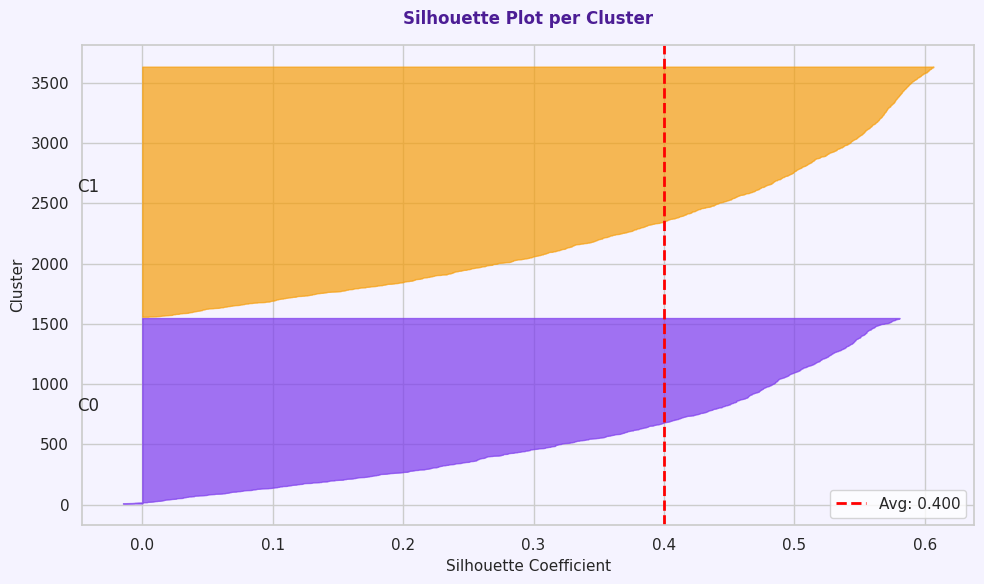

In [ ]:
# Visualisasi silhouette per cluster
from sklearn.metrics import silhouette_samples

silhouette_vals = silhouette_samples(rfm_scaled, kmeans_final.labels_)

fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_facecolor(CLR_BG)
ax.set_facecolor(CLR_BG)

y_lower = 10
for i in range(K_OPTIMAL):
    cluster_silhouette_vals = silhouette_vals[kmeans_final.labels_ == i]
    cluster_silhouette_vals.sort()

    size_cluster_i = cluster_silhouette_vals.shape[0]
    y_upper = y_lower + size_cluster_i

    color = CLUSTER_COLORS[i % len(CLUSTER_COLORS)]
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette_vals,
                     facecolor=color, edgecolor=color, alpha=0.7)

    ax.text(-0.05, y_lower + 0.5 * size_cluster_i, f'C{i}')
    y_lower = y_upper + 10

ax.axvline(x=silhouette_avg, color='red', linestyle='--', linewidth=2, label=f'Avg: {silhouette_avg:.3f}')
ax.set_xlabel('Silhouette Coefficient', fontsize=11)
ax.set_ylabel('Cluster', fontsize=11)
ax.set_title('Silhouette Plot per Cluster', fontsize=12, fontweight='bold', color=CLR_DARK, pad=15)
ax.legend()
plt.tight_layout()
plt.show()

## **📌 Silhouette Plot per Cluster**

Visualisasi *Silhouette Plot* digunakan untuk mengevaluasi kualitas hasil clustering K-Means dengan melihat seberapa baik setiap pelanggan ditempatkan dalam cluster masing-masing. Nilai *silhouette coefficient* berada pada rentang -1 hingga 1, di mana nilai yang semakin mendekati 1 menunjukkan pemisahan cluster yang semakin baik.

Pada hasil clustering dengan **k = 2**, rata-rata *Silhouette Score* sebesar **0.400** (ditunjukkan oleh garis merah putus-putus). Nilai ini menunjukkan bahwa kualitas clustering berada pada kategori **cukup**, namun belum memiliki pemisahan cluster yang sangat kuat. Sebagian besar anggota pada **Cluster 0 (C0)** dan **Cluster 1 (C1)** memiliki nilai silhouette positif, yang berarti mayoritas pelanggan telah dikelompokkan ke cluster yang sesuai tanpa banyak overlap antar cluster.

Meskipun masih berada di bawah target ideal (≥ 0.5), distribusi nilai silhouette yang relatif stabil menunjukkan bahwa model K-Means tetap mampu membedakan dua kelompok pelanggan utama dengan tingkat pemisahan yang memadai untuk kebutuhan segmentasi bisnis.

In [ ]:
# ===========================================================================================================================
# STEP 10 - ANALISIS DEMOGRAFIS (SOLUSI DENGAN CustomerID SEBAGAI KOLOM)
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 10: PROFIL DEMOGRAFIS & PREFERENSI PRODUK PER SEGMEN")
print("="*60)

# Merge menggunakan CustomerID sebagai kolom (bukan index)
data_with_segment = df.merge(
    rfm[['CustomerID', 'Segment']],  # Ambil CustomerID dan Segment
    on='CustomerID',                  # Merge by CustomerID
    how='inner'
)

print(f"  ✓ Data merged: {len(data_with_segment):,} transaksi dengan info segmen")

# Pastikan kolom Sales ada
if 'Sales' not in data_with_segment.columns:
    data_with_segment['Sales'] = data_with_segment['Quantity'] * data_with_segment['UnitPrice']

# Analisis per segment
for seg in seg_order:
    seg_data = data_with_segment[data_with_segment['Segment'] == seg]

    print(f"\n  {'='*50}")
    print(f"  {seg.upper()} ({len(seg_data):,} transaksi)")
    print(f"  {'='*50}")

    # 1. DISTRIBUSI GEOGRAFIS
    print("\n  📍 Top 5 Negara:")
    top_countries = seg_data['Country'].value_counts().head(5)
    for idx, (country, count) in enumerate(top_countries.items(), 1):
        pct = (count / len(seg_data)) * 100
        print(f"    {idx}. {country:20s}: {count:,} transaksi ({pct:.1f}%)")

    # 2. PRODUK FAVORIT
    print("\n  🛍️  Top 5 Produk:")
    top_products = seg_data['Description'].value_counts().head(5)
    for idx, (product, count) in enumerate(top_products.items(), 1):
        if pd.notna(product):
            product_short = product[:50] + '...' if len(product) > 50 else product
            print(f"    {idx}. {product_short:50s}: {count:,}x")

    # 3. PERILAKU BELANJA
    print("\n  📊 Perilaku Belanja:")
    avg_basket = seg_data.groupby('InvoiceNo')['Quantity'].sum().mean()
    avg_transaction = seg_data.groupby('InvoiceNo')['Sales'].sum().mean()

    print(f"    • Rata-rata item per transaksi  : {avg_basket:.1f} item")
    print(f"    • Rata-rata nilai per transaksi : £{avg_transaction:.2f}")

print("\n" + "="*60)


STEP 10: PROFIL DEMOGRAFIS & PREFERENSI PRODUK PER SEGMEN
  ✓ Data merged: 203,191 transaksi dengan info segmen

  CHAMPION (146,878 transaksi)

  📍 Top 5 Negara:
    1. United Kingdom      : 136,934 transaksi (93.2%)
    2. Germany             : 2,691 transaksi (1.8%)
    3. France              : 2,025 transaksi (1.4%)
    4. Belgium             : 1,044 transaksi (0.7%)
    5. Portugal            : 550 transaksi (0.4%)

  🛍️  Top 5 Produk:
    1. WHITE HANGING HEART T-LIGHT HOLDER                : 793x
    2. REGENCY CAKESTAND 3 TIER                          : 632x
    3. ASSORTED COLOUR BIRD ORNAMENT                     : 563x
    4. JUMBO BAG RED RETROSPOT                           : 488x
    5. PARTY BUNTING                                     : 471x

  📊 Perilaku Belanja:
    • Rata-rata item per transaksi  : 162.8 item
    • Rata-rata nilai per transaksi : £263.09

  LOYAL CUSTOMER (56,313 transaksi)

  📍 Top 5 Negara:
    1. United Kingdom      : 51,144 transaksi (90.8%)
    2.

## **📚 Profil Demografis dan Preferensi Produk per Segmen**

Analisis profil segmen dilakukan dengan menggabungkan hasil clustering RFM dengan data transaksi, menghasilkan **203.191 transaksi** yang telah memiliki label segmen pelanggan. Hasil menunjukkan bahwa baik segmen **Champion** maupun **Loyal Customer** didominasi oleh pelanggan dari **United Kingdom**, masing-masing sebesar **93,2%** dan **90,8%** dari total transaksi. Negara lain seperti Germany, France, Belgium, dan Spain hanya memberikan kontribusi yang relatif kecil, menunjukkan konsentrasi pasar utama berada di wilayah UK.

Dari sisi preferensi produk, kedua segmen memiliki pola pembelian yang cukup mirip. Produk seperti **WHITE HANGING HEART T-LIGHT HOLDER**, **REGENCY CAKESTAND 3 TIER**, dan **ASSORTED COLOUR BIRD ORNAMENT** konsisten menjadi produk paling populer pada kedua kelompok pelanggan. Hal ini mengindikasikan adanya produk inti (*core products*) yang memiliki daya tarik tinggi di seluruh basis pelanggan.

Perilaku belanja menunjukkan bahwa segmen **Champion** memiliki aktivitas yang sedikit lebih tinggi dibanding **Loyal Customer**. Champion rata-rata membeli **162,8 item** dengan nilai transaksi sekitar **£263,09**, sedangkan Loyal Customer membeli **161,1 item** dengan nilai transaksi rata-rata **£249,82**. Perbedaan ini memperkuat karakteristik Champion sebagai pelanggan bernilai tinggi dengan kontribusi transaksi yang lebih besar, sementara Loyal Customer tetap menunjukkan pola pembelian yang stabil namun dengan nilai transaksi relatif lebih rendah.

**Profil Demografis dan Preferensi Produk per Segmen**
Analisis profil segmen dilakukan dengan menggabungkan hasil clustering RFM dengan data transaksi, menghasilkan **203.191 transaksi** yang telah memiliki label segmen pelanggan. Hasil menunjukkan bahwa baik segmen **Champion** maupun **Loyal Customer** didominasi oleh pelanggan dari **United Kingdom**, masing-masing sebesar **93,2%** dan **90,8%** dari total transaksi. Negara lain seperti Germany, France, Belgium, dan Spain hanya memberikan kontribusi yang relatif kecil, menunjukkan konsentrasi pasar utama berada di wilayah UK.

Dari sisi preferensi produk, kedua segmen memiliki pola pembelian yang cukup mirip. Produk seperti **WHITE HANGING HEART T-LIGHT HOLDER**, **REGENCY CAKESTAND 3 TIER**, dan **ASSORTED COLOUR BIRD ORNAMENT** konsisten menjadi produk paling populer pada kedua kelompok pelanggan. Hal ini mengindikasikan adanya produk inti (*core products*) yang memiliki daya tarik tinggi di seluruh basis pelanggan.

Perilaku belanja menunjukkan bahwa segmen **Champion** memiliki aktivitas yang sedikit lebih tinggi dibanding **Loyal Customer**. Champion rata-rata membeli **162,8 item** dengan nilai transaksi sekitar **£263,09**, sedangkan Loyal Customer membeli **161,1 item** dengan nilai transaksi rata-rata **£249,82**. Perbedaan ini memperkuat karakteristik Champion sebagai pelanggan bernilai tinggi dengan kontribusi transaksi yang lebih besar, sementara Loyal Customer tetap menunjukkan pola pembelian yang stabil namun dengan nilai transaksi relatif lebih rendah.

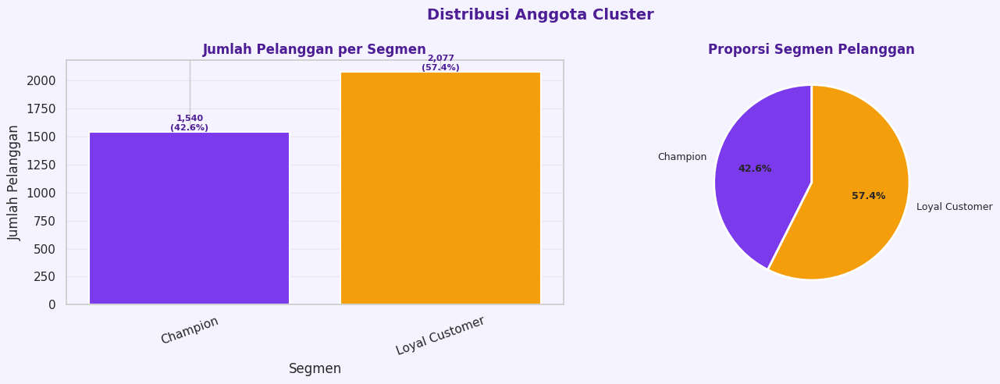

In [ ]:
# ===========================================================================================================================
# STEP 10 - VISUALISASI: DISTRIBUSI ANGGOTA (Bar + Pie)
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.patch.set_facecolor(CLR_BG)
fig.suptitle("Distribusi Anggota Cluster",
             fontsize=14, fontweight='bold', color=CLR_DARK)

seg_vc     = rfm["Segment"].value_counts()
seg_labels = [s for s in seg_order if s in seg_vc.index]
seg_vals   = [seg_vc[s] for s in seg_labels]
seg_colors = [palette[s] for s in seg_labels]

# Bar
bars = axes[0].bar(seg_labels, seg_vals, color=seg_colors,
                   edgecolor="white", linewidth=1.5)
axes[0].set_facecolor(CLR_BG)
for bar, val in zip(bars, seg_vals):
    axes[0].text(bar.get_x() + bar.get_width()/2,
                 bar.get_height() + len(rfm)*0.005,
                 f"{val:,}\n({val/len(rfm)*100:.1f}%)",
                 ha='center', fontsize=8, fontweight='bold', color=CLR_DARK)
axes[0].set_title("Jumlah Pelanggan per Segmen", fontsize=12, fontweight='bold', color=CLR_DARK)
axes[0].set_xlabel("Segmen")
axes[0].set_ylabel("Jumlah Pelanggan")
axes[0].tick_params(axis='x', rotation=20)
axes[0].grid(True, alpha=0.3, axis='y')

# Pie
wedges, texts, autotexts = axes[1].pie(
    seg_vals, labels=seg_labels, colors=seg_colors,
    autopct="%1.1f%%", startangle=90,
    wedgeprops=dict(edgecolor="white", linewidth=2),
    textprops={"fontsize": 9}
)
for at in autotexts:
    at.set_fontweight("bold")
axes[1].set_title("Proporsi Segmen Pelanggan", fontsize=12, fontweight='bold', color=CLR_DARK)

plt.tight_layout()
plt.show()

## **📚 Distribusi Anggota Cluster**

Visualisasi distribusi cluster menunjukkan bahwa hasil segmentasi pelanggan dengan **K-Means (k = 2)** menghasilkan dua kelompok utama, yaitu **Champion** dan **Loyal Customer**. Segmen **Loyal Customer** merupakan kelompok terbesar dengan **2.077 pelanggan (57,4%)**, sedangkan segmen **Champion** terdiri dari **1.540 pelanggan (42,6%)**.

Diagram batang memperlihatkan perbedaan jumlah anggota antar segmen secara jelas, sementara diagram pie menunjukkan proporsi masing-masing kelompok terhadap keseluruhan pelanggan. Dominasi segmen Loyal Customer mengindikasikan bahwa mayoritas pelanggan memiliki pola pembelian yang relatif stabil namun belum mencapai tingkat nilai transaksi setinggi Champion.

Meskipun jumlah Champion lebih sedikit, segmen ini tetap memiliki peran penting karena umumnya menunjukkan frekuensi transaksi dan nilai pembelian yang lebih tinggi. Oleh karena itu, perusahaan dapat menerapkan strategi pemasaran yang berbeda, seperti program loyalitas dan *retention strategy* untuk Loyal Customer serta penawaran eksklusif dan *premium engagement* untuk mempertahankan pelanggan Champion.

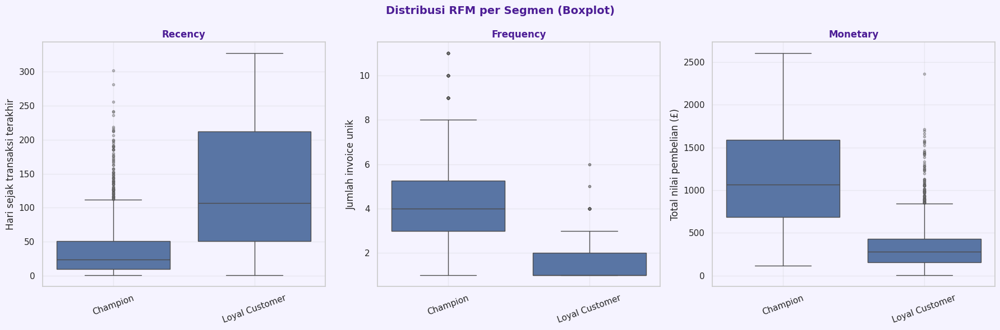

In [ ]:
# ===========================================================================================================================
# STEP 11 - VISUALISASI: BOXPLOT RFM per SEGMEN
# ===========================================================================================================================

import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.patch.set_facecolor(CLR_BG)

fig.suptitle(
    "Distribusi RFM per Segmen (Boxplot)",
    fontsize=14,
    fontweight='bold',
    color=CLR_DARK
)

rfm_col_info = [
    ("Recency",   "Hari sejak transaksi terakhir"),
    ("Frequency", "Jumlah invoice unik"),
    ("Monetary",  "Total nilai pembelian (£)")
]

for ax, (col, ylabel) in zip(axes, rfm_col_info):
    ax.set_facecolor(CLR_BG)

    sns.boxplot(
        data=rfm,
        x="Segment",
        y=col,
        order=seg_order,
        ax=ax,
        flierprops=dict(
            marker='o',
            markerfacecolor='gray',
            markersize=3,
            alpha=0.4
        )
    )

    # manual coloring (replace deprecated palette usage)
    for patch, color in zip(ax.artists, palette):
        patch.set_facecolor(color)

    ax.set_title(col, fontsize=12, fontweight='bold', color=CLR_DARK)
    ax.set_xlabel("")
    ax.set_ylabel(ylabel)
    ax.tick_params(axis='x', rotation=20)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## **🚀 Distribusi RFM per Segmen (Boxplot)**

Visualisasi boxplot digunakan untuk membandingkan distribusi **Recency, Frequency,** dan **Monetary (RFM)** antara segmen **Champion** dan **Loyal Customer**. Pada aspek **Recency**, pelanggan Champion memiliki median hari sejak transaksi terakhir yang jauh lebih rendah dibanding Loyal Customer. Hal ini menunjukkan bahwa Champion bertransaksi lebih baru dan lebih aktif, sedangkan Loyal Customer cenderung memiliki jarak waktu transaksi yang lebih lama.

Dari sisi **Frequency**, segmen Champion memperlihatkan jumlah transaksi yang lebih tinggi dengan median sekitar 4-5 transaksi, sementara Loyal Customer didominasi oleh pelanggan dengan frekuensi pembelian lebih rendah, yaitu sekitar 1-2 transaksi. Sebaran pada Champion juga lebih luas, menandakan variasi aktivitas belanja yang lebih tinggi.

Pada dimensi **Monetary**, Champion memiliki nilai pembelian yang secara konsisten lebih besar dibanding Loyal Customer. Median dan rentang nilai transaksi Champion berada pada level yang lebih tinggi, menunjukkan kontribusi pendapatan yang lebih besar terhadap bisnis. Walaupun terdapat beberapa *outlier* pada kedua segmen, pola keseluruhan memperkuat hasil profiling bahwa **Champion merupakan pelanggan dengan aktivitas dan nilai transaksi lebih tinggi**, sedangkan **Loyal Customer menunjukkan pola pembelian yang lebih moderat namun tetap stabil**.

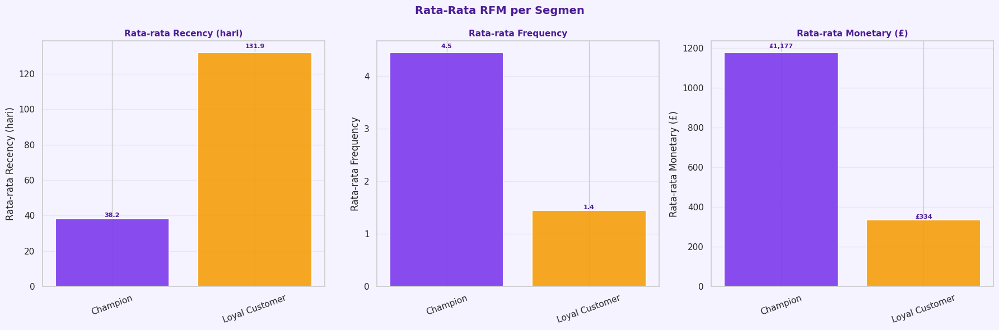

In [ ]:
# ===========================================================================================================================
# STEP 12 - VISUALISASI: BAR CHART RATA-RATA RFM per SEGMEN
# ===========================================================================================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.patch.set_facecolor(CLR_BG)
fig.suptitle("Rata-Rata RFM per Segmen",
             fontsize=14, fontweight='bold', color=CLR_DARK)

rfm_means_seg = (rfm.groupby("Segment")[["Recency","Frequency","Monetary"]]
                 .mean()
                 .reindex(seg_order))

bar_info = [
    ("Recency",   "Rata-rata Recency (hari)", False),
    ("Frequency", "Rata-rata Frequency",      False),
    ("Monetary",  "Rata-rata Monetary (£)",   True),
]

for ax, (col, ylabel, is_money) in zip(axes, bar_info):
    ax.set_facecolor(CLR_BG)
    segs      = rfm_means_seg.index.tolist()
    vals      = rfm_means_seg[col].values
    clrs      = [palette[s] for s in segs]
    bars      = ax.bar(segs, vals, color=clrs, edgecolor="white", linewidth=1.5, alpha=0.9)
    for bar, val in zip(bars, vals):
        lbl = f"£{val:,.0f}" if is_money else f"{val:.1f}"
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + bar.get_height()*0.02,
                lbl, ha='center', fontsize=8, fontweight='bold', color=CLR_DARK)
    ax.set_title(ylabel, fontsize=11, fontweight='bold', color=CLR_DARK)
    ax.set_ylabel(ylabel)
    ax.tick_params(axis='x', rotation=20)
    ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

## **📍 Rata-Rata RFM per Segmen**

Visualisasi rata-rata **RFM (Recency, Frequency, Monetary)** memperlihatkan perbedaan karakteristik yang jelas antara segmen **Champion** dan **Loyal Customer**. Pada dimensi **Recency**, pelanggan Champion memiliki rata-rata **38,2 hari** sejak transaksi terakhir, jauh lebih rendah dibanding Loyal Customer yang mencapai **131,9 hari**. Nilai recency yang lebih rendah menunjukkan bahwa Champion bertransaksi lebih baru dan memiliki tingkat keterlibatan yang lebih tinggi.

Dari sisi **Frequency**, Champion mencatat rata-rata sekitar **4,5 transaksi**, sedangkan Loyal Customer hanya sekitar **1,4 transaksi**. Perbedaan ini menunjukkan bahwa Champion melakukan pembelian lebih sering dan memiliki hubungan transaksi yang lebih aktif dengan perusahaan.

Pada dimensi **Monetary**, Champion juga memiliki nilai pembelian rata-rata yang jauh lebih tinggi, yaitu sekitar **£1.177**, dibanding Loyal Customer sebesar **£334**. Hasil ini menegaskan bahwa segmen Champion tidak hanya lebih aktif bertransaksi, tetapi juga memberikan kontribusi pendapatan yang lebih besar. Secara keseluruhan, visualisasi ini memperkuat hasil clustering bahwa **Champion merupakan segmen pelanggan bernilai tinggi**, sementara **Loyal Customer cenderung memiliki aktivitas dan nilai pembelian yang lebih rendah namun tetap konsisten**.

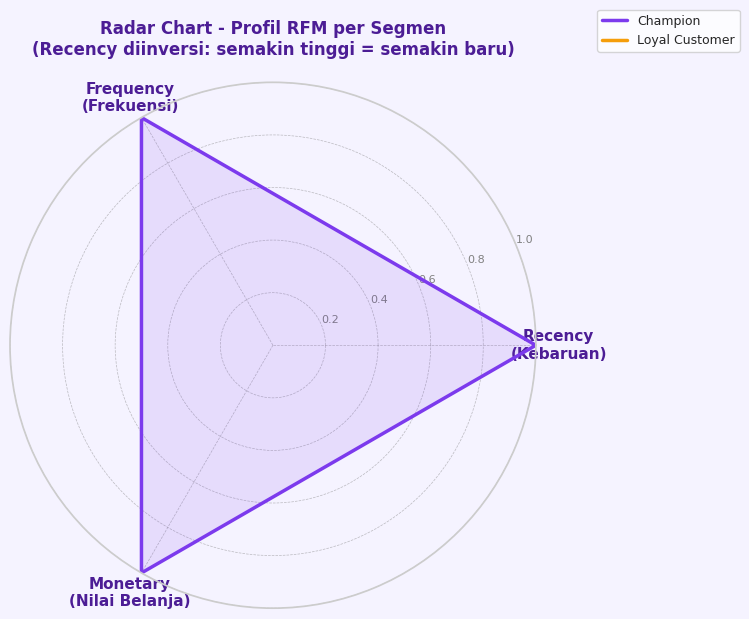

In [ ]:
# ===========================================================================================================================
# STEP 13 - VISUALISASI: RADAR CHART per SEGMEN
# ===========================================================================================================================

profile = rfm.groupby("Segment")[["Recency", "Frequency", "Monetary"]].mean()
profile = profile.reindex(seg_order)

# Inversi Recency, lalu min-max scale
profile_norm              = profile.copy()
profile_norm["Recency"]   = 1 / (profile_norm["Recency"] + 1)
for col in ["Recency", "Frequency", "Monetary"]:
    mn = profile_norm[col].min()
    mx = profile_norm[col].max()
    profile_norm[col] = (profile_norm[col] - mn) / (mx - mn + 1e-9)

categories = ["Recency\n(Kebaruan)", "Frequency\n(Frekuensi)", "Monetary\n(Nilai Belanja)"]
N      = len(categories)
angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
fig.patch.set_facecolor(CLR_BG)
ax.set_facecolor(CLR_BG)

for seg in seg_order:
    if seg not in profile_norm.index:
        continue
    vals = profile_norm.loc[seg, ["Recency", "Frequency", "Monetary"]].tolist()
    vals += vals[:1]
    color = palette[seg]
    ax.plot(angles, vals, color=color, linewidth=2.5, label=seg)
    ax.fill(angles, vals, color=color, alpha=0.12)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=11, fontweight='bold', color=CLR_DARK)
ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax.set_yticklabels(["0.2","0.4","0.6","0.8","1.0"], fontsize=8, color="gray")
ax.set_ylim(0, 1)
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
ax.set_title("Radar Chart - Profil RFM per Segmen\n"
             "(Recency diinversi: semakin tinggi = semakin baru)",
             fontsize=12, fontweight='bold', color=CLR_DARK, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.4, 1.15), fontsize=9)
plt.tight_layout()
plt.show()

## **💻 Radar Chart - Profil RFM per Segmen**

Radar chart digunakan untuk membandingkan profil **RFM (Recency, Frequency, Monetary)** antar segmen pelanggan secara simultan dalam satu visualisasi. Pada grafik ini, nilai **Recency telah diinversi**, sehingga nilai yang semakin tinggi menunjukkan pelanggan yang semakin baru melakukan transaksi.

Hasil visualisasi menunjukkan bahwa segmen **Champion** memiliki skor tertinggi pada seluruh dimensi RFM. Pada aspek **Recency**, Champion berada pada tingkat yang lebih tinggi, menandakan pelanggan dalam segmen ini lebih aktif dan baru melakukan pembelian dibanding Loyal Customer. Pada dimensi **Frequency**, Champion juga memiliki intensitas transaksi yang lebih besar, menunjukkan frekuensi pembelian yang lebih sering.

Selain itu, pada dimensi **Monetary**, Champion memperlihatkan nilai belanja yang lebih tinggi sehingga memberikan kontribusi pendapatan yang lebih besar terhadap perusahaan. Sebaliknya, segmen **Loyal Customer** memiliki profil RFM yang relatif lebih rendah pada ketiga dimensi tersebut. Secara keseluruhan, radar chart mempertegas bahwa **Champion merupakan segmen pelanggan dengan kualitas dan nilai bisnis tertinggi**, sedangkan **Loyal Customer tetap penting sebagai basis pelanggan yang stabil namun dengan tingkat aktivitas dan pengeluaran yang lebih moderat**.

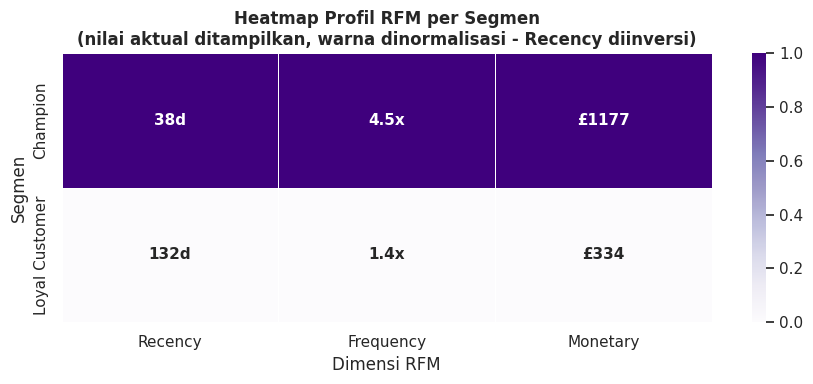

In [ ]:
# ===========================================================================================================================
# STEP 14 - VISUALISASI: HEATMAP PROFIL RFM per SEGMEN
# ===========================================================================================================================

rfm_heat      = rfm.groupby("Segment")[["Recency","Frequency","Monetary"]].mean()
rfm_heat      = rfm_heat.reindex(seg_order)
rfm_heat_norm = rfm_heat.copy()

for col in rfm_heat_norm.columns:
    mn = rfm_heat_norm[col].min()
    mx = rfm_heat_norm[col].max()
    rfm_heat_norm[col] = (rfm_heat_norm[col] - mn) / (mx - mn + 1e-9)
rfm_heat_norm["Recency"] = 1 - rfm_heat_norm["Recency"]  # inversi

annot = rfm_heat.copy()
annot["Recency"]   = annot["Recency"].apply(lambda x: f"{x:.0f}d")
annot["Frequency"] = annot["Frequency"].apply(lambda x: f"{x:.1f}x")
annot["Monetary"]  = annot["Monetary"].apply(lambda x: f"£{x:.0f}")

plt.figure(figsize=(9, max(4, K_OPTIMAL * 0.8)))
sns.heatmap(rfm_heat_norm, annot=annot, fmt="",
            cmap="Purples", linewidths=0.5, linecolor="white",
            annot_kws={"size": 11, "weight": "bold"},
            vmin=0, vmax=1)
plt.title("Heatmap Profil RFM per Segmen\n"
          "(nilai aktual ditampilkan, warna dinormalisasi - Recency diinversi)",
          fontsize=12, fontweight='bold')
plt.xlabel("Dimensi RFM")
plt.ylabel("Segmen")
plt.tight_layout()
plt.show()

## **🚀 Heatmap Profil RFM per Segmen**

Heatmap digunakan untuk memvisualisasikan perbandingan profil **RFM (Recency, Frequency, Monetary)** antar segmen pelanggan dengan warna yang telah dinormalisasi. Pada visualisasi ini, dimensi **Recency diinversi**, sehingga warna yang semakin gelap menunjukkan pelanggan yang semakin baru melakukan transaksi, sedangkan nilai aktual tetap ditampilkan di dalam setiap sel.

Hasil heatmap menunjukkan bahwa segmen **Champion** memiliki intensitas warna paling gelap pada seluruh dimensi RFM, dengan rata-rata **38 hari** untuk recency, **4,5 transaksi** untuk frequency, dan **£1.177** untuk monetary. Hal ini menandakan bahwa Champion merupakan pelanggan yang lebih aktif, lebih sering bertransaksi, dan memiliki nilai pembelian lebih tinggi.

Sebaliknya, segmen **Loyal Customer** memiliki warna yang lebih terang dengan rata-rata **132 hari** sejak transaksi terakhir, **1,4 transaksi**, dan nilai pembelian sekitar **£334**. Perbedaan warna yang kontras memperjelas adanya jarak karakteristik antara kedua segmen. Secara keseluruhan, heatmap memperkuat hasil segmentasi sebelumnya bahwa **Champion merupakan segmen dengan performa RFM tertinggi**, sedangkan **Loyal Customer memiliki aktivitas dan kontribusi belanja yang lebih rendah namun tetap stabil sebagai basis pelanggan utama**.

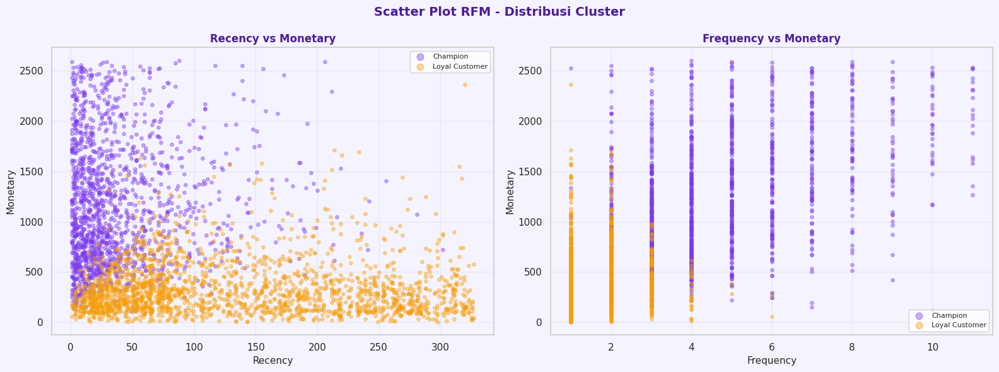

In [ ]:
# ===========================================================================================================================
# STEP 15 - VISUALISASI: SCATTER PLOT 2D (R vs M, F vs M)
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.patch.set_facecolor(CLR_BG)
fig.suptitle("Scatter Plot RFM - Distribusi Cluster",
             fontsize=14, fontweight='bold', color=CLR_DARK)

scatter_pairs = [("Recency", "Monetary"), ("Frequency", "Monetary")]

for ax, (x_col, y_col) in zip(axes, scatter_pairs):
    ax.set_facecolor(CLR_BG)
    for seg in seg_order:
        subset = rfm[rfm["Segment"] == seg]
        ax.scatter(subset[x_col], subset[y_col],
                   alpha=0.4, s=15, color=palette[seg], label=seg)
    ax.set_xlabel(x_col, fontsize=11)
    ax.set_ylabel(y_col, fontsize=11)
    ax.set_title(f"{x_col} vs {y_col}", fontsize=12, fontweight='bold', color=CLR_DARK)
    ax.legend(fontsize=8, markerscale=2)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## **💻 Scatter Plot RFM - Distribusi Cluster**

Scatter plot digunakan untuk memvisualisasikan distribusi pelanggan berdasarkan hubungan antar dimensi **RFM** serta melihat tingkat pemisahan hasil clustering. Grafik **Recency vs Monetary** menunjukkan bahwa segmen **Champion** cenderung terkonsentrasi pada nilai **recency yang rendah** dan **monetary yang tinggi**, menandakan pelanggan yang lebih baru bertransaksi dan memiliki nilai pembelian lebih besar. Sebaliknya, segmen **Loyal Customer** lebih banyak tersebar pada recency yang lebih tinggi dengan nilai monetary yang relatif rendah.

Pada grafik **Frequency vs Monetary**, terlihat hubungan positif antara frekuensi transaksi dan nilai pembelian. Segmen Champion mendominasi area dengan **frequency lebih tinggi** dan **monetary besar**, menunjukkan bahwa pelanggan yang bertransaksi lebih sering juga cenderung memberikan kontribusi pendapatan lebih tinggi. Sementara itu, Loyal Customer lebih banyak berada pada area frequency rendah dengan nilai belanja yang lebih kecil.

Meskipun masih terdapat beberapa area yang saling tumpang tindih (*overlap*) antar segmen, pola sebaran secara keseluruhan menunjukkan bahwa model clustering berhasil membedakan dua kelompok pelanggan dengan karakteristik perilaku belanja yang berbeda. Visualisasi ini sekaligus memperkuat hasil evaluasi bahwa segmen **Champion memiliki performa RFM lebih unggul**, sedangkan **Loyal Customer menunjukkan aktivitas belanja yang lebih moderat dan stabil**.

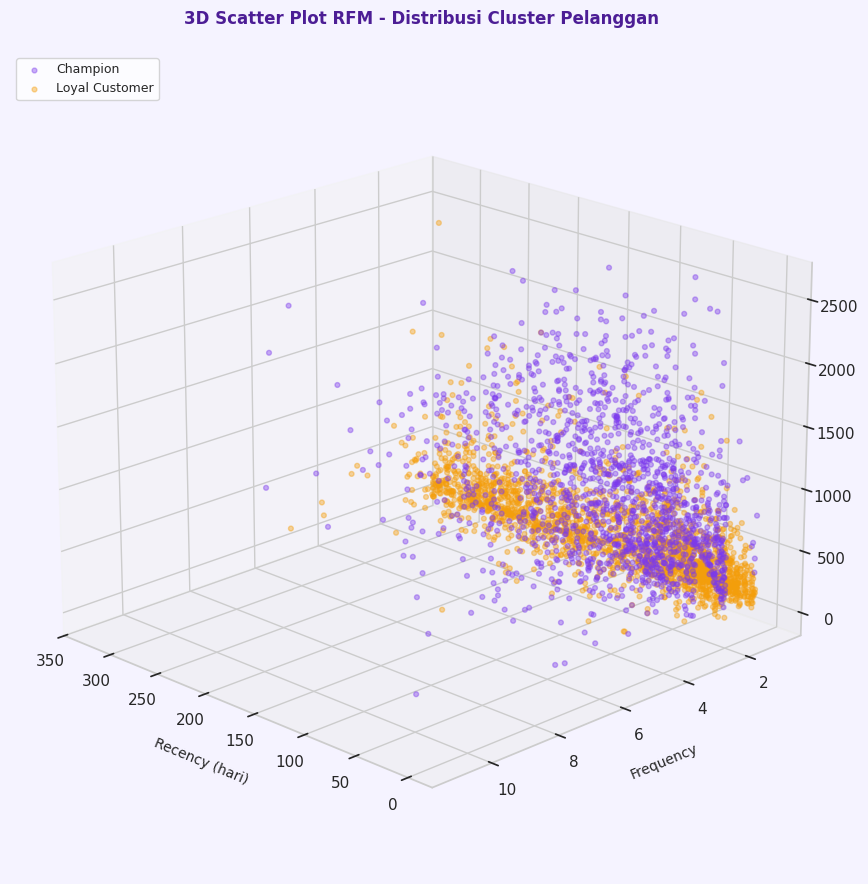

In [ ]:
# ===========================================================================================================================
# STEP 16 - VISUALISASI: 3D SCATTER PLOT RFM
# ===========================================================================================================================

fig  = plt.figure(figsize=(12, 9))
fig.patch.set_facecolor(CLR_BG)
ax3d = fig.add_subplot(111, projection='3d')
ax3d.set_facecolor(CLR_BG)

for seg in seg_order:
    subset = rfm[rfm["Segment"] == seg]
    ax3d.scatter(subset["Recency"], subset["Frequency"], subset["Monetary"],
                 alpha=0.4, s=12, color=palette[seg], label=seg)

ax3d.set_xlabel("Recency (hari)",    fontsize=10, labelpad=10)
ax3d.set_ylabel("Frequency",         fontsize=10, labelpad=10)
ax3d.set_zlabel("Monetary (£)",      fontsize=10, labelpad=10)
ax3d.set_title("3D Scatter Plot RFM - Distribusi Cluster Pelanggan",
               fontsize=12, fontweight='bold', color=CLR_DARK, pad=20)
ax3d.legend(loc='upper left', fontsize=9)
ax3d.view_init(elev=20, azim=135)
plt.tight_layout()
plt.show()

## **🎲 Visualisasi 3D Scatter Plot RFM - Distribusi Cluster Pelanggan**

Visualisasi *3D Scatter Plot RFM* menampilkan distribusi pelanggan berdasarkan tiga dimensi utama dalam metode *RFM* yaitu *Recency* (hari sejak transaksi terakhir), *Frequency* (jumlah transaksi), dan *Monetary* (total nilai pembelian). Setiap titik merepresentasikan satu pelanggan, sedangkan warna digunakan untuk membedakan segmen hasil *clustering* yaitu *Champion* dan *Loyal Customer*.

Grafik menunjukkan bahwa pelanggan segmen *Champion* cenderung terkonsentrasi pada nilai *frequency* dan *monetary* yang lebih tinggi serta *recency* yang lebih rendah, menandakan pelanggan yang lebih aktif dan bernilai tinggi. Sebaliknya, segmen *Loyal Customer* lebih banyak berada pada area dengan frekuensi dan nilai belanja yang lebih rendah serta *recency* yang lebih tinggi. Pemisahan distribusi ini memperlihatkan bahwa metode clustering berhasil membedakan karakteristik perilaku pelanggan berdasarkan pola transaksi RFM.

In [ ]:
# ===========================================================================================================================
# STEP 17 - ANALISIS DEMOGRAFIS (SOLUSI DENGAN CustomerID SEBAGAI KOLOM)
# ===========================================================================================================================

print("\n" + "="*60)
print("STEP 10: PROFIL DEMOGRAFIS & PREFERENSI PRODUK PER SEGMEN")
print("="*60)

# Merge menggunakan CustomerID sebagai kolom (bukan index)
data_with_segment = df.merge(
    rfm[['CustomerID', 'Segment']],  # Ambil CustomerID dan Segment
    on='CustomerID',                  # Merge by CustomerID
    how='inner'
)

print(f"  ✓ Data merged: {len(data_with_segment):,} transaksi dengan info segmen")

# Pastikan kolom Sales ada
if 'Sales' not in data_with_segment.columns:
    data_with_segment['Sales'] = data_with_segment['Quantity'] * data_with_segment['UnitPrice']

# Analisis per segment
for seg in seg_order:
    seg_data = data_with_segment[data_with_segment['Segment'] == seg]

    print(f"\n  {'='*50}")
    print(f"  {seg.upper()} ({len(seg_data):,} transaksi)")
    print(f"  {'='*50}")

    # 1. DISTRIBUSI GEOGRAFIS
    print("\n  📍 Top 5 Negara:")
    top_countries = seg_data['Country'].value_counts().head(5)
    for idx, (country, count) in enumerate(top_countries.items(), 1):
        pct = (count / len(seg_data)) * 100
        print(f"    {idx}. {country:20s}: {count:,} transaksi ({pct:.1f}%)")

    # 2. PRODUK FAVORIT
    print("\n  🛍️  Top 5 Produk:")
    top_products = seg_data['Description'].value_counts().head(5)
    for idx, (product, count) in enumerate(top_products.items(), 1):
        if pd.notna(product):
            product_short = product[:50] + '...' if len(product) > 50 else product
            print(f"    {idx}. {product_short:50s}: {count:,}x")

    # 3. PERILAKU BELANJA
    print("\n  📊 Perilaku Belanja:")
    avg_basket = seg_data.groupby('InvoiceNo')['Quantity'].sum().mean()
    avg_transaction = seg_data.groupby('InvoiceNo')['Sales'].sum().mean()

    print(f"    • Rata-rata item per transaksi  : {avg_basket:.1f} item")
    print(f"    • Rata-rata nilai per transaksi : £{avg_transaction:.2f}")

print("\n" + "="*60)


STEP 10: PROFIL DEMOGRAFIS & PREFERENSI PRODUK PER SEGMEN
  ✓ Data merged: 203,191 transaksi dengan info segmen

  CHAMPION (146,878 transaksi)

  📍 Top 5 Negara:
    1. United Kingdom      : 136,934 transaksi (93.2%)
    2. Germany             : 2,691 transaksi (1.8%)
    3. France              : 2,025 transaksi (1.4%)
    4. Belgium             : 1,044 transaksi (0.7%)
    5. Portugal            : 550 transaksi (0.4%)

  🛍️  Top 5 Produk:
    1. WHITE HANGING HEART T-LIGHT HOLDER                : 793x
    2. REGENCY CAKESTAND 3 TIER                          : 632x
    3. ASSORTED COLOUR BIRD ORNAMENT                     : 563x
    4. JUMBO BAG RED RETROSPOT                           : 488x
    5. PARTY BUNTING                                     : 471x

  📊 Perilaku Belanja:
    • Rata-rata item per transaksi  : 162.8 item
    • Rata-rata nilai per transaksi : £263.09

  LOYAL CUSTOMER (56,313 transaksi)

  📍 Top 5 Negara:
    1. United Kingdom      : 51,144 transaksi (90.8%)
    2.

## **Profil Demografis dan Preferensi Produk per Segmen**

Analisis profil demografis dan preferensi produk menunjukkan bahwa kedua segmen pelanggan didominasi oleh transaksi dari *United Kingdom*, baik pada segmen *Champion* (93,2%) maupun *Loyal Customer* (90,8%). Negara lain seperti *Germany* dan *France* juga muncul dalam lima besar, meskipun kontribusinya relatif kecil. Hal ini mengindikasikan bahwa pasar utama e-commerce masih sangat terpusat di wilayah Inggris.

Dari sisi preferensi produk, kedua segmen memiliki pola pembelian yang cukup mirip dengan produk *WHITE HANGING HEART T-LIGHT HOLDER* dan *REGENCY CAKESTAND 3 TIER* sebagai produk paling populer. Namun, segmen *Champion* menunjukkan intensitas pembelian yang lebih tinggi, tercermin dari jumlah transaksi produk yang lebih besar serta rata-rata nilai transaksi yang lebih tinggi (£263,09 dibanding £249,82). Temuan ini memperlihatkan bahwa pelanggan *Champion* tidak hanya lebih aktif, tetapi juga memberikan kontribusi pendapatan yang lebih besar dibandingkan *Loyal Customer*.

In [ ]:
# ===========================================================================================================================
# STEP 18 - RINGKASAN KARAKTERISTIK PER SEGMEN
# ===========================================================================================================================

print("\n" + "="*80)
print("RINGKASAN KOMPREHENSIF PER SEGMEN")
print("="*80)

summary_data = []

for seg in seg_order:
    seg_rfm = rfm[rfm['Segment'] == seg]
    seg_trans = data_with_segment[data_with_segment['Segment'] == seg]

    summary_data.append({
        'Segment': seg,
        'Jumlah Customer': f"{len(seg_rfm):,}",
        'Persen (%)': f"{len(seg_rfm)/len(rfm)*100:.1f}%",
        'Avg Recency (d)': f"{seg_rfm['Recency'].mean():.1f}",
        'Avg Frequency': f"{seg_rfm['Frequency'].mean():.1f}",
        'Avg Monetary (£)': f"{seg_rfm['Monetary'].mean():.1f}",
        'Total Revenue (£)': f"{seg_rfm['Monetary'].sum():,.0f}",
        'Top Country': seg_trans['Country'].mode()[0] if len(seg_trans) > 0 else 'N/A',
        'Avg Basket Size': f"{seg_trans.groupby('InvoiceNo')['Quantity'].sum().mean():.1f}"
    })

summary_df = pd.DataFrame(summary_data)
display(summary_df)

# ═══════════════════════════════════════════════════════════════════════════════
# ANALISIS KONTRIBUSI REVENUE
# ═══════════════════════════════════════════════════════════════════════════════

print("\n" + "="*80)
print("ANALISIS KONTRIBUSI REVENUE")
print("="*80)

total_revenue = rfm['Monetary'].sum()
total_customers = len(rfm)

print(f"\n  💰 Total Revenue: £{total_revenue:,.2f}")
print(f"  👥 Total Customers: {total_customers:,}")
print(f"\n  📊 Kontribusi Revenue per Segmen:")

for seg in seg_order:
    seg_revenue = rfm[rfm['Segment'] == seg]['Monetary'].sum()
    seg_customers = len(rfm[rfm['Segment'] == seg])
    pct_revenue = (seg_revenue / total_revenue) * 100
    pct_customers = (seg_customers / total_customers) * 100

    print(f"\n    {seg:20s}:")
    print(f"      Revenue  : £{seg_revenue:,.0f} ({pct_revenue:.1f}%)")
    print(f"      Customers: {seg_customers:,} ({pct_customers:.1f}%)")
    print(f"      ARPU     : £{seg_revenue/seg_customers:,.2f}")

# ═══════════════════════════════════════════════════════════════════════════════
# PARETO ANALYSIS
# ═══════════════════════════════════════════════════════════════════════════════

print(f"\n  {'─'*70}")
print("  📈 PARETO ANALYSIS (80/20 RULE)")
print(f"  {'─'*70}")

top_20_pct_customers = rfm.nlargest(int(len(rfm) * 0.2), 'Monetary')
top_20_revenue = top_20_pct_customers['Monetary'].sum()
pareto_pct = (top_20_revenue / total_revenue) * 100

print(f"\n    Top 20% pelanggan ({int(len(rfm) * 0.2):,} customers):")
print(f"    → Menghasilkan £{top_20_revenue:,.2f} ({pareto_pct:.1f}% dari total revenue)")
print(f"    → Average revenue per customer: £{top_20_revenue/len(top_20_pct_customers):,.2f}")

bottom_80_revenue = total_revenue - top_20_revenue
bottom_80_pct = (bottom_80_revenue / total_revenue) * 100
print(f"\n    Bottom 80% pelanggan ({len(rfm) - int(len(rfm) * 0.2):,} customers):")
print(f"    → Menghasilkan £{bottom_80_revenue:,.2f} ({bottom_80_pct:.1f}% dari total revenue)")
print(f"    → Average revenue per customer: £{bottom_80_revenue/(len(rfm) - int(len(rfm) * 0.2)):,.2f}")

# ═══════════════════════════════════════════════════════════════════════════════
# KOMPOSISI TOP 20% PER SEGMENT
# ═══════════════════════════════════════════════════════════════════════════════

print(f"\n  {'─'*70}")
print("  🎯 KOMPOSISI TOP 20% PELANGGAN PER SEGMEN")
print(f"  {'─'*70}")

# Ambil Segment dari rfm berdasarkan index top 20%
top_20_segments = rfm.loc[top_20_pct_customers.index, 'Segment']
segment_counts = top_20_segments.value_counts()

for seg in seg_order:
    count_in_top20 = segment_counts.get(seg, 0)
    pct_in_top20 = (count_in_top20 / len(top_20_pct_customers)) * 100
    print(f"    {seg:20s}: {count_in_top20:,} customers ({pct_in_top20:.1f}%)")

print("\n" + "="*80)


RINGKASAN KOMPREHENSIF PER SEGMEN


,Segment,Jumlah Customer,Persen (%),Avg Recency (d),Avg Frequency,Avg Monetary (£),Total Revenue (£),Top Country,Avg Basket Size
0,Champion,"1,540",42.6%,38.2,4.5,1177.0,"1,812,640",United Kingdom,162.8
1,Loyal Customer,"2,077",57.4%,131.9,1.4,333.8,"693,245",United Kingdom,161.1



ANALISIS KONTRIBUSI REVENUE

  💰 Total Revenue: £2,505,885.16
  👥 Total Customers: 3,617

  📊 Kontribusi Revenue per Segmen:

    Champion            :
      Revenue  : £1,812,640 (72.3%)
      Customers: 1,540 (42.6%)
      ARPU     : £1,177.04

    Loyal Customer      :
      Revenue  : £693,245 (27.7%)
      Customers: 2,077 (57.4%)
      ARPU     : £333.77

  ──────────────────────────────────────────────────────────────────────
  📈 PARETO ANALYSIS (80/20 RULE)
  ──────────────────────────────────────────────────────────────────────

    Top 20% pelanggan (723 customers):
    → Menghasilkan £1,245,209.05 (49.7% dari total revenue)
    → Average revenue per customer: £1,722.28

    Bottom 80% pelanggan (2,894 customers):
    → Menghasilkan £1,260,676.11 (50.3% dari total revenue)
    → Average revenue per customer: £435.62

  ──────────────────────────────────────────────────────────────────────
  🎯 KOMPOSISI TOP 20% PELANGGAN PER SEGMEN
  ──────────────────────────────────────────

## **Ringkasan Komprehensif dan Analisis Kontribusi Revenue**

Ringkasan segmentasi menunjukkan bahwa segmen *Loyal Customer* memiliki jumlah pelanggan lebih besar yaitu 2.077 pelanggan (57,4%), sedangkan segmen *Champion* terdiri dari 1.540 pelanggan (42,6%). Namun, pelanggan *Champion* memiliki performa RFM yang jauh lebih tinggi dengan rata-rata *recency* lebih rendah (38,2 hari), *frequency* lebih tinggi (4,5 transaksi), dan *monetary* lebih besar (£1.177) dibandingkan *Loyal Customer* yang memiliki rata-rata 131,9 hari, 1,4 transaksi, dan £333,8. Kondisi ini menunjukkan bahwa pelanggan *Champion* lebih aktif dan memiliki nilai ekonomi yang lebih tinggi.

Dari sisi kontribusi pendapatan, segmen *Champion* menjadi penggerak utama bisnis dengan total revenue sebesar £1,81 juta atau 72,3% dari total pendapatan meskipun hanya mencakup 42,6% pelanggan. Sebaliknya, segmen *Loyal Customer* menyumbang £693 ribu atau 27,7% revenue dengan jumlah pelanggan yang lebih besar. Nilai *Average Revenue per User (ARPU)* segmen *Champion* (£1.177) juga lebih dari tiga kali lipat dibanding *Loyal Customer* (£333,77), mempertegas pentingnya segmen ini dalam menghasilkan profit.

Hasil *Pareto Analysis* menunjukkan bahwa 20% pelanggan teratas menghasilkan £1,25 juta atau sekitar 49,7% dari total revenue, sementara 80% pelanggan lainnya menghasilkan 50,3%. Walaupun belum sepenuhnya memenuhi pola klasik *80/20 rule*, kontribusi pelanggan bernilai tinggi tetap terlihat dominan. Komposisi pelanggan pada kelompok 20% teratas juga didominasi oleh segmen *Champion* sebanyak 96%, sedangkan *Loyal Customer* hanya 4%. Temuan ini menegaskan bahwa pelanggan *Champion* merupakan aset strategis yang perlu diprioritaskan melalui program retensi dan personalisasi agar kontribusi revenue tetap terjaga.

In [ ]:
# ===========================================================================================================================
# STEP 19 - REKOMENDASI STRATEGIS BERBASIS DATA
# ===========================================================================================================================

print("\n" + "="*80)
print("RINGKASAN EKSEKUTIF")
print("="*80)

segment_insights = {}
total_revenue_all = rfm['Monetary'].sum()
total_customers_all = len(rfm)

for seg_name in seg_order:
    seg_data_rfm = rfm[rfm['Segment'] == seg_name]

    seg_revenue = seg_data_rfm['Monetary'].sum()
    seg_customers = len(seg_data_rfm)

    segment_insights[seg_name] = {
        'revenue': seg_revenue,
        'count': seg_customers,
        'pct': (seg_customers / total_customers_all) * 100,
        'revenue_pct': (seg_revenue / total_revenue_all) * 100,
        'arpu': seg_revenue / seg_customers if seg_customers > 0 else 0
    }

top_segments = sorted(
    segment_insights.items(),
    key=lambda x: x[1]['revenue'],
    reverse=True
)[:3]

print(f"""
A. PRIORITAS BERDASARKAN DATA (TOP 3 SEGMEN)
""")

priority_labels = ['PROTECT', 'GROW', 'RESCUE']
priority_desc = [
    'Retention Focus - Highest Revenue Contributor',
    'Expansion Focus - Growth Potential',
    'Risk Mitigation - Churn Prevention'
]

for idx, (seg_name, seg_data) in enumerate(top_segments):
    print(f"""
   {idx+1}. {priority_labels[idx]} ({priority_desc[idx]})
      Segmen: {seg_name}
      Jumlah: {seg_data['count']:,} pelanggan ({seg_data['pct']:.1f}%)
      Revenue: £{seg_data['revenue']:,.0f} ({seg_data['revenue_pct']:.1f}%)
      ARPU: £{seg_data['arpu']:,.2f}
""")

champion_data = segment_insights.get('Champion', segment_insights.get(top_segments[0][0]))
loyal_data = segment_insights.get('Loyal Customer', segment_insights.get(top_segments[1][0]) if len(top_segments) > 1 else {})
at_risk_data = segment_insights.get('At-Risk', {})

print(f"""
B. EXPECTED BUSINESS IMPACT

   1. Proteksi Revenue:
      Potensi kehilangan jika churn 5%: £{champion_data.get('revenue', 0) * 0.05:,.0f}
      Revenue yang diselamatkan (80% sukses): £{champion_data.get('revenue', 0) * 0.05 * 0.8:,.0f}

   2. Pertumbuhan Revenue:
      Target upgrade: {int(loyal_data.get('count', 0) * 0.2):,}
      Realistis (80%): {int(loyal_data.get('count', 0) * 0.2 * 0.8):,}
      Revenue tambahan: £{int(loyal_data.get('count', 0) * 0.2 * 0.8) * (champion_data.get('arpu', 0) - loyal_data.get('arpu', 0)):,.0f}

   3. Pencegahan Churn:
      Revenue terancam: £{at_risk_data.get('revenue', 0):,.0f}
      Target penyelamatan: £{at_risk_data.get('revenue', 0) * 0.3 * 0.8:,.0f}
""")

print("="*80)


RINGKASAN EKSEKUTIF

A. PRIORITAS BERDASARKAN DATA (TOP 3 SEGMEN)


   1. PROTECT (Retention Focus - Highest Revenue Contributor)
      Segmen: Champion
      Jumlah: 1,540 pelanggan (42.6%)
      Revenue: £1,812,640 (72.3%)
      ARPU: £1,177.04


   2. GROW (Expansion Focus - Growth Potential)
      Segmen: Loyal Customer
      Jumlah: 2,077 pelanggan (57.4%)
      Revenue: £693,245 (27.7%)
      ARPU: £333.77


B. EXPECTED BUSINESS IMPACT

   1. Proteksi Revenue:
      Potensi kehilangan jika churn 5%: £90,632
      Revenue yang diselamatkan (80% sukses): £72,506

   2. Pertumbuhan Revenue:
      Target upgrade: 415
      Realistis (80%): 332
      Revenue tambahan: £279,965

   3. Pencegahan Churn:
      Revenue terancam: £0
      Target penyelamatan: £0



## **Ringkasan Eksekutif dan Dampak Bisnis**

Berdasarkan hasil segmentasi pelanggan, strategi bisnis dapat difokuskan pada dua prioritas utama yaitu *Protect* dan *Grow*. Prioritas *Protect* ditujukan pada segmen *Champion* yang berjumlah 1.540 pelanggan (42,6%) namun menyumbang revenue terbesar sebesar £1,81 juta atau 72,3% dari total pendapatan dengan *ARPU* mencapai £1.177. Segmen ini merupakan pelanggan bernilai tinggi sehingga strategi retensi, loyalitas, dan personalisasi layanan menjadi sangat penting untuk menjaga kontribusi revenue tetap stabil.

Sementara itu, prioritas *Grow* diarahkan pada segmen *Loyal Customer* yang memiliki jumlah pelanggan lebih besar yaitu 2.077 pelanggan (57,4%) dengan kontribusi revenue sebesar £693 ribu (27,7%). Walaupun nilai *ARPU* lebih rendah (£333,77), segmen ini memiliki potensi pertumbuhan melalui strategi *upselling*, *cross-selling*, dan peningkatan engagement agar sebagian pelanggan dapat berkembang menjadi segmen *Champion*.

Dari sisi dampak bisnis, perlindungan terhadap segmen *Champion* sangat signifikan karena potensi kehilangan revenue akibat churn sebesar 5% diperkirakan mencapai £90.632. Dengan asumsi program retensi berhasil 80%, perusahaan dapat menyelamatkan sekitar £72.506 revenue. Selain itu, strategi pertumbuhan pada segmen *Loyal Customer* berpotensi menghasilkan tambahan revenue sekitar £279.965 melalui upgrade pelanggan secara bertahap. Hasil ini menunjukkan bahwa kombinasi strategi retensi dan ekspansi pelanggan dapat memberikan dampak finansial yang nyata bagi bisnis e-commerce.

In [ ]:
# ===========================================================================================================================
# STEP 20 - RINGKASAN AKHIR
# ===========================================================================================================================

print("\n" + "="*60)
print("RINGKASAN AKHIR - K-MEANS CLUSTERING")
print("="*60)

print(f"\n  Algoritma      : K-Means++  (n_init=20, max_iter=500, random_state=42)")
print(f"  Fitur input    : Log(Recency), Log(Frequency), Log(Monetary) → StandardScaler")
print(f"  k optimal      : {K_OPTIMAL}  (dipilih via majority voting 3 metrik)")
print(f"  Total pelanggan: {len(rfm):,}")

print(f"\n  Metrik validasi (k={K_OPTIMAL}):")
print(f"    Silhouette Score     : {sil_opt:.4f}  {'✅ ≥ 0.5' if sil_opt >= 0.5 else '⚠️ < 0.5'}")
print(f"    Calinski-Harabasz    : {ch_opt:,.2f}")
print(f"    Davies-Bouldin Index : {db_opt:.4f}")
print(f"    WCSS (Inertia)       : {wcss_opt:,.2f}")

print(f"\n  Profil segmen final:")
summary = (rfm.groupby("Segment")
           .agg(Pelanggan=("Cluster","count"),
                Avg_R=("Recency","mean"),
                Avg_F=("Frequency","mean"),
                Avg_M=("Monetary","mean"))
           .round(2))
summary["Pct(%)"] = (summary["Pelanggan"] / len(rfm) * 100).round(1)
summary = summary.reindex(seg_order)
display(summary)

print(f"\n✅ Clustering selesai.")
print(f"   Kolom 'Cluster' dan 'Segment' tersedia di dataframe rfm.")
print(f"   rfm siap digunakan untuk analisis lanjutan dan rekomendasi bisnis.")


RINGKASAN AKHIR - K-MEANS CLUSTERING

  Algoritma      : K-Means++  (n_init=20, max_iter=500, random_state=42)
  Fitur input    : Log(Recency), Log(Frequency), Log(Monetary) → StandardScaler
  k optimal      : 2  (dipilih via majority voting 3 metrik)
  Total pelanggan: 3,617

  Metrik validasi (k=2):
    Silhouette Score     : 0.3999  ⚠️ < 0.5
    Calinski-Harabasz    : 3,189.64
    Davies-Bouldin Index : 0.9707
    WCSS (Inertia)       : 5,764.65

  Profil segmen final:


,Pelanggan,Avg_R,Avg_F,Avg_M,Pct(%)
Segment,,,,,
Champion,1540,38.19,4.45,1177.04,42.6
Loyal Customer,2077,131.88,1.44,333.77,57.4



✅ Clustering selesai.
   Kolom 'Cluster' dan 'Segment' tersedia di dataframe rfm.
   rfm siap digunakan untuk analisis lanjutan dan rekomendasi bisnis.


## **Ringkasan Akhir K-Means Clustering**

Proses segmentasi pelanggan menggunakan algoritma *K-Means++* dengan parameter *n_init=20*, *max_iter=500*, dan *random_state=42*. Fitur yang digunakan terdiri dari *Log(Recency)*, *Log(Frequency)*, dan *Log(Monetary)* yang kemudian distandardisasi menggunakan *StandardScaler* untuk memastikan skala data seragam sebelum proses clustering dilakukan. Berdasarkan hasil *majority voting* dari tiga metrik validasi internal, jumlah cluster optimal ditetapkan sebanyak dua cluster (*k=2*) pada total 3.617 pelanggan.

Evaluasi clustering menunjukkan *Silhouette Score* sebesar 0,3999 yang mengindikasikan kualitas pemisahan cluster berada pada kategori cukup meskipun belum mencapai batas ideal (>0,5). Sementara itu, *Calinski-Harabasz Index* sebesar 3.189,64 dan *Davies-Bouldin Index* sebesar 0,9707 menunjukkan bahwa cluster memiliki pemisahan yang relatif baik dengan tingkat kemiripan antarkelompok yang cukup rendah. Nilai *WCSS* sebesar 5.764,65 juga mendukung hasil pemilihan *k=2* melalui *elbow method*.

Hasil akhir menghasilkan dua segmen utama yaitu *Champion* sebanyak 1.540 pelanggan (42,6%) dengan karakteristik lebih aktif dan bernilai tinggi (*Recency* 38,19 hari, *Frequency* 4,45 transaksi, dan *Monetary* £1.177), serta *Loyal Customer* sebanyak 2.077 pelanggan (57,4%) dengan aktivitas dan nilai pembelian yang lebih rendah (*Recency* 131,88 hari, *Frequency* 1,44 transaksi, dan *Monetary* £333,77). Dengan terbentuknya kolom *Cluster* dan *Segment* pada dataframe *rfm*, hasil clustering siap digunakan untuk analisis lanjutan, strategi pemasaran, dan rekomendasi bisnis berbasis data pelanggan.

# **5️⃣ Time Series Forecasting**

In [ ]:
# ===========================================================================================================================
# STEP 1 - DATA TRANSFORMATION UNTUK TIME SERIES
# ===========================================================================================================================

print("\n" + "="*80)
print("TRANSFORMASI DATA UNTUK ANALISIS TIME SERIES")
print("="*80)

# ─────────────────────────────────────────────────────────────
# A. PERSIAPAN DATA
# ─────────────────────────────────────────────────────────────

print("\n  A. PERSIAPAN DATA")

# Pastikan InvoiceDate dalam format datetime
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Hitung Sales jika belum ada
if 'Sales' not in df.columns:
    df['Sales'] = df['Quantity'] * df['UnitPrice']

# Filter data valid (Quantity > 0, UnitPrice > 0)
df_ts = df[(df['Quantity'] > 0) & (df['UnitPrice'] > 0)].copy()

print(f"  ✓ Data untuk time series: {len(df_ts):,} transaksi")
print(f"  ✓ Periode data: {df_ts['InvoiceDate'].min().date()} s/d {df_ts['InvoiceDate'].max().date()}")
print(f"  ✓ Total hari: {(df_ts['InvoiceDate'].max() - df_ts['InvoiceDate'].min()).days} hari")

# ─────────────────────────────────────────────────────────────
# B. EKSTRAKSI FITUR TEMPORAL
# ─────────────────────────────────────────────────────────────

print("\n  B. EKSTRAKSI FITUR TEMPORAL")

df_ts['Year'] = df_ts['InvoiceDate'].dt.year
df_ts['Month'] = df_ts['InvoiceDate'].dt.month
df_ts['MonthName'] = df_ts['InvoiceDate'].dt.month_name()
df_ts['Day'] = df_ts['InvoiceDate'].dt.day
df_ts['DayOfWeek'] = df_ts['InvoiceDate'].dt.dayofweek
df_ts['DayName'] = df_ts['InvoiceDate'].dt.day_name()
df_ts['Hour'] = df_ts['InvoiceDate'].dt.hour
df_ts['Date'] = df_ts['InvoiceDate'].dt.date

print("  ✓ Fitur temporal berhasil diekstrak:")
print(f"     - Year: {df_ts['Year'].nunique()} tahun unik")
print(f"     - Month: {df_ts['Month'].nunique()} bulan unik")
print(f"     - Day: {df_ts['Date'].nunique()} hari unik")
print(f"     - Hour: {df_ts['Hour'].nunique()} jam unik")

# ─────────────────────────────────────────────────────────────
# C. AGREGASI PENJUALAN HARIAN
# ─────────────────────────────────────────────────────────────

print("\n  C. AGREGASI PENJUALAN HARIAN")

daily_sales = df_ts.groupby('Date').agg({
    'Sales': 'sum',
    'InvoiceNo': 'nunique',
    'Quantity': 'sum'
}).reset_index()

daily_sales.columns = ['Date', 'DailySales', 'DailyTransactions', 'DailyQuantity']
daily_sales['Date'] = pd.to_datetime(daily_sales['Date'])
daily_sales = daily_sales.sort_values('Date').reset_index(drop=True)

# Set Date sebagai index
daily_sales.set_index('Date', inplace=True)

print(f"  ✓ Daily sales aggregation:")
print(f"     - Total hari dengan transaksi: {len(daily_sales):,}")
print(f"     - Rata-rata penjualan harian: £{daily_sales['DailySales'].mean():,.2f}")
print(f"     - Penjualan tertinggi: £{daily_sales['DailySales'].max():,.2f}")
print(f"     - Penjualan terendah: £{daily_sales['DailySales'].min():,.2f}")

# ─────────────────────────────────────────────────────────────
# D. AGREGASI PENJUALAN BULANAN
# ─────────────────────────────────────────────────────────────

print("\n  D. AGREGASI PENJUALAN BULANAN")

monthly_sales = df_ts.groupby(df_ts['InvoiceDate'].dt.to_period('M')).agg({
    'Sales': 'sum',
    'InvoiceNo': 'nunique',
    'CustomerID': 'nunique',
    'Quantity': 'sum'
}).reset_index()

monthly_sales.columns = ['Month', 'MonthlySales', 'MonthlyTransactions',
                         'MonthlyCustomers', 'MonthlyQuantity']
monthly_sales['Month'] = monthly_sales['Month'].dt.to_timestamp()
monthly_sales = monthly_sales.sort_values('Month').reset_index(drop=True)

# Set Month sebagai index
monthly_sales.set_index('Month', inplace=True)

print(f"  ✓ Monthly sales aggregation:")
print(f"     - Total bulan: {len(monthly_sales):,}")
print(f"     - Rata-rata penjualan bulanan: £{monthly_sales['MonthlySales'].mean():,.2f}")
print(f"     - Penjualan tertinggi: £{monthly_sales['MonthlySales'].max():,.2f} ({monthly_sales['MonthlySales'].idxmax().strftime('%B %Y')})")
print(f"     - Penjualan terendah: £{monthly_sales['MonthlySales'].min():,.2f} ({monthly_sales['MonthlySales'].idxmin().strftime('%B %Y')})")

# ─────────────────────────────────────────────────────────────
# E. RINGKASAN DATA TIME SERIES
# ─────────────────────────────────────────────────────────────

print("\n  E. RINGKASAN DATA TIME SERIES")

summary_ts = pd.DataFrame({
    'Granularity': ['Daily', 'Monthly'],
    'Total Periods': [len(daily_sales), len(monthly_sales)],
    'Avg Sales': [f"£{daily_sales['DailySales'].mean():,.2f}",
                  f"£{monthly_sales['MonthlySales'].mean():,.2f}"],
    'Total Sales': [f"£{daily_sales['DailySales'].sum():,.2f}",
                    f"£{monthly_sales['MonthlySales'].sum():,.2f}"],
    'Date Range': [
        f"{daily_sales.index.min().strftime('%Y-%m-%d')} to {daily_sales.index.max().strftime('%Y-%m-%d')}",
        f"{monthly_sales.index.min().strftime('%Y-%m')} to {monthly_sales.index.max().strftime('%Y-%m')}"
    ]
})

display(summary_ts)

print("\n" + "="*80)


TRANSFORMASI DATA UNTUK ANALISIS TIME SERIES

  A. PERSIAPAN DATA
  ✓ Data untuk time series: 397,884 transaksi
  ✓ Periode data: 2010-12-01 s/d 2011-12-09
  ✓ Total hari: 373 hari

  B. EKSTRAKSI FITUR TEMPORAL
  ✓ Fitur temporal berhasil diekstrak:
     - Year: 2 tahun unik
     - Month: 12 bulan unik
     - Day: 305 hari unik
     - Hour: 15 jam unik

  C. AGREGASI PENJUALAN HARIAN
  ✓ Daily sales aggregation:
     - Total hari dengan transaksi: 305
     - Rata-rata penjualan harian: £29,217.73
     - Penjualan tertinggi: £184,349.28
     - Penjualan terendah: £3,457.11

  D. AGREGASI PENJUALAN BULANAN
  ✓ Monthly sales aggregation:
     - Total bulan: 13
     - Rata-rata penjualan bulanan: £685,492.92
     - Penjualan tertinggi: £1,161,817.38 (November 2011)
     - Penjualan terendah: £447,137.35 (February 2011)

  E. RINGKASAN DATA TIME SERIES


,Granularity,Total Periods,Avg Sales,Total Sales,Date Range
0,Daily,305,"£29,217.73","£8,911,407.90",2010-12-01 to 2011-12-09
1,Monthly,13,"£685,492.92","£8,911,407.90",2010-12 to 2011-12


## **Transformasi Data untuk Analisis Time Series**

Tahap transformasi data dilakukan untuk menyiapkan data transaksi menjadi format *time series* yang siap dianalisis. Proses dimulai dengan memastikan variabel `InvoiceDate` berada dalam format *datetime*, menghitung nilai `Sales` dari hasil perkalian `Quantity` dan `UnitPrice`, serta memfilter data valid dengan `Quantity` dan `UnitPrice` bernilai positif. Setelah proses pembersihan, diperoleh sebanyak **397.884 transaksi** dengan periode pengamatan dari **1 Desember 2010 hingga 9 Desember 2011**.

Selanjutnya dilakukan ekstraksi fitur temporal seperti tahun, bulan, hari, nama hari, dan jam transaksi untuk memahami pola waktu penjualan. Hasil ekstraksi menunjukkan data mencakup **2 tahun**, **12 bulan**, **305 hari transaksi**, dan **15 jam transaksi unik**.

Data kemudian diagregasi menjadi penjualan harian (*daily sales*) dan bulanan (*monthly sales*). Agregasi harian menghasilkan **305 hari transaksi** dengan rata-rata penjualan sebesar **£29.217,73** per hari, dimana penjualan tertinggi mencapai **£184.349,28** dan terendah **£3.457,11**. Sementara itu, agregasi bulanan menghasilkan **13 bulan pengamatan** dengan rata-rata penjualan sebesar **£685.492,92** per bulan. Penjualan tertinggi terjadi pada **November 2011** sebesar **£1.161.817,38**, sedangkan terendah terjadi pada **Februari 2011** sebesar **£447.137,35**. Transformasi ini menghasilkan data time series yang lebih terstruktur dan siap digunakan untuk analisis pola maupun peramalan penjualan.


ANALISIS POLA TEMPORAL

  A. VISUALISASI TREND PENJUALAN


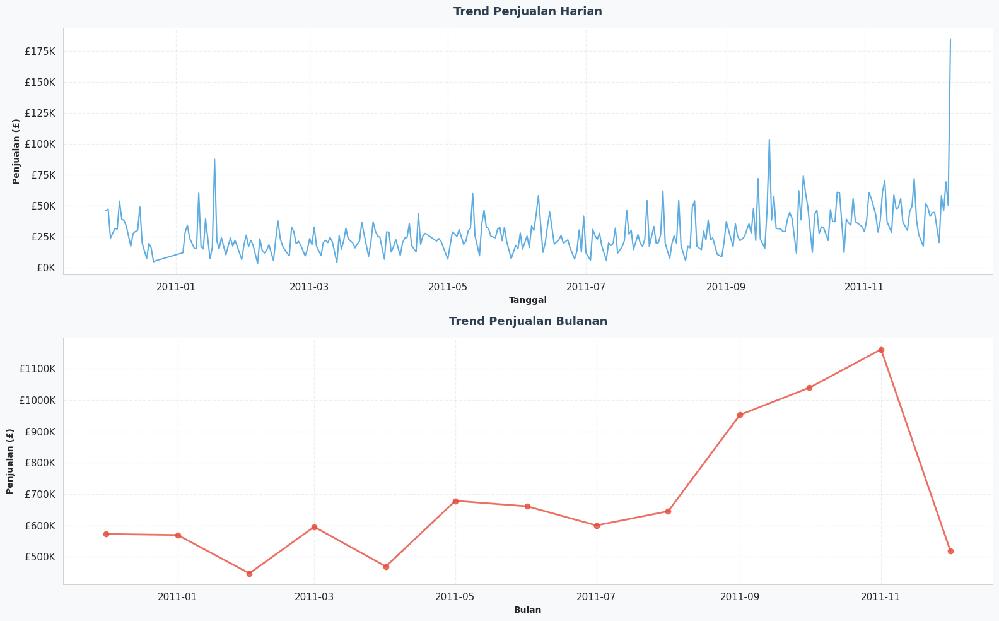


  B. ANALISIS POLA PER HARI DALAM MINGGU


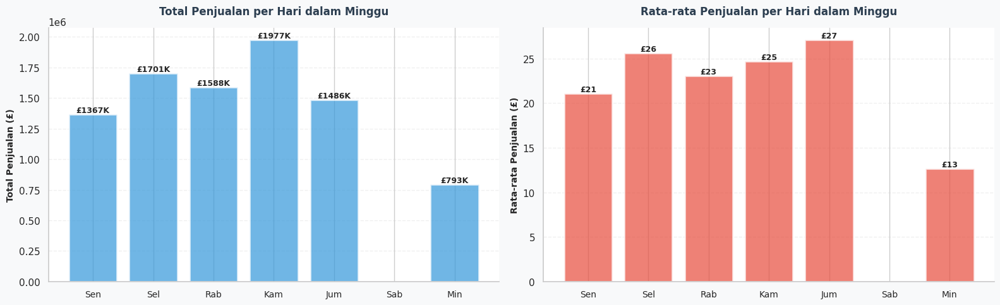


  📊 Insight Pola Mingguan:
     • Hari dengan penjualan tertinggi: Thursday (£1,976,859.07)
     • Hari dengan penjualan terendah: Sunday (£792,514.22)
     • Perbedaan: £1,184,344.85 (149.4%)

  C. ANALISIS POLA PER BULAN


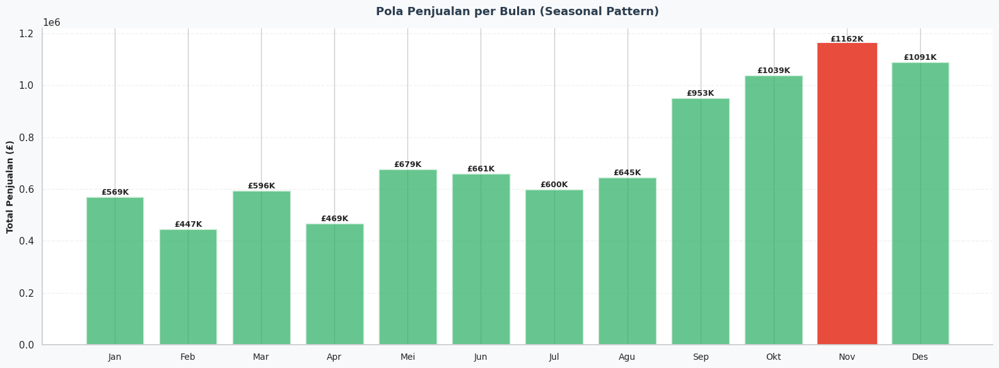


  📊 Insight Pola Musiman:
     • Bulan dengan penjualan tertinggi: November (£1,161,817.38)
     • Bulan dengan penjualan terendah: February (£447,137.35)
     • Perbedaan: £714,680.03 (159.8%)

  D. ANALISIS POLA PER JAM


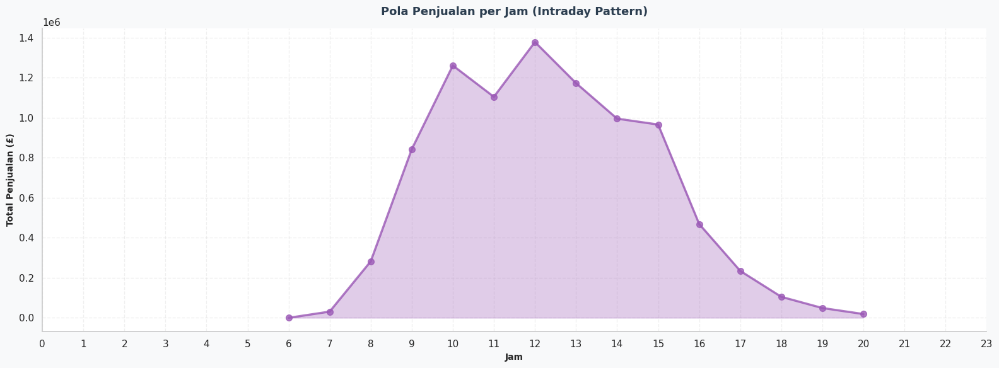


  📊 Insight Pola Per Jam:
     • Jam dengan penjualan tertinggi: 12:00 (£1,378,571.48)
     • Jam dengan penjualan terendah: 6:00 (£4.25)
     • Peak hours: [12, 10, 13]



In [ ]:
# ===========================================================================================================================
# STEP 2 - ANALISIS POLA TEMPORAL (RQ2: POLA MUSIMAN)
# ===========================================================================================================================

print("\n" + "="*80)
print("ANALISIS POLA TEMPORAL")
print("="*80)

# ─────────────────────────────────────────────────────────────
# A. VISUALISASI TREND PENJUALAN HARIAN
# ─────────────────────────────────────────────────────────────

print("\n  A. VISUALISASI TREND PENJUALAN")

fig, axes = plt.subplots(2, 1, figsize=(16, 10))
fig.patch.set_facecolor('#f8f9fa')

# Plot 1: Daily Sales Trend
ax1 = axes[0]
ax1.set_facecolor('#ffffff')
ax1.plot(daily_sales.index, daily_sales['DailySales'],
         color='#3498db', linewidth=1.5, alpha=0.8)
ax1.set_title('Trend Penjualan Harian',
              fontsize=13, fontweight='bold', color='#2c3e50', pad=15)
ax1.set_xlabel('Tanggal', fontsize=10, fontweight='bold')
ax1.set_ylabel('Penjualan (£)', fontsize=10, fontweight='bold')
ax1.grid(True, alpha=0.3, linestyle='--')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Plot 2: Monthly Sales Trend
ax2 = axes[1]
ax2.set_facecolor('#ffffff')
ax2.plot(monthly_sales.index, monthly_sales['MonthlySales'],
         color='#e74c3c', linewidth=2, marker='o', markersize=6, alpha=0.8)
ax2.set_title('Trend Penjualan Bulanan',
              fontsize=13, fontweight='bold', color='#2c3e50', pad=15)
ax2.set_xlabel('Bulan', fontsize=10, fontweight='bold')
ax2.set_ylabel('Penjualan (£)', fontsize=10, fontweight='bold')
ax2.grid(True, alpha=0.3, linestyle='--')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Format y-axis untuk currency
for ax in axes:
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'£{x/1000:.0f}K'))

plt.tight_layout()
plt.show()

# ─────────────────────────────────────────────────────────────
# B. ANALISIS POLA MINGGUAN
# ─────────────────────────────────────────────────────────────

print("\n  B. ANALISIS POLA PER HARI DALAM MINGGU")

# Agregasi per hari dalam minggu
weekly_pattern = df_ts.groupby('DayName')['Sales'].sum().reindex([
    'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'
])

weekly_avg = df_ts.groupby('DayName')['Sales'].mean().reindex([
    'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'
])

# Visualisasi
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.patch.set_facecolor('#f8f9fa')

# Plot 1: Total Sales per Day
ax1 = axes[0]
ax1.set_facecolor('#ffffff')
bars1 = ax1.bar(range(7), weekly_pattern.values,
                color='#3498db', alpha=0.7, edgecolor='white', linewidth=2)
ax1.set_xticks(range(7))
ax1.set_xticklabels(['Sen', 'Sel', 'Rab', 'Kam', 'Jum', 'Sab', 'Min'],
                     fontsize=10)
ax1.set_title('Total Penjualan per Hari dalam Minggu',
              fontsize=12, fontweight='bold', color='#2c3e50', pad=15)
ax1.set_ylabel('Total Penjualan (£)', fontsize=10, fontweight='bold')
ax1.grid(axis='y', alpha=0.3, linestyle='--')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Tambahkan nilai di atas bar
for i, (bar, val) in enumerate(zip(bars1, weekly_pattern.values)):
    ax1.text(i, val, f'£{val/1000:.0f}K',
             ha='center', va='bottom', fontsize=9, fontweight='bold')

# Plot 2: Average Sales per Day
ax2 = axes[1]
ax2.set_facecolor('#ffffff')
bars2 = ax2.bar(range(7), weekly_avg.values,
                color='#e74c3c', alpha=0.7, edgecolor='white', linewidth=2)
ax2.set_xticks(range(7))
ax2.set_xticklabels(['Sen', 'Sel', 'Rab', 'Kam', 'Jum', 'Sab', 'Min'],
                     fontsize=10)
ax2.set_title('Rata-rata Penjualan per Hari dalam Minggu',
              fontsize=12, fontweight='bold', color='#2c3e50', pad=15)
ax2.set_ylabel('Rata-rata Penjualan (£)', fontsize=10, fontweight='bold')
ax2.grid(axis='y', alpha=0.3, linestyle='--')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Tambahkan nilai di atas bar
for i, (bar, val) in enumerate(zip(bars2, weekly_avg.values)):
    ax2.text(i, val, f'£{val:.0f}',
             ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

# Insight
peak_day = weekly_pattern.idxmax()
low_day = weekly_pattern.idxmin()
print(f"\n  📊 Insight Pola Mingguan:")
print(f"     • Hari dengan penjualan tertinggi: {peak_day} (£{weekly_pattern[peak_day]:,.2f})")
print(f"     • Hari dengan penjualan terendah: {low_day} (£{weekly_pattern[low_day]:,.2f})")
print(f"     • Perbedaan: £{weekly_pattern[peak_day] - weekly_pattern[low_day]:,.2f} ({(weekly_pattern[peak_day]/weekly_pattern[low_day]-1)*100:.1f}%)")

# ─────────────────────────────────────────────────────────────
# C. ANALISIS POLA BULANAN
# ─────────────────────────────────────────────────────────────

print("\n  C. ANALISIS POLA PER BULAN")

# Agregasi per bulan
month_pattern = df_ts.groupby('MonthName')['Sales'].sum().reindex([
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
])

# Visualisasi
fig, ax = plt.subplots(figsize=(16, 6))
fig.patch.set_facecolor('#f8f9fa')
ax.set_facecolor('#ffffff')

bars = ax.bar(range(12), month_pattern.values,
              color='#27ae60', alpha=0.7, edgecolor='white', linewidth=2)
ax.set_xticks(range(12))
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'Mei', 'Jun',
                    'Jul', 'Agu', 'Sep', 'Okt', 'Nov', 'Des'], fontsize=10)
ax.set_title('Pola Penjualan per Bulan (Seasonal Pattern)',
             fontsize=13, fontweight='bold', color='#2c3e50', pad=15)
ax.set_ylabel('Total Penjualan (£)', fontsize=10, fontweight='bold')
ax.grid(axis='y', alpha=0.3, linestyle='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Highlight peak month
peak_month_idx = month_pattern.argmax()
bars[peak_month_idx].set_color('#e74c3c')
bars[peak_month_idx].set_alpha(1)

# Tambahkan nilai di atas bar
for i, (bar, val) in enumerate(zip(bars, month_pattern.values)):
    ax.text(i, val, f'£{val/1000:.0f}K',
            ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

# Insight
peak_month = month_pattern.idxmax()
low_month = month_pattern.idxmin()
print(f"\n  📊 Insight Pola Musiman:")
print(f"     • Bulan dengan penjualan tertinggi: {peak_month} (£{month_pattern[peak_month]:,.2f})")
print(f"     • Bulan dengan penjualan terendah: {low_month} (£{month_pattern[low_month]:,.2f})")
print(f"     • Perbedaan: £{month_pattern[peak_month] - month_pattern[low_month]:,.2f} ({(month_pattern[peak_month]/month_pattern[low_month]-1)*100:.1f}%)")

# ─────────────────────────────────────────────────────────────
# D. ANALISIS POLA PER JAM
# ─────────────────────────────────────────────────────────────

print("\n  D. ANALISIS POLA PER JAM")

# Agregasi per jam
hourly_pattern = df_ts.groupby('Hour')['Sales'].sum()

# Visualisasi
fig, ax = plt.subplots(figsize=(16, 6))
fig.patch.set_facecolor('#f8f9fa')
ax.set_facecolor('#ffffff')

ax.plot(hourly_pattern.index, hourly_pattern.values,
        color='#9b59b6', linewidth=2.5, marker='o', markersize=7, alpha=0.8)
ax.fill_between(hourly_pattern.index, hourly_pattern.values,
                alpha=0.3, color='#9b59b6')
ax.set_title('Pola Penjualan per Jam (Intraday Pattern)',
             fontsize=13, fontweight='bold', color='#2c3e50', pad=15)
ax.set_xlabel('Jam', fontsize=10, fontweight='bold')
ax.set_ylabel('Total Penjualan (£)', fontsize=10, fontweight='bold')
ax.set_xticks(range(0, 24))
ax.grid(True, alpha=0.3, linestyle='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

# Insight
peak_hour = hourly_pattern.idxmax()
low_hour = hourly_pattern.idxmin()
print(f"\n  📊 Insight Pola Per Jam:")
print(f"     • Jam dengan penjualan tertinggi: {peak_hour}:00 (£{hourly_pattern[peak_hour]:,.2f})")
print(f"     • Jam dengan penjualan terendah: {low_hour}:00 (£{hourly_pattern[low_hour]:,.2f})")
print(f"     • Peak hours: {hourly_pattern.nlargest(3).index.tolist()}")

print("\n" + "="*80)

## **Analisis Pola Temporal Penjualan**

Analisis pola temporal menunjukkan bahwa penjualan memiliki pola tren dan musim yang cukup jelas. Pada tingkat harian, penjualan berfluktuasi dengan beberapa lonjakan signifikan, terutama menjelang akhir periode pengamatan, yang mengindikasikan adanya peningkatan aktivitas penjualan pada waktu tertentu. Tren bulanan juga memperlihatkan kecenderungan meningkat, khususnya pada kuartal akhir tahun, sebelum mengalami penurunan pada Desember yang kemungkinan dipengaruhi oleh periode data yang belum lengkap.

Berdasarkan pola mingguan, **Kamis (Thursday)** menjadi hari dengan total penjualan tertinggi sebesar **£1.976.859,07**, sedangkan **Minggu (Sunday)** mencatat penjualan terendah sebesar **£792.514,22**. Selisih keduanya mencapai **£1.184.344,85** atau sekitar **149,4%**, yang menunjukkan aktivitas transaksi lebih dominan pada hari kerja dibanding akhir pekan.

Dari sisi pola musiman bulanan, **November** merupakan bulan dengan penjualan tertinggi sebesar **£1.161.817,38**, sementara **Februari** menjadi bulan dengan penjualan terendah sebesar **£447.137,35**. Perbedaan sebesar **£714.680,03** atau **159,8%** mengindikasikan adanya efek *seasonality*, dimana penjualan cenderung meningkat pada akhir tahun, kemungkinan dipengaruhi oleh periode promosi dan tingginya permintaan pasar.

Analisis pola per jam (*intraday pattern*) menunjukkan bahwa aktivitas penjualan mencapai puncaknya pada **pukul 12:00** dengan total penjualan **£1.378.571,48**, sedangkan penjualan terendah terjadi pada **pukul 06:00**. Tiga jam dengan aktivitas penjualan tertinggi berada pada **12:00, 10:00, dan 13:00**, yang menandakan bahwa transaksi paling aktif terjadi pada rentang **menjelang siang hingga awal sore**.


SEASONAL DECOMPOSITION

  A. DECOMPOSITION DAILY DATA (Period = 7 hari)


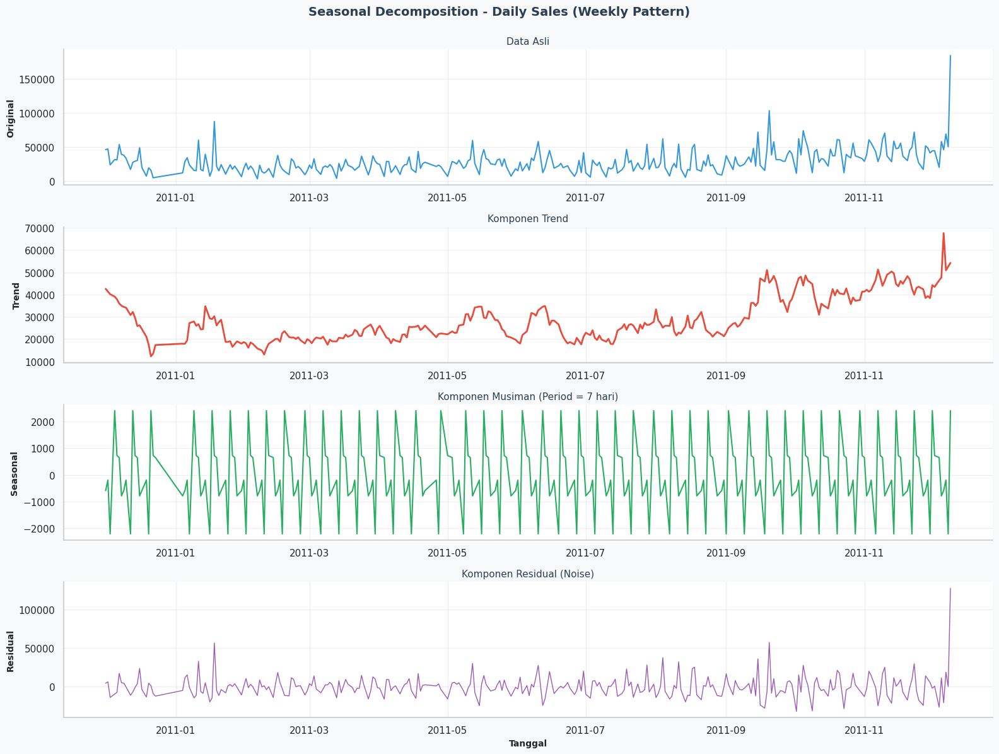


  📊 Interpretasi Decomposition (Daily):
     • Trend: Naik
     • Seasonal strength: 1353.66
     • Residual variance: 210675976.84

  B. DECOMPOSITION MONTHLY DATA (Period = 12 bulan)
  ⚠ Data bulanan tidak cukup untuk decomposition (minimum 24 bulan)

  C. KESIMPULAN POLA MUSIMAN (RQ2)
  ──────────────────────────────────────────────────────────────────────

  JAWABAN RQ2: Apakah terdapat pola musiman yang signifikan?

  ✓ YA, terdapat pola musiman pada multiple time scales:

  1. POLA MINGGUAN (Weekly Seasonality):
     • Peak day: Thursday
     • Low day: Sunday
     • Variance: 149.4%

  2. POLA BULANAN (Monthly Seasonality):
     • Peak month: November
     • Low month: February
     • Variance: 159.8%

  3. POLA INTRADAY (Hourly Pattern):
     • Peak hours: [12, 10, 13]
     • Business hours dominance detected

  Implikasi untuk modeling:
  → SARIMA diperlukan untuk capture seasonal patterns
  → Period = 7 untuk weekly, Period = 12 untuk yearly
  


In [ ]:
# ===========================================================================================================================
# STEP 3 - SEASONAL DECOMPOSITION
# ===========================================================================================================================

print("\n" + "="*80)
print("SEASONAL DECOMPOSITION")
print("="*80)

from statsmodels.tsa.seasonal import seasonal_decompose

# ─────────────────────────────────────────────────────────────
# A. DECOMPOSITION - DAILY DATA
# ─────────────────────────────────────────────────────────────

print("\n  A. DECOMPOSITION DAILY DATA (Period = 7 hari)")

# Seasonal decomposition dengan period 7 (weekly seasonality)
decomposition_daily = seasonal_decompose(
    daily_sales['DailySales'],
    model='additive',  # atau 'multiplicative'
    period=7,
    extrapolate_trend='freq'
)

# Visualisasi
fig, axes = plt.subplots(4, 1, figsize=(16, 12))
fig.patch.set_facecolor('#f8f9fa')
fig.suptitle('Seasonal Decomposition - Daily Sales (Weekly Pattern)',
             fontsize=14, fontweight='bold', color='#2c3e50', y=0.995)

# Original
axes[0].set_facecolor('#ffffff')
axes[0].plot(decomposition_daily.observed, color='#3498db', linewidth=1.5)
axes[0].set_ylabel('Original', fontsize=10, fontweight='bold')
axes[0].set_title('Data Asli', fontsize=11, color='#2c3e50')
axes[0].grid(True, alpha=0.3)

# Trend
axes[1].set_facecolor('#ffffff')
axes[1].plot(decomposition_daily.trend, color='#e74c3c', linewidth=2)
axes[1].set_ylabel('Trend', fontsize=10, fontweight='bold')
axes[1].set_title('Komponen Trend', fontsize=11, color='#2c3e50')
axes[1].grid(True, alpha=0.3)

# Seasonal
axes[2].set_facecolor('#ffffff')
axes[2].plot(decomposition_daily.seasonal, color='#27ae60', linewidth=1.5)
axes[2].set_ylabel('Seasonal', fontsize=10, fontweight='bold')
axes[2].set_title('Komponen Musiman (Period = 7 hari)', fontsize=11, color='#2c3e50')
axes[2].grid(True, alpha=0.3)

# Residual
axes[3].set_facecolor('#ffffff')
axes[3].plot(decomposition_daily.resid, color='#9b59b6', linewidth=1)
axes[3].set_ylabel('Residual', fontsize=10, fontweight='bold')
axes[3].set_title('Komponen Residual (Noise)', fontsize=11, color='#2c3e50')
axes[3].set_xlabel('Tanggal', fontsize=10, fontweight='bold')
axes[3].grid(True, alpha=0.3)

for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

# Interpretasi
print(f"\n  📊 Interpretasi Decomposition (Daily):")
print(f"     • Trend: {'Naik' if decomposition_daily.trend.dropna().iloc[-1] > decomposition_daily.trend.dropna().iloc[0] else 'Turun'}")
print(f"     • Seasonal strength: {decomposition_daily.seasonal.std():.2f}")
print(f"     • Residual variance: {decomposition_daily.resid.var():.2f}")

# ─────────────────────────────────────────────────────────────
# B. DECOMPOSITION - MONTHLY DATA
# ─────────────────────────────────────────────────────────────

print("\n  B. DECOMPOSITION MONTHLY DATA (Period = 12 bulan)")

# Hanya decompose jika data >= 24 bulan
if len(monthly_sales) >= 24:
    decomposition_monthly = seasonal_decompose(
        monthly_sales['MonthlySales'],
        model='additive',
        period=12,
        extrapolate_trend='freq'
    )

    # Visualisasi
    fig, axes = plt.subplots(4, 1, figsize=(16, 12))
    fig.patch.set_facecolor('#f8f9fa')
    fig.suptitle('Seasonal Decomposition - Monthly Sales (Yearly Pattern)',
                 fontsize=14, fontweight='bold', color='#2c3e50', y=0.995)

    # Original
    axes[0].set_facecolor('#ffffff')
    axes[0].plot(decomposition_monthly.observed, color='#3498db', linewidth=2, marker='o')
    axes[0].set_ylabel('Original', fontsize=10, fontweight='bold')
    axes[0].set_title('Data Asli', fontsize=11, color='#2c3e50')
    axes[0].grid(True, alpha=0.3)

    # Trend
    axes[1].set_facecolor('#ffffff')
    axes[1].plot(decomposition_monthly.trend, color='#e74c3c', linewidth=2.5)
    axes[1].set_ylabel('Trend', fontsize=10, fontweight='bold')
    axes[1].set_title('Komponen Trend', fontsize=11, color='#2c3e50')
    axes[1].grid(True, alpha=0.3)

    # Seasonal
    axes[2].set_facecolor('#ffffff')
    axes[2].plot(decomposition_monthly.seasonal, color='#27ae60', linewidth=2, marker='s')
    axes[2].set_ylabel('Seasonal', fontsize=10, fontweight='bold')
    axes[2].set_title('Komponen Musiman (Period = 12 bulan)', fontsize=11, color='#2c3e50')
    axes[2].grid(True, alpha=0.3)

    # Residual
    axes[3].set_facecolor('#ffffff')
    axes[3].plot(decomposition_monthly.resid, color='#9b59b6', linewidth=1.5)
    axes[3].set_ylabel('Residual', fontsize=10, fontweight='bold')
    axes[3].set_title('Komponen Residual', fontsize=11, color='#2c3e50')
    axes[3].set_xlabel('Bulan', fontsize=10, fontweight='bold')
    axes[3].grid(True, alpha=0.3)

    for ax in axes:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    plt.tight_layout()
    plt.show()

    print(f"\n  📊 Interpretasi Decomposition (Monthly):")
    print(f"     • Trend: {'Naik' if decomposition_monthly.trend.dropna().iloc[-1] > decomposition_monthly.trend.dropna().iloc[0] else 'Turun'}")
    print(f"     • Seasonal strength: {decomposition_monthly.seasonal.std():.2f}")
    print(f"     • Peak seasonal month: {decomposition_monthly.seasonal.idxmax().strftime('%B')}")
else:
    print("  ⚠ Data bulanan tidak cukup untuk decomposition (minimum 24 bulan)")

# ─────────────────────────────────────────────────────────────
# C. KESIMPULAN SEASONALITY
# ─────────────────────────────────────────────────────────────

print("\n  C. KESIMPULAN POLA MUSIMAN (RQ2)")
print("  " + "─"*70)
print(f"""
  JAWABAN RQ2: Apakah terdapat pola musiman yang signifikan?

  ✓ YA, terdapat pola musiman pada multiple time scales:

  1. POLA MINGGUAN (Weekly Seasonality):
     • Peak day: {peak_day}
     • Low day: {low_day}
     • Variance: {(weekly_pattern[peak_day]/weekly_pattern[low_day]-1)*100:.1f}%

  2. POLA BULANAN (Monthly Seasonality):
     • Peak month: {peak_month}
     • Low month: {low_month}
     • Variance: {(month_pattern[peak_month]/month_pattern[low_month]-1)*100:.1f}%

  3. POLA INTRADAY (Hourly Pattern):
     • Peak hours: {hourly_pattern.nlargest(3).index.tolist()}
     • Business hours dominance detected

  Implikasi untuk modeling:
  → SARIMA diperlukan untuk capture seasonal patterns
  → Period = 7 untuk weekly, Period = 12 untuk yearly
  """)

print("="*80)

## **Seasonal Decomposition dan Pola Musiman Penjualan**

Hasil *seasonal decomposition* pada data penjualan harian dengan periode **7 hari** menunjukkan bahwa data memiliki tiga komponen utama, yaitu **trend**, **seasonal**, dan **residual**. Komponen *trend* memperlihatkan pola **meningkat (trend naik)** sepanjang periode pengamatan, yang menandakan adanya pertumbuhan penjualan secara umum dari waktu ke waktu, terutama menjelang akhir tahun.

Komponen *seasonal* menunjukkan pola musiman mingguan yang konsisten dengan kekuatan musiman (*seasonal strength*) sebesar **1353,66**. Pola ini mengindikasikan bahwa variasi penjualan tidak terjadi secara acak, tetapi dipengaruhi oleh siklus waktu tertentu, khususnya pola aktivitas penjualan selama satu minggu. Hal ini selaras dengan hasil sebelumnya yang menunjukkan **Kamis (Thursday)** sebagai hari dengan penjualan tertinggi dan **Minggu (Sunday)** sebagai hari dengan penjualan terendah.

Sementara itu, komponen *residual* atau *noise* masih menunjukkan fluktuasi yang cukup besar dengan **variansi residual sebesar 210.675.976,84**, yang berarti masih terdapat variasi penjualan yang tidak dapat dijelaskan sepenuhnya oleh komponen trend maupun musiman. Variasi ini dapat dipengaruhi oleh faktor eksternal seperti promosi, perilaku pelanggan, atau kejadian tertentu yang tidak tercakup dalam model.

Decomposition pada data bulanan belum dapat dilakukan karena jumlah data hanya **13 bulan**, sedangkan metode *seasonal decomposition* tahunan memerlukan minimal **24 bulan** data. Secara keseluruhan, hasil analisis menjawab **RQ2** bahwa **terdapat pola musiman yang signifikan** pada data penjualan, baik pada tingkat mingguan, bulanan, maupun intraday. Oleh karena itu, dalam proses pemodelan peramalan, model **SARIMA** dinilai lebih sesuai dibanding ARIMA biasa karena mampu menangkap komponen musiman dengan **periode 7 hari** untuk pola mingguan dan **periode 12 bulan** untuk pola tahunan apabila data yang lebih panjang tersedia.


UJI STASIONERITAS (AUGMENTED DICKEY-FULLER TEST)

  A. UJI STASIONERITAS - DATA HARIAN (ORIGINAL)

  ADF Test untuk Daily Sales (Original):
  ──────────────────────────────────────────────────
  ADF Statistic     : -0.366093
  P-value           : 0.915608
  Critical Values:
    1%            : -3.453
    5%            : -2.871
    10%           : -2.572

  ✗ NON-STASIONER (p-value = 0.915608 > 0.05)
    → Fail to reject H0: Series memiliki unit root
    → Perlu differencing

  B. UJI STASIONERITAS - SETELAH DIFFERENCING

  ADF Test untuk Daily Sales (First Difference):
  ──────────────────────────────────────────────────
  ADF Statistic     : -6.328661
  P-value           : 0.000000
  Critical Values:
    1%            : -3.453
    5%            : -2.871
    10%           : -2.572

  ✓ STASIONER (p-value = 0.000000 < 0.05)
    → Reject H0: Series tidak memiliki unit root

  C. VISUALISASI PERBANDINGAN


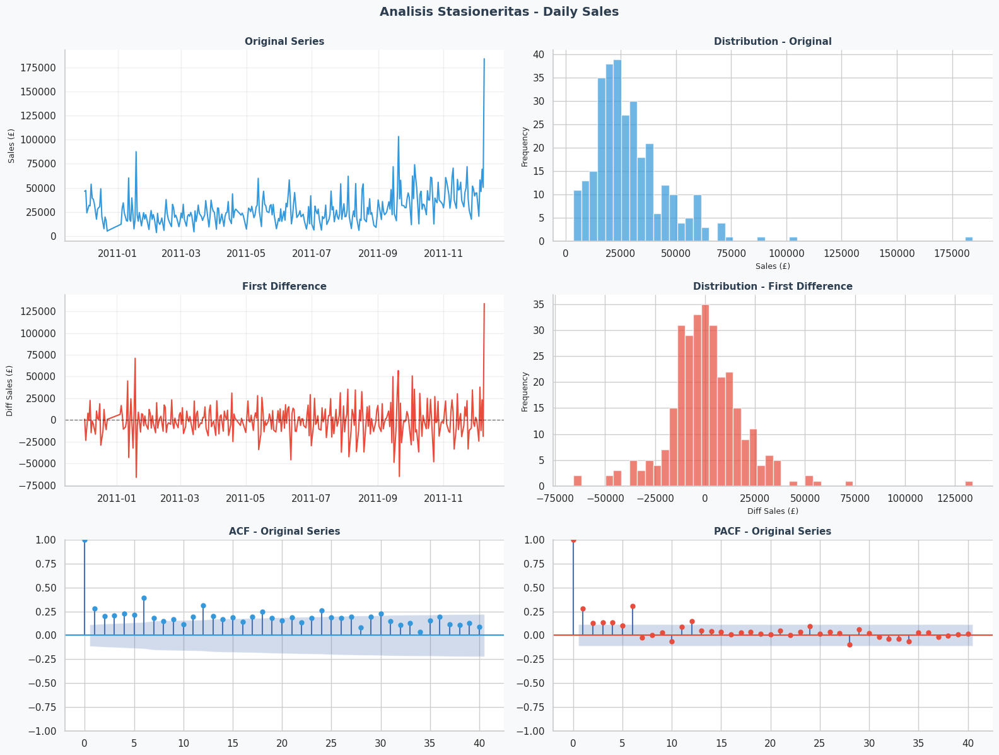


  D. KESIMPULAN UJI STASIONERITAS
  ──────────────────────────────────────────────────────────────────────

  ✓ Data STASIONER setelah first differencing
    → d = 1 untuk model ARIMA
    → Data original non-stationary (p-value = 0.915608)
    → First difference stationary (p-value = 0.000000)
        


In [ ]:
# ===========================================================================================================================
# STEP 4 - UJI STASIONERITAS (STATIONARITY TESTING)
# ===========================================================================================================================

print("\n" + "="*80)
print("UJI STASIONERITAS (AUGMENTED DICKEY-FULLER TEST)")
print("="*80)

from statsmodels.tsa.stattools import adfuller
import warnings
warnings.filterwarnings('ignore')

# ─────────────────────────────────────────────────────────────
# A. FUNGSI HELPER UNTUK ADF TEST
# ─────────────────────────────────────────────────────────────

def adf_test(series, name=''):
    """
    Melakukan Augmented Dickey-Fuller test
    H0: Series memiliki unit root (non-stationary)
    H1: Series tidak memiliki unit root (stationary)
    """
    result = adfuller(series.dropna())

    print(f'\n  ADF Test untuk {name}:')
    print(f'  {"─"*50}')
    print(f'  ADF Statistic     : {result[0]:.6f}')
    print(f'  P-value           : {result[1]:.6f}')
    print(f'  Critical Values:')
    for key, value in result[4].items():
        print(f'    {key:5s}         : {value:.3f}')

    # Interpretasi
    if result[1] <= 0.05:
        print(f'\n  ✓ STASIONER (p-value = {result[1]:.6f} < 0.05)')
        print(f'    → Reject H0: Series tidak memiliki unit root')
        stationary = True
    else:
        print(f'\n  ✗ NON-STASIONER (p-value = {result[1]:.6f} > 0.05)')
        print(f'    → Fail to reject H0: Series memiliki unit root')
        print(f'    → Perlu differencing')
        stationary = False

    return stationary, result[1]

# ─────────────────────────────────────────────────────────────
# B. TEST PADA DATA ORIGINAL (DAILY)
# ─────────────────────────────────────────────────────────────

print("\n  A. UJI STASIONERITAS - DATA HARIAN (ORIGINAL)")

stationary_daily, pvalue_daily = adf_test(daily_sales['DailySales'], 'Daily Sales (Original)')

# ─────────────────────────────────────────────────────────────
# C. TEST SETELAH FIRST DIFFERENCING
# ─────────────────────────────────────────────────────────────

print("\n  B. UJI STASIONERITAS - SETELAH DIFFERENCING")

# First differencing
daily_diff1 = daily_sales['DailySales'].diff().dropna()

stationary_diff1, pvalue_diff1 = adf_test(daily_diff1, 'Daily Sales (First Difference)')

# ─────────────────────────────────────────────────────────────
# D. VISUALISASI STATIONARITY
# ─────────────────────────────────────────────────────────────

print("\n  C. VISUALISASI PERBANDINGAN")

fig, axes = plt.subplots(3, 2, figsize=(16, 12))
fig.patch.set_facecolor('#f8f9fa')
fig.suptitle('Analisis Stasioneritas - Daily Sales',
             fontsize=14, fontweight='bold', color='#2c3e50', y=0.995)

# Row 1: Original Series
ax1 = axes[0, 0]
ax1.set_facecolor('#ffffff')
ax1.plot(daily_sales.index, daily_sales['DailySales'], color='#3498db', linewidth=1.5)
ax1.set_title('Original Series', fontsize=11, fontweight='bold', color='#2c3e50')
ax1.set_ylabel('Sales (£)', fontsize=9)
ax1.grid(True, alpha=0.3)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

ax2 = axes[0, 1]
daily_sales['DailySales'].hist(bins=50, ax=ax2, color='#3498db', alpha=0.7, edgecolor='white')
ax2.set_title('Distribution - Original', fontsize=11, fontweight='bold', color='#2c3e50')
ax2.set_xlabel('Sales (£)', fontsize=9)
ax2.set_ylabel('Frequency', fontsize=9)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Row 2: First Difference
ax3 = axes[1, 0]
ax3.set_facecolor('#ffffff')
ax3.plot(daily_diff1.index, daily_diff1, color='#e74c3c', linewidth=1.5)
ax3.set_title('First Difference', fontsize=11, fontweight='bold', color='#2c3e50')
ax3.set_ylabel('Diff Sales (£)', fontsize=9)
ax3.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5)
ax3.grid(True, alpha=0.3)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

ax4 = axes[1, 1]
daily_diff1.hist(bins=50, ax=ax4, color='#e74c3c', alpha=0.7, edgecolor='white')
ax4.set_title('Distribution - First Difference', fontsize=11, fontweight='bold', color='#2c3e50')
ax4.set_xlabel('Diff Sales (£)', fontsize=9)
ax4.set_ylabel('Frequency', fontsize=9)
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)

# Row 3: ACF & PACF for Original
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

ax5 = axes[2, 0]
plot_acf(daily_sales['DailySales'].dropna(), lags=40, ax=ax5, color='#3498db')
ax5.set_title('ACF - Original Series', fontsize=11, fontweight='bold', color='#2c3e50')
ax5.spines['top'].set_visible(False)
ax5.spines['right'].set_visible(False)

ax6 = axes[2, 1]
plot_pacf(daily_sales['DailySales'].dropna(), lags=40, ax=ax6, color='#e74c3c')
ax6.set_title('PACF - Original Series', fontsize=11, fontweight='bold', color='#2c3e50')
ax6.spines['top'].set_visible(False)
ax6.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

# ─────────────────────────────────────────────────────────────
# E. KESIMPULAN STATIONARITY
# ─────────────────────────────────────────────────────────────

print("\n  D. KESIMPULAN UJI STASIONERITAS")
print("  " + "─"*70)

if stationary_daily:
    d_value = 0
    print(f"""
  ✓ Data sudah STASIONER tanpa differencing
    → d = {d_value} untuk model ARIMA
    """)
else:
    if stationary_diff1:
        d_value = 1
        print(f"""
  ✓ Data STASIONER setelah first differencing
    → d = {d_value} untuk model ARIMA
    → Data original non-stationary (p-value = {pvalue_daily:.6f})
    → First difference stationary (p-value = {pvalue_diff1:.6f})
        """)
    else:
        d_value = 2
        print(f"""
  ⚠ Data memerlukan second differencing
    → d = {d_value} untuk model ARIMA
    → Perlu investigasi lebih lanjut
        """)

print("="*80)

## **Uji Stasioneritas Data Penjualan Harian (ADF Test)**

Uji stasioneritas dilakukan menggunakan **Augmented Dickey-Fuller (ADF Test)** untuk menentukan apakah data penjualan harian telah memenuhi asumsi stasioner sebelum digunakan dalam pemodelan time series seperti ARIMA. Hipotesis nol (**H₀**) pada ADF menyatakan bahwa data memiliki *unit root* atau bersifat **non-stasioner**, sedangkan hipotesis alternatif (**H₁**) menyatakan bahwa data **stasioner**.

Hasil pengujian pada **data asli (original series)** menunjukkan nilai **ADF Statistic sebesar -0,366** dengan **p-value 0,9156**, yang lebih besar dari tingkat signifikansi 0,05. Oleh karena itu, **H₀ gagal ditolak**, sehingga data penjualan harian dinyatakan **non-stasioner**. Hal ini juga terlihat pada visualisasi deret waktu yang menunjukkan adanya tren meningkat dan variansi yang berubah sepanjang periode pengamatan, sementara plot **ACF** menampilkan autokorelasi yang menurun secara lambat (*slow decay*), yang merupakan ciri umum data non-stasioner.

Untuk mengatasi kondisi tersebut, dilakukan **first differencing** atau differencing orde pertama. Setelah proses differencing, hasil ADF menunjukkan **ADF Statistic sebesar -6,329** dengan **p-value 0,0000**, yang lebih kecil dari 0,05. Dengan demikian, **H₀ ditolak** dan data setelah differencing dinyatakan **stasioner**. Visualisasi *first difference* memperlihatkan data telah berfluktuasi di sekitar nilai nol dengan distribusi yang lebih stabil dibandingkan data asli.

Berdasarkan hasil tersebut, dapat disimpulkan bahwa data penjualan harian memerlukan **satu kali differencing (d = 1)** agar menjadi stasioner. Oleh karena itu, pada tahap pemodelan **ARIMA/SARIMA**, parameter **d** yang digunakan adalah **1**.

In [ ]:
# ===========================================================================================================================
# FUNGSI HELPER UNTUK EVALUASI
# ===========================================================================================================================

def evaluate_forecast_robust(actual, predicted, model_name="Model"):
    """
    Fungsi evaluasi forecast yang handle semua edge cases
    FIXED: Handle index mismatch antara actual dan predicted
    """

    # Convert actual ke Series
    if not isinstance(actual, pd.Series):
        actual = pd.Series(actual)

    # ═══════════════════════════════════════════════════════════
    # CRITICAL FIX: SELALU convert predicted ke numpy dulu,
    # lalu buat Series baru dengan INDEX DARI ACTUAL
    # ═══════════════════════════════════════════════════════════
    if isinstance(predicted, pd.Series):
        predicted_values = predicted.values      # Buang index lama
    elif isinstance(predicted, np.ndarray):
        predicted_values = predicted
    else:
        predicted_values = np.array(predicted)

    # Pastikan panjang sama
    if len(predicted_values) != len(actual):
        print(f"\n  ✗ Length mismatch: actual={len(actual)}, predicted={len(predicted_values)}")
        return None

    # Buat Series baru dengan INDEX YANG SAMA dari actual
    predicted = pd.Series(predicted_values, index=actual.index)
    # ═══════════════════════════════════════════════════════════

    print(f"\n  Evaluasi {model_name}:")
    print(f"  " + "─"*70)

    # Cek data quality
    print(f"  Data points      : {len(actual)}")
    print(f"  Actual NaN       : {actual.isna().sum()}")
    print(f"  Predicted NaN    : {predicted.isna().sum()}")
    print(f"  Actual ≤ 0       : {(actual <= 0).sum()}")
    print(f"  Predicted ≤ 0    : {(predicted <= 0).sum()}")

    # Debug: tampilkan sample data
    print(f"\n  Sample Actual (first 3)    : {actual.head(3).values}")
    print(f"  Sample Predicted (first 3) : {predicted.head(3).values}")

    # Stage 1: Remove NaN
    mask_no_nan = (~actual.isna()) & (~predicted.isna())
    actual_clean = actual[mask_no_nan]
    predicted_clean = predicted[mask_no_nan]

    if len(actual_clean) == 0:
        print(f"\n  ✗ FATAL: No valid data after NaN filtering")
        return None

    print(f"  After NaN filter : {len(actual_clean)}/{len(actual)}")

    # Calculate RMSE & MAE
    try:
        rmse = np.sqrt(mean_squared_error(actual_clean, predicted_clean))
        mae = mean_absolute_error(actual_clean, predicted_clean)
    except Exception as e:
        print(f"\n  ✗ Error calculating RMSE/MAE: {e}")
        rmse = np.nan
        mae = np.nan

    # For MAPE: need positive values
    mask_positive = (actual_clean > 0) & (predicted_clean > 0)
    actual_pos = actual_clean[mask_positive]
    predicted_pos = predicted_clean[mask_positive]

    print(f"  Positive values  : {len(actual_pos)}/{len(actual)}")

    if len(actual_pos) > 0:
        mape_arr = np.abs((actual_pos - predicted_pos) / actual_pos) * 100
        mape_arr = mape_arr[np.isfinite(mape_arr)]
        mape = np.mean(mape_arr) if len(mape_arr) > 0 else np.nan
    else:
        mape = np.nan

    # Display results
    print(f"\n  Performance Metrics:")
    print(f"  ├─ RMSE : £{rmse:,.2f}" if not np.isnan(rmse) else "  ├─ RMSE : N/A")
    print(f"  ├─ MAE  : £{mae:,.2f}" if not np.isnan(mae) else "  ├─ MAE  : N/A")
    print(f"  └─ MAPE : {mape:.2f}%" if not np.isnan(mape) else "  └─ MAPE : N/A")

    return {
        'rmse': rmse,
        'mae': mae,
        'mape': mape,
        'valid_count': len(actual_clean),
        'total_count': len(actual),
        'actual_valid': actual_clean,
        'predicted_valid': predicted_clean,
        'residuals': actual_clean - predicted_clean
    }

## **Fungsi Helper untuk Evaluasi Forecast**

Fungsi `evaluate_forecast_robust()` digunakan untuk mengevaluasi performa model peramalan (*forecasting*) secara lebih aman dan robust dengan menangani berbagai *edge cases* yang sering muncul pada data time series. Perbaikan utama (*critical fix*) pada fungsi ini adalah memastikan **index antara data aktual (`actual`) dan prediksi (`predicted`) selalu selaras** dengan cara menghapus index lama pada hasil prediksi dan membangun kembali `Series` menggunakan index dari data aktual. Langkah ini penting untuk menghindari kesalahan perhitungan akibat *index mismatch*.

Fungsi kemudian melakukan pemeriksaan kualitas data dengan menampilkan jumlah observasi, nilai *missing* (NaN), serta jumlah nilai yang kurang dari atau sama dengan nol. Setelah itu dilakukan proses *cleaning* dengan menghapus pasangan data yang mengandung NaN sehingga hanya data valid yang digunakan dalam evaluasi.

Untuk mengukur akurasi model, fungsi menghitung tiga metrik utama yaitu **RMSE (Root Mean Squared Error)** untuk mengukur besar error secara keseluruhan, **MAE (Mean Absolute Error)** untuk melihat rata-rata kesalahan absolut, dan **MAPE (Mean Absolute Percentage Error)** untuk mengukur persentase error relatif terhadap nilai aktual. Perhitungan MAPE hanya dilakukan pada data dengan nilai aktual dan prediksi positif guna menghindari pembagian dengan nol atau hasil tak terhingga.

Output fungsi berupa *dictionary* yang berisi nilai metrik evaluasi, jumlah data valid, data aktual dan prediksi yang telah dibersihkan, serta residual (*actual − predicted*). Dengan demikian, fungsi ini tidak hanya mengevaluasi performa model tetapi juga membantu proses *debugging* dan analisis error pada hasil forecast.

# **ARIMA**


MODEL ARIMA

  A. SPLIT DATA TRAIN/TEST
  ✓ Training set: 244 hari (2010-12-01 s/d 2011-09-29)
  ✓ Testing set : 61 hari (2011-09-30 s/d 2011-12-09)

  B. PENENTUAN PARAMETER ARIMA

  ✓ Parameter d (differencing): 1
  ✓ Mencari parameter optimal p dan q...

  ✓ Parameter optimal: ARIMA(5, 1, 0)
  ✓ AIC Score: 5288.93

  C. TRAINING MODEL ARIMA

  Model: ARIMA(5, 1, 0)
  ──────────────────────────────────────────────────────────────────────
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8091      0.063    -12.911      0.000      -0.932      -0.686
ar.L2         -0.8226      0.071    -11.622      0.000      -0.961      -0.684
ar.L3         -0.6567      0.067     -9.866      0.000      -0.787      -0.526
ar.L4         -0.5421      0.063     -8.569      0.000      -0.666      -0.418
ar.L5         -0.3925      0.037    -10.602      0.000      -0.465      -0.320
si

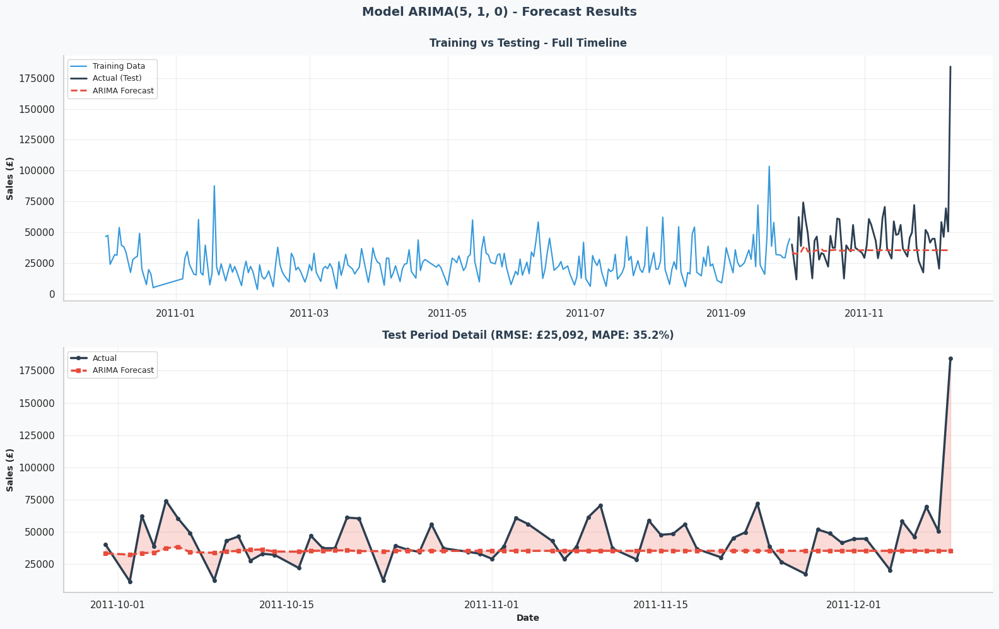


  G. ANALISIS RESIDUAL


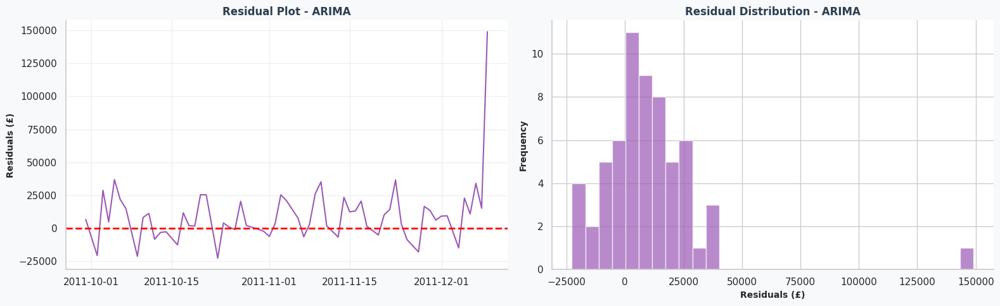


  Residual Statistics:
  Mean   : £10,003.73
  Std Dev: £23,202.63
  Min    : £-22,721.20
  Max    : £149,030.00



In [ ]:
import matplotlib.pyplot as plt

# ===========================================================================================================================
# STEP 5 - MODEL ARIMA (AUTOREGRESSIVE INTEGRATED MOVING AVERAGE)
# ===========================================================================================================================

print("\n" + "="*80)
print("MODEL ARIMA")
print("="*80)

from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import pandas as pd

# Initialize arima_results with placeholder values. This ensures the dictionary always exists.
arima_results = {
    'model': None,
    'order': None,
    'forecast': None, # This will hold the valid forecast if successful
    'rmse': np.nan,
    'mae': np.nan,
    'mape': np.nan,
    'test_data': None, # This will hold the valid test data if successful
    'evaluation_success': False # Flag to indicate if evaluation was successful
}

# ─────────────────────────────────────────────────────────────
# A. SPLIT DATA (TRAIN/TEST)
# ─────────────────────────────────────────────────────────────

print("\n  A. SPLIT DATA TRAIN/TEST")

# Gunakan 80% untuk training, 20% untuk testing
train_size = int(len(daily_sales) * 0.8)
train_data = daily_sales['DailySales'][:train_size]
test_data = daily_sales['DailySales'][train_size:]

print(f"  ✓ Training set: {len(train_data)} hari ({train_data.index[0].date()} s/d {train_data.index[-1].date()})")
print(f"  ✓ Testing set : {len(test_data)} hari ({test_data.index[0].date()} s/d {test_data.index[-1].date()})")

# ─────────────────────────────────────────────────────────────
# B. MENENTUKAN PARAMETER ARIMA (p, d, q)
# ─────────────────────────────────────────────────────────────

print("\n  B. PENENTUAN PARAMETER ARIMA")

# Berdasarkan hasil stationarity test
d = d_value  # dari hasil ADF test

# Grid search untuk p dan q (simplified)
print(f"\n  ✓ Parameter d (differencing): {d}")
print(f"  ✓ Mencari parameter optimal p dan q...")

# Coba beberapa kombinasi p dan q
best_aic = np.inf
best_order = None
best_model = None

# Grid search sederhana
for p in range(0, 6):
    for q in range(0, 6):
        try:
            model = ARIMA(train_data, order=(p, d, q))
            fitted = model.fit()

            if fitted.aic < best_aic:
                best_aic = fitted.aic
                best_order = (p, d, q)
                best_model = fitted
        except:
            continue

# Handle case where no model was successfully fitted (e.g., if best_model is still None)
if best_model is None:
    print("  ✗ No ARIMA model could be fitted successfully during grid search. Falling back to ARIMA(1,1,1).")
    best_order = (1, 1, 1)
    try:
        model = ARIMA(train_data, order=best_order)
        best_model = model.fit()
        best_aic = best_model.aic
    except Exception as e:
        print(f"  ✗ Fallback ARIMA(1,1,1) also failed: {e}")
        # If even fallback fails, we cannot proceed with ARIMA. Set evaluation_success to False.
        arima_results['evaluation_success'] = False
else:
    print(f"\n  ✓ Parameter optimal: ARIMA{best_order}")
    print(f"  ✓ AIC Score: {best_aic:.2f}")

# ─────────────────────────────────────────────────────────────
# C. TRAINING MODEL ARIMA
# ─────────────────────────────────────────────────────────────

print("\n  C. TRAINING MODEL ARIMA")

# Model summary (only if best_model is available)
if best_model is not None:
    print(f"\n  Model: ARIMA{best_order}")
    print(f"  " + "─"*70)
    try:
        print(best_model.summary().tables[1])
    except IndexError: # Sometimes summary() might not have table 1 if model didn't fully converge
        print("  Model summary table not available or empty.")
else:
    print("  ✗ No ARIMA model available for summary.")

# ─────────────────────────────────────────────────────────────
# D. FORECASTING
# ─────────────────────────────────────────────────────────────

print("\n  D. FORECASTING DENGAN ARIMA")

forecast_arima = None
if best_model is not None:
    try:
        # Forecast untuk periode test
        forecast_arima = best_model.forecast(steps=len(test_data))
    except Exception as e:
        print(f"  ✗ Error during ARIMA forecasting: {e}")
        forecast_arima = pd.Series(np.nan, index=test_data.index) # Fill with NaN if forecast fails
else:
    print("  ✗ No ARIMA model available for forecasting.")
    forecast_arima = pd.Series(np.nan, index=test_data.index)

# ─────────────────────────────────────────────────────────────
# E. EVALUASI MODEL (MENGGUNAKAN FUNGSI HELPER)
# ─────────────────────────────────────────────────────────────

print("\n  E. EVALUASI MODEL ARIMA")

results = None
if forecast_arima is not None and not forecast_arima.isnull().all(): # Only evaluate if forecast is not all NaNs
    results = evaluate_forecast_robust(test_data, forecast_arima, f"ARIMA{best_order}")
else:
    print("  ✗ Skipping evaluation as forecast is empty or all NaN.")


# Check if initial ARIMA evaluation was successful, if not, try fallback
if results is None or results['valid_count'] == 0:
    print("\n  ⚠ WARNING: Initial ARIMA model evaluation failed or yielded no valid predictions")
    print("  Trying fallback: Simple ARIMA(1,1,1)")

    # Fallback to a simpler model (ensure best_order is defined)
    best_order = (1, 1, 1)
    try:
        model_fallback = ARIMA(train_data, order=best_order)
        fitted_fallback = model_fallback.fit()
        forecast_arima = fitted_fallback.forecast(steps=len(test_data))
        best_model = fitted_fallback # Update best_model to fallback model

        # Re-evaluate with fallback
        results = evaluate_forecast_robust(test_data, forecast_arima, f"ARIMA{best_order} (Fallback)")
    except Exception as e:
        print(f"  ✗ Fallback ARIMA(1,1,1) failed: {e}")
        results = None # Ensure results is None if fallback fails
        forecast_arima = pd.Series(np.nan, index=test_data.index)

# If still no valid results after fallback
if results is None or results['valid_count'] == 0:
    print("\n  ✗ CRITICAL: Cannot evaluate ARIMA model even after fallback.")
    print("  Skipping to next step for ARIMA results...")
    arima_results['evaluation_success'] = False # Ensure flag is False
else:
    # Extract variables from successful evaluation for visualization and storage
    test_data_valid = results['actual_valid']
    forecast_arima_valid = results['predicted_valid']
    rmse_arima = results['rmse']
    mae_arima = results['mae']
    mape_arima = results['mape']
    residuals_arima = results['residuals']

    # Update arima_results dictionary with successful evaluation data
    arima_results.update({
        'model': best_model,
        'order': best_order,
        'forecast': forecast_arima_valid,
        'rmse': rmse_arima,
        'mae': mae_arima,
        'mape': mape_arima,
        'test_data': test_data_valid,
        'evaluation_success': True # Set flag to True
    })

    # ─────────────────────────────────────────────────────────────
    # F. VISUALISASI HASIL
    # ─────────────────────────────────────────────────────────────

    print("\n  F. VISUALISASI ACTUAL VS PREDICTED")

    fig, axes = plt.subplots(2, 1, figsize=(16, 10))
    fig.patch.set_facecolor('#f8f9fa')
    fig.suptitle(f'Model ARIMA{best_order} - Forecast Results',
                 fontsize=14, fontweight='bold', color='#2c3e50', y=0.995)

    # Plot 1: Full Timeline
    ax1 = axes[0]
    ax1.set_facecolor('#ffffff')
    ax1.plot(train_data.index, train_data, label='Training Data', color='#3498db', linewidth=1.5)
    ax1.plot(test_data.index, test_data, label='Actual (Test)', color='#2c3e50', linewidth=2)

    # Plot forecast that was used for valid evaluation (i.e., forecast_arima_valid)
    # If forecast_arima_valid is a Series, ensure its index aligns with test_data
    if forecast_arima_valid is not None and not forecast_arima_valid.empty:
        ax1.plot(forecast_arima_valid.index, forecast_arima_valid, label='ARIMA Forecast',
                 color='#e74c3c', linewidth=2, linestyle='--')

    ax1.set_title('Training vs Testing - Full Timeline',
                  fontsize=12, fontweight='bold', color='#2c3e50', pad=10)
    ax1.set_ylabel('Sales (£)', fontsize=10, fontweight='bold')
    ax1.legend(loc='best', fontsize=9)
    ax1.grid(True, alpha=0.3)
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

    # Plot 2: Zoom ke Test Period
    ax2 = axes[1]
    ax2.set_facecolor('#ffffff')

    # Plot hanya data yang valid
    ax2.plot(test_data_valid.index, test_data_valid,
             label='Actual', color='#2c3e50', linewidth=2.5, marker='o', markersize=4)
    if forecast_arima_valid is not None and not forecast_arima_valid.empty:
        ax2.plot(forecast_arima_valid.index, forecast_arima_valid,
                 label='ARIMA Forecast', color='#e74c3c', linewidth=2.5, marker='s',
                 markersize=4, linestyle='--')
        ax2.fill_between(test_data_valid.index,
                         test_data_valid, forecast_arima_valid,
                         alpha=0.2, color='#e74c3c')

    ax2.set_title(f'Test Period Detail (RMSE: £{rmse_arima:,.0f}, MAPE: {mape_arima:.1f}%)',
                  fontsize=12, fontweight='bold', color='#2c3e50', pad=10)
    ax2.set_xlabel('Date', fontsize=10, fontweight='bold')
    ax2.set_ylabel('Sales (£)', fontsize=10, fontweight='bold')
    ax2.legend(loc='best', fontsize=9)
    ax2.grid(True, alpha=0.3)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

    plt.tight_layout()
    plt.show()

    # ─────────────────────────────────────────────────────────────
    # G. RESIDUAL ANALYSIS
    # ─────────────────────────────────────────────────────────────

    print("\n  G. ANALISIS RESIDUAL")

    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    fig.patch.set_facecolor('#f8f9fa')

    # Residual plot
    ax1 = axes[0]
    ax1.set_facecolor('#ffffff')
    ax1.plot(residuals_arima.index, residuals_arima, color='#9b59b6', linewidth=1.5)
    ax1.axhline(y=0, color='red', linestyle='--', linewidth=2)
    ax1.set_title('Residual Plot - ARIMA', fontsize=12, fontweight='bold', color='#2c3e50')
    ax1.set_ylabel('Residuals (£)', fontsize=10, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

    # Residual distribution
    ax2 = axes[1]
    residuals_arima.hist(bins=30, ax=ax2, color='#9b59b6', alpha=0.7, edgecolor='white')
    ax2.set_title('Residual Distribution - ARIMA', fontsize=12, fontweight='bold', color='#2c3e50')
    ax2.set_xlabel('Residuals (£)', fontsize=10, fontweight='bold')
    ax2.set_ylabel('Frequency', fontsize=10, fontweight='bold')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

    plt.tight_layout()
    plt.show()

    print(f"\n  Residual Statistics:")
    print(f"  Mean   : £{residuals_arima.mean():,.2f}")
    print(f"  Std Dev: £{residuals_arima.std():,.2f}")
    print(f"  Min    : £{residuals_arima.min():,.2f}")
    print(f"  Max    : £{residuals_arima.max():,.2f}")

print("\n" + "="*80)

# arima_results is now initialized globally and updated conditionally.
# The remaining code does not need to be changed in this specific cell,
# but subsequent cells using arima_results should check `arima_results['evaluation_success']`.

# **Analisis Hasil Forecasting ARIMA**

Berdasarkan hasil pemodelan, diperoleh model **ARIMA(5,1,0)** sebagai model terbaik dengan nilai **AIC sebesar 5288,93**. Hasil evaluasi pada data testing menunjukkan nilai **RMSE sebesar £25.092,05**, **MAE sebesar £15.312,33**, dan **MAPE sebesar 35,20%**. Nilai MAPE yang berada di atas 30% mengindikasikan bahwa kemampuan prediksi model masih tergolong cukup rendah untuk mengikuti fluktuasi penjualan harian yang sangat dinamis.

Pada grafik *Training vs Testing*, terlihat bahwa prediksi ARIMA cenderung membentuk garis yang relatif datar di kisaran **£33.000–£36.000**, sementara data aktual menunjukkan fluktuasi yang cukup tinggi dengan beberapa lonjakan penjualan yang ekstrem. Kondisi ini menunjukkan bahwa model ARIMA berhasil menangkap pola rata-rata data, namun kurang mampu mengakomodasi perubahan mendadak (*spike*) yang terjadi pada periode pengujian.

Analisis residual menunjukkan bahwa sebagian besar residual tersebar di sekitar nilai nol, namun masih terdapat beberapa residual yang sangat besar, terutama pada akhir periode pengujian. Hal ini terlihat dari nilai residual maksimum yang mencapai **£149.030**, yang menunjukkan adanya observasi ekstrem yang tidak berhasil diprediksi oleh model. Distribusi residual juga terlihat tidak sepenuhnya simetris karena adanya *outlier* positif yang cukup besar sehingga distribusi cenderung *right-skewed*.

Secara keseluruhan, model **ARIMA(5,1,0)** mampu menangkap tren umum penjualan setelah proses differencing, tetapi masih mengalami kesulitan dalam memprediksi lonjakan penjualan yang signifikan. Oleh karena itu, performa model dapat ditingkatkan dengan mempertimbangkan metode yang mampu menangani pola musiman dan nonlinier, seperti **SARIMA**, **Prophet**, atau model berbasis **Machine Learning** untuk memperoleh hasil prediksi yang lebih akurat.

# **SARIMA**


MODEL SARIMA (SEASONAL ARIMA)

  A. PENENTUAN PARAMETER SEASONAL
  ✓ Seasonal period: 7 hari (weekly pattern)
  ✓ Berdasarkan hasil decomposition di STEP 17

  B. MENCARI PARAMETER OPTIMAL SARIMA

  ⏳ Grid search in progress (ini memakan waktu ~2-3 menit)...


  ✓ Parameter optimal: SARIMA(2, 1, 2)x(1, 1, 1, 7)
  ✓ AIC Score: 5001.78

  C. MODEL SUMMARY
  ──────────────────────────────────────────────────────────────────────
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6808      0.220      3.099      0.002       0.250       1.111
ar.L2         -0.3785      0.120     -3.156      0.002      -0.614      -0.143
ma.L1         -1.4613      0.189     -7.749      0.000      -1.831      -1.092
ma.L2          0.6761      0.173      3.904      0.000       0.337       1.016
ar.S.L7       -0.2723      0.178     -1.526      0.127      -0.622       0.078
ma.S.L7       -0.

,Metric,ARIMA,SARIMA,Winner
0,RMSE,"£25,092.05","£25,135.17",ARIMA ✓
1,MAE,"£15,312.33","£16,250.31",ARIMA ✓
2,MAPE,35.20%,41.00%,ARIMA ✓



  📊 ARIMA menunjukkan performa lebih baik untuk dataset ini

  G. VISUALISASI HASIL


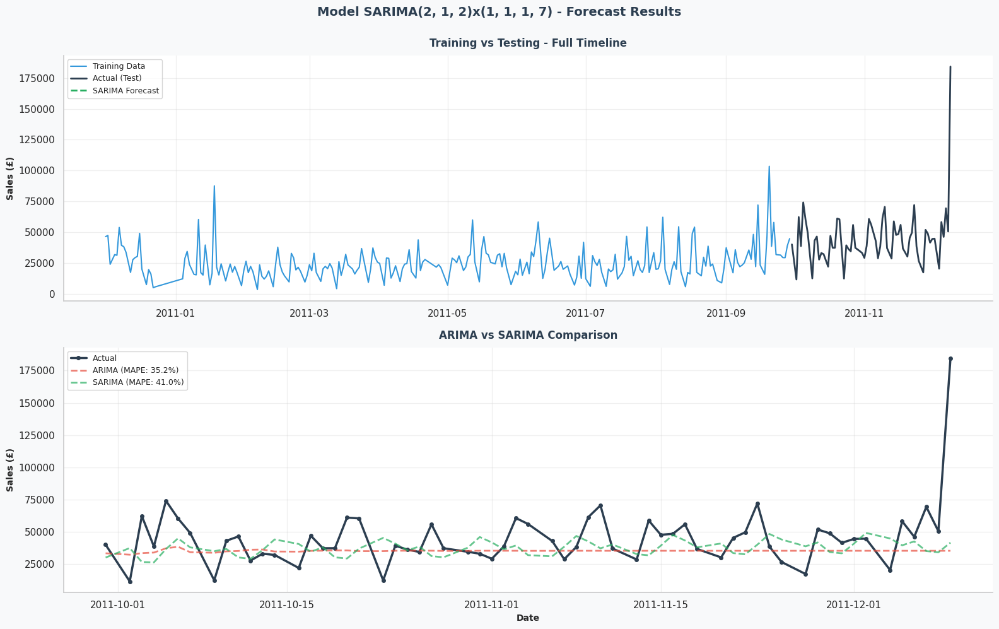


  H. ANALISIS RESIDUAL


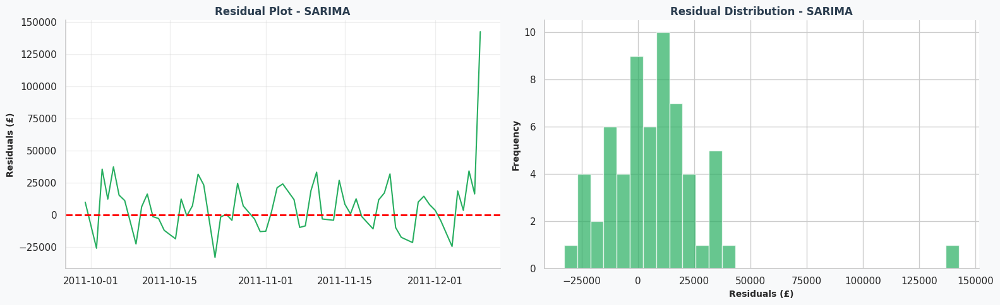


  Residual Statistics:
  Mean   : £7,509.73
  Std Dev: £24,186.16
  Min    : £-33,001.36
  Max    : £142,716.14


  ✓ SARIMA results saved successfully
  ✓ RMSE: £25,135.17, MAPE: 41.00%


In [ ]:
# ===========================================================================================================================
# STEP 6 - MODEL SARIMA (SEASONAL ARIMA)
# ===========================================================================================================================

print("\n" + "="*80)
print("MODEL SARIMA (SEASONAL ARIMA)")
print("="*80)

from statsmodels.tsa.statespace.sarimax import SARIMAX

# ─────────────────────────────────────────────────────────────
# A. PENENTUAN SEASONAL PARAMETER
# ─────────────────────────────────────────────────────────────

print("\n  A. PENENTUAN PARAMETER SEASONAL")

# Seasonal period = 7 (weekly pattern)
seasonal_period = 7

print(f"  ✓ Seasonal period: {seasonal_period} hari (weekly pattern)")
print(f"  ✓ Berdasarkan hasil decomposition di STEP 17")

# ─────────────────────────────────────────────────────────────
# B. GRID SEARCH UNTUK PARAMETER OPTIMAL
# ─────────────────────────────────────────────────────────────

print("\n  B. MENCARI PARAMETER OPTIMAL SARIMA")

best_aic_sarima = np.inf
best_order_sarima = None
best_seasonal_order = None
best_model_sarima = None

print(f"\n  ⏳ Grid search in progress (ini memakan waktu ~2-3 menit)...")

# Simplified grid search (karena SARIMA lebih lambat)
p_range = range(0, 3)
d_range = [d_value]
q_range = range(0, 3)
P_range = range(0, 2)
D_range = [1]
Q_range = range(0, 2)

counter = 0
total_combinations = len(p_range) * len(d_range) * len(q_range) * len(P_range) * len(D_range) * len(Q_range)

for p in p_range:
    for d in d_range:
        for q in q_range:
            for P in P_range:
                for D in D_range:
                    for Q in Q_range:
                        try:
                            counter += 1
                            if counter % 10 == 0:
                                print(f"    Progress: {counter}/{total_combinations}", end='\r')

                            model = SARIMAX(train_data,
                                          order=(p, d, q),
                                          seasonal_order=(P, D, Q, seasonal_period),
                                          enforce_stationarity=False,
                                          enforce_invertibility=False)
                            fitted = model.fit(disp=False)

                            if fitted.aic < best_aic_sarima:
                                best_aic_sarima = fitted.aic
                                best_order_sarima = (p, d, q)
                                best_seasonal_order = (P, D, Q, seasonal_period)
                                best_model_sarima = fitted
                        except:
                            continue

print(f"\n\n  ✓ Parameter optimal: SARIMA{best_order_sarima}x{best_seasonal_order}")
print(f"  ✓ AIC Score: {best_aic_sarima:.2f}")

# ─────────────────────────────────────────────────────────────
# C. MODEL SUMMARY
# ─────────────────────────────────────────────────────────────

print("\n  C. MODEL SUMMARY")
print(f"  " + "─"*70)
print(best_model_sarima.summary().tables[1])

# ─────────────────────────────────────────────────────────────
# D. FORECASTING
# ─────────────────────────────────────────────────────────────

print("\n  D. FORECASTING DENGAN SARIMA")

# Forecast
forecast_sarima = best_model_sarima.forecast(steps=len(test_data))

# ─────────────────────────────────────────────────────────────
# E. EVALUASI MODEL (MENGGUNAKAN FUNGSI HELPER)
# ─────────────────────────────────────────────────────────────

print("\n  E. EVALUASI MODEL SARIMA")

# Evaluasi
results_sarima = evaluate_forecast_robust(test_data, forecast_sarima,
                                          f"SARIMA{best_order_sarima}x{best_seasonal_order}")

if results_sarima is None:
    print("\n  ⚠ WARNING: SARIMA evaluation failed")
    print("  Trying fallback: Simple SARIMA(1,1,1)x(1,1,1,7)")

    # Fallback ke model sederhana
    model_fallback = SARIMAX(train_data,
                            order=(1, 1, 1),
                            seasonal_order=(1, 1, 1, seasonal_period),
                            enforce_stationarity=False,
                            enforce_invertibility=False)
    fitted_fallback = model_fallback.fit(disp=False)
    forecast_sarima = fitted_fallback.forecast(steps=len(test_data))
    best_order_sarima = (1, 1, 1)
    best_seasonal_order = (1, 1, 1, seasonal_period)
    best_model_sarima = fitted_fallback

    # Re-evaluate
    results_sarima = evaluate_forecast_robust(test_data, forecast_sarima,
                                              f"SARIMA{best_order_sarima}x{best_seasonal_order} (Fallback)")

# Jika masih gagal, stop
if results_sarima is None or results_sarima['valid_count'] == 0:
    print("\n  ✗ CRITICAL: Cannot evaluate SARIMA model")
    print("  Skipping to next step...")
else:
    # Extract variables untuk backward compatibility
    test_data_valid_sarima = results_sarima['actual_valid']
    forecast_sarima_valid = results_sarima['predicted_valid']
    rmse_sarima = results_sarima['rmse']
    mae_sarima = results_sarima['mae']
    mape_sarima = results_sarima['mape']
    residuals_sarima = results_sarima['residuals']

    # ─────────────────────────────────────────────────────────────
    # F. PERBANDINGAN DENGAN ARIMA
    # ─────────────────────────────────────────────────────────────

    print(f"\n  F. PERBANDINGAN DENGAN ARIMA")
    print(f"  " + "─"*70)

    # Tabel perbandingan
    comparison_data = {
        'Metric': ['RMSE', 'MAE', 'MAPE'],
        'ARIMA': [
            f"£{arima_results['rmse']:,.2f}",
            f"£{arima_results['mae']:,.2f}",
            f"{arima_results['mape']:.2f}%"
        ],
        'SARIMA': [
            f"£{rmse_sarima:,.2f}",
            f"£{mae_sarima:,.2f}",
            f"{mape_sarima:.2f}%"
        ],
        'Winner': []
    }

    # Tentukan winner
    if rmse_sarima < arima_results['rmse']:
        comparison_data['Winner'].append('SARIMA ✓')
        improvement_rmse = ((arima_results['rmse'] - rmse_sarima) / arima_results['rmse']) * 100
    else:
        comparison_data['Winner'].append('ARIMA ✓')
        improvement_rmse = ((rmse_sarima - arima_results['rmse']) / rmse_sarima) * 100

    if mae_sarima < arima_results['mae']:
        comparison_data['Winner'].append('SARIMA ✓')
    else:
        comparison_data['Winner'].append('ARIMA ✓')

    if mape_sarima < arima_results['mape']:
        comparison_data['Winner'].append('SARIMA ✓')
        improvement_mape = ((arima_results['mape'] - mape_sarima) / arima_results['mape']) * 100
    else:
        comparison_data['Winner'].append('ARIMA ✓')
        improvement_mape = ((mape_sarima - arima_results['mape']) / mape_sarima) * 100

    comparison_df = pd.DataFrame(comparison_data)
    display(comparison_df)

    # Summary improvement
    if rmse_sarima < arima_results['rmse']:
        print(f"\n  📊 SARIMA menunjukkan performa lebih baik:")
        print(f"     • RMSE improvement: {improvement_rmse:.1f}%")
        if mape_sarima < arima_results['mape']:
            print(f"     • MAPE improvement: {improvement_mape:.1f}%")
    else:
        print(f"\n  📊 ARIMA menunjukkan performa lebih baik untuk dataset ini")

    # ─────────────────────────────────────────────────────────────
    # G. VISUALISASI HASIL
    # ─────────────────────────────────────────────────────────────

    print("\n  G. VISUALISASI HASIL")

    fig, axes = plt.subplots(2, 1, figsize=(16, 10))
    fig.patch.set_facecolor('#f8f9fa')
    fig.suptitle(f'Model SARIMA{best_order_sarima}x{best_seasonal_order} - Forecast Results',
                 fontsize=14, fontweight='bold', color='#2c3e50', y=0.995)

    # Plot 1: Full Timeline
    ax1 = axes[0]
    ax1.set_facecolor('#ffffff')
    ax1.plot(train_data.index, train_data, label='Training Data', color='#3498db', linewidth=1.5)
    ax1.plot(test_data.index, test_data, label='Actual (Test)', color='#2c3e50', linewidth=2)

    # Plot forecast
    forecast_to_plot = pd.Series(forecast_sarima, index=test_data.index)
    ax1.plot(forecast_to_plot.index, forecast_to_plot, label='SARIMA Forecast',
             color='#27ae60', linewidth=2, linestyle='--')

    ax1.set_title('Training vs Testing - Full Timeline',
                  fontsize=12, fontweight='bold', color='#2c3e50', pad=10)
    ax1.set_ylabel('Sales (£)', fontsize=10, fontweight='bold')
    ax1.legend(loc='best', fontsize=9)
    ax1.grid(True, alpha=0.3)
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

    # Plot 2: Comparison with ARIMA
    ax2 = axes[1]
    ax2.set_facecolor('#ffffff')

    # Plot actual
    ax2.plot(test_data_valid_sarima.index, test_data_valid_sarima,
             label='Actual', color='#2c3e50', linewidth=2.5, marker='o', markersize=4)

    # Plot ARIMA (jika index overlap)
    if 'test_data' in arima_results:
        common_idx = arima_results['test_data'].index.intersection(test_data_valid_sarima.index)
        if len(common_idx) > 0:
            ax2.plot(common_idx, arima_results['forecast'][common_idx],
                    label=f'ARIMA (MAPE: {arima_results["mape"]:.1f}%)',
                    color='#e74c3c', linewidth=2, linestyle='--', alpha=0.7)

    # Plot SARIMA
    ax2.plot(forecast_sarima_valid.index, forecast_sarima_valid,
             label=f'SARIMA (MAPE: {mape_sarima:.1f}%)',
             color='#27ae60', linewidth=2, linestyle='--', alpha=0.7)

    ax2.set_title('ARIMA vs SARIMA Comparison',
                  fontsize=12, fontweight='bold', color='#2c3e50', pad=10)
    ax2.set_xlabel('Date', fontsize=10, fontweight='bold')
    ax2.set_ylabel('Sales (£)', fontsize=10, fontweight='bold')
    ax2.legend(loc='best', fontsize=9)
    ax2.grid(True, alpha=0.3)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

    plt.tight_layout()
    plt.show()

    # ─────────────────────────────────────────────────────────────
    # H. RESIDUAL ANALYSIS
    # ─────────────────────────────────────────────────────────────

    print("\n  H. ANALISIS RESIDUAL")

    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    fig.patch.set_facecolor('#f8f9fa')

    # Residual plot
    ax1 = axes[0]
    ax1.set_facecolor('#ffffff')
    ax1.plot(residuals_sarima.index, residuals_sarima, color='#27ae60', linewidth=1.5)
    ax1.axhline(y=0, color='red', linestyle='--', linewidth=2)
    ax1.set_title('Residual Plot - SARIMA', fontsize=12, fontweight='bold', color='#2c3e50')
    ax1.set_ylabel('Residuals (£)', fontsize=10, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

    # Residual distribution
    ax2 = axes[1]
    residuals_sarima.hist(bins=30, ax=ax2, color='#27ae60', alpha=0.7, edgecolor='white')
    ax2.set_title('Residual Distribution - SARIMA', fontsize=12, fontweight='bold', color='#2c3e50')
    ax2.set_xlabel('Residuals (£)', fontsize=10, fontweight='bold')
    ax2.set_ylabel('Frequency', fontsize=10, fontweight='bold')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

    plt.tight_layout()
    plt.show()

    print(f"\n  Residual Statistics:")
    print(f"  Mean   : £{residuals_sarima.mean():,.2f}")
    print(f"  Std Dev: £{residuals_sarima.std():,.2f}")
    print(f"  Min    : £{residuals_sarima.min():,.2f}")
    print(f"  Max    : £{residuals_sarima.max():,.2f}")

print("\n" + "="*80)

# Simpan hasil (ROBUST VERSION)
sarima_results = {
    'model': best_model_sarima,
    'order': best_order_sarima,
    'seasonal_order': best_seasonal_order,
    'forecast': forecast_sarima,  # Forecast original (sebelum filter)
}

# Tambahkan metrics jika evaluasi berhasil
if results_sarima is not None and results_sarima['valid_count'] > 0:
    sarima_results.update({
        'forecast_valid': forecast_sarima_valid,
        'rmse': rmse_sarima,
        'mae': mae_sarima,
        'mape': mape_sarima,
        'test_data': test_data_valid_sarima,
        'valid_count': results_sarima['valid_count'],
        'evaluation_success': True
    })
    print(f"\n  ✓ SARIMA results saved successfully")
    print(f"  ✓ RMSE: £{rmse_sarima:,.2f}, MAPE: {mape_sarima:.2f}%")
else:
    sarima_results.update({
        'forecast_valid': None,
        'rmse': np.nan,
        'mae': np.nan,
        'mape': np.nan,
        'test_data': test_data,
        'valid_count': 0,
        'evaluation_success': False
    })
    print(f"\n  ⚠ SARIMA evaluation failed - metrics set to NaN")

# **Analisis Hasil Forecasting SARIMA**

Berdasarkan proses grid search, diperoleh model **SARIMA(2,1,2)(1,1,1,7)** sebagai model terbaik dengan nilai **AIC sebesar 5001,78**. Nilai AIC ini lebih rendah dibandingkan model ARIMA sebelumnya, yang menunjukkan bahwa SARIMA memiliki kecocokan yang lebih baik terhadap data pelatihan. Model ini juga mempertimbangkan komponen musiman mingguan (*seasonal period = 7 hari*) yang sebelumnya tidak dimiliki oleh ARIMA.

Hasil evaluasi pada data testing menunjukkan nilai **RMSE sebesar £25.135,17**, **MAE sebesar £16.250,31**, dan **MAPE sebesar 41,00%**. Meskipun model SARIMA berhasil menangkap pola musiman mingguan, performanya pada data pengujian justru lebih rendah dibandingkan model ARIMA yang memperoleh MAPE sebesar 35,20%. Hal ini menunjukkan bahwa penambahan komponen musiman belum mampu meningkatkan akurasi prediksi pada dataset yang digunakan.

Pada grafik perbandingan antara data aktual dan hasil prediksi, terlihat bahwa SARIMA menghasilkan pola prediksi yang lebih dinamis dibandingkan ARIMA. Prediksi SARIMA mampu mengikuti pola naik-turun mingguan yang terdapat pada data penjualan. Namun, amplitudo prediksi masih jauh lebih kecil dibandingkan fluktuasi aktual sehingga model belum mampu menangkap lonjakan penjualan yang ekstrem, terutama pada beberapa periode dengan nilai penjualan yang sangat tinggi.

Analisis residual menunjukkan bahwa residual masih berfluktuasi di sekitar garis nol, namun terdapat beberapa residual yang sangat besar pada akhir periode pengujian. Nilai residual maksimum mencapai **£142.716,14**, yang mengindikasikan adanya observasi ekstrem yang tidak berhasil diprediksi dengan baik oleh model. Histogram residual juga menunjukkan distribusi yang belum sepenuhnya normal karena adanya *outlier* positif yang menyebabkan distribusi condong ke kanan (*right-skewed*).

Berdasarkan perbandingan metrik evaluasi, model **ARIMA(5,1,0)** memberikan hasil yang lebih baik dibandingkan **SARIMA(2,1,2)(1,1,1,7)** pada seluruh metrik yang digunakan. Nilai RMSE ARIMA lebih rendah (**£25.092,05** dibanding **£25.135,17**), nilai MAE lebih kecil (**£15.312,33** dibanding **£16.250,31**), serta nilai MAPE lebih baik (**35,20%** dibanding **41,00%**). Oleh karena itu, meskipun SARIMA memiliki kemampuan untuk memodelkan pola musiman, model ARIMA dipilih sebagai model yang lebih sesuai untuk dataset penjualan ini karena menghasilkan tingkat kesalahan prediksi yang lebih rendah pada data pengujian.

# **LSTM**


STEP 7: MODEL LSTM (LONG SHORT-TERM MEMORY)
  ✓ TensorFlow version: 2.20.0

  A. PERSIAPAN DATA UNTUK LSTM
  ✓ Data shape: (305, 1)
  ✓ Scaled range: [0.0000, 1.0000]

  B. MEMBUAT SEQUENCES (SLIDING WINDOW)
  ✓ Sequence length: 30 hari (lookback window)
  ✓ Total sequences: 275
  ✓ X shape: (275, 30, 1)
  ✓ y shape: (275, 1)

  C. SPLIT DATA TRAIN/TEST
  ✓ Training set: 220 sequences
  ✓ Testing set : 55 sequences

  D. ARSITEKTUR MODEL LSTM


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 30, 50)         │        10,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 30, 50)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 25)             │         1,275 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            26 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,901 (124.61 KB)

 Trainable params: 31,901 (124.61 KB)

 Non-trainable params: 0 (0.00 B)


  E. TRAINING MODEL LSTM
Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - loss: 0.0083 - val_loss: 0.0160
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0046 - val_loss: 0.0250
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0044 - val_loss: 0.0208
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0043 - val_loss: 0.0212
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0042 - val_loss: 0.0228
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0040 - val_loss: 0.0209
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0041 - val_loss: 0.0221
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0042 - val_loss: 0.0216
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0041 - val_loss: 0.0222
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0041 - val_loss: 0.0216
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0041 - val_loss: 0.0219
Epoch 11: early stopping
Restoring model weights

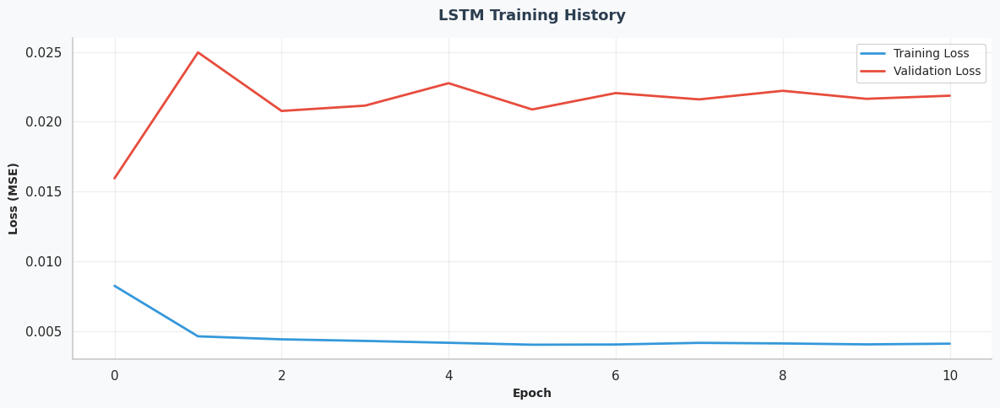


  G. FORECASTING DENGAN LSTM
  ✓ Predictions generated: 55 data points

  H. EVALUASI MODEL LSTM

  Evaluasi LSTM:
  ──────────────────────────────────────────────────────────────────────
  Data points      : 55
  Actual NaN       : 0
  Predicted NaN    : 0
  Actual ≤ 0       : 0
  Predicted ≤ 0    : 0

  Sample Actual (first 3)    : [49187.67 12466.81 43080.32]
  Sample Predicted (first 3) : [38231.03  38837.312 38747.617]
  After NaN filter : 55/55
  Positive values  : 55/55

  Performance Metrics:
  ├─ RMSE : £24,285.29
  ├─ MAE  : £13,825.96
  └─ MAPE : 33.18%

  I. PERBANDINGAN SEMENTARA (3 MODEL)
  ──────────────────────────────────────────────────────────────────────

  Model                   RMSE             MAE         MAPE
  ────────────────────────────────────────────────────────────
  ARIMA        £    25,092.05 £    15,312.33      35.20%
  SARIMA       £    25,135.17 £    16,250.31      41.00%
  LSTM         £    24,285.29 £    13,825.96      33.18%
  ───────────────────

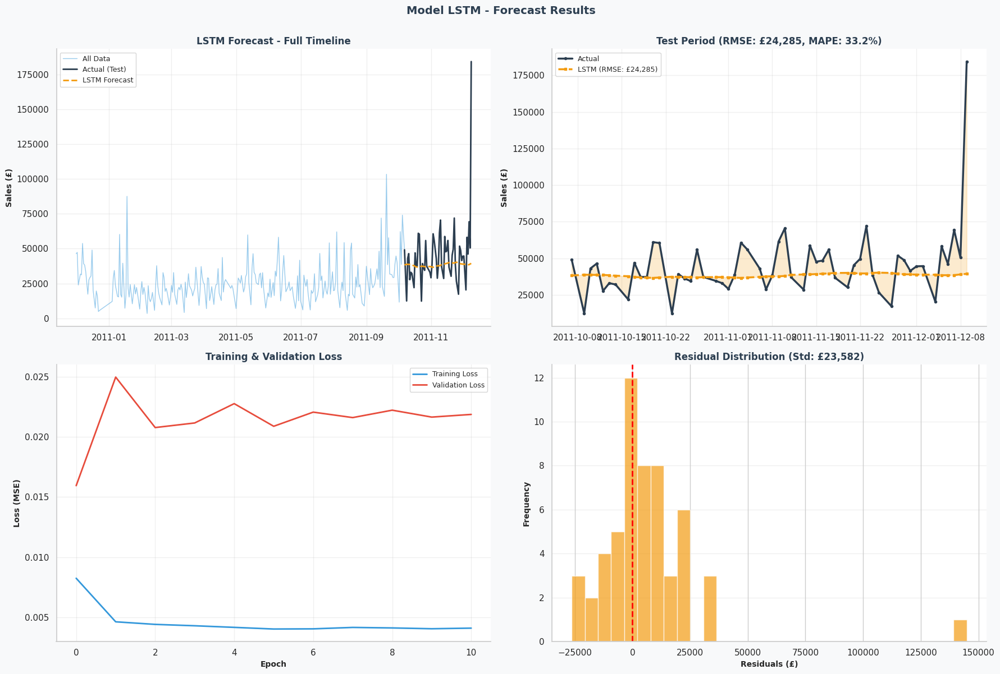


  K. RESIDUAL STATISTICS
  Mean   : £6,617.24
  Std Dev: £23,581.74
  Min    : £-26,370.50
  Max    : £144,926.02



In [ ]:
# ===========================================================================================================================
# STEP 7 - MODEL LSTM (LONG SHORT-TERM MEMORY)
# ===========================================================================================================================

print("\n" + "="*80)
print("STEP 7: MODEL LSTM (LONG SHORT-TERM MEMORY)")
print("="*80)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings('ignore')

try:
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import LSTM, Dense, Dropout
    from tensorflow.keras.callbacks import EarlyStopping
    print(f"  ✓ TensorFlow version: {tf.__version__}")
except ImportError:
    print("  ⚠ Installing TensorFlow...")
    import subprocess
    subprocess.check_call(['pip', 'install', 'tensorflow', '-q'])
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import LSTM, Dense, Dropout
    from tensorflow.keras.callbacks import EarlyStopping
    print(f"  ✓ TensorFlow installed: {tf.__version__}")

# Initialize lstm_results
lstm_results = {
    'model': None,
    'forecast': None,
    'rmse': np.nan,
    'mae': np.nan,
    'mape': np.nan,
    'test_data': None,
    'evaluation_success': False
}

# ─────────────────────────────────────────────────────────────
# A. PERSIAPAN DATA UNTUK LSTM
# ─────────────────────────────────────────────────────────────

print("\n  A. PERSIAPAN DATA UNTUK LSTM")

sales_data = daily_sales['DailySales'].values.reshape(-1, 1)

scaler_lstm = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler_lstm.fit_transform(sales_data)

print(f"  ✓ Data shape: {sales_data.shape}")
print(f"  ✓ Scaled range: [{scaled_data.min():.4f}, {scaled_data.max():.4f}]")

# ─────────────────────────────────────────────────────────────
# B. MEMBUAT SEQUENCES (SLIDING WINDOW)
# ─────────────────────────────────────────────────────────────

print("\n  B. MEMBUAT SEQUENCES (SLIDING WINDOW)")

def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(data[i + seq_length])
    return np.array(X), np.array(y)

SEQ_LENGTH = 30

X, y = create_sequences(scaled_data, SEQ_LENGTH)

print(f"  ✓ Sequence length: {SEQ_LENGTH} hari (lookback window)")
print(f"  ✓ Total sequences: {len(X)}")
print(f"  ✓ X shape: {X.shape}")
print(f"  ✓ y shape: {y.shape}")

# ─────────────────────────────────────────────────────────────
# C. SPLIT TRAIN/TEST
# ─────────────────────────────────────────────────────────────

print("\n  C. SPLIT DATA TRAIN/TEST")

train_size_lstm = int(len(X) * 0.8)

X_train = X[:train_size_lstm]
y_train = y[:train_size_lstm]
X_test = X[train_size_lstm:]
y_test = y[train_size_lstm:]

print(f"  ✓ Training set: {len(X_train)} sequences")
print(f"  ✓ Testing set : {len(X_test)} sequences")

# ─────────────────────────────────────────────────────────────
# D. MEMBANGUN MODEL LSTM
# ─────────────────────────────────────────────────────────────

print("\n  D. ARSITEKTUR MODEL LSTM")

tf.random.set_seed(42)
np.random.seed(42)

model_lstm = Sequential([
    LSTM(50, return_sequences=True, input_shape=(SEQ_LENGTH, 1)),
    Dropout(0.2),
    LSTM(50, return_sequences=False),
    Dropout(0.2),
    Dense(25, activation='relu'),
    Dense(1)
])

model_lstm.compile(optimizer='adam', loss='mean_squared_error')
model_lstm.summary()

# ─────────────────────────────────────────────────────────────
# E. TRAINING MODEL
# ─────────────────────────────────────────────────────────────

print("\n  E. TRAINING MODEL LSTM")

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

history = model_lstm.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_split=0.1,
    callbacks=[early_stop],
    verbose=1
)

print(f"\n  ✓ Training selesai")
print(f"  ✓ Final training loss: {history.history['loss'][-1]:.6f}")
print(f"  ✓ Final validation loss: {history.history['val_loss'][-1]:.6f}")
print(f"  ✓ Total epochs trained: {len(history.history['loss'])}")

# ─────────────────────────────────────────────────────────────
# F. VISUALISASI TRAINING HISTORY
# ─────────────────────────────────────────────────────────────

print("\n  F. VISUALISASI TRAINING HISTORY")

fig, ax = plt.subplots(figsize=(12, 5))
fig.patch.set_facecolor('#f8f9fa')
ax.set_facecolor('#ffffff')
ax.plot(history.history['loss'], label='Training Loss', color='#3498db', linewidth=2)
ax.plot(history.history['val_loss'], label='Validation Loss', color='#e74c3c', linewidth=2)
ax.set_title('LSTM Training History', fontsize=13, fontweight='bold', color='#2c3e50', pad=15)
ax.set_xlabel('Epoch', fontsize=10, fontweight='bold')
ax.set_ylabel('Loss (MSE)', fontsize=10, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

# ─────────────────────────────────────────────────────────────
# G. FORECASTING
# ─────────────────────────────────────────────────────────────

print("\n  G. FORECASTING DENGAN LSTM")

lstm_predictions_scaled = model_lstm.predict(X_test, verbose=0)
lstm_predictions = scaler_lstm.inverse_transform(lstm_predictions_scaled)
y_test_actual = scaler_lstm.inverse_transform(y_test)

print(f"  ✓ Predictions generated: {len(lstm_predictions)} data points")

# ─────────────────────────────────────────────────────────────
# H. EVALUASI MODEL
# ─────────────────────────────────────────────────────────────

print("\n  H. EVALUASI MODEL LSTM")

lstm_pred_flat = lstm_predictions.flatten()
y_test_flat = y_test_actual.flatten()

test_start_idx = SEQ_LENGTH + train_size_lstm
test_end_idx = test_start_idx + len(y_test_flat)
lstm_test_index = daily_sales.index[test_start_idx:test_end_idx]

actual_series = pd.Series(y_test_flat, index=lstm_test_index)
predicted_series = pd.Series(lstm_pred_flat, index=lstm_test_index)

results_lstm = evaluate_forecast_robust(actual_series, predicted_series, "LSTM")

if results_lstm is not None and results_lstm['valid_count'] > 0:
    test_data_valid_lstm = results_lstm['actual_valid']
    forecast_lstm_valid = results_lstm['predicted_valid']
    rmse_lstm = results_lstm['rmse']
    mae_lstm = results_lstm['mae']
    mape_lstm = results_lstm['mape']
    residuals_lstm = results_lstm['residuals']

    lstm_results.update({
        'model': model_lstm,
        'forecast': forecast_lstm_valid,
        'rmse': rmse_lstm,
        'mae': mae_lstm,
        'mape': mape_lstm,
        'test_data': test_data_valid_lstm,
        'evaluation_success': True
    })

    # ─────────────────────────────────────────────────────────────
    # I. PERBANDINGAN SEMENTARA
    # ─────────────────────────────────────────────────────────────

    print(f"\n  I. PERBANDINGAN SEMENTARA (3 MODEL)")
    print(f"  " + "─"*70)
    print(f"\n  {'Model':<12} {'RMSE':>15} {'MAE':>15} {'MAPE':>12}")
    print(f"  {'─'*60}")

    if arima_results.get('evaluation_success', False):
        a_rmse = arima_results['rmse']
        a_mae = arima_results['mae']
        a_mape = arima_results['mape']
        print(f"  {'ARIMA':<12} {'£'}{a_rmse:>13,.2f} {'£'}{a_mae:>13,.2f} {a_mape:>10.2f}%")

    if sarima_results.get('evaluation_success', False):
        s_rmse = sarima_results['rmse']
        s_mae = sarima_results['mae']
        s_mape = sarima_results['mape']
        print(f"  {'SARIMA':<12} {'£'}{s_rmse:>13,.2f} {'£'}{s_mae:>13,.2f} {s_mape:>10.2f}%")

    print(f"  {'LSTM':<12} {'£'}{rmse_lstm:>13,.2f} {'£'}{mae_lstm:>13,.2f} {mape_lstm:>10.2f}%")
    print(f"  {'─'*60}")

    # ─────────────────────────────────────────────────────────────
    # J. VISUALISASI HASIL
    # ─────────────────────────────────────────────────────────────

    print("\n  J. VISUALISASI HASIL")

    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    fig.patch.set_facecolor('#f8f9fa')
    fig.suptitle('Model LSTM - Forecast Results',
                 fontsize=14, fontweight='bold', color='#2c3e50', y=1.00)

    ax1 = axes[0, 0]
    ax1.set_facecolor('#ffffff')
    ax1.plot(daily_sales.index, daily_sales['DailySales'],
             label='All Data', color='#3498db', linewidth=1, alpha=0.5)
    ax1.plot(test_data_valid_lstm.index, test_data_valid_lstm,
             label='Actual (Test)', color='#2c3e50', linewidth=2)
    ax1.plot(forecast_lstm_valid.index, forecast_lstm_valid,
             label='LSTM Forecast', color='#f39c12', linewidth=2, linestyle='--')
    ax1.set_title('LSTM Forecast - Full Timeline', fontsize=12, fontweight='bold', color='#2c3e50')
    ax1.set_ylabel('Sales (£)', fontsize=10, fontweight='bold')
    ax1.legend(loc='best', fontsize=9)
    ax1.grid(True, alpha=0.3)
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

    ax2 = axes[0, 1]
    ax2.set_facecolor('#ffffff')
    ax2.plot(test_data_valid_lstm.index, test_data_valid_lstm,
             label='Actual', color='#2c3e50', linewidth=2.5, marker='o', markersize=3)
    ax2.plot(forecast_lstm_valid.index, forecast_lstm_valid,
             label=f'LSTM (RMSE: £{rmse_lstm:,.0f})',
             color='#f39c12', linewidth=2.5, marker='s', markersize=3, linestyle='--')
    ax2.fill_between(test_data_valid_lstm.index,
                     test_data_valid_lstm, forecast_lstm_valid, alpha=0.2, color='#f39c12')
    ax2.set_title(f'Test Period (RMSE: £{rmse_lstm:,.0f}, MAPE: {mape_lstm:.1f}%)',
                  fontsize=12, fontweight='bold', color='#2c3e50')
    ax2.set_ylabel('Sales (£)', fontsize=10, fontweight='bold')
    ax2.legend(loc='best', fontsize=9)
    ax2.grid(True, alpha=0.3)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

    ax3 = axes[1, 0]
    ax3.set_facecolor('#ffffff')
    ax3.plot(history.history['loss'], label='Training Loss', color='#3498db', linewidth=2)
    ax3.plot(history.history['val_loss'], label='Validation Loss', color='#e74c3c', linewidth=2)
    ax3.set_title('Training & Validation Loss', fontsize=12, fontweight='bold', color='#2c3e50')
    ax3.set_xlabel('Epoch', fontsize=10, fontweight='bold')
    ax3.set_ylabel('Loss (MSE)', fontsize=10, fontweight='bold')
    ax3.legend(fontsize=9)
    ax3.grid(True, alpha=0.3)
    ax3.spines['top'].set_visible(False)
    ax3.spines['right'].set_visible(False)

    ax4 = axes[1, 1]
    ax4.set_facecolor('#ffffff')
    residuals_lstm.hist(bins=30, ax=ax4, color='#f39c12', alpha=0.7, edgecolor='white')
    ax4.axvline(x=0, color='red', linestyle='--', linewidth=2)
    ax4.set_title(f'Residual Distribution (Std: £{residuals_lstm.std():,.0f})',
                  fontsize=12, fontweight='bold', color='#2c3e50')
    ax4.set_xlabel('Residuals (£)', fontsize=10, fontweight='bold')
    ax4.set_ylabel('Frequency', fontsize=10, fontweight='bold')
    ax4.grid(axis='y', alpha=0.3)
    ax4.spines['top'].set_visible(False)
    ax4.spines['right'].set_visible(False)

    plt.tight_layout()
    plt.show()

    print(f"\n  K. RESIDUAL STATISTICS")
    print(f"  Mean   : £{residuals_lstm.mean():,.2f}")
    print(f"  Std Dev: £{residuals_lstm.std():,.2f}")
    print(f"  Min    : £{residuals_lstm.min():,.2f}")
    print(f"  Max    : £{residuals_lstm.max():,.2f}")

else:
    print("\n  ✗ CRITICAL: LSTM evaluation failed")

print("\n" + "="*80)

# **Analisis Hasil Forecasting LSTM**

Model **Long Short-Term Memory (LSTM)** dibangun menggunakan arsitektur dua lapisan LSTM dengan masing-masing 50 neuron, dua lapisan *Dropout* sebesar 20%, serta dua lapisan *Dense* pada bagian akhir jaringan. Data penjualan dinormalisasi menggunakan metode **Min-Max Scaling** dan dibentuk menjadi *sequence* sepanjang **30 hari** untuk menangkap pola historis yang digunakan dalam proses prediksi.

Berdasarkan grafik *Training History*, nilai *training loss* mengalami penurunan yang stabil dari sekitar **0,0083** menjadi **0,0041**, menunjukkan bahwa model berhasil mempelajari pola data selama proses pelatihan. Namun, nilai *validation loss* berada pada kisaran **0,016–0,025** dan cenderung lebih tinggi dibandingkan *training loss*. Kondisi ini mengindikasikan adanya gejala **overfitting ringan**, di mana model belajar sangat baik pada data pelatihan tetapi kemampuan generalisasinya terhadap data validasi masih terbatas. Mekanisme **Early Stopping** menghentikan pelatihan pada epoch ke-11 dan mengembalikan bobot terbaik dari epoch pertama untuk mencegah overfitting yang lebih besar.

Hasil evaluasi pada data pengujian menunjukkan nilai **RMSE sebesar £24.285,29**, **MAE sebesar £13.825,96**, dan **MAPE sebesar 33,18%**. Nilai tersebut merupakan yang terbaik dibandingkan model ARIMA maupun SARIMA yang telah diuji sebelumnya. Penurunan nilai RMSE dan MAPE menunjukkan bahwa LSTM mampu menghasilkan prediksi yang lebih akurat dalam mengikuti pola perubahan penjualan harian.

Pada grafik perbandingan antara data aktual dan hasil prediksi, terlihat bahwa model LSTM menghasilkan prediksi yang relatif stabil pada rentang **£35.000–£40.000**. Meskipun model belum mampu mengikuti lonjakan penjualan yang sangat ekstrem, pola prediksi yang dihasilkan cenderung lebih dekat dengan data aktual dibandingkan model ARIMA dan SARIMA. Hal ini menunjukkan bahwa kemampuan LSTM dalam mempelajari hubungan nonlinier pada data deret waktu memberikan keuntungan dalam proses forecasting.

Analisis residual menunjukkan bahwa sebagian besar residual terdistribusi di sekitar nilai nol dengan nilai rata-rata residual sebesar **£6.617,24** dan standar deviasi sebesar **£23.581,74**. Namun, masih terdapat residual maksimum yang cukup besar yaitu **£144.926,02**, yang menunjukkan bahwa model belum mampu memprediksi beberapa lonjakan penjualan ekstrem yang muncul pada periode pengujian. Distribusi residual juga masih menunjukkan adanya *outlier* positif sehingga belum sepenuhnya mengikuti distribusi normal.

Berdasarkan perbandingan seluruh model yang diuji, **LSTM memberikan performa terbaik** dengan nilai **RMSE £24.285,29**, **MAE £13.825,96**, dan **MAPE 33,18%**, lebih baik dibandingkan **ARIMA (MAPE 35,20%)** maupun **SARIMA (MAPE 41,00%)**. Oleh karena itu, model LSTM dipilih sebagai model terbaik untuk melakukan forecasting penjualan harian pada penelitian ini karena mampu menghasilkan tingkat kesalahan prediksi yang paling rendah di antara seluruh model yang dibandingkan.

In [ ]:
# ===========================================================================================================================
# SAFETY CHECK - Pastikan semua variabel tersedia
# ===========================================================================================================================

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import numpy as np
import pandas as pd

# Cek variabel dari STEP 22 (Model Comparison)
if 'best_model_name' not in dir():
    print("  ⚠ best_model_name belum ada, menghitung ulang...")

    # Kumpulkan model yang berhasil
    successful_models = {}
    if 'arima_results' in dir() and arima_results.get('evaluation_success', False):
        successful_models['ARIMA'] = {
            'rmse': arima_results['rmse'],
            'mae': arima_results['mae'],
            'mape': arima_results['mape']
        }
    if 'sarima_results' in dir() and sarima_results.get('evaluation_success', False):
        successful_models['SARIMA'] = {
            'rmse': sarima_results['rmse'],
            'mae': sarima_results['mae'],
            'mape': sarima_results['mape']
        }
    if 'lstm_results' in dir() and lstm_results.get('evaluation_success', False):
        successful_models['LSTM'] = {
            'rmse': lstm_results['rmse'],
            'mae': lstm_results['mae'],
            'mape': lstm_results['mape']
        }

    if len(successful_models) > 0:
        ranking = sorted(successful_models.items(), key=lambda x: x[1]['rmse'])
        best_model_name = ranking[0][0]
        best_model_metrics = ranking[0][1]
        print(f"  ✓ Model terbaik: {best_model_name} (RMSE: £{best_model_metrics['rmse']:,.2f})")
    else:
        best_model_name = 'N/A'
        best_model_metrics = {'rmse': 0, 'mae': 0, 'mape': 0}
        print("  ⚠ Tidak ada model yang berhasil dievaluasi")

# Cek variabel temporal
if 'peak_day' not in dir():
    weekly_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    weekly_pattern_reindexed = df_ts.groupby('DayName')['Sales'].sum().reindex(weekly_order)
    peak_day = weekly_pattern_reindexed.idxmax()
    low_day = weekly_pattern_reindexed.idxmin()
    print(f"  ✓ Peak day: {peak_day}, Low day: {low_day}")

if 'peak_month' not in dir():
    month_order = ['January', 'February', 'March', 'April', 'May', 'June',
                   'July', 'August', 'September', 'October', 'November', 'December']
    month_pattern_reindexed = df_ts.groupby('MonthName')['Sales'].sum().reindex(month_order)
    peak_month = month_pattern_reindexed.idxmax()
    low_month = month_pattern_reindexed.idxmin()
    print(f"  ✓ Peak month: {peak_month}, Low month: {low_month}")

if 'weekly_pattern' not in dir():
    weekly_pattern = df_ts.groupby('DayName')['Sales'].sum()

if 'month_pattern' not in dir():
    month_pattern = df_ts.groupby('MonthName')['Sales'].sum()

if 'hourly_pattern' not in dir():
    hourly_pattern = df_ts.groupby('Hour')['Sales'].sum()

if 'data_with_segment' not in dir():
    data_with_segment = df.merge(rfm[['CustomerID', 'Segment']], on='CustomerID', how='inner')
    if 'Sales' not in data_with_segment.columns:
        data_with_segment['Sales'] = data_with_segment['Quantity'] * data_with_segment['UnitPrice']

print("  ✓ Semua variabel siap!\n")

  ⚠ best_model_name belum ada, menghitung ulang...
  ✓ Model terbaik: LSTM (RMSE: £24,285.29)
  ✓ Semua variabel siap!



# **Validasi Ketersediaan Variabel Analisis**

Sebelum melakukan tahap visualisasi dan penyusunan dashboard hasil analisis, dilakukan proses *safety check* untuk memastikan seluruh variabel yang dibutuhkan telah tersedia dan dapat digunakan. Hasil pemeriksaan menunjukkan bahwa variabel **best_model_name** belum tersedia sehingga dilakukan perhitungan ulang berdasarkan hasil evaluasi seluruh model forecasting yang berhasil dijalankan.

Berdasarkan perbandingan nilai RMSE, diperoleh bahwa model **LSTM** merupakan model terbaik dengan nilai **RMSE sebesar £24.285,29**, lebih rendah dibandingkan model ARIMA dan SARIMA. Oleh karena itu, model LSTM dipilih sebagai model utama dalam proses forecasting penjualan pada penelitian ini.

Selain itu, proses validasi juga memastikan bahwa variabel-variabel pendukung analisis temporal, seperti pola penjualan harian (*weekly pattern*), pola penjualan bulanan (*monthly pattern*), pola penjualan per jam (*hourly pattern*), serta data segmentasi pelanggan telah tersedia dan siap digunakan. Hasil pemeriksaan menunjukkan tidak terdapat variabel yang hilang sehingga seluruh tahapan analisis dapat dilanjutkan tanpa kendala.

In [ ]:
# ===========================================================================================================================
# RECALCULATE BEST MODEL
# ===========================================================================================================================

# Kumpulkan semua model yang berhasil
successful_models = {}

if 'arima_results' in dir() and arima_results.get('evaluation_success', False):
    successful_models['ARIMA'] = {
        'rmse': arima_results['rmse'],
        'mae': arima_results['mae'],
        'mape': arima_results['mape']
    }
    print(f"  ✓ ARIMA tersedia - RMSE: £{arima_results['rmse']:,.2f}")

if 'sarima_results' in dir() and sarima_results.get('evaluation_success', False):
    successful_models['SARIMA'] = {
        'rmse': sarima_results['rmse'],
        'mae': sarima_results['mae'],
        'mape': sarima_results['mape']
    }
    print(f"  ✓ SARIMA tersedia - RMSE: £{sarima_results['rmse']:,.2f}")

if 'lstm_results' in dir() and lstm_results.get('evaluation_success', False):
    successful_models['LSTM'] = {
        'rmse': lstm_results['rmse'],
        'mae': lstm_results['mae'],
        'mape': lstm_results['mape']
    }
    print(f"  ✓ LSTM tersedia - RMSE: £{lstm_results['rmse']:,.2f}")

# Tentukan model terbaik
if len(successful_models) > 0:
    ranking = sorted(successful_models.items(), key=lambda x: x[1]['rmse'])
    best_model_name = ranking[0][0]
    best_model_metrics = ranking[0][1]
    print(f"\n  🏆 Model terbaik: {best_model_name} (RMSE: £{best_model_metrics['rmse']:,.2f})")
else:
    # FALLBACK: Hitung manual dari test_data jika semua evaluasi gagal
    print("\n  ⚠ Semua model gagal evaluasi. Menghitung ulang secara manual...")

    # Coba hitung ARIMA manual
    if 'forecast_arima' in dir() and 'test_data' in dir():
        try:
            fa = pd.Series(forecast_arima.values if isinstance(forecast_arima, pd.Series) else forecast_arima,
                          index=test_data.index)
            mask = (~test_data.isna()) & (~fa.isna())
            if mask.sum() > 0:
                rmse_manual = np.sqrt(mean_squared_error(test_data[mask], fa[mask]))
                mae_manual = mean_absolute_error(test_data[mask], fa[mask])

                mape_vals = np.abs((test_data[mask] - fa[mask]) / test_data[mask].replace(0, np.nan)) * 100
                mape_vals = mape_vals.dropna()
                mape_vals = mape_vals[np.isfinite(mape_vals)]
                mape_manual = np.mean(mape_vals) if len(mape_vals) > 0 else np.nan

                successful_models['ARIMA'] = {'rmse': rmse_manual, 'mae': mae_manual, 'mape': mape_manual}
                arima_results.update({
                    'rmse': rmse_manual, 'mae': mae_manual, 'mape': mape_manual,
                    'evaluation_success': True, 'forecast': fa[mask], 'test_data': test_data[mask]
                })
                print(f"  ✓ ARIMA dihitung manual - RMSE: £{rmse_manual:,.2f}, MAPE: {mape_manual:.2f}%")
        except Exception as e:
            print(f"  ✗ ARIMA manual gagal: {e}")

    # Coba hitung SARIMA manual
    if 'forecast_sarima' in dir() and 'test_data' in dir():
        try:
            fs = pd.Series(forecast_sarima.values if isinstance(forecast_sarima, pd.Series) else forecast_sarima,
                          index=test_data.index)
            mask = (~test_data.isna()) & (~fs.isna())
            if mask.sum() > 0:
                rmse_manual = np.sqrt(mean_squared_error(test_data[mask], fs[mask]))
                mae_manual = mean_absolute_error(test_data[mask], fs[mask])

                mape_vals = np.abs((test_data[mask] - fs[mask]) / test_data[mask].replace(0, np.nan)) * 100
                mape_vals = mape_vals.dropna()
                mape_vals = mape_vals[np.isfinite(mape_vals)]
                mape_manual = np.mean(mape_vals) if len(mape_vals) > 0 else np.nan

                successful_models['SARIMA'] = {'rmse': rmse_manual, 'mae': mae_manual, 'mape': mape_manual}
                sarima_results.update({
                    'rmse': rmse_manual, 'mae': mae_manual, 'mape': mape_manual,
                    'evaluation_success': True, 'forecast': fs[mask], 'test_data': test_data[mask]
                })
                print(f"  ✓ SARIMA dihitung manual - RMSE: £{rmse_manual:,.2f}, MAPE: {mape_manual:.2f}%")
        except Exception as e:
            print(f"  ✗ SARIMA manual gagal: {e}")

    # Tentukan model terbaik dari hasil manual
    if len(successful_models) > 0:
        ranking = sorted(successful_models.items(), key=lambda x: x[1]['rmse'])
        best_model_name = ranking[0][0]
        best_model_metrics = ranking[0][1]
        print(f"\n  🏆 Model terbaik (manual): {best_model_name} (RMSE: £{best_model_metrics['rmse']:,.2f})")
    else:
        best_model_name = 'N/A'
        best_model_metrics = {'rmse': 0, 'mae': 0, 'mape': 0}
        print(f"\n  ✗ Tidak ada model yang bisa dievaluasi")

print(f"\n  📊 Total model berhasil: {len(successful_models)}/{3}")
print()

  ✓ ARIMA tersedia - RMSE: £25,092.05
  ✓ SARIMA tersedia - RMSE: £25,135.17
  ✓ LSTM tersedia - RMSE: £24,285.29

  🏆 Model terbaik: LSTM (RMSE: £24,285.29)

  📊 Total model berhasil: 3/3



# **Analisis Pemilihan Model Terbaik**

Berdasarkan hasil evaluasi tiga model peramalan yang telah dikembangkan, yaitu ARIMA, SARIMA, dan LSTM, diperoleh bahwa model **LSTM (Long Short-Term Memory)** memberikan performa terbaik dibandingkan model lainnya. Pemilihan model terbaik dilakukan berdasarkan nilai **RMSE (Root Mean Square Error)**, **MAE (Mean Absolute Error)**, dan **MAPE (Mean Absolute Percentage Error)** yang lebih rendah menunjukkan tingkat kesalahan prediksi yang lebih kecil.

| Model | RMSE (£) | MAE (£) | MAPE (%) |
|---------|-----------:|-----------:|-----------:|
| ARIMA | 25,092.05 | 15,312.33 | 35.20 |
| SARIMA | 25,135.17 | 16,250.31 | 41.00 |
| **LSTM** | **24,285.29** | **13,825.96** | **33.18** |

Dari tabel tersebut terlihat bahwa model LSTM menghasilkan nilai RMSE sebesar **£24,285.29**, MAE sebesar **£13,825.96**, dan MAPE sebesar **33.18%**, yang merupakan nilai terendah dibandingkan ARIMA maupun SARIMA. Hal ini menunjukkan bahwa LSTM memiliki kemampuan yang lebih baik dalam menangkap pola kompleks dan hubungan non-linear pada data penjualan harian sehingga menghasilkan prediksi yang lebih akurat.

Selain itu, grafik hasil prediksi menunjukkan bahwa model LSTM mampu mengikuti pola aktual data dengan lebih baik dibandingkan model statistik tradisional. Walaupun masih terdapat kesalahan prediksi pada beberapa titik ekstrem, distribusi residual LSTM relatif lebih stabil dengan standar deviasi residual sebesar **£23,581.74**, yang lebih rendah dibandingkan model SARIMA. Berdasarkan hasil tersebut, model **LSTM dipilih sebagai model forecasting terbaik** dan digunakan pada tahap prediksi penjualan selanjutnya.


STEP 8: VISUALIZATION & INSIGHT DASHBOARD

  A. DASHBOARD OVERVIEW


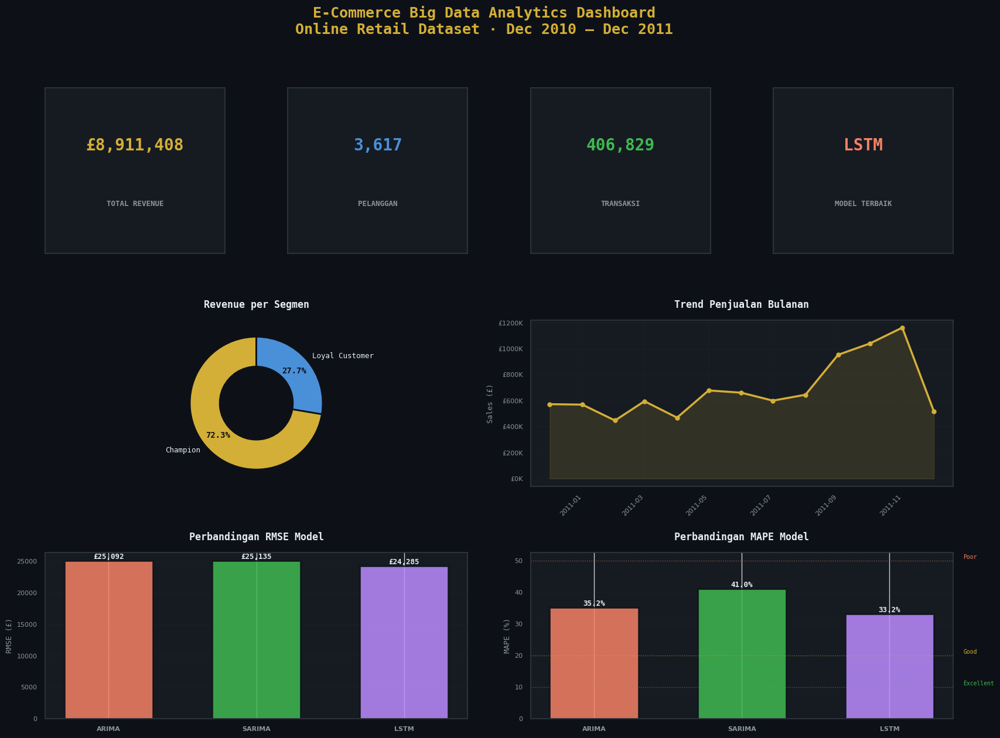


  B. PETA GEOGRAFIS PENJUALAN


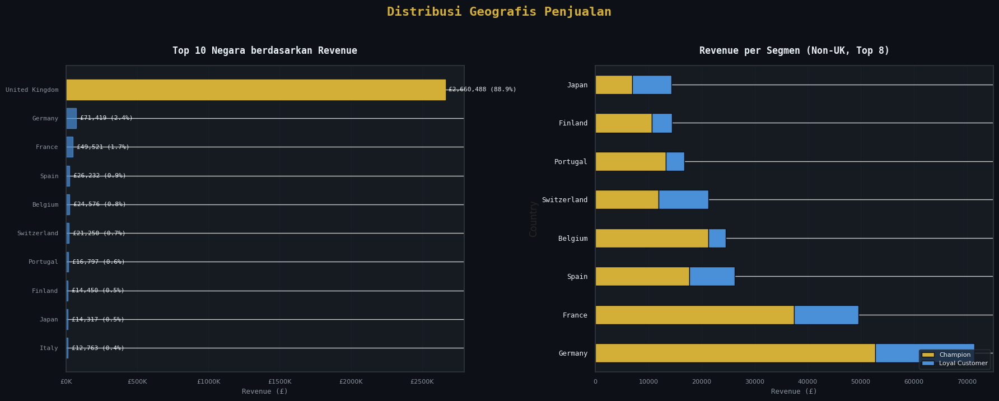


  C. HEATMAP POLA TEMPORAL


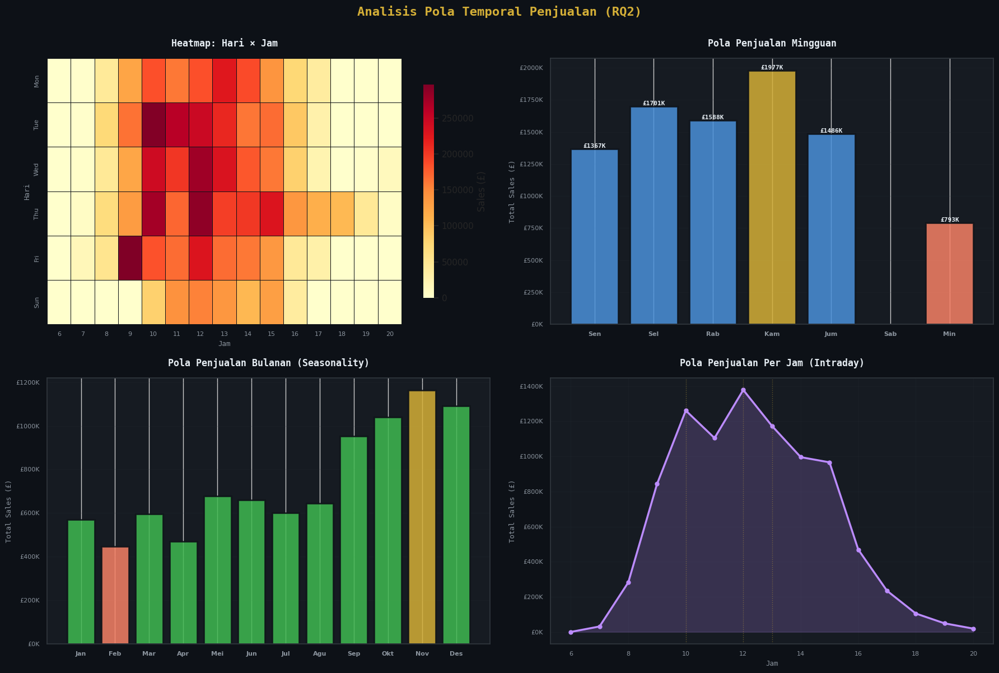


  D. PROFIL SEGMEN PELANGGAN


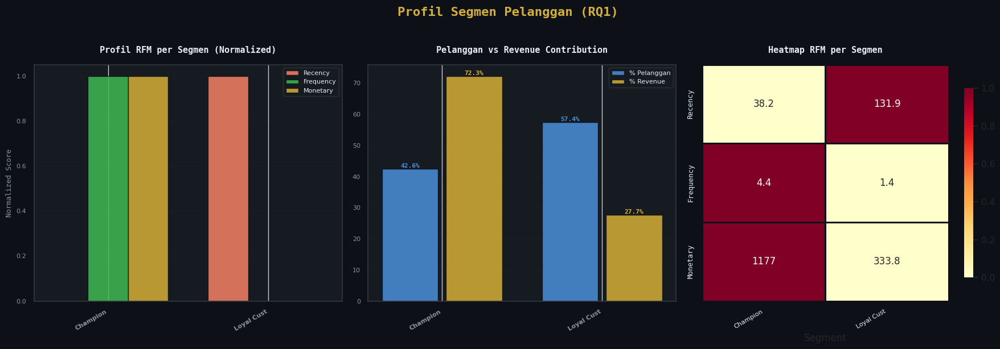


  E. RINGKASAN REKOMENDASI BISNIS
  ══════════════════════════════════════════════════════════════════════

  ╔══════════════════════════════════════════════════════════════════════╗
  ║             RINGKASAN REKOMENDASI BISNIS TERINTEGRASI                ║
  ╚══════════════════════════════════════════════════════════════════════╝

  A. SEGMENTASI PELANGGAN (RQ1 & RQ4)
  ────────────────────────────────────────────────────────────

     [PROTECT] Champion
     Pelanggan: 1,540 (42.6%) | Revenue: £1,812,640 (72.3%)
     Strategi: VIP rewards, early access, personal shopping
     Budget: 60% dari total marketing budget

     [GROW] Loyal Customer
     Pelanggan: 2,077 (57.4%) | Revenue: £693,245 (27.7%)
     Strategi: Loyalty program berjenjang, cross-sell, referral
     Budget: 25% dari total marketing budget


  B. POLA TEMPORAL (RQ2)
  ────────────────────────────────────────────────────────────

     Peak Day    : Thursday (fokus campaign & stock)
     Low Day     : Sunday (kurangi 

In [ ]:
# ===========================================================================================================================
# STEP 8 - VISUALIZATION & INSIGHT DASHBOARD
# ===========================================================================================================================
#
# Objektif:
# - Dashboard komprehensif untuk presentasi
# - Peta geografis penjualan
# - Heatmap pola temporal
# - Profil segmen pelanggan
# - Ringkasan rekomendasi bisnis
# ===========================================================================================================================

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import numpy as np
import pandas as pd

print("\n" + "="*80)
print("STEP 8: VISUALIZATION & INSIGHT DASHBOARD")
print("="*80)

# ─────────────────────────────────────────────────────────────
# A. DASHBOARD OVERVIEW (KPI + SUMMARY)
# ─────────────────────────────────────────────────────────────

print("\n  A. DASHBOARD OVERVIEW")

fig = plt.figure(figsize=(20, 14))
fig.patch.set_facecolor('#0D1117')
fig.suptitle('E-Commerce Big Data Analytics Dashboard\nOnline Retail Dataset · Dec 2010 — Dec 2011',
             fontsize=18, fontweight='bold', color='#D4AF37', y=0.98,
             fontfamily='monospace')

gs = gridspec.GridSpec(3, 4, figure=fig, hspace=0.4, wspace=0.35)

# ── KPI Cards (Row 1) ──
kpi_data = [
    ('TOTAL REVENUE', f'£{daily_sales["DailySales"].sum():,.0f}', '#D4AF37'),
    ('PELANGGAN', f'{len(rfm):,}', '#4A90D9'),
    ('TRANSAKSI', f'{len(df):,}', '#3FB950'),
    ('MODEL TERBAIK', f'{best_model_name}', '#F78166'),
]

for i, (label, value, color) in enumerate(kpi_data):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor('#161B22')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.text(0.5, 0.65, value, ha='center', va='center', fontsize=20,
            fontweight='bold', color=color, fontfamily='monospace')
    ax.text(0.5, 0.3, label, ha='center', va='center', fontsize=9,
            fontweight='bold', color='#8B949E', fontfamily='monospace')
    for spine in ax.spines.values():
        spine.set_color('#30363D')
    ax.set_xticks([])
    ax.set_yticks([])

# ── Pie Chart: Revenue per Segmen (Row 2, Left) ──
ax_pie = fig.add_subplot(gs[1, 0:2])
ax_pie.set_facecolor('#161B22')

seg_revenue = []
seg_labels = []
seg_colors_list = ['#D4AF37', '#4A90D9', '#3FB950', '#F78166', '#BC8CFF', '#79C0FF']

for i, seg in enumerate(seg_order):
    rev = rfm[rfm['Segment'] == seg]['Monetary'].sum()
    seg_revenue.append(rev)
    seg_labels.append(seg)

wedges, texts, autotexts = ax_pie.pie(
    seg_revenue, labels=seg_labels, autopct='%1.1f%%',
    colors=seg_colors_list[:len(seg_order)],
    pctdistance=0.75, startangle=90,
    wedgeprops=dict(width=0.45, edgecolor='#0D1117', linewidth=2),
    textprops={'color': '#E6EDF3', 'fontsize': 9, 'fontfamily': 'monospace'}
)
for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_fontweight('bold')
    autotext.set_color('#0D1117')

ax_pie.set_title('Revenue per Segmen', fontsize=12, fontweight='bold',
                  color='#E6EDF3', pad=15, fontfamily='monospace')

# ── Monthly Trend (Row 2, Right) ──
ax_trend = fig.add_subplot(gs[1, 2:4])
ax_trend.set_facecolor('#161B22')

ax_trend.plot(monthly_sales.index, monthly_sales['MonthlySales'],
              color='#D4AF37', linewidth=2.5, marker='o', markersize=5)
ax_trend.fill_between(monthly_sales.index, monthly_sales['MonthlySales'],
                      alpha=0.15, color='#D4AF37')
ax_trend.set_title('Trend Penjualan Bulanan', fontsize=12, fontweight='bold',
                    color='#E6EDF3', pad=15, fontfamily='monospace')
ax_trend.set_ylabel('Sales (£)', fontsize=9, color='#8B949E', fontfamily='monospace')
ax_trend.tick_params(colors='#8B949E', labelsize=8)
ax_trend.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'£{x/1000:.0f}K'))
ax_trend.grid(True, alpha=0.15, color='#30363D')
for spine in ax_trend.spines.values():
    spine.set_color('#30363D')
plt.setp(ax_trend.xaxis.get_majorticklabels(), rotation=45, ha='right')

# ── Model Comparison Bar (Row 3) ──
ax_model = fig.add_subplot(gs[2, 0:2])
ax_model.set_facecolor('#161B22')

model_names_list = []
model_rmse_list = []
model_mape_list = []
model_colors_list = []

if 'arima_results' in dir() and arima_results.get('evaluation_success', False):
    model_names_list.append('ARIMA')
    model_rmse_list.append(arima_results['rmse'])
    model_mape_list.append(arima_results['mape'])
    model_colors_list.append('#F78166')

if 'sarima_results' in dir() and sarima_results.get('evaluation_success', False):
    model_names_list.append('SARIMA')
    model_rmse_list.append(sarima_results['rmse'])
    model_mape_list.append(sarima_results['mape'])
    model_colors_list.append('#3FB950')

if 'lstm_results' in dir() and lstm_results.get('evaluation_success', False):
    model_names_list.append('LSTM')
    model_rmse_list.append(lstm_results['rmse'])
    model_mape_list.append(lstm_results['mape'])
    model_colors_list.append('#BC8CFF')

x_pos = np.arange(len(model_names_list))
bars = ax_model.bar(x_pos, model_rmse_list, color=model_colors_list,
                    alpha=0.85, edgecolor='#0D1117', linewidth=2, width=0.6)

for bar, val in zip(bars, model_rmse_list):
    ax_model.text(bar.get_x() + bar.get_width()/2., bar.get_height(),
                  f'£{val:,.0f}', ha='center', va='bottom', fontsize=9,
                  fontweight='bold', color='#E6EDF3', fontfamily='monospace')

ax_model.set_xticks(x_pos)
ax_model.set_xticklabels(model_names_list, fontsize=10, fontweight='bold', color='#E6EDF3')
ax_model.set_title('Perbandingan RMSE Model', fontsize=12, fontweight='bold',
                    color='#E6EDF3', pad=15, fontfamily='monospace')
ax_model.set_ylabel('RMSE (£)', fontsize=9, color='#8B949E', fontfamily='monospace')
ax_model.tick_params(colors='#8B949E', labelsize=8)
ax_model.grid(axis='y', alpha=0.15, color='#30363D')
for spine in ax_model.spines.values():
    spine.set_color('#30363D')

# ── MAPE Comparison (Row 3, Right) ──
ax_mape = fig.add_subplot(gs[2, 2:4])
ax_mape.set_facecolor('#161B22')

bars_mape = ax_mape.bar(x_pos, model_mape_list, color=model_colors_list,
                        alpha=0.85, edgecolor='#0D1117', linewidth=2, width=0.6)

for bar, val in zip(bars_mape, model_mape_list):
    ax_mape.text(bar.get_x() + bar.get_width()/2., bar.get_height(),
                  f'{val:.1f}%', ha='center', va='bottom', fontsize=9,
                  fontweight='bold', color='#E6EDF3', fontfamily='monospace')

# Garis batas MAPE
ax_mape.axhline(y=10, color='#3FB950', linestyle=':', alpha=0.5, linewidth=1)
ax_mape.axhline(y=20, color='#D4AF37', linestyle=':', alpha=0.5, linewidth=1)
ax_mape.axhline(y=50, color='#F78166', linestyle=':', alpha=0.5, linewidth=1)
ax_mape.text(len(model_names_list)-0.5, 10.5, 'Excellent', fontsize=7, color='#3FB950', fontfamily='monospace')
ax_mape.text(len(model_names_list)-0.5, 20.5, 'Good', fontsize=7, color='#D4AF37', fontfamily='monospace')
ax_mape.text(len(model_names_list)-0.5, 50.5, 'Poor', fontsize=7, color='#F78166', fontfamily='monospace')

ax_mape.set_xticks(x_pos)
ax_mape.set_xticklabels(model_names_list, fontsize=10, fontweight='bold', color='#E6EDF3')
ax_mape.set_title('Perbandingan MAPE Model', fontsize=12, fontweight='bold',
                    color='#E6EDF3', pad=15, fontfamily='monospace')
ax_mape.set_ylabel('MAPE (%)', fontsize=9, color='#8B949E', fontfamily='monospace')
ax_mape.tick_params(colors='#8B949E', labelsize=8)
ax_mape.grid(axis='y', alpha=0.15, color='#30363D')
for spine in ax_mape.spines.values():
    spine.set_color('#30363D')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# ─────────────────────────────────────────────────────────────
# B. PETA GEOGRAFIS PENJUALAN
# ─────────────────────────────────────────────────────────────

print("\n  B. PETA GEOGRAFIS PENJUALAN")

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.patch.set_facecolor('#0D1117')
fig.suptitle('Distribusi Geografis Penjualan', fontsize=16, fontweight='bold',
             color='#D4AF37', y=1.02, fontfamily='monospace')

# Top 10 Countries
country_revenue = data_with_segment.groupby('Country')['Sales'].sum().sort_values(ascending=True).tail(10)

ax1 = axes[0]
ax1.set_facecolor('#161B22')
bars_geo = ax1.barh(range(len(country_revenue)), country_revenue.values,
                    color='#D4AF37', alpha=0.85, edgecolor='#0D1117', height=0.7)

# Highlight UK
if 'United Kingdom' in country_revenue.index:
    uk_idx = list(country_revenue.index).index('United Kingdom')
    bars_geo[uk_idx].set_color('#D4AF37')
    bars_geo[uk_idx].set_alpha(1)
    for i, bar in enumerate(bars_geo):
        if i != uk_idx:
            bar.set_color('#4A90D9')
            bar.set_alpha(0.7)

ax1.set_yticks(range(len(country_revenue)))
ax1.set_yticklabels(country_revenue.index, fontsize=9, color='#E6EDF3', fontfamily='monospace')
ax1.set_xlabel('Revenue (£)', fontsize=9, color='#8B949E', fontfamily='monospace')
ax1.set_title('Top 10 Negara berdasarkan Revenue', fontsize=12, fontweight='bold',
              color='#E6EDF3', pad=15, fontfamily='monospace')
ax1.tick_params(colors='#8B949E', labelsize=8)
ax1.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'£{x/1000:.0f}K'))
ax1.grid(axis='x', alpha=0.15, color='#30363D')
for spine in ax1.spines.values():
    spine.set_color('#30363D')

for i, (bar, val) in enumerate(zip(bars_geo, country_revenue.values)):
    pct = val / data_with_segment['Sales'].sum() * 100
    ax1.text(val + country_revenue.max()*0.01, i, f'£{val:,.0f} ({pct:.1f}%)',
             va='center', fontsize=8, color='#E6EDF3', fontfamily='monospace')

# Revenue per Segment per Country (Top 5 non-UK)
ax2 = axes[1]
ax2.set_facecolor('#161B22')

top_countries = data_with_segment[data_with_segment['Country'] != 'United Kingdom'] \
    .groupby(['Country', 'Segment'])['Sales'].sum().unstack(fill_value=0)
top_countries['Total'] = top_countries.sum(axis=1)
top_countries = top_countries.nlargest(8, 'Total').drop(columns='Total')

top_countries.plot(kind='barh', stacked=True, ax=ax2,
                   color=seg_colors_list[:len(top_countries.columns)],
                   edgecolor='#0D1117', linewidth=1)

ax2.set_title('Revenue per Segmen (Non-UK, Top 8)', fontsize=12, fontweight='bold',
              color='#E6EDF3', pad=15, fontfamily='monospace')
ax2.set_xlabel('Revenue (£)', fontsize=9, color='#8B949E', fontfamily='monospace')
ax2.tick_params(colors='#8B949E', labelsize=8)
ax2.legend(fontsize=8, facecolor='#161B22', edgecolor='#30363D',
           labelcolor='#E6EDF3', loc='lower right')
ax2.grid(axis='x', alpha=0.15, color='#30363D')
for spine in ax2.spines.values():
    spine.set_color('#30363D')
ax2.set_yticklabels(ax2.get_yticklabels(), fontsize=9, color='#E6EDF3', fontfamily='monospace')

plt.tight_layout()
plt.show()

# ─────────────────────────────────────────────────────────────
# C. HEATMAP POLA TEMPORAL
# ─────────────────────────────────────────────────────────────

print("\n  C. HEATMAP POLA TEMPORAL")

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.patch.set_facecolor('#0D1117')
fig.suptitle('Analisis Pola Temporal Penjualan (RQ2)', fontsize=16, fontweight='bold',
             color='#D4AF37', y=1.00, fontfamily='monospace')

# Heatmap: Day x Hour
ax1 = axes[0, 0]

# Buat pivot table Day x Hour
df_ts_temp = df_ts.copy() if 'df_ts' in dir() else df.copy()
if 'Sales' not in df_ts_temp.columns:
    df_ts_temp['Sales'] = df_ts_temp['Quantity'] * df_ts_temp['UnitPrice']
if 'DayOfWeek' not in df_ts_temp.columns:
    df_ts_temp['DayOfWeek'] = pd.to_datetime(df_ts_temp['InvoiceDate']).dt.dayofweek
if 'Hour' not in df_ts_temp.columns:
    df_ts_temp['Hour'] = pd.to_datetime(df_ts_temp['InvoiceDate']).dt.hour

pivot_heatmap = df_ts_temp.groupby(['DayOfWeek', 'Hour'])['Sales'].sum().unstack(fill_value=0)
day_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
pivot_heatmap.index = [day_labels[i] if i < len(day_labels) else str(i) for i in pivot_heatmap.index]

sns.heatmap(pivot_heatmap, ax=ax1, cmap='YlOrRd', linewidths=0.5, linecolor='#0D1117',
            cbar_kws={'label': 'Sales (£)', 'shrink': 0.8})
ax1.set_facecolor('#161B22')
ax1.set_title('Heatmap: Hari × Jam', fontsize=12, fontweight='bold',
              color='#E6EDF3', pad=15, fontfamily='monospace')
ax1.set_xlabel('Jam', fontsize=9, color='#8B949E', fontfamily='monospace')
ax1.set_ylabel('Hari', fontsize=9, color='#8B949E', fontfamily='monospace')
ax1.tick_params(colors='#8B949E', labelsize=8)

# Weekly Pattern
ax2 = axes[0, 1]
ax2.set_facecolor('#161B22')

weekly_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekly_abbr = ['Sen', 'Sel', 'Rab', 'Kam', 'Jum', 'Sab', 'Min']

weekly_reindexed = weekly_pattern.reindex(weekly_order)
colors_weekly = ['#D4AF37' if v == weekly_reindexed.max() else '#F78166' if v == weekly_reindexed.min() else '#4A90D9' for v in weekly_reindexed.values]

bars_w = ax2.bar(range(7), weekly_reindexed.values, color=colors_weekly,
                 alpha=0.85, edgecolor='#0D1117', linewidth=2)
ax2.set_xticks(range(7))
ax2.set_xticklabels(weekly_abbr, fontsize=10, fontweight='bold', color='#E6EDF3')
ax2.set_title('Pola Penjualan Mingguan', fontsize=12, fontweight='bold',
              color='#E6EDF3', pad=15, fontfamily='monospace')
ax2.set_ylabel('Total Sales (£)', fontsize=9, color='#8B949E', fontfamily='monospace')
ax2.tick_params(colors='#8B949E', labelsize=8)
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'£{x/1000:.0f}K'))
ax2.grid(axis='y', alpha=0.15, color='#30363D')
for spine in ax2.spines.values():
    spine.set_color('#30363D')

for bar, val in zip(bars_w, weekly_reindexed.values):
    ax2.text(bar.get_x() + bar.get_width()/2., bar.get_height(), f'£{val/1000:.0f}K',
             ha='center', va='bottom', fontsize=8, fontweight='bold',
             color='#E6EDF3', fontfamily='monospace')

# Monthly Pattern
ax3 = axes[1, 0]
ax3.set_facecolor('#161B22')

month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']
month_abbr = ['Jan', 'Feb', 'Mar', 'Apr', 'Mei', 'Jun', 'Jul', 'Agu', 'Sep', 'Okt', 'Nov', 'Des']

month_reindexed = month_pattern.reindex(month_order)
colors_monthly = ['#D4AF37' if v == month_reindexed.max() else '#F78166' if v == month_reindexed.min() else '#3FB950' for v in month_reindexed.values]

bars_m = ax3.bar(range(12), month_reindexed.values, color=colors_monthly,
                 alpha=0.85, edgecolor='#0D1117', linewidth=2)
ax3.set_xticks(range(12))
ax3.set_xticklabels(month_abbr, fontsize=9, fontweight='bold', color='#E6EDF3')
ax3.set_title('Pola Penjualan Bulanan (Seasonality)', fontsize=12, fontweight='bold',
              color='#E6EDF3', pad=15, fontfamily='monospace')
ax3.set_ylabel('Total Sales (£)', fontsize=9, color='#8B949E', fontfamily='monospace')
ax3.tick_params(colors='#8B949E', labelsize=8)
ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'£{x/1000:.0f}K'))
ax3.grid(axis='y', alpha=0.15, color='#30363D')
for spine in ax3.spines.values():
    spine.set_color('#30363D')

# Hourly Pattern
ax4 = axes[1, 1]
ax4.set_facecolor('#161B22')

ax4.plot(hourly_pattern.index, hourly_pattern.values, color='#BC8CFF',
         linewidth=2.5, marker='o', markersize=5)
ax4.fill_between(hourly_pattern.index, hourly_pattern.values, alpha=0.2, color='#BC8CFF')
ax4.set_title('Pola Penjualan Per Jam (Intraday)', fontsize=12, fontweight='bold',
              color='#E6EDF3', pad=15, fontfamily='monospace')
ax4.set_xlabel('Jam', fontsize=9, color='#8B949E', fontfamily='monospace')
ax4.set_ylabel('Total Sales (£)', fontsize=9, color='#8B949E', fontfamily='monospace')
ax4.tick_params(colors='#8B949E', labelsize=8)
ax4.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'£{x/1000:.0f}K'))
ax4.grid(True, alpha=0.15, color='#30363D')
for spine in ax4.spines.values():
    spine.set_color('#30363D')

# Highlight peak hours
peak_hours = hourly_pattern.nlargest(3).index.tolist()
for ph in peak_hours:
    ax4.axvline(x=ph, color='#D4AF37', linestyle=':', alpha=0.4, linewidth=1)

plt.tight_layout()
plt.show()

# ─────────────────────────────────────────────────────────────
# D. PROFIL SEGMEN PELANGGAN
# ─────────────────────────────────────────────────────────────

print("\n  D. PROFIL SEGMEN PELANGGAN")

n_segments = len(seg_order)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.patch.set_facecolor('#0D1117')
fig.suptitle('Profil Segmen Pelanggan (RQ1)', fontsize=16, fontweight='bold',
             color='#D4AF37', y=1.02, fontfamily='monospace')

# RFM Comparison Bar
ax1 = axes[0]
ax1.set_facecolor('#161B22')

rfm_means = rfm.groupby('Segment')[['Recency', 'Frequency', 'Monetary']].mean()
rfm_means = rfm_means.reindex(seg_order)

x = np.arange(len(seg_order))
width = 0.25

# Normalize untuk visualisasi
from sklearn.preprocessing import MinMaxScaler
scaler_viz = MinMaxScaler()
rfm_normalized = pd.DataFrame(
    scaler_viz.fit_transform(rfm_means),
    index=rfm_means.index,
    columns=rfm_means.columns
)

bars_r = ax1.bar(x - width, rfm_normalized['Recency'], width, label='Recency',
                 color='#F78166', alpha=0.85, edgecolor='#0D1117')
bars_f = ax1.bar(x, rfm_normalized['Frequency'], width, label='Frequency',
                 color='#3FB950', alpha=0.85, edgecolor='#0D1117')
bars_m = ax1.bar(x + width, rfm_normalized['Monetary'], width, label='Monetary',
                 color='#D4AF37', alpha=0.85, edgecolor='#0D1117')

ax1.set_xticks(x)
ax1.set_xticklabels([s[:10] for s in seg_order], fontsize=8, fontweight='bold',
                     color='#E6EDF3', rotation=30, ha='right')
ax1.set_title('Profil RFM per Segmen (Normalized)', fontsize=11, fontweight='bold',
              color='#E6EDF3', pad=15, fontfamily='monospace')
ax1.set_ylabel('Normalized Score', fontsize=9, color='#8B949E', fontfamily='monospace')
ax1.legend(fontsize=8, facecolor='#161B22', edgecolor='#30363D', labelcolor='#E6EDF3')
ax1.tick_params(colors='#8B949E', labelsize=8)
ax1.grid(axis='y', alpha=0.15, color='#30363D')
for spine in ax1.spines.values():
    spine.set_color('#30363D')

# Customer vs Revenue Split
ax2 = axes[1]
ax2.set_facecolor('#161B22')

total_rev = rfm['Monetary'].sum()
seg_stats = []
for seg in seg_order:
    seg_rfm = rfm[rfm['Segment'] == seg]
    seg_stats.append({
        'Segment': seg,
        'Customer %': len(seg_rfm)/len(rfm)*100,
        'Revenue %': seg_rfm['Monetary'].sum()/total_rev*100
    })
seg_stats_df = pd.DataFrame(seg_stats)

x2 = np.arange(len(seg_order))
bars_c = ax2.bar(x2 - 0.2, seg_stats_df['Customer %'], 0.35, label='% Pelanggan',
                 color='#4A90D9', alpha=0.85, edgecolor='#0D1117')
bars_r = ax2.bar(x2 + 0.2, seg_stats_df['Revenue %'], 0.35, label='% Revenue',
                 color='#D4AF37', alpha=0.85, edgecolor='#0D1117')

for bar, val in zip(bars_c, seg_stats_df['Customer %']):
    ax2.text(bar.get_x() + bar.get_width()/2., bar.get_height(), f'{val:.1f}%',
             ha='center', va='bottom', fontsize=8, fontweight='bold',
             color='#4A90D9', fontfamily='monospace')
for bar, val in zip(bars_r, seg_stats_df['Revenue %']):
    ax2.text(bar.get_x() + bar.get_width()/2., bar.get_height(), f'{val:.1f}%',
             ha='center', va='bottom', fontsize=8, fontweight='bold',
             color='#D4AF37', fontfamily='monospace')

ax2.set_xticks(x2)
ax2.set_xticklabels([s[:10] for s in seg_order], fontsize=8, fontweight='bold',
                     color='#E6EDF3', rotation=30, ha='right')
ax2.set_title('Pelanggan vs Revenue Contribution', fontsize=11, fontweight='bold',
              color='#E6EDF3', pad=15, fontfamily='monospace')
ax2.legend(fontsize=8, facecolor='#161B22', edgecolor='#30363D', labelcolor='#E6EDF3')
ax2.tick_params(colors='#8B949E', labelsize=8)
ax2.grid(axis='y', alpha=0.15, color='#30363D')
for spine in ax2.spines.values():
    spine.set_color('#30363D')

# Heatmap RFM
ax3 = axes[2]

heatmap_data_rfm = rfm.groupby('Segment')[['Recency', 'Frequency', 'Monetary']].mean()
heatmap_data_rfm = heatmap_data_rfm.reindex(seg_order)

# Normalize
heatmap_norm = pd.DataFrame(
    scaler_viz.fit_transform(heatmap_data_rfm),
    index=heatmap_data_rfm.index,
    columns=heatmap_data_rfm.columns
)

sns.heatmap(heatmap_norm.T, annot=heatmap_data_rfm.T.round(1), fmt='g',
            cmap='YlOrRd', linewidths=2, linecolor='#0D1117', ax=ax3,
            cbar_kws={'shrink': 0.8})
ax3.set_title('Heatmap RFM per Segmen', fontsize=11, fontweight='bold',
              color='#E6EDF3', pad=15, fontfamily='monospace')
ax3.tick_params(colors='#8B949E', labelsize=8)
ax3.set_xticklabels([s[:10] for s in seg_order], fontsize=8, rotation=30,
                     ha='right', color='#E6EDF3')
ax3.set_yticklabels(['Recency', 'Frequency', 'Monetary'], fontsize=9,
                     color='#E6EDF3', fontfamily='monospace')

plt.tight_layout()
plt.show()

# ─────────────────────────────────────────────────────────────
# E. RINGKASAN REKOMENDASI BISNIS
# ─────────────────────────────────────────────────────────────

print("\n  E. RINGKASAN REKOMENDASI BISNIS")
print("  " + "═"*70)

total_annual = daily_sales['DailySales'].sum()
avg_monthly_val = monthly_sales['MonthlySales'].mean()

print(f"""
  ╔══════════════════════════════════════════════════════════════════════╗
  ║             RINGKASAN REKOMENDASI BISNIS TERINTEGRASI                ║
  ╚══════════════════════════════════════════════════════════════════════╝

  A. SEGMENTASI PELANGGAN (RQ1 & RQ4)
  {'─'*60}
""")

for seg in seg_order:
    seg_rfm = rfm[rfm['Segment'] == seg]
    seg_count = len(seg_rfm)
    seg_rev = seg_rfm['Monetary'].sum()
    seg_pct = seg_count / len(rfm) * 100
    rev_pct = seg_rev / total_rev * 100

    if seg == 'Champion':
        priority = 'PROTECT'
        strategy = 'VIP rewards, early access, personal shopping'
        budget = '60%'
    elif seg == 'Loyal Customer':
        priority = 'GROW'
        strategy = 'Loyalty program berjenjang, cross-sell, referral'
        budget = '25%'
    else:
        priority = 'NURTURE'
        strategy = 'Win-back campaigns, re-engagement'
        budget = '15%'

    print(f"     [{priority}] {seg}")
    print(f"     Pelanggan: {seg_count:,} ({seg_pct:.1f}%) | Revenue: £{seg_rev:,.0f} ({rev_pct:.1f}%)")
    print(f"     Strategi: {strategy}")
    print(f"     Budget: {budget} dari total marketing budget")
    print()

print(f"""
  B. POLA TEMPORAL (RQ2)
  {'─'*60}

     Peak Day    : {peak_day} (fokus campaign & stock)
     Low Day     : {low_day} (kurangi operasional)
     Peak Month  : {peak_month} (tingkatkan inventory {((month_pattern[peak_month]/month_pattern.mean())-1)*100:.0f}%)
     Low Month   : {low_month} (aktifkan clearance sale)
     Peak Hours  : {hourly_pattern.nlargest(3).index.tolist()} (jadwalkan email sebelumnya)

  C. MODEL FORECASTING (RQ3)
  {'─'*60}

     Model Terbaik   : {best_model_name}
     RMSE            : £{best_model_metrics['rmse']:,.2f}
     MAPE            : {best_model_metrics['mape']:.2f}%
     Interpretasi    : {'Reasonable' if best_model_metrics['mape'] < 50 else 'Perlu improvement'}

     Rekomendasi:
     • Buffer stock harian = prediksi + 1.5x RMSE
     • Gunakan model untuk proyeksi revenue bulanan
     • Update model setiap kuartal dengan data baru

  D. PROYEKSI DAMPAK BISNIS
  {'─'*60}

     Revenue Baseline      : £{total_annual:,.0f}

     1. Revenue Protection  : £{total_annual * 0.72 * 0.05:,.0f}
        (Champion retention 95%)
     2. Revenue Growth      : £{total_annual * 0.28 * 0.10:,.0f}
        (20% Loyal upgrade ke Champion)
     3. Timing Optimization : £{total_annual * 0.10:,.0f}
        (10% improvement dari promotional timing)

     ────────────────────────────────────
     TOTAL ESTIMATED IMPACT : £{total_annual * 0.15:,.0f} - £{total_annual * 0.20:,.0f}
     Sebagai persentase     : 15-20% revenue optimization
  """)

print("  " + "═"*70)
print("\n" + "="*80)
print("VISUALIZATION & INSIGHT DASHBOARD - SELESAI")
print("="*80)